<!-- <font size= 5> -->
# Calculation of Cherenkov Yield and Angular Distribution from the passage of Proton in LAr using the new Resonant Refractive Index fit and Frank-Tamm formula in the vicinity of UV resonant wavelength of 106.6 nm (All Fits: HO, Approx, Babicz, Grace)

In [2]:
#Import necesary modules to run the code
import numpy as np
import sympy as sp
import matplotlib.pyplot as plt
# import numdifftools as nd
   
from matplotlib import rc
import matplotlib

import math
import scipy
from scipy import integrate
from scipy import optimize
from scipy.optimize import fsolve
from scipy.misc import derivative
from scipy.integrate import quad

# from sympy import *  #check 
from sympy import exp, Symbol, nsolve

from numpy import sqrt, sin, cos, pi
import csv
import time

# Refractive Indices (HO, Approx, Grace, Babicz) & Intersection Method

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\3471935533.py:56: RuntimeWarning: divide by zero encountered in reciprocal
  n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + tau**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\3471935533.py:56: RuntimeWarning: invalid value encountered in divide
  n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + tau**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\3471935533.py:58: RuntimeWarning: divide by zero encountered in power
  n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\3471935533.py:58: RuntimeWarning: invalid value encountered in divide
  n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
C:\Users\

(70.0, 700.0)

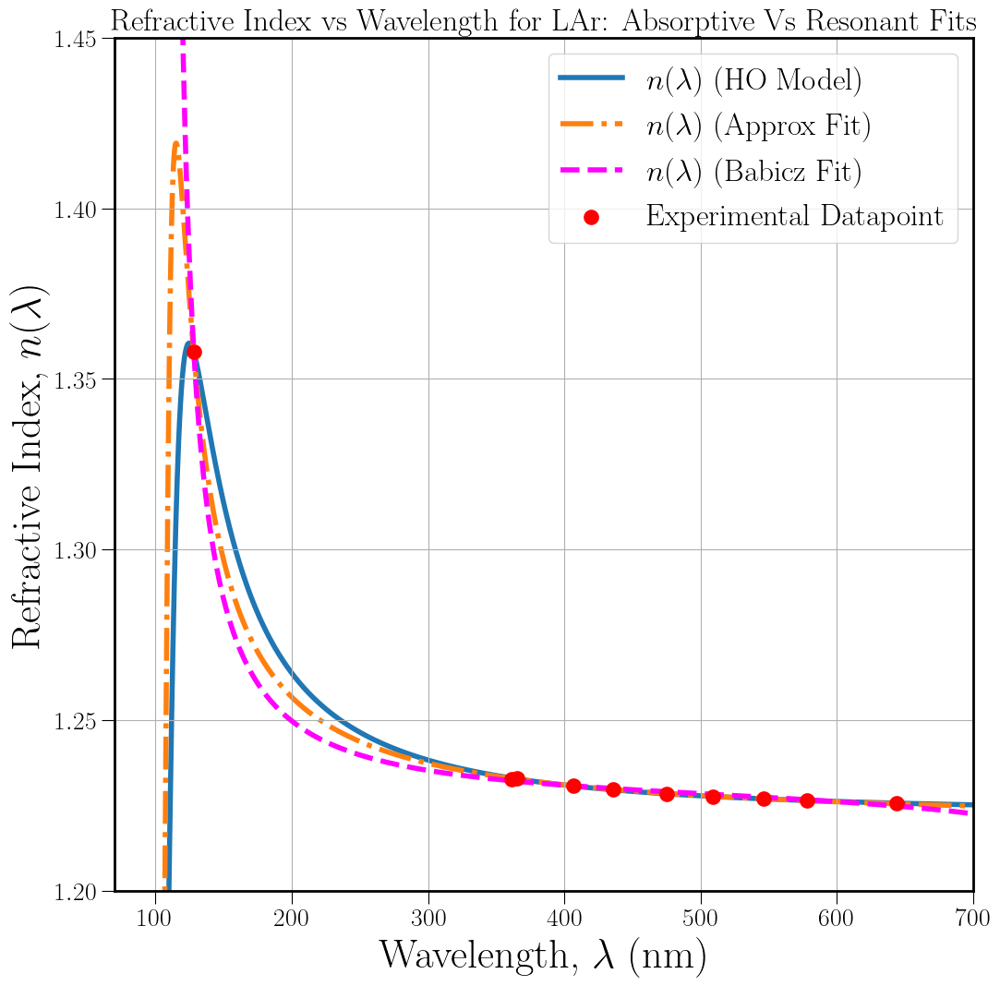

In [6]:
#Refractive index new fit: M. Sievert (Mathematica equivalent)
# initially
# a_0 = 1.189
# a_pvs = 0.00029
# tau = 0.0005

t=500 
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   

#Grace Params 
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Babicz Params
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008


#Approx Fit Params
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
tau = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd_peak = 115.11 #where n is max 

# lamdmin = 106.7 #UV-Resonant wavelength in nm 
# lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv

#absorption co-efficient, alpha 

sigma = (lamd_peak - lamd_uv)
mu = lamd_peak
abs_coeff = np.exp(-(lamd - lamd_peak)**2/(2*sigma**2))/(np.sqrt(2*np.pi*sigma**2))


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd = np.linspace(90,700,2000)   #wavelength of light 


#Formula: Absorptive Fits

n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + tau**2)))

n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


#Resonant Fits 

n2_grace = (a_0g + ((a_uvg * lamd ** 2) / (lamd**2-lamd_uv**2)))  + (a_irg*lamd**2/(lamd**2-lamd_ir**2))  #Refractive index squared #(ignoring the 3rd term) 
n_grace = np.sqrt(n2_grace)

n2_babicz = (1 + ((3 * (a_0b + (a_uvb*lamd**2/(lamd**2-lamd_uv**2)) + (a_irb*lamd**2/(lamd**2-lamd_ir**2)))/(3 - (a_0b + (a_uvb*lamd**2/(lamd**2-lamd_uv**2)) + (a_irb*lamd**2/(lamd**2-lamd_ir**2))))))) #(ignoring the IR term) 
n_babicz = np.sqrt(n2_babicz)
# func2 = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_babics(wl)))))


# # for index in lamd:

# func = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_grace(wl))))) #Integrand of Yield



# plt.plot(n_pvs)

#Plot of n vs lambda in the LAr medium.

x = np.array([643.9, 578.0, 546.1, 508.6, 475.3, 435.8, 406.3, 365.0, 361.2, 128.0]) #xdata: wavelength in nm 
y = np.array([1.2256, 1.2264, 1.2269, 1.2277, 1.2285, 1.2297, 1.2308, 1.2331, 1.2326, 1.358]) #ydata: refractive index 1.358+/-0.003

# plt.plot(x, y, 'ro')
# pyplot.scatter(x, y)
#Plot of n vs lambda in the LAr medium near Resonance  
fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

# TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# ax.set_title("Refractive Index vs Wavelength for LAr: HO Model Vs Approx Fit", fontsize=24)
ax.set_title("Refractive Index vs Wavelength for LAr:  Absorptive Vs Resonant Fits", fontsize=24)

ax.plot(lamd, n_jackson, linewidth = 4, label="$n$($\lambda$) (HO Model)", zorder=1) #HO fit
ax.plot(lamd, n_pvs, ls= 'dashdot', linewidth = 4, label="$n$($\lambda$) (Approx Fit)", zorder=1) #Approx fit

# ax.plot(lamd, n_grace, ls= 'dotted', linewidth = 4, label="$n$($\lambda$) (Grace Fit)", zorder=2) #Grace
ax.plot(lamd, n_babicz, ls= 'dashed', linewidth = 4, c='magenta', label="$n$($\lambda$) (Babicz Fit)", zorder=2) #Babicz

ax.scatter(x, y, color= 'r', linewidth= 6, label= "Experimental Datapoint", zorder=2) #'o', s= 5, color='b'

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Wavelength, $\\lambda$ (nm)",fontsize=32)
ax.set_ylabel('Refractive Index, $n(\\lambda)$',fontsize=32)
ax.grid()
ax.legend(fontsize=24)

# plt.ylim(0.85,1.45) #regular

plt.ylim(1.2,1.45) #zoom
plt.xlim(70, 700) #zoom

# plt.savefig("n_vs_lambda_hofit_full_withdatapoints.jpg", bbox_inches= 'tight') #Ctrl+/ to comment in or out 
# plt.savefig("n_vs_lambda_absfits_full_withdatapoints.jpg", bbox_inches= 'tight') #Ctrl+/ to comment in or out 
# plt.savefig("n_vs_lambda_allfits_full_withdatapoints_zoom.jpg", bbox_inches= 'tight') #Ctrl+/ to comment in or out 
# plt.savefig("n_vs_lambda_ho_approx_babicz_full_withdatapoints_zoom.jpg", bbox_inches= 'tight') #Ctrl+/ to comment in or out
# plt.savefig("n_vs_lambda_ho_approx_babicz_full_withdatapoints.jpg", bbox_inches= 'tight') #Ctrl+/ to comment in or out

n_uv = 1.10232, n_peak = 1.3605, n_500= 1.2278, n_asymtote = 1.222558964716


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\1219641938.py:74: RuntimeWarning: divide by zero encountered in reciprocal
  n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + tau**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\1219641938.py:74: RuntimeWarning: invalid value encountered in divide
  n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + tau**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\1219641938.py:76: RuntimeWarning: divide by zero encountered in power
  n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\1219641938.py:76: RuntimeWarning: invalid value encountered in divide
  n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
C:\Users\

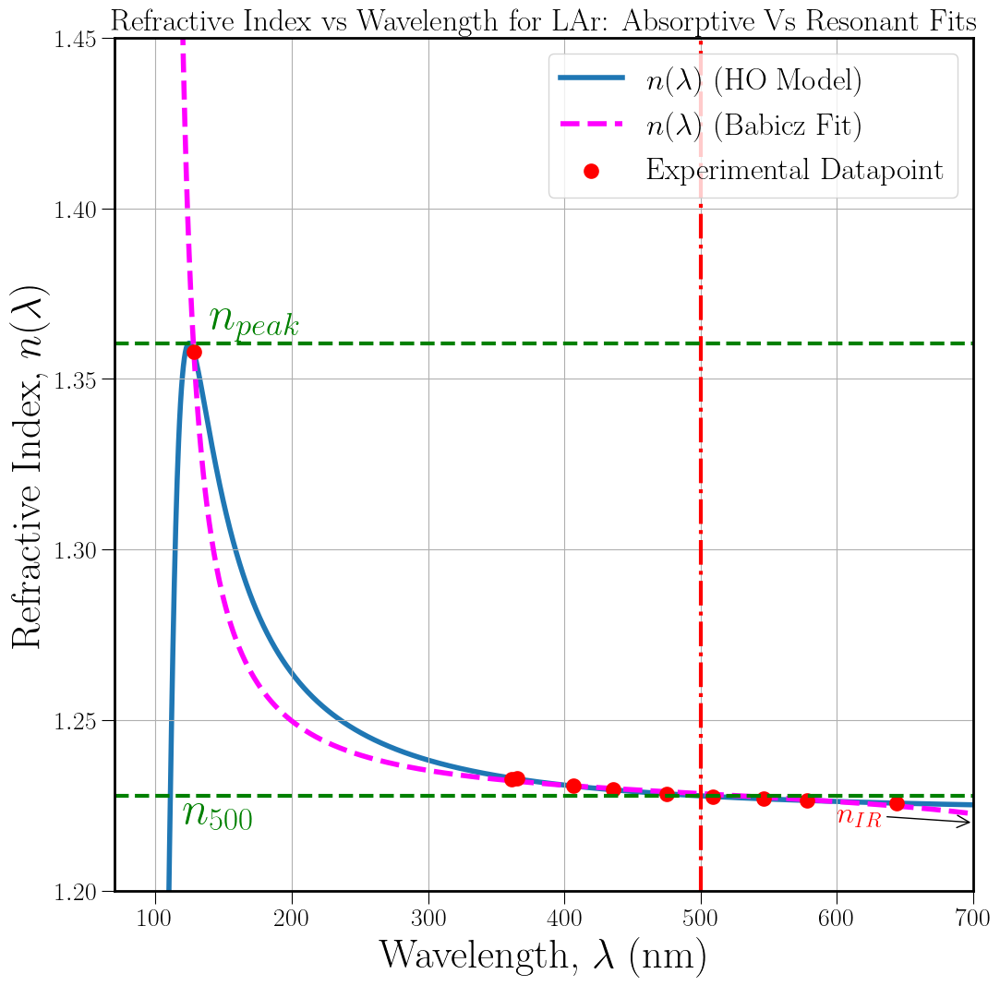

In [43]:
#Refractive index new fit: M. Sievert (Mathematica equivalent) Cartoon Plot
# initially
# a_0 = 1.189
# a_pvs = 0.00029
# tau = 0.0005

t=500 
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   

#Grace Params 
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Babicz Params
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008


#Approx Fit Params
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
tau = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd_peak = 115.11 #where n is max 


# lamdmin = 106.7 #UV-Resonant wavelength in nm 
# lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv



#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))



lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd = np.linspace(90,700,2000)   #wavelength of light 



#Formula: Absorptive Fits

n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + tau**2)))

n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


#absorption co-efficient, alpha (for Approx Fit)

sigma = (lamd_peak - lamd_uv)
mu = lamd_peak
abs_coeff = np.exp(-(lamd - lamd_peak)**2/(2*sigma**2))/(np.sqrt(2*np.pi*sigma**2))


#Resonant Fits 

n2_grace = (a_0g + ((a_uvg * lamd ** 2) / (lamd**2-lamd_uv**2)))  + (a_irg*lamd**2/(lamd**2-lamd_ir**2))  #Refractive index squared #(ignoring the 3rd term) 
n_grace = np.sqrt(n2_grace)

n2_babicz = (1 + ((3 * (a_0b + (a_uvb*lamd**2/(lamd**2-lamd_uv**2)) + (a_irb*lamd**2/(lamd**2-lamd_ir**2)))/(3 - (a_0b + (a_uvb*lamd**2/(lamd**2-lamd_uv**2)) + (a_irb*lamd**2/(lamd**2-lamd_ir**2))))))) #(ignoring the IR term) 
n_babicz = np.sqrt(n2_babicz)
# func2 = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_babics(wl)))))


# # for index in lamd:

# func = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_grace(wl))))) #Integrand of Yield



# plt.plot(n_pvs)

#Plot of n vs lambda in the LAr medium.

x = np.array([643.9, 578.0, 546.1, 508.6, 475.3, 435.8, 406.3, 365.0, 361.2, 128.0]) #xdata: wavelength in nm 
y = np.array([1.2256, 1.2264, 1.2269, 1.2277, 1.2285, 1.2297, 1.2308, 1.2331, 1.2326, 1.358]) #ydata: refractive index 1.358+/-0.003

# plt.plot(x, y, 'ro')
# pyplot.scatter(x, y)
#Plot of n vs lambda in the LAr medium near Resonance  
fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

# TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

# ax.set_title("Refractive Index vs Wavelength for LAr: HO Model Vs Approx Fit", fontsize=24)
ax.set_title("Refractive Index vs Wavelength for LAr:  Absorptive Vs Resonant Fits", fontsize=24)

ax.plot(lamd, n_jackson, linewidth = 4, label="$n$($\lambda$) (HO Model)", zorder=1) #HO fit
# ax.plot(lamd, n_pvs, ls= 'dashdot', linewidth = 4, label="$n$($\lambda$) (Approx Fit)", zorder=1) #Approx fit

# ax.plot(lamd, n_grace, ls= 'dotted', linewidth = 4, label="$n$($\lambda$) (Grace Fit)", zorder=2) #Grace
ax.plot(lamd, n_babicz, ls= 'dashed', linewidth = 4, c='magenta', label="$n$($\lambda$) (Babicz Fit)", zorder=2) #Babicz

ax.scatter(x, y, color= 'r', linewidth= 6, label= "Experimental Datapoint", zorder=2) #'o', s= 5, color='b'

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

plt.axvline(500, ls='dashdot',c='r',lw=3) #lamdmax

plt.axhline(n_peakr, ls='--',c='g',lw=3) #lamdmin

plt.axhline(n_500, ls='--',c='g',lw=3) #lamdmin


# Add simple text using plt.text()
plt.text(140, 1.365, '$n_{peak}$', fontsize=36, color='green')

plt.text(120, 1.22, '$n_{500}$', fontsize=36, color='green')


# Add an annotation with an arrow using plt.annotate()
plt.annotate('$n_{IR}$', xy=(700, 1.22), xytext=(600, 1.22), weight='bold',
             arrowprops=dict(facecolor='red', arrowstyle='->'), color='r')


# plt.annotate('small counties; most vote for McCain', xy=(50000, 20), weight='bold',
#              xytext=(150000, 7), fontsize=10, arrowprops=dict(arrowstyle="->", color='r'))



ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Wavelength, $\\lambda$ (nm)",fontsize=32)
ax.set_ylabel('Refractive Index, $n(\\lambda)$',fontsize=32)
ax.grid()
ax.legend(fontsize=24)



# plt.ylim(0.85,1.45) #regular

plt.ylim(1.2,1.45) #zoom
plt.xlim(70, 700) #zoom

# plt.savefig("n_vs_lambda_hofit_full_withdatapoints.jpg", bbox_inches= 'tight') #Ctrl+/ to comment in or out 
# plt.savefig("Refractive_Index_Annotated_Draft_Hasan.png", bbox_inches= 'tight') #Ctrl+/ to comment in or out


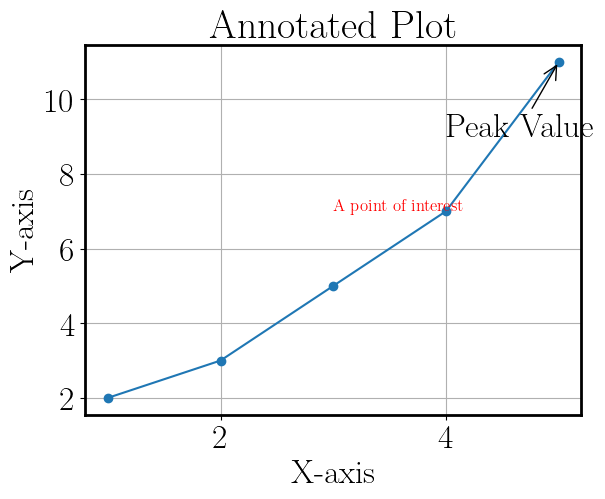

In [23]:
import matplotlib.pyplot as plt

x = [1, 2, 3, 4, 5]
y = [2, 3, 5, 7, 11]

plt.plot(x, y, marker='o')

# Add simple text using plt.text()
plt.text(3, 7, 'A point of interest', fontsize=12, color='red')

# Add an annotation with an arrow using plt.annotate()
plt.annotate('Peak Value', xy=(5, 11), xytext=(4, 9),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.title('Annotated Plot')
plt.grid(True)
plt.show()


Numerical Method: Wavelength_min = 124.48224112056027 nm, Wavelength_max = 124.78739369684843 nm


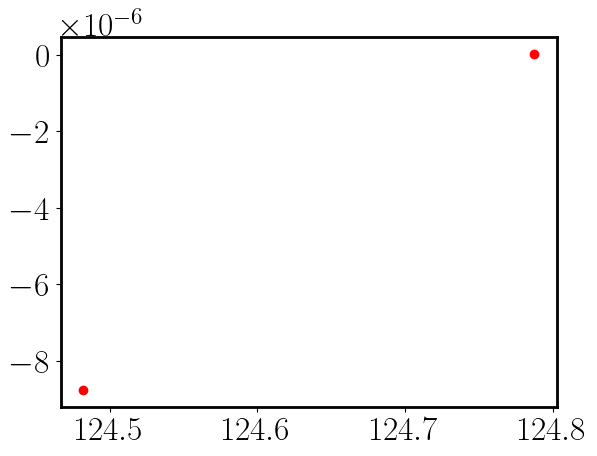

Wavelength_min = 124.48224112056027 nm, Wavelength_max = 124.78739369684843 nm


0.7350228759864278

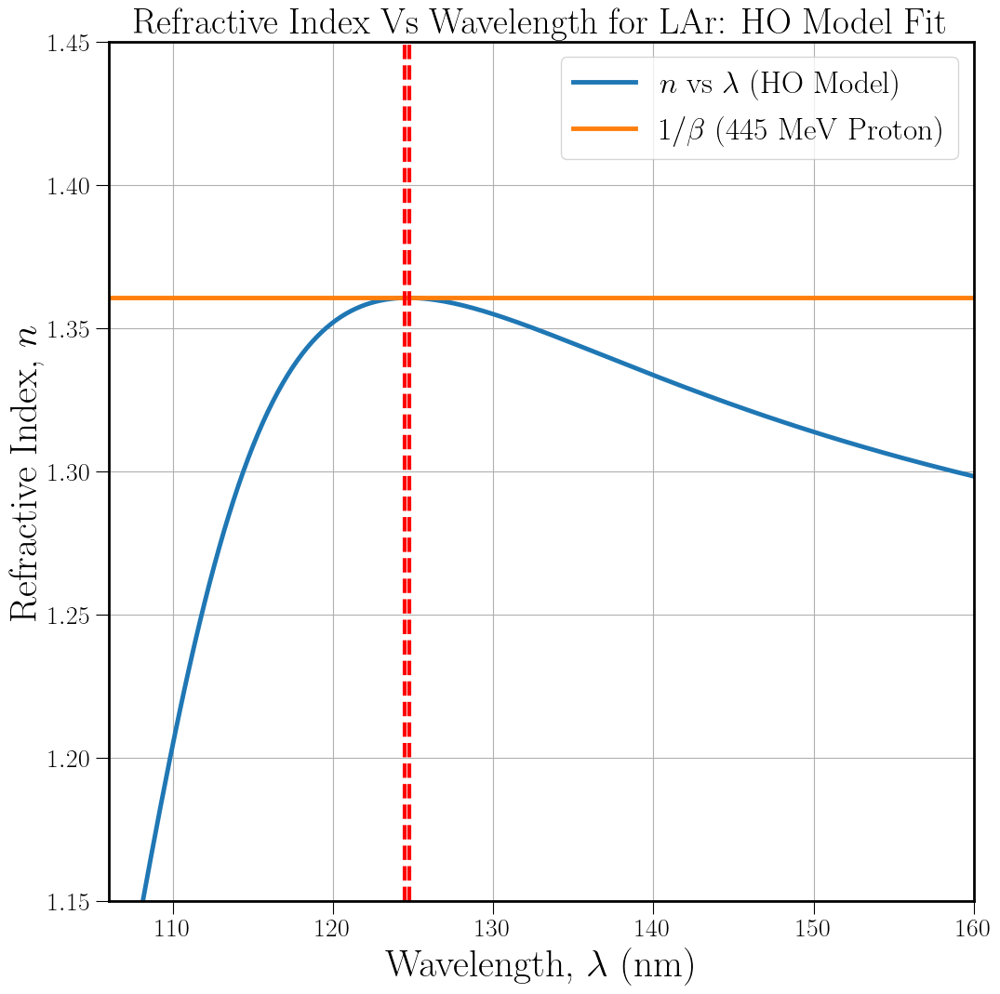

In [34]:
t = 445.3945 #K.E of Proton  in MeV
# t = 450
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   


# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd = np.linspace(90,700,2000)   #wavelength of light 


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + (lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2))))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + (lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2))))

# print("Algebraic Method (on Paper): Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))

# lammin = (-2*lamd_uv + 2*a_0*beta*lamd_uv + a_pvs*beta*lamd_uv**2 + np.sqrt(a_pvs**2*beta**2*lamd_uv**4 - 4*gamma**2*lamd_uv**4 + 8*a_0*beta*gamma**2*lamd_uv**4 - 4*a_0**2*beta**2*gamma**2*lamd_uv**4)) / (2*(-1+a_0*beta + a_pvs*beta*lamd_uv- gamma**2*lamd_uv**2 + a_0*beta*gamma**2*lamd_uv**2))
# lammax = (-2*lamd_uv + 2*a_0*beta*lamd_uv + a_pvs*beta*lamd_uv**2 - np.sqrt(a_pvs**2*beta**2*lamd_uv**4 - 4*gamma**2*lamd_uv**4 + 8*a_0*beta*gamma**2*lamd_uv**4 - 4*a_0**2*beta**2*gamma**2*lamd_uv**4)) / (2*(-1+a_0*beta + a_pvs*beta*lamd_uv- gamma**2*lamd_uv**2 + a_0*beta*gamma**2*lamd_uv**2))
# print("Algebraic Method (Mathematica): Wavelength_min = {} nm, Wavelength_max = {} nm".format(lammin, lammax))


#Formula: 
n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))
n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


func = n_jackson - y

idx = np.argwhere(np.diff(np.sign(func))).flatten()
print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

plt.plot(lamd[idx], func[idx], 'ro')
plt.show()
print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title("Refractive Index Vs Wavelength for LAr: HO Model Fit", fontsize=28)
ax.plot(lamd, n_jackson, linewidth = 3.5, label="$n$ vs $\lambda$ (HO Model)")
ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$ (445 MeV Proton)")
ax.fill_between(lamd, n_jackson, y, where= n_jackson >= y, alpha=0.5)


# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
ax.set_ylabel('Refractive Index, $n$',fontsize=30)
ax.grid()
ax.legend(fontsize=24)

# lamdmin = 106.6 #UV-Resonant wavelength in nm 
# lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv

# plt.axvline(lamdmax, ls='--',c='r',lw=3) #lamdmax
# plt.axvline(lamdmin, ls='--',c='r',lw=3) #lamdmin

plt.axvline(lamd[idx[0]], ls='--',c='r',lw=3) #lamdmax
plt.axvline(lamd[idx[1]], ls='--',c='r',lw=3) #lamdmin

# print("K.E(T) = {} MeV, beta = {:.2f}, wavelength_min = {} nm,  wavelength_max = {:.1f} nm, n = {:.2f}".format(t,beta,lamdmin,lamdmax,n_pvs[index]))
# print("wavelength = {:.1f} nm, n^2 = {}".format(wavelength,n2_babics[index]))

plt.ylim([1.15, 1.45])
plt.xlim([106,160])
# plt.savefig("n_vs_lambda_near_resonance_hofit_P445MeV.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

beta

Numerical Method: Wavelength_min = 110.44522261130565 nm, Wavelength_max = 500 nm


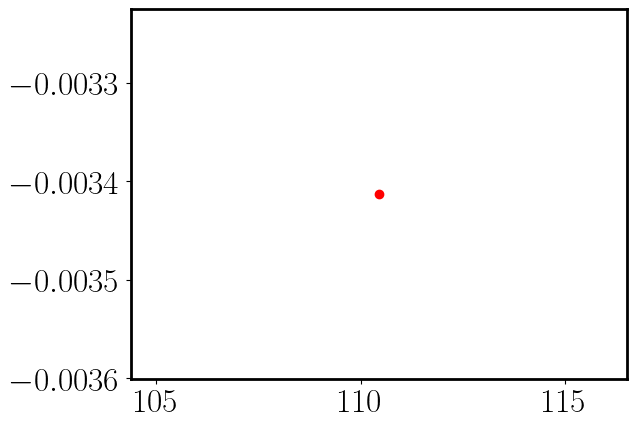

Wavelength_min = 110.44522261130565 nm, Wavelength_max = 500 nm


0.8198002603953367

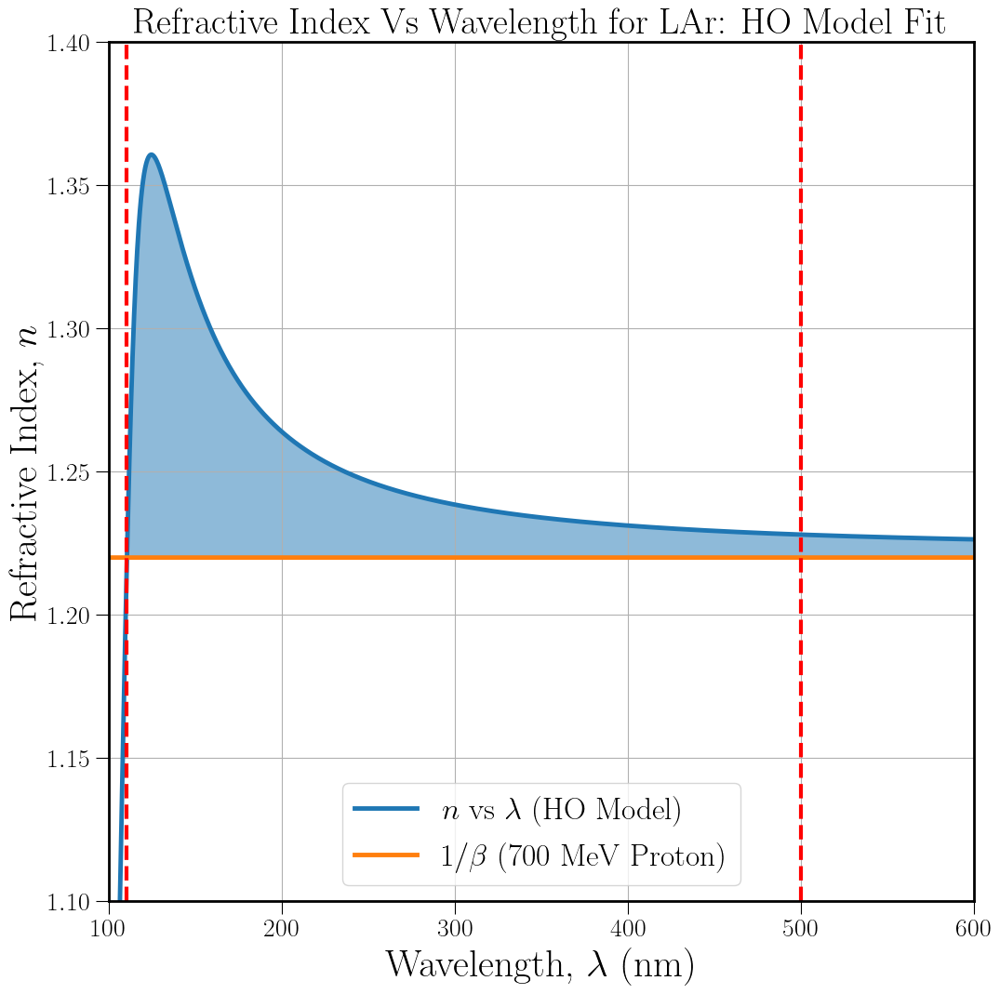

In [35]:
t = 700 #K.E of Proton  in MeV
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 


# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + (lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2))))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + (lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2))))

# print("Algebraic Method (on Paper): Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))

# lammin = (-2*lamd_uv + 2*a_0*beta*lamd_uv + a_pvs*beta*lamd_uv**2 + np.sqrt(a_pvs**2*beta**2*lamd_uv**4 - 4*gamma**2*lamd_uv**4 + 8*a_0*beta*gamma**2*lamd_uv**4 - 4*a_0**2*beta**2*gamma**2*lamd_uv**4)) / (2*(-1+a_0*beta + a_pvs*beta*lamd_uv- gamma**2*lamd_uv**2 + a_0*beta*gamma**2*lamd_uv**2))
# lammax = (-2*lamd_uv + 2*a_0*beta*lamd_uv + a_pvs*beta*lamd_uv**2 - np.sqrt(a_pvs**2*beta**2*lamd_uv**4 - 4*gamma**2*lamd_uv**4 + 8*a_0*beta*gamma**2*lamd_uv**4 - 4*a_0**2*beta**2*gamma**2*lamd_uv**4)) / (2*(-1+a_0*beta + a_pvs*beta*lamd_uv- gamma**2*lamd_uv**2 + a_0*beta*gamma**2*lamd_uv**2))
# print("Algebraic Method (Mathematica): Wavelength_min = {} nm, Wavelength_max = {} nm".format(lammin, lammax))


#Formula: 
n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))
n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


func = n_jackson - y

idx = np.argwhere(np.diff(np.sign(func))).flatten()
print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], 500))

plt.plot(lamd[idx], func[idx], 'ro')
plt.show()
# print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))
print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], 500))


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title("Refractive Index Vs Wavelength for LAr: HO Model Fit", fontsize=28)
ax.plot(lamd, n_jackson, linewidth = 3.5, label="$n$ vs $\lambda$ (HO Model)")
ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$ (700 MeV Proton)")
ax.fill_between(lamd, n_jackson, y, where= n_jackson >= y, alpha=0.5)


# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
ax.set_ylabel('Refractive Index, $n$',fontsize=30)
ax.grid()
ax.legend(fontsize=24, loc='lower center')

# lamdmin = 106.6 #UV-Resonant wavelength in nm 
# lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv

# plt.axvline(lamdmax, ls='--',c='r',lw=3) #lamdmax
# plt.axvline(lamdmin, ls='--',c='r',lw=3) #lamdmin

plt.axvline(lamd[idx[0]], ls='--',c='r',lw=3) #lamdmin
plt.axvline(500, ls='--',c='r',lw=3) #lamdmax
# plt.axvline(lamd[idx[2]], ls='--',c='r',lw=3) #lamdmin

# print("K.E(T) = {} MeV, beta = {:.2f}, wavelength_min = {} nm,  wavelength_max = {:.1f} nm, n = {:.2f}".format(t,beta,lamdmin,lamdmax,n_pvs[index]))
# print("wavelength = {:.1f} nm, n^2 = {}".format(wavelength,n2_babics[index]))

plt.ylim([1.1, 1.4])
plt.xlim([100,600])
# plt.savefig("n_vs_lambda_near_resonance_hofit_P700MeV.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

beta

Numerical Method: Wavelength_min = 115.6328164082041 nm, Wavelength_max = 146.7583791895948 nm


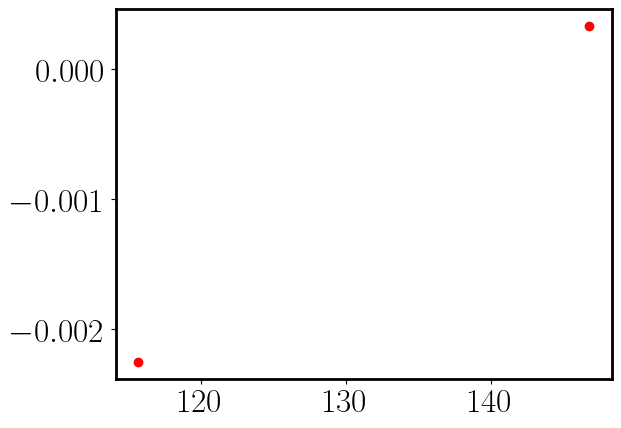

Wavelength_min = 115.6328164082041 nm, Wavelength_max = 146.7583791895948 nm


0.7579653181328908

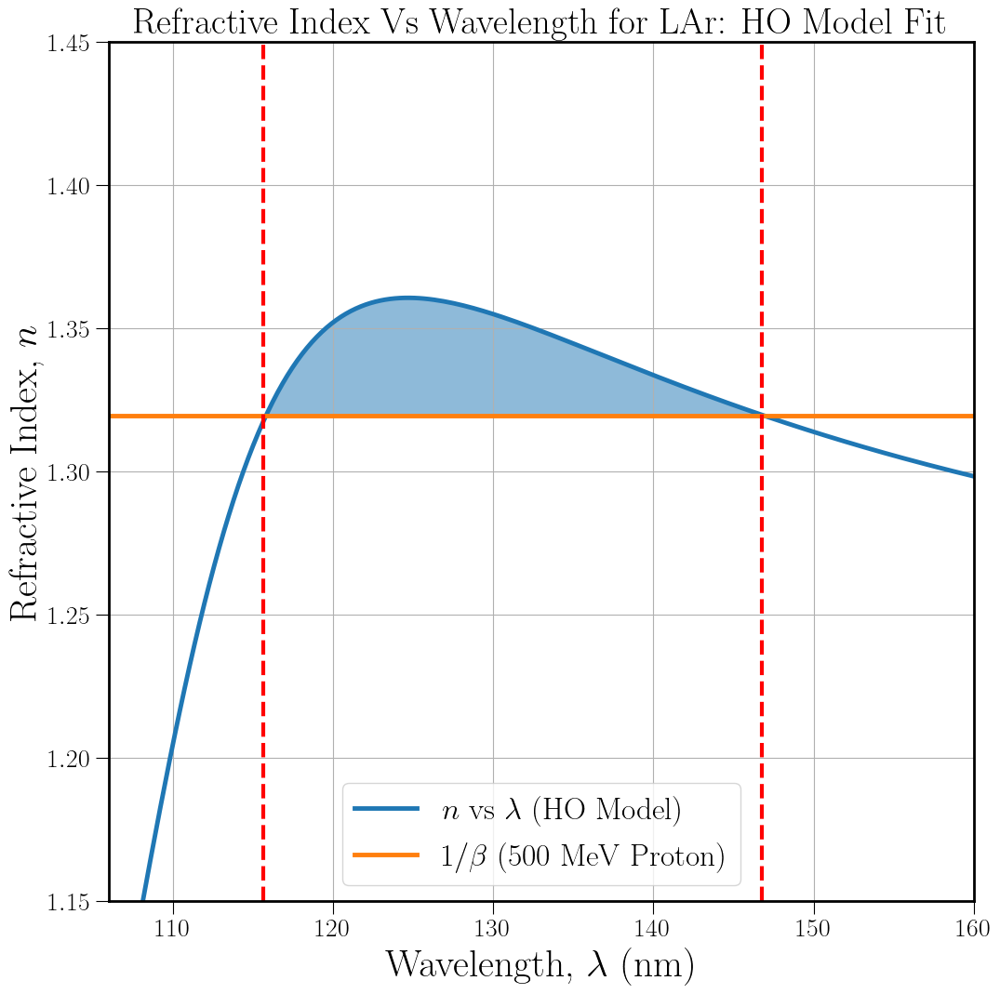

In [37]:
t = 500 #K.E of Proton  in MeV
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 


# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + (lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2))))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + (lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2))))

# print("Algebraic Method (on Paper): Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))

# lammin = (-2*lamd_uv + 2*a_0*beta*lamd_uv + a_pvs*beta*lamd_uv**2 + np.sqrt(a_pvs**2*beta**2*lamd_uv**4 - 4*gamma**2*lamd_uv**4 + 8*a_0*beta*gamma**2*lamd_uv**4 - 4*a_0**2*beta**2*gamma**2*lamd_uv**4)) / (2*(-1+a_0*beta + a_pvs*beta*lamd_uv- gamma**2*lamd_uv**2 + a_0*beta*gamma**2*lamd_uv**2))
# lammax = (-2*lamd_uv + 2*a_0*beta*lamd_uv + a_pvs*beta*lamd_uv**2 - np.sqrt(a_pvs**2*beta**2*lamd_uv**4 - 4*gamma**2*lamd_uv**4 + 8*a_0*beta*gamma**2*lamd_uv**4 - 4*a_0**2*beta**2*gamma**2*lamd_uv**4)) / (2*(-1+a_0*beta + a_pvs*beta*lamd_uv- gamma**2*lamd_uv**2 + a_0*beta*gamma**2*lamd_uv**2))
# print("Algebraic Method (Mathematica): Wavelength_min = {} nm, Wavelength_max = {} nm".format(lammin, lammax))


#Formula: 
n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))
n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


func = n_jackson - y

idx = np.argwhere(np.diff(np.sign(func))).flatten()
print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

plt.plot(lamd[idx], func[idx], 'ro')
plt.show()
print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title("Refractive Index Vs Wavelength for LAr: HO Model Fit", fontsize=28)
ax.plot(lamd, n_jackson, linewidth = 3.5, label="$n$ vs $\lambda$ (HO Model)")
ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$ (500 MeV Proton)")
ax.fill_between(lamd, n_jackson, y, where= n_jackson >= y, alpha=0.5)


# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
ax.set_ylabel('Refractive Index, $n$',fontsize=30)
ax.grid()
ax.legend(fontsize=24)

# lamdmin = 106.6 #UV-Resonant wavelength in nm 
# lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv

# plt.axvline(lamdmax, ls='--',c='r',lw=3) #lamdmax
# plt.axvline(lamdmin, ls='--',c='r',lw=3) #lamdmin

plt.axvline(lamd[idx[0]], ls='--',c='r',lw=3) #lamdmax
plt.axvline(lamd[idx[1]], ls='--',c='r',lw=3) #lamdmin

# print("K.E(T) = {} MeV, beta = {:.2f}, wavelength_min = {} nm,  wavelength_max = {:.1f} nm, n = {:.2f}".format(t,beta,lamdmin,lamdmax,n_pvs[index]))
# print("wavelength = {:.1f} nm, n^2 = {}".format(wavelength,n2_babics[index]))

plt.ylim([1.15, 1.45])
plt.xlim([106,160])
# plt.savefig("n_vs_lambda_near_resonance_hofit_P500MeVzoom.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

beta
# n_jackson(124.68)

[106.        106.0060015 106.012003  ... 129.987997  129.9939985
 130.       ] [ 0.03082522  0.03083023  0.03083521 ... -0.00178366 -0.00178467
 -0.00178567]
Wavelength corrsponding to the max refractive index value = 124.68267066766691 nm
Max refractive index value = 1.3605048701261044


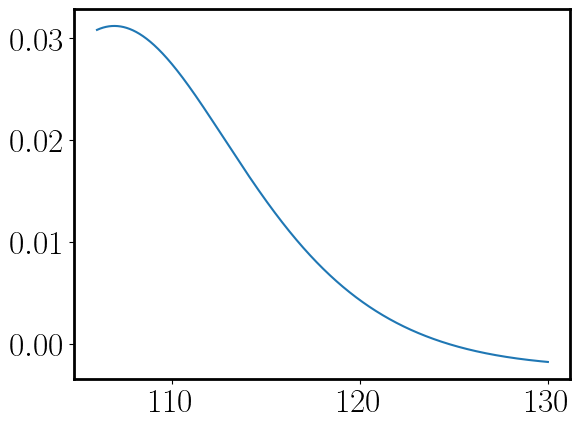

In [39]:
# from sympy import exp, Symbol, nsolve

#Finding the lowest K.E of Proton that emits Cerenkov radiation from the asymtotic behaviour of the refractive index 
#(finding the peak of n by setting it's first derivative to zero)

# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamd = np.linspace(106,130,4000)   #wavelength of light 
# lamd = np.linspace(90,700,2000)   #wavelength of light 


#Formula: 
# n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))
n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


#Symmetric derivative formula
def fun(lamd):
    return a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2))))

def d_fun(lamd):
    h = 1e-5
    return (fun(lamd+h)-fun(lamd-h))/(2*h)

plt.plot(lamd,d_fun(lamd))
print(lamd, d_fun(lamd))
list_c = [[x, y] for x, y in zip(lamd, d_fun(lamd))]
                                 

idx = np.argwhere(np.diff(np.sign(d_fun(lamd)))).flatten()
print("Wavelength corrsponding to the max refractive index value = {} nm".format(lamd[idx[0]]))
# print(d_fun(115.00750375187594), fun(115.00750375187594))

print("Max refractive index value = {}".format(fun(124.683)))


# sp.solve(d_fun(lamd), lamd)
# fsolve(d_fun,lamd)
# sp.solve(d_fun,lamd)

# d_fun(lamd) == 0
# sp.solve(d_fun,lamd)
# y = nsolve(d_fun)
# y
# d_fun(115.111), fun(115.111), 1/fun(115.111)

[ 90.          90.30515258  90.61030515 ... 699.38969485 699.69484742
 700.        ] [-4.84194683e-03 -4.67839282e-03 -4.49770294e-03 ... -7.70995490e-06
 -7.69959652e-06 -7.68926034e-06]
Wavelength corrsponding to the max refractive index value = 94.57728864432217 nm


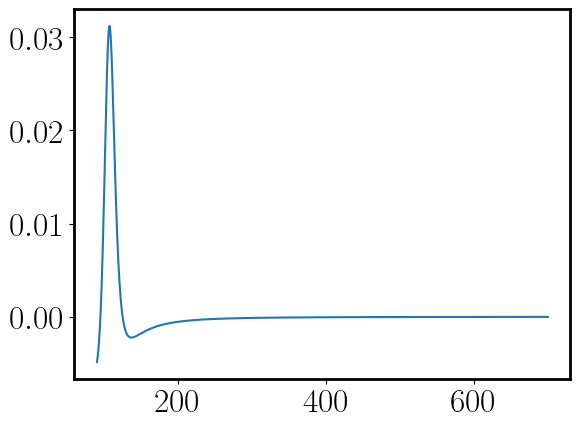

In [42]:
# from sympy import exp, Symbol, nsolve

#Finding the lowest K.E of Proton that emits Cerenkov radiation from the asymtotic behaviour of the refractive index 
#(finding the peak of n by setting it's first derivative to zero)
lamd = np.linspace(90,700,2000)

# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# lamd = np.linspace(106,130,4000)   #wavelength of light 
# lamd = np.linspace(100,700,2000)   #wavelength of light 


#Formula: 
# n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))
n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


#Symmetric derivative formula
def fun(lamd):
    return a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2))))

def d_fun(lamd):
    h = 1e-5
    return (fun(lamd+h)-fun(lamd-h))/(2*h)

plt.plot(lamd,d_fun(lamd))
print(lamd, d_fun(lamd))
list_c = [[x, y] for x, y in zip(lamd, d_fun(lamd))]
                                 

idx = np.argwhere(np.diff(np.sign(d_fun(lamd)))).flatten()
print("Wavelength corrsponding to the max refractive index value = {} nm".format(lamd[idx[0]]))
# print(d_fun(115.00750375187594), fun(115.00750375187594))

# sp.solve(d_fun(lamd), lamd)
# fsolve(d_fun,lamd)
# sp.solve(d_fun,lamd)

# d_fun(lamd) == 0
# sp.solve(d_fun,lamd)
# y = nsolve(d_fun)
# y
# d_fun(115.111), fun(115.111), 1/fun(115.111)

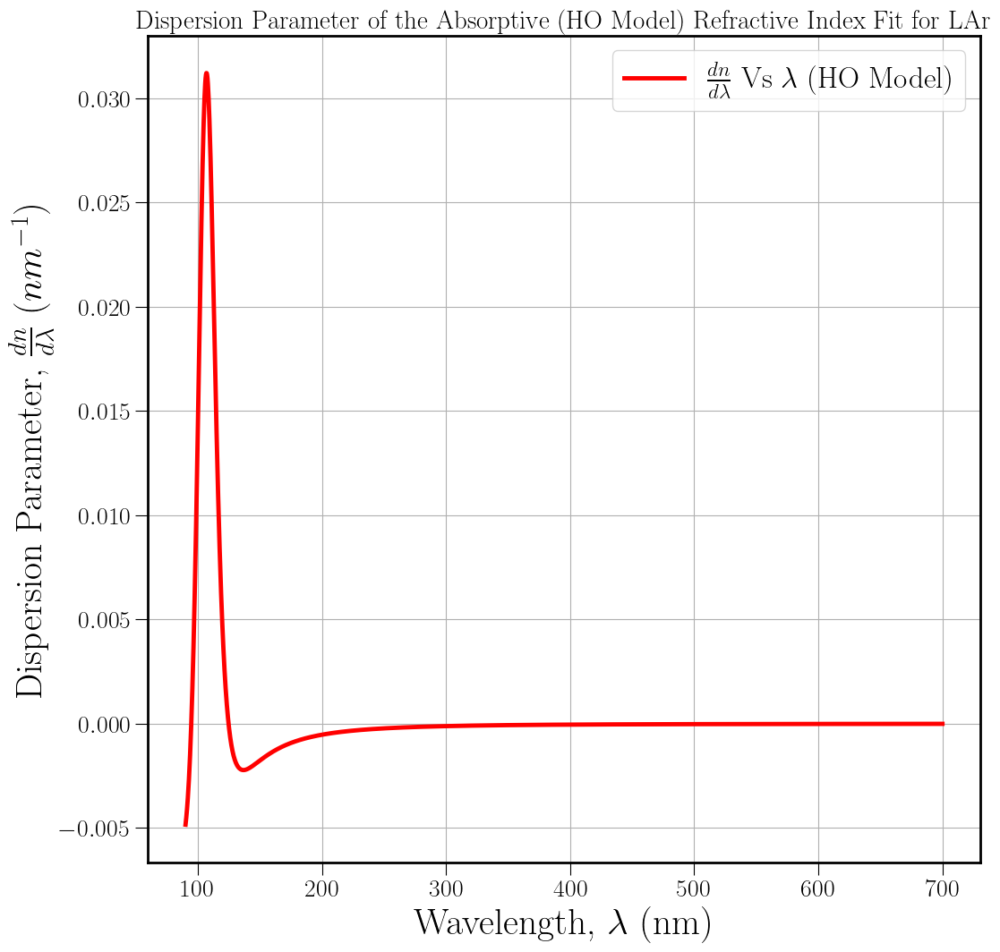

In [44]:
# plt.plot(lamd,d_fun(lamd))


t = 383.962 #K.E of Proton  in MeV
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 
lamd = np.linspace(90,700,2000)

# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title("Dispersion Parameter of the Absorptive (HO Model) Refractive Index Fit for LAr", fontsize=21)
ax.plot(lamd, d_fun(lamd), linewidth = 3.5, c = 'r', label="$\\frac{dn}{d\\lambda}$ Vs $\\lambda$ (HO Model)")
# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta $ (383.96 MeV)")

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
ax.set_ylabel('Dispersion Parameter, $\\frac{dn}{d\\lambda}$ $(nm^{-1})$',fontsize=30)
ax.grid()
ax.legend(fontsize=24)

# lamdmin = 106.6 #UV-Resonant wavelength in nm 
# lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv
# plt.axvline(lamdmax, ls='--',c='r',lw=3) #lamdmax
# plt.axvline(lamdmin, ls='--',c='r',lw=3) #lamdmin


# print("K.E(T) = {} MeV, beta = {:.2f}, wavelength_min = {} nm,  wavelength_max = {:.1f} nm, n = {:.2f}".format(t,beta,lamdmin,lamdmax,n_pvs[index]))
# print("wavelength = {:.1f} nm, n^2 = {}".format(wavelength,n2_babics[index]))

# plt.ylim([1.15, 1.75])
# plt.xlim([90,106])

# plt.savefig("derivative_n_jackson_vs_lambda.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

# beta

# Betalist and Range (Insert)

In [88]:
#Betalist

rho = 1.38 #density of LAr in kg/m^3 at 89K temperature  
me = 9.11e-31 #Electron's mass in Kg.
io = 23.6e-6  #Average Ionization Potential of LAr in MeV
k =  0.307  #Constant in MeV.cm^2/g 
zb = 18  #Atomic No of Ar (absorber)
a = 39.948  #Mass no of Ar (absorber)
zs = 1 #charge of the particle 
c = 3e8
e = me*c**2/1.602e-13 #m(e)c^2 in MeV (1 MeV = 1.602e-13 J) #Electron's mass in MeV (the hit particle)
mp = 938 #Proton's mass in MeV/c^2 
k1 = k*rho*zb*zs**2/a
k2 = 2*e/io 

# lamd = np.linspace(100,200,925)   #wavelength of light 

#Defining a function to calculate the betalist for some given initial K.E of Proton in LAr

def make_betalist(t):
    ''' t = t_list input from data'''
    
    
    xlist = []
    tlist = [] 
    tslope = []
    betalist = []

    
    x = 0 #in cm 
    dx = 0.1 #in cm 
    
    
    while t>0: 
        
        beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
        t_slope = (((k1*np.log(k2*(beta**2/(1-beta**2))))/beta**2) - k1)
        t = t - (t_slope * dx)
        tslope.append(t_slope)
        tlist.append(t)
        betalist.append(beta)

        x=x+dx    
        xlist.append(x)
    
         
    #Linear Interpolation: 

    if (len(tlist)>1)  and (len(xlist)>1):
    
        tnp1 = tlist[-1]
        tnp2 = tlist[-2]
        xnp1 = xlist[-1]
        xnp2 = xlist[-2]
        
        range = xnp2 - (tnp2 * ((xnp1-xnp2)/(tnp1 - tnp2))) #Relativistic approach 

#         print("K.E: {} MeV, Range (Rel approach): {:.3f} cm, betalist: {}".format(tlist,range,betalist, sep='\n')
#         print((tlist1,tslope1) , (tlist2, tslope2))
               
        return betalist  #range
#         return betalist

# t = np.array([1,10,20,50,100,200,250,300,400,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV
# print(t, range, betalist, sep='\n')
beta_500 = make_betalist(500)
np.shape(beta_500), np.shape(n_pvs)
# beta_500
# beta_20 = make_betalist(20)

((925,), ())

# Instantaneous Yield (HO, Approx, Babicz, Grace)

In [46]:
from sympy import *

t = 600 #K.E of Proton  in MeV
# t = 445
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
z = 1/beta
print("beta = {}, 1/beta= {}".format(beta,z))


a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


# x, y = symbols('x y')

# n_jackson = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# func = n_jackson - (1/beta)

y = a_0j + (a_j * ((lamd_uv**(-2) - x**(-2)) / ((lamd_uv**(-2) - x**(-2))**2 + gamma_j**2 * x**(-2)))) - z  #HO Model: Resonance

wls = solve(y)

print("Wavelength Solutions = {} nm".format(wls))


beta = 0.7924914946784183, 1/beta= 1.2618431954349059
Wavelength Solutions = [] nm


In [48]:
from sympy import *

x, y = symbols('x y') 

y=(x**2-2)/3*x

# solve the expression y (by default set equal to 0)
result = solve(y)

print(result)

[0, -sqrt(2), sqrt(2)]


n_uvr = 1.102, n_500 = 1.2278
Numerical Method: Wavelength_min = 115.6328164082041 nm, Wavelength_max = 147.06353176588294 nm


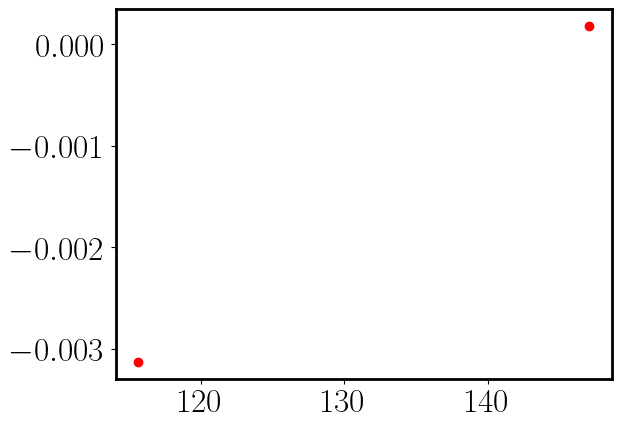

Wavelength_min = 115.6328164082041 nm, Wavelength_max = 147.06353176588294 nm
10.0 0.14486467848188067 124.68 124.68
100.0 0.4282487624449493 124.68 124.68
150.0 0.5066831416300631 124.68 124.68
200.0 0.5662215709520919 124.68 124.68
250.0 0.6136704253108138 124.68 124.68
300.0 0.6526335986017499 124.68 124.68
383.96 0.7046525912295857 124.68 124.68
400.0 0.7131157214873879 124.68 124.68
450.0 0.7370919123190173 121.1255627813907 129.05952976488243
500.0 0.7579653181328908 115.6328164082041 147.06353176588294
550.0 0.7762896784169824 113.49674837418709 168.42421210605303
600.0 0.7924914946784183 112.27613806903452 204.12706353176588
650.0 0.806905830051608 111.36068034017009 293.23161580790395
697.678 0.8192318094656588 110.44522261130565 500
700.0 0.8198002603953367 110.44522261130565 500
750.0 0.831391443029346 109.83491745872936 500
800.0 0.8418569002610763 109.22461230615308 500
850.0 0.8513435972356456 108.91945972986494 500
900.0 0.8599743115768982 108.61430715357679 500
950.0 0.

(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.8757509912383903,
  31.64549460678436,
  80.10655627905936,
  139.99553214819292,
  211.64027226824362,
  294.82047113507656,
  298.8968867889818,
  380.33287936928093,
  451.4942588205939,
  514.2439266076714,
  569.8305617262337,
  619.3001607561889,
  663.7123206708817,
  703.6892491461556,
  739.9608971729218,
  802.699517171638,
  855.2305922307048,
  899.4406049332285,
  937.0614971514253,
  969.3849184639879,
  1062.3329753356147,
  1131.1059208559873,
  1173.2677105320806])

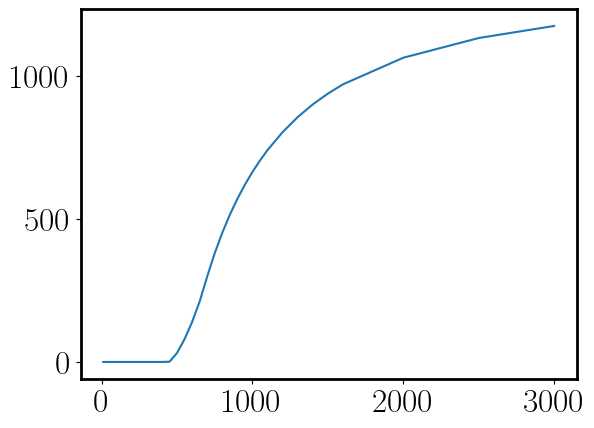

In [50]:
#Instantaneous Yield (HO Model fit)
from scipy.integrate import quad

# t = 500 #K.E of Proton  in MeV
# t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

t = 500 #K.E of Proton  in MeV
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd = np.linspace(90,700,2000)   #wavelength of light 

lamd_uv = 106.67 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak

n_asymtoter = a_0j + a_j * lamd_uv**2
n_500 = 1.2278
n_uvr = 1.102
print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))



#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


funclamd = n_jacksonr - y

idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

plt.plot(lamd[idx], funclamd[idx], 'ro')
plt.show()
print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

n_jackson = lambda lamd: a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

func = lambda lamd,b: ((2 * np.pi * alpha) / (lamd**2 )) * (1- (1/(b**2 * n_jackson(lamd)*n_jackson(lamd))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

cerenkovnolist = []

# t= np.array([400,500,700])
# t = np.array([450,500,550,600]) # ,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000


cerenkovfinallist = []
cerenkovtsum500inst = []

lamdmin = []
lamdmax = []

for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
        
    i  = np.sqrt(1 - (1/(1 + j/mp)**2)) #Relativistic Approach 

    y= 1/i
    y = np.linspace(y,y,2000)   #wavelength of light 
    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    funclamd = n_jacksonr - y
    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print(lamd[idx])
    
    if 1/i > n_peakr:
        lmin = lamd_peakr
        lmax = lamd_peakr
            
    if n_500 < 1/i < n_peakr:   
        lmin = lamd[min(idx)]
        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
    if n_uvr < 1/i <= n_500:
        lmin = max(lamd[min(idx)], 106.67)
        lmax = 500
            
    print(j, i, lmin, lmax)
        
    no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(no_cerenkov_x[0])
    cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err    
    cerenkovsum = np.nansum(no_cerenkov_x[0])  *  1e7 
    
    lamdmin.append(lmin)
    lamdmax.append(lmax)
        
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsum500inst.append(cerenkovsum) #conversion factor to standard units
    
    
# ax.grid()

# plt.plot(t, lamdmin)
# plt.plot(t, lamdmax)

list3 = list(map(list, list(zip(t, cerenkovtsum500inst))))
print(list3)

plt.plot(t, cerenkovtsum500inst)
t, cerenkovtsum500inst

    
# no_cerenkov_x
# n2_grace(100)
# make_betalist(500), 

# plt.plot(cerenkovnolist)
# cerenkovsum * 1e6
# lamdmax



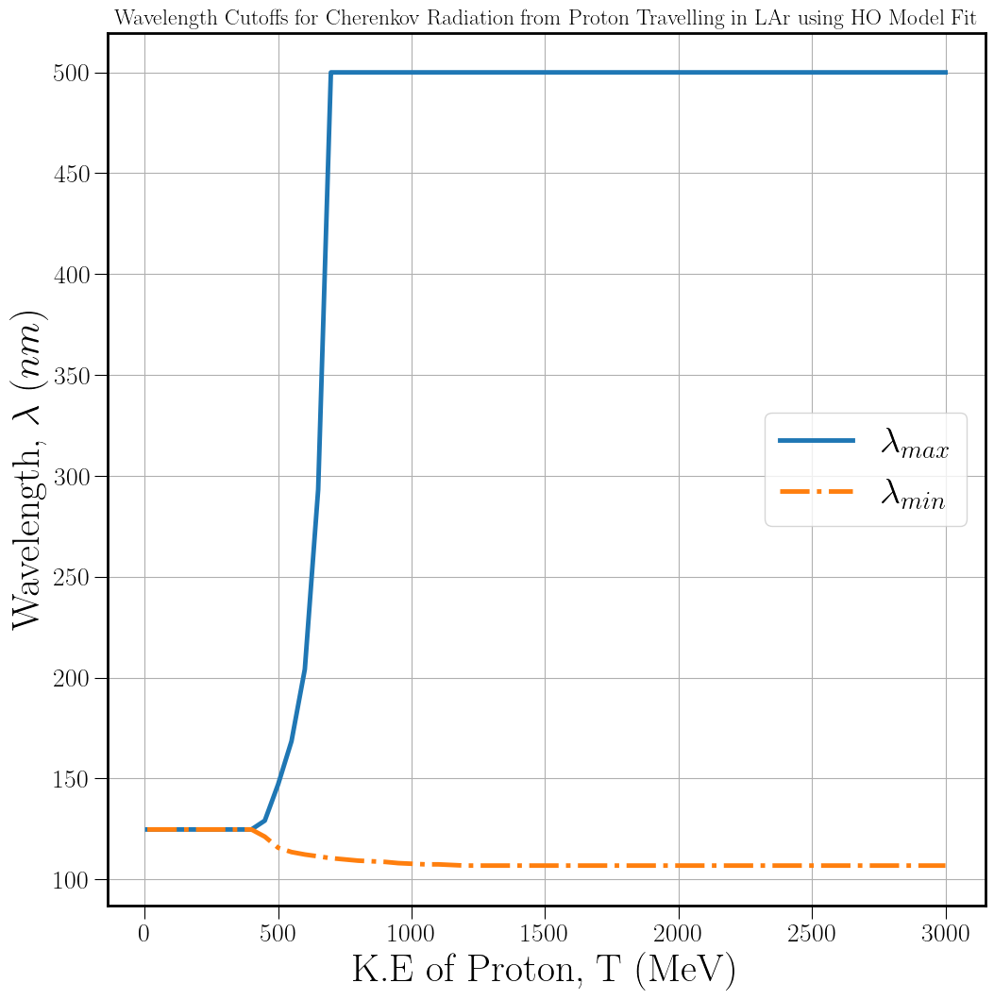

In [52]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Wavelength Cutoffs for Cherenkov Radiation from Proton Travelling in LAr using HO Model Fit", fontsize=17)

ax.plot(t, lamdmax, linewidth = 3.5, label= '$\\lambda_{max}$')
ax.plot(t, lamdmin, ls= 'dashdot', linewidth = 3.5, label= '$\\lambda_{min}$')

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Wavelength, $\\lambda$ ($nm$)',fontsize=30)
ax.grid()
ax.legend(fontsize=28, loc='best')
# plt.xlim(350,1600)
# plt.ylim(0,15000)
# plt.savefig("lminlmax_resfit.jpg", bbox_inches="tight")

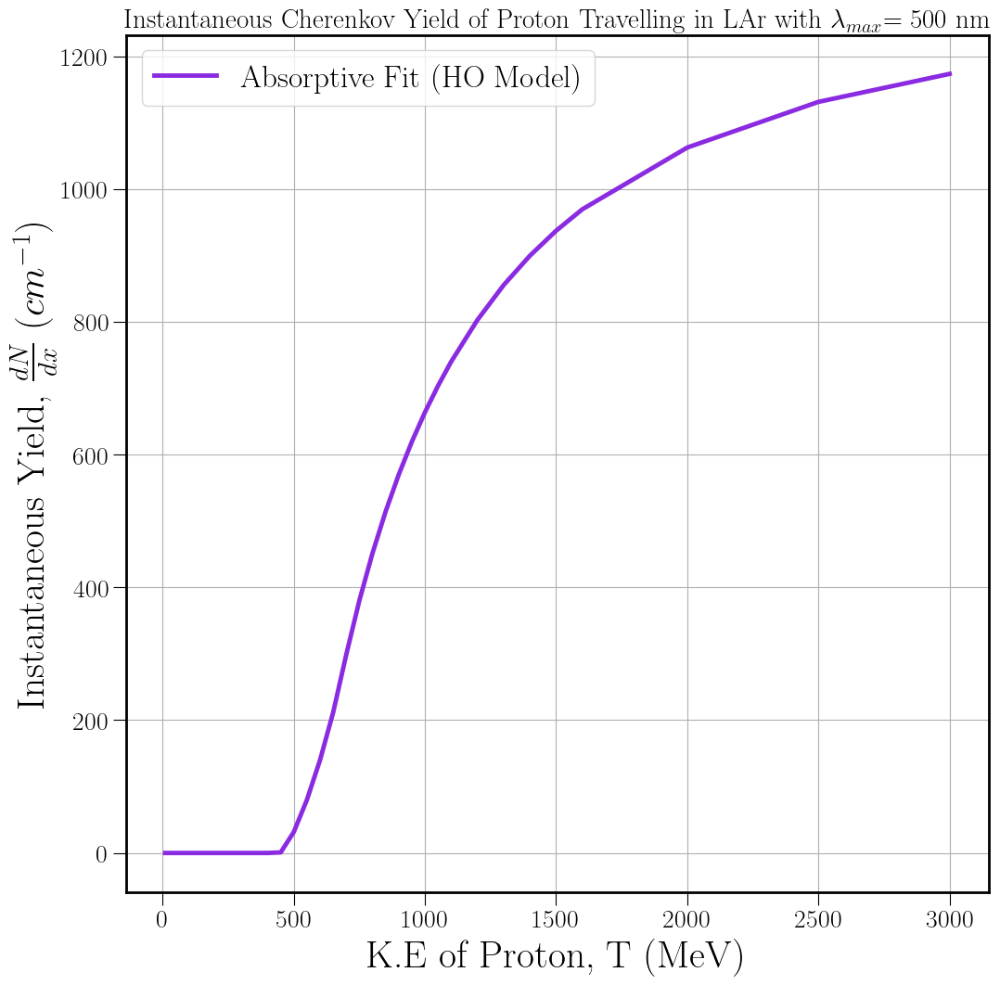

In [54]:
#Plot of Instantaneous Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Yield of Proton Travelling in LAr with $\lambda_{max}$= 500 nm", fontsize=21)
# ax.plot(t, cerenkovtsum, linewidth = 3.5,  color='g', label="Absorptive Fit Only")
ax.plot(t, cerenkovtsum500inst, linewidth = 3.5, color='blueviolet', label="Absorptive Fit (HO Model)") #linestyle= 'dashdot', 
# ax.plot(t, cerenkovtsumpvs500inst, linewidth = 3.5, color='blueviolet', label="Resonance Model Fit") #linestyle= 'dashdot', 

ax.tick_params(axis='both',which='major',labelsize=20,length=10)


ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Instantaneous Yield, $\\frac{dN}{dx}$ $(cm^{-1})$',fontsize=30)

ax.grid()

ax.legend(fontsize=24)
# plt.xlim(383,500)
# plt.ylim(0,1000)
# plt.savefig("total_cherenkov_photons_absorptivefit.jpg", bbox_inches="tight")
# plt.savefig("total_cherenkov_photons_reabsorptivefit_lamdmax_500nm.jpg", bbox_inches="tight")
# plt.savefig("instantaneous_yield_resfit_lamdmax_500nm.jpg", bbox_inches="tight")


n_uvr = 1.102, n_500 = 1.2278
Numerical Method: Wavelength_min = 115.6328164082041 nm, Wavelength_max = 147.06353176588294 nm


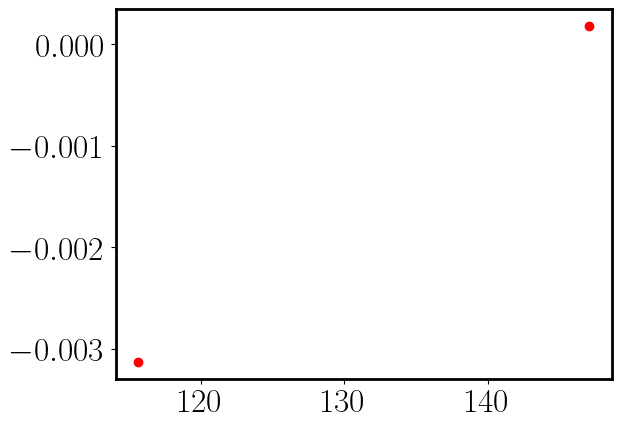

Wavelength_min = 115.6328164082041 nm, Wavelength_max = 147.06353176588294 nm
10.0 0.14486467848188067 124.68 124.68
100.0 0.4282487624449493 124.68 124.68
150.0 0.5066831416300631 124.68 124.68
200.0 0.5662215709520919 124.68 124.68
250.0 0.6136704253108138 124.68 124.68
300.0 0.6526335986017499 124.68 124.68
383.96 0.7046525912295857 124.68 124.68
400.0 0.7131157214873879 124.68 124.68
450.0 0.7370919123190173 121.1255627813907 129.05952976488243
500.0 0.7579653181328908 115.6328164082041 147.06353176588294
550.0 0.7762896784169824 113.49674837418709 168.42421210605303
600.0 0.7924914946784183 112.27613806903452 204.12706353176588
650.0 0.806905830051608 111.36068034017009 293.23161580790395
697.678 0.8192318094656588 110.44522261130565 500
700.0 0.8198002603953367 110.44522261130565 500
750.0 0.831391443029346 109.83491745872936 500
800.0 0.8418569002610763 109.22461230615308 500
850.0 0.8513435972356456 108.91945972986494 500
900.0 0.8599743115768982 108.61430715357679 500
950.0 0.

(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  8.690347090479782e-06,
  0.0003077638099663314,
  0.0007602109792992782,
  0.001288085792578183,
  0.0018658525898329974,
  0.002444934893319553,
  0.00247230251665929,
  0.0030196495870730314,
  0.003500217430909677,
  0.003926259229103277,
  0.004305015754889417,
  0.00464287609373425,
  0.00494750753636548,
  0.005222424945734059,
  0.0054730541591256916,
  0.005907061250398265,
  0.006272357827374569,
  0.006579790452542662,
  0.0068414029006916705,
  0.007066177191877702,
  0.007712529983508684,
  0.008190771130466401,
  0.008483960588907028])

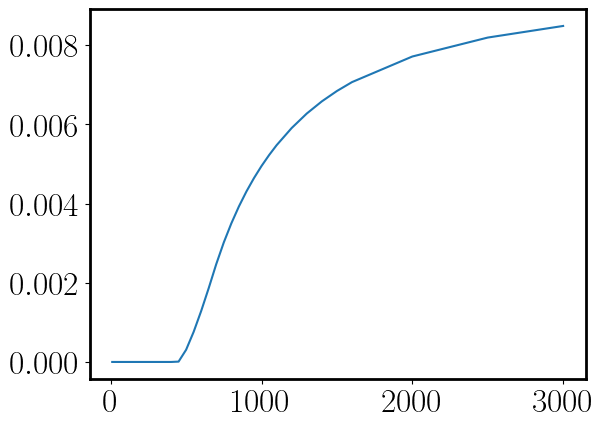

In [56]:
#Energy distribution of Cherenkov/Energy Loss

#Instantaneous Yield (HO Model fit)

# t = 500 #K.E of Proton  in MeV
# t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

t = 500 #K.E of Proton  in MeV
#Plot of n vs lambda in the LAr medium near Resonance 

h = 4.1357e-21 #MeV.s : Planck's constant
c = 3e17 #nm/s : speed of light 
 
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd = np.linspace(90,700,2000)   #wavelength of light 

lamd_uv = 106.67 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak

n_asymtoter = a_0j + a_j * lamd_uv**2
n_500 = 1.2278
n_uvr = 1.102
print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))



#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


funclamd = n_jacksonr - y

idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

plt.plot(lamd[idx], funclamd[idx], 'ro')
plt.show()
print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

n_jackson = lambda lamd: a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

efunc = lambda lamd,b: ((2 * np.pi * alpha * h * c) / (lamd**3 )) * (1- (1/(b**2 * n_jackson(lamd)*n_jackson(lamd))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

ecerenkovnolist = []

# t= np.array([400,500,700])
# t = np.array([450,500,550,600]) # ,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000


ecerenkovfinallist = []
ecerenkovtsum500inst = []

lamdmin = []
lamdmax = []

for j in t: 
    ecerenkovtlist = []
    ecerenkovsum = 0
        
    i  = np.sqrt(1 - (1/(1 + j/mp)**2)) #Relativistic Approach 

    y= 1/i
    y = np.linspace(y,y,2000)   #wavelength of light 
    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    funclamd = n_jacksonr - y
    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print(lamd[idx])
    
    if 1/i > n_peakr:
        lmin = lamd_peakr
        lmax = lamd_peakr
            
    if n_500 < 1/i < n_peakr:   
        lmin = lamd[min(idx)]
        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
    if n_uvr < 1/i <= n_500:
        lmin = max(lamd[min(idx)], 106.67)
        lmax = 500
            
    print(j, i, lmin, lmax)
        
    e_cerenkov_x = quad(efunc, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(no_cerenkov_x[0])
    ecerenkovtlist.append(e_cerenkov_x[0]) #indices 0,1 = int,err    
    ecerenkovsum = np.nansum(e_cerenkov_x[0])  *  1e7 
    
    lamdmin.append(lmin)
    lamdmax.append(lmax)
        
    ecerenkovfinallist.append(ecerenkovtlist)
    ecerenkovtsum500inst.append(ecerenkovsum) #conversion factor to standard units
    
    
# ax.grid()

# plt.plot(t, lamdmin)
# plt.plot(t, lamdmax)

list3 = list(map(list, list(zip(t, ecerenkovtsum500inst))))
print(list3)

plt.plot(t, ecerenkovtsum500inst)
t, ecerenkovtsum500inst

    
# no_cerenkov_x
# n2_grace(100)
# make_betalist(500), 

# plt.plot(cerenkovnolist)
# cerenkovsum * 1e6
# lamdmax



C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\2038459815.py:24: RuntimeWarning: invalid value encountered in sqrt
  lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\2038459815.py:25: RuntimeWarning: invalid value encountered in sqrt
  lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\2038459815.py:64: RuntimeWarning: invalid value encountered in sqrt
  lmin = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\2038459815.py:65: RuntimeWarning: invalid value encountered in sqrt
  lmax = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + l

(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 array([0.14486468, 0.42824876, 0.50668314, 0.56622157, 0.61367043,
        0.6526336 , 0.70465259, 0.71311572, 0.73709191, 0.75796532,
        0.77628968, 0.79249149, 0.80690583, 0.81923181, 0.81980026,
        0.83139144, 0.8418569 , 0.8513436 , 0.85997431, 0.86785245,
        0.87506571, 0.88168902, 0.88778668, 0.89862002, 0.9079289 ,
        0.91599153, 0.92302433, 0.92919798, 0.94766554, 0.9620614 ,
        0.97121809]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  3.931795377574739,
  31.015168466649232,
  69.56733454236348,
  116.95194275721008,
  174.21466730294875,
  245.4118451962153,
  335.1968773053893,
  340.41008

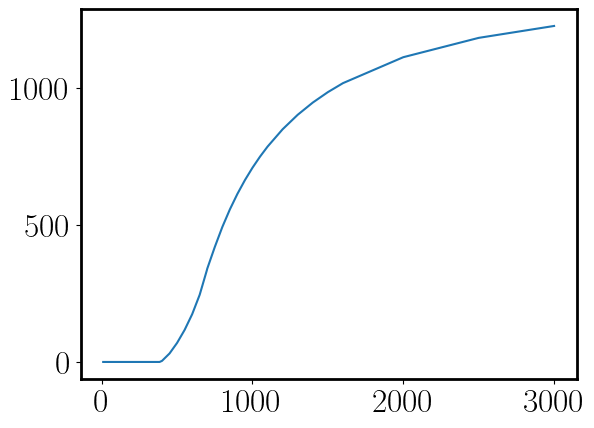

In [58]:
#Instantaneous Yield (lmax= 500) #PVS FIT

# t = 500 #K.E of Proton  in MeV
# t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([383.96156,385,400,450,500,550,600,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

scint = 40000*t*0.275
scintback = np.sqrt(scint)

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# print(beta)
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))

#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

func = lambda wl,b: ((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n_pvs(wl)*n_pvs(wl))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

cerenkovnolist = []

# absorption_avg = 0.0675 #in nm^-1
# dx = 0.1*1e7 #cm -> nm 

# print(beta)

cerenkovfinallist = []
cerenkovtsumpvs500inst = []

for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
    
    i  = np.sqrt(1 - (1/(1 + j/mp)**2)) #Relativistic Approach 

         
    if (i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) < 1:
        lmin = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
        lmax = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i + np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
#             print(lmin, lmax, i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) #OUTPUT FOR WAVELENGTH RANGE
    if (i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) >= 1:
        lmin = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))            
        lmax = 500
#             print(lmin, lmax, i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) #OUTPUT FOR WAVELENGTH RANGE 
    no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(j, no_cerenkov_x[0]*1e7)
    cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err    
    cerenkovsum = np.nansum(no_cerenkov_x[0])  *  1e7 
    # print(j, cerenkovsum)
        
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsumpvs500inst.append(cerenkovsum) #conversion factor to standard units

plt.plot(t, cerenkovtsumpvs500inst)
t, beta, cerenkovtsumpvs500inst
    
# make_betalist(500)

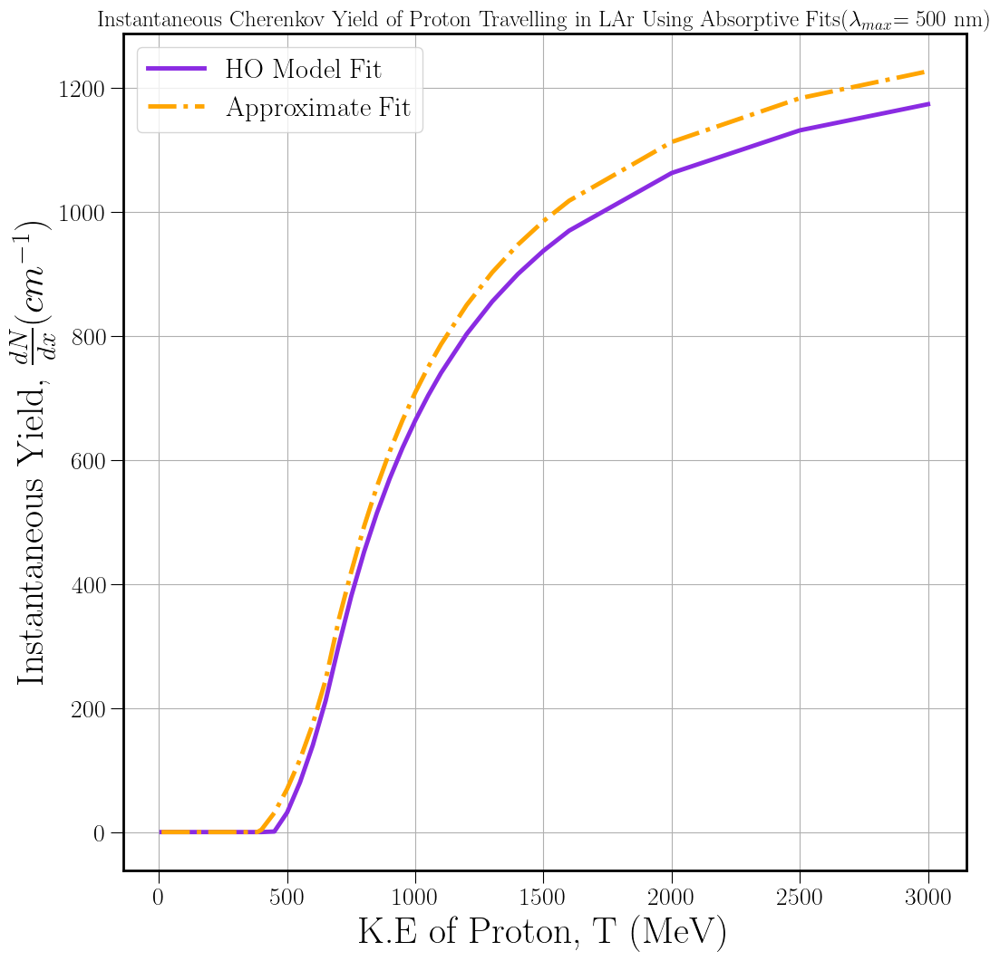

In [60]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title(r"Instantaneous Cherenkov Yield of Proton Travelling in LAr Using Absorptive Fits($\lambda_{max}$= 500 nm)", fontsize=18)

ax.plot(t, cerenkovtsum500inst, linewidth = 3.5, color='blueviolet', label="HO Model Fit") #linestyle= 'dashdot', 
ax.plot(t, cerenkovtsumpvs500inst, ls= 'dashdot', linewidth = 3.5, color='orange', label= 'Approximate Fit')

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Instantaneous Yield, $\\frac{dN}{dx} (cm^{-1})$',fontsize=30)
ax.grid()
ax.legend(fontsize=22)
# plt.xlim(383,1000)
# plt.ylim(0,15000)
# plt.savefig("instantaneous_yield_comparison_absorptivefits.jpg", bbox_inches="tight")
# plt.savefig("instantaneous_yield_comparison_allfits.jpg", bbox_inches="tight")

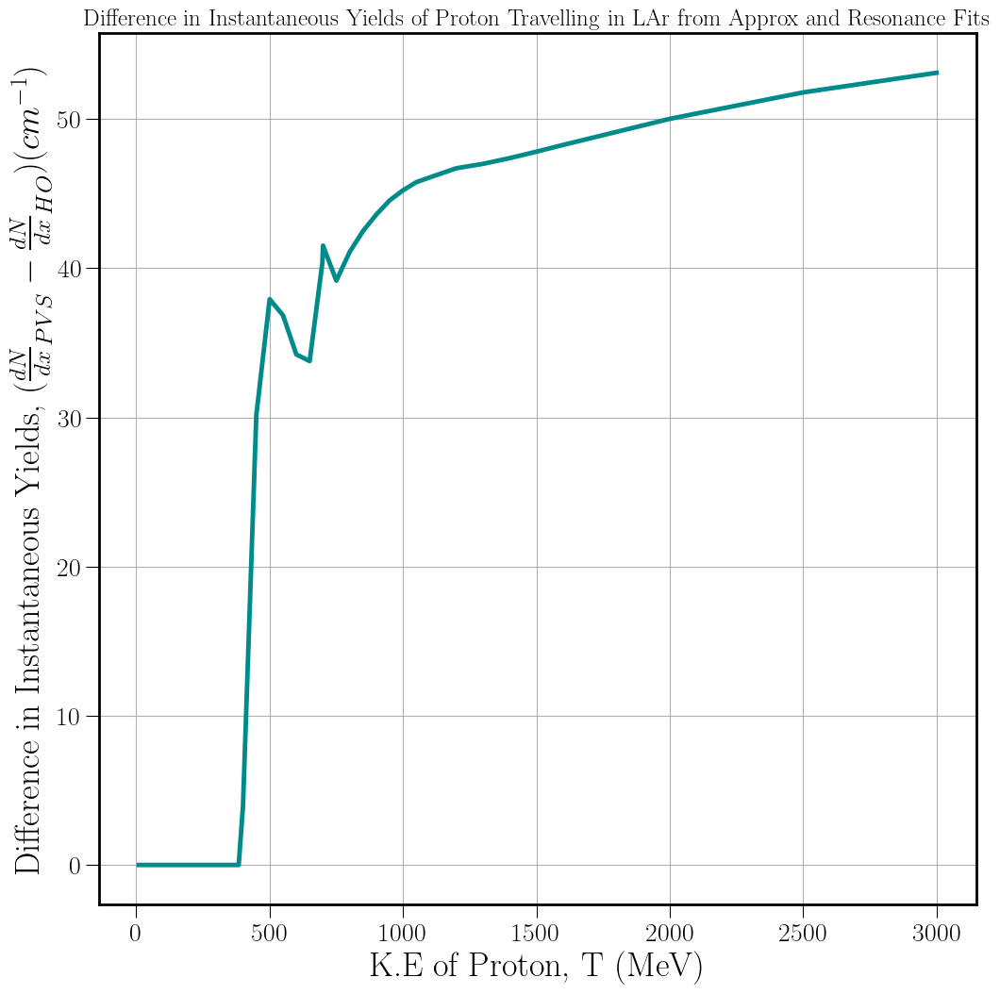

In [62]:

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title(r"Difference in Instantaneous Yields of Proton Travelling in LAr from Approx and Resonance Fits", fontsize=18)
# ax.plot(t, cerenkovtsum, linewidth = 3.5, color='b')
# ax.plot(t, cerenkovtsumpvs, ls='dashdot', linewidth = 3.5, color='orange')

ax.plot(t, np.subtract(cerenkovtsumpvs500inst,cerenkovtsum500inst), linewidth = 3.5, color='darkcyan')

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=26)
ax.set_ylabel('Difference in Instantaneous Yields, $(\\frac{dN}{dx}_{PVS} - \\frac{dN}{dx}_{HO}) (cm^{-1})$',fontsize=26)
ax.grid()
# ax.legend(fontsize=18)
# plt.xlim(440,1600)
# plt.ylim(0,5)
# plt.axhline(1,ls='--',c='blue',lw=3)

# plt.savefig("difference_instyields_pvsminusres.jpg", bbox_inches="tight")

[0.14486468 0.42824876 0.50668314 0.56622157 0.61367043 0.6526336
 0.70465259 0.71311572 0.73709191 0.75796532 0.77628968 0.79249149
 0.80690583 0.81923181 0.81980026 0.83139144 0.8418569  0.8513436
 0.85997431 0.86785245 0.87506571 0.88168902 0.88778668 0.89862002
 0.9079289  0.91599153 0.92302433 0.92919798 0.94766554 0.9620614
 0.97121809]
10.0 106.7 106.86523865118929
100.0 106.7 109.65000259806453
150.0 106.7 111.58057286340426
200.0 106.7 113.87672253309006
250.0 106.7 116.64580394396091
300.0 106.7 120.0435134308692
383.96 106.7 127.87417540325141
400.0 106.7 129.80494057768018
450.0 106.7 137.18056341154067
500.0 106.7 147.6232102029335
550.0 106.7 163.68198824324034
600.0 106.7 192.15894872538965
650.0 106.7 261.4251482204873
697.678 106.7 500
700.0 106.7 500
750.0 106.7 500
800.0 106.7 500
850.0 106.7 500
900.0 106.7 500
950.0 106.7 500
1000.0 106.7 500
1050.0 106.7 500
1100.0 106.7 500
1200.0 106.7 500
1300.0 106.7 500
1400.0 106.7 500
1500.0 106.7 500
1600.0 106.7 500
2000.

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\232367890.py:20: RuntimeWarning: invalid value encountered in sqrt
  lamdmax = np.sqrt((a_0g - beta**(-2))/((a_0g - beta**(-2) + a_uvg))) * lamd_uv


(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [2.0344577910287573,
  50.38478794517404,
  78.888768177898,
  108.51023287881125,
  139.42908537079703,
  171.8762731619566,
  230.65319998088648,
  242.62338014056678,
  281.819295018064,
  324.448410069347,
  371.56379507952687,
  424.86355697553853,
  487.5761695048757,
  563.2118516228882,
  567.1182546682838,
  645.0338471357716,
  712.6354970062501,
  771.7730637162739,
  823.8833030271513,
  870.0987473569289,
  911.3239061805687,
  948.2896806046099,
  981.5929257294183,
  1039.0970922086472,
  1086.8739850449333,
  1127.0828906651645,
  1161.2990062480503,
  1190.6970841365376,
  1275.2331296582304,
  1337.7819665984225,


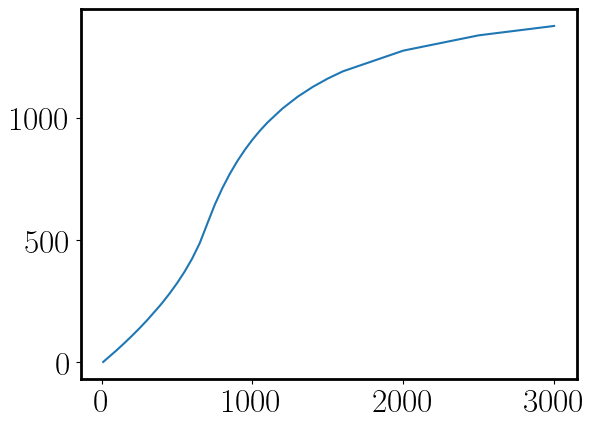

In [72]:
# Instantaneous Yield (Grace Fit)

#Calculating the total Cerenkov light (Grace Fit)

# t = 700 #K.E of Proton  in MeV
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
print(beta)
mp = 938  #Proton's mass in MeV
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamdmin = 106.7 #UV-Resonant wavelength in nm 
lamdmax = np.sqrt((a_0g - beta**(-2))/((a_0g - beta**(-2) + a_uvg))) * lamd_uv

# print(lamdmax)

integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 
# lamd = np.linspace(100,200,500)   #wavelength of light 
n2_grace = lambda wl: (a_0g + ((a_uvg * wl ** 2) / (wl**2-lamd_uv**2)))  #(ignoring the 3rd term) + (a_ir*lamd**2/(lamd**2-lamd_ir**2)  #Refractive index squared
# # for index in lamd:

func = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_grace(wl)))))

# print(lamdmin, lamdmax, n2_grace(120), func(120), beta)

y_list = []

cerenkovnolist = []

# 0.8192319205190405
# 697.6784525083162

cerenkovfinallist = []
cerenkovtsum500ginst = []

# dx = 0.1 #in cm 


for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
#     print(j) #OUTPUT
#     print(make_betalist(j))
    # mybetalist = make_betalist(j)
#     filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
#     print(j, np.shape(filtered_betalist))#, filtered_betalist)
#     myxlist = make_xlist(j)
#     print(j, filtered_betalist, filtered_xlist) #OUTPUT filtered_betalist, 

    i  = np.sqrt(1 - (1/(1 + j/mp)**2)) #Relativistic Approach 
    
    # for i in mybetalist:  #[0:20]    for i in make_betalist(j):
        
    if i < 0.8183502: 

        lmax = min(np.sqrt((a_0g - i**(-2))/((a_0g - i**(-2) + a_uvg))) * lamd_uv, 500) #908.3
        lmin = 106.7 #in nm
    
    else: 
        # lmax= 908.3
        lmax= 500 # To match finite detector acceptance
        lmin = 106.7

   
    no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#     print(no_cerenkov_x[0])
    cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err    
    cerenkovsum = np.nansum(no_cerenkov_x[0])  *  1e7 
#         print(cerenkovsum * 1e6)
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsum500ginst.append(cerenkovsum)

    print(j,lmin,lmax)
    
plt.plot(t, cerenkovtsum500ginst)
t, cerenkovtsum500ginst

10.0 108.65 108.81209626391264
3.2589603182293945
100.0 108.65 110.45412951884232
31.197723031112844
150.0 108.65 111.61055702907382
47.81257253109021
200.0 108.65 113.00514094224513
65.38562565196412
250.0 108.65 114.71456377116245
84.10494872062675
300.0 108.65 116.85314353373838
104.21487379797918
383.96 108.65 121.95389095173326
142.06353461453287
400.0 108.65 123.24844077101588
150.0282700979432
450.0 108.65 128.3287725861396
176.81473694503478
500.0 108.65 135.892962632924
207.35725406347456
550.0 108.65 148.40884917694072
243.20373269601293
600.0 108.65 173.53297348470903
287.1552481896681
650.0 108.65 257.6313257968158
345.465028467462
697.678 108.65 500
425.66727553485197
700.0 108.65 500
429.65741385765205
750.0 108.65 500
509.24315752909735
800.0 108.65 500
578.2938749507668
850.0 108.65 500
638.6990785426832
900.0 108.65 500
691.9263212229861
950.0 108.65 500
739.1324116852422
1000.0 108.65 500
781.2412479189279
1050.0 108.65 500
818.9993981817888
1100.0 108.65 500
853.0165

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1838743587.py:23: RuntimeWarning: invalid value encountered in sqrt
  lamdmax = lamd_uv * np.sqrt(((a_0b - 3)*(beta**(-2)-1) + 3*a_0b)/(3*(a_0b + a_uvb) - (beta**(-2)-1)*(3 - a_0b - a_uvb)))


(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [3.2589603182293945,
  31.197723031112844,
  47.81257253109021,
  65.38562565196412,
  84.10494872062675,
  104.21487379797918,
  142.06353461453287,
  150.0282700979432,
  176.81473694503478,
  207.35725406347456,
  243.20373269601293,
  287.1552481896681,
  345.465028467462,
  425.66727553485197,
  429.65741385765205,
  509.24315752909735,
  578.2938749507668,
  638.6990785426832,
  691.9263212229861,
  739.1324116852422,
  781.2412479189279,
  818.9993981817888,
  853.0165113968068,
  911.7533021848611,
  960.5543114133294,
  1001.6251106585502,
  1036.5746620671034,
  1066.6028992580682,
  1152.9510079929487,
  1216.84060372718

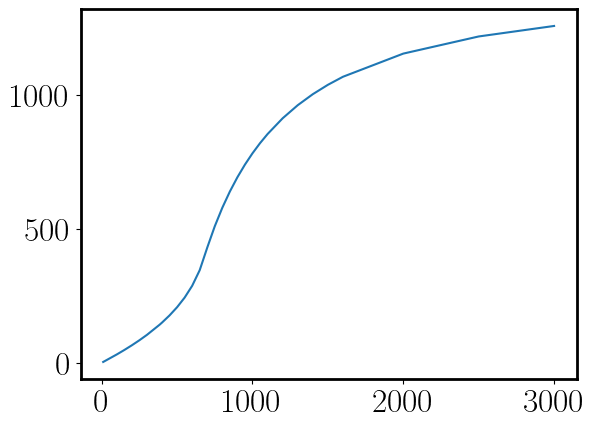

In [292]:
#Babics:
#Calculating instantaneous Cerenkov yield 

#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 



# t = 500 #K.E of Proton  in MeV
# t = np.array([300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000.... 10,50,100,150,200,250,
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000


mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 

lamdmin = 106.2 #UV-Resonant wavelength in nm 
lamdmax = lamd_uv * np.sqrt(((a_0b - 3)*(beta**(-2)-1) + 3*a_0b)/(3*(a_0b + a_uvb) - (beta**(-2)-1)*(3 - a_0b - a_uvb))) 

# print(lamdmax)

integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 
# lamd = np.linspace(100,200,500)   #wavelength of light 

# x = (a_0 + (a_uv*lamd**2/(lamd**2-lamd_uv**2)) + (a_ir*lamd**2/(lamd**2-lamd_ir**2))) #(ignoring the 3rd term)
# n_babics = np.sqrt(1+(3*x/(3-x)))
# n2_babics = (1+(3*x/(3-x)))


n2_babics = lambda wl: (1 + (3 * (a_0b + (a_uvb*wl**2/(wl**2-lamd_uv**2)) + (a_irb*wl**2/(wl**2-lamd_ir**2)))) / (3 - (a_0b + (a_uvb*wl**2/(wl**2-lamd_uv**2)) + (a_irb*wl**2/(wl**2-lamd_ir**2)))))

func2 = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_babics(wl)))))
# print(func(130,0.78))
# print(lamdmin, lamdmax, n2_babics, beta) #, func(120,0.78)

y_list = []

cerenkovnolist = []

cerenkovfinallist = []
cerenkovtsum500binst = []

# dx = 0.1 #in cm 

cerenkovsum = 0

for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
# #     print(j) #OUTPUT
# #     print(make_betalist(j))
#     mybetalist = make_betalist(j)
#     filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
# #     print(j, np.shape(filtered_betalist))#, filtered_betalist)
# #     myxlist = make_xlist(j)
# #     print(j, filtered_betalist, filtered_xlist) #OUTPUT filtered_betalist, 

    i  = np.sqrt(1 - (1/(1 + j/mp)**2)) #Relativistic Approach   
    # for i in mybetalist:  #[0:20]    for i in make_betalist(j):
        
    if i < 0.8139732:
        
        lmax = min((lamd_uv * np.sqrt(((a_0b - 3) * (i**(-2) - 1) + 3 * a_0b) / ((3 * (a_0b + a_uvb)) - (i**(-2) - 1) * (3 - a_0b - a_uvb)))), 500) #IR: 908.3 nm 
        lmin = 108.65 #in nm
            
    else: 
        # lmax= 908.3
        lmax= 500 #detector acceptance
        lmin = 108.65 #in nm
                   
#         print(lmax)
#         print(func())

    
    no_cerenkov_x = quad(func2, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#     print(no_cerenkov_x[0])
    cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err    
    cerenkovsum = np.nansum(no_cerenkov_x[0])  *  1e7 
    # print(cerenkovsum)
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsum500binst.append(cerenkovsum)
#     print(cerenkovt2sum)

    print(j,lmin,lmax)
    print(cerenkovsum)
    
plt.plot(t, cerenkovtsum500binst)
t, cerenkovtsum500binst

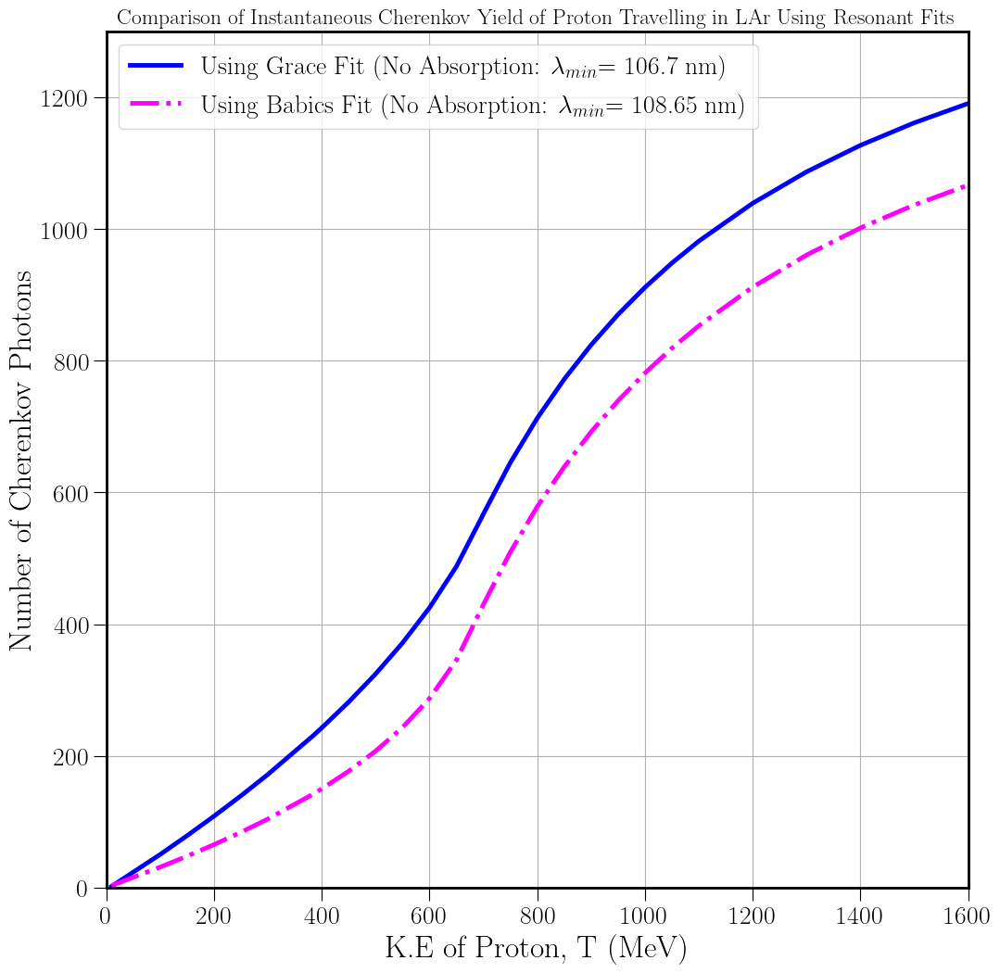

In [296]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Comparison of Instantaneous Cherenkov Yield of Proton Travelling in LAr Using Resonant Fits", fontsize=17)
ax.plot(t, cerenkovtsum500ginst, linewidth = 3.5, color='b', label='Using Grace Fit (No Absorption: $\lambda_{min}$= 106.7 nm)')
ax.plot(t, cerenkovtsum500binst, linewidth = 3.5, ls= 'dashdot', color='magenta', label='Using Babics Fit (No Absorption: $\lambda_{min}$= 108.65 nm)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=24)
ax.set_ylabel('Number of Cherenkov Photons',fontsize=24)
ax.grid()
ax.legend(fontsize=20)

plt.xlim(0,1600)
plt.ylim(0,1300)

# plt.savefig("inst_cerenkov_photon_comparison.jpg", bbox_inches="tight")
# plt.savefig("inst_cerenkov_photon_comparison_babiczvsgrace_hight_zoom.jpg", bbox_inches="tight")

(-40.0, 1300.0)

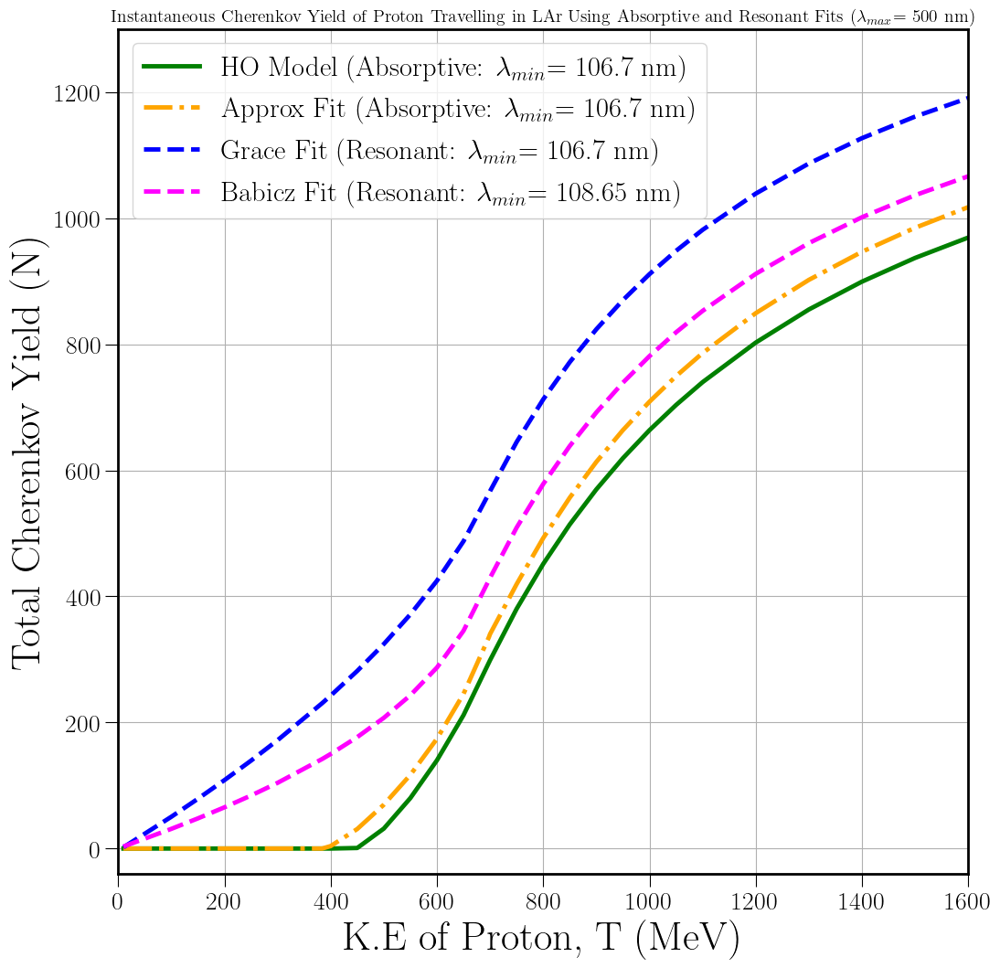

In [318]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
# ax.set_title("Comparison of Total Cherenkov Photons Emitted by Proton Travelling in LAr Using Our Refractive Index Fit and Others ", fontsize=17)

ax.set_title(r"Instantaneous Cherenkov Yield of Proton Travelling in LAr Using Absorptive and Resonant Fits ($\lambda_{max}$= 500 nm)", fontsize=14)

ax.plot(t, cerenkovtsum500inst, linewidth = 3.5, color='g', label="HO Model (Absorptive: $\lambda_{min}$= 106.7 nm)") #linestyle= 'dashdot', 
# ax.plot(t, cerenkovtsum500r, linewidth = 3.5, color='deepskyblue', label="HO Model Fit (n_uv:cut)") #linestyle= 'dashdot', 

ax.plot(t, cerenkovtsumpvs500inst, ls= 'dashdot', linewidth = 3.5, color='orange', label= 'Approx Fit (Absorptive: $\lambda_{min}$= 106.7 nm)')
# ax.plot(t, cerenkovtsumpvs500r, ls= 'dashdot', linewidth = 3.5, color='hotpink', label= 'Approximate Fit (Reabsorption)')

# ax.plot(t, cerenkovt1sum, linewidth = 3.5, color='green', label='This Work (Absorptive Fit)') #color='green'
# ax.plot(t, cerenkovt2sum, linewidth = 3.5, ls= ':', color='blueviolet', label="Reabsorption with $\\lambda_{max}$ = 500 nm")

ax.plot(t, cerenkovtsum500ginst, linewidth = 3.5, ls= 'dashed',color='b', label='Grace Fit (Resonant: $\lambda_{min}$= 106.7 nm)')
ax.plot(t, cerenkovtsum500binst, linewidth = 3.5, ls= 'dashed', color='magenta', label='Babicz Fit (Resonant: $\lambda_{min}$= 108.65 nm)') #dashdot


ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=32)
ax.set_ylabel('Total Cherenkov Yield (N)',fontsize=32)
ax.grid()
ax.legend(fontsize=22)

plt.xlim(0,1600)
plt.ylim(-40,1300) #1
# plt.ylim(-40,1200) #2

# plt.savefig("inst_cerenkov_photon_comparison_absorptionvsnoabsorption.jpg", bbox_inches="tight")
# plt.savefig("inst_cerenkov_photon_comparison_absorptive_vs_resonant_fits_hight.jpg", bbox_inches="tight") #_zoom
# plt.savefig("inst_cerenkov_photon_comparison_absorptive_vs_resonant_fits2_hight.jpg", bbox_inches="tight") #_zoom

# Integrated Yield (HO, Approx, Babicz, Grace)

In [90]:
# #Calculating the total Cerenkov yield (Absorptive Fits) (Mini t-data set near Cherenkov threshold )

# # t = 500 #K.E of Proton  in MeV
# # t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# # t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# # t = np.array([500]) #K.E of Proton  in MeV
# t = 500
# #Plot of n vs lambda in the LAr medium near Resonance 

# mp = 938  #Proton's mass in MeV
# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

# mp = 938  #Proton's mass in MeV
# #T = 90 K
# # {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652

# lamd_uv = 106.6 #lambda_UV = 106.6 nm
# lamd_ir = 908.3 #lambda_IR = 908.3 nm 
# lamd = np.linspace(106,700,2000)

# a_0j = 1.10232
# a_j = 0.0000105811
# gamma_j = 0.0025239

# lamd_peakr = 124.68 #nm
# n_peakr = 1.3605 #res model peak


# # n_asymtoter = a_0j + a_j * lamd_uv**2
# n_500 = 1.2278
# n_uvr = 1.102
# print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


# n_asymtoter = a_0j + a_j * lamd_uv**2
# print("n_asymtote = {}".format(n_asymtoter))

# cos_ang_min = 1/(beta * n_peakr)
# print("cos_ang_min= {}".format(cos_ang_min))



# # lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# # lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# # print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))



# #Formula: 
# n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# # n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2

# n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


# funclamd = n_jacksonr - y

# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
# print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

# plt.plot(lamd[idx], funclamd[idx], 'ro')
# plt.show()
# print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


# integral = []
# alpha = 1/137 #Fine-structure (EM coupling) constant 

# # lamd = np.linspace(100,200,500)   #wavelength of light 

# n_jackson = lambda lamd: a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

# func = lambda lamd,b: ((2 * np.pi * alpha) / (lamd**2 )) * (1- (1/(b**2 * n_jackson(lamd)*n_jackson(lamd))))
# # funcv = np.vectorize(func)

# # print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

# y_list = []

# cerenkovnolist = []

# # t = np.array([450,500,550,600]) # ,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400,450,460,470,480,490,500]) #,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500s = []
# for j in t: 
#     cerenkovtlist = []
#     cerenkovsum = 0
# #     print(j)
# #     print(make_betalist(j))
#     mybetalist = make_betalist(j)
#     filtered_lst_res = [x for x in mybetalist if x > 0.735294]
#     # print(filtered_lst_res)
#     for i in filtered_lst_res:  #[0:20]
#         y= 1/i
#         y = np.linspace(y,y,2000)   #wavelength of light 
#         n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
#         funclamd = n_jacksonr - y
#         idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
#         # print(lamd[idx])
        
#         # if 1/i >= n_peakr:
#         #     lmin = lamd_peakr
#         #     lmax = lamd_peakr
            
#         if n_500 < 1/i < n_peakr:   
#             lmin = lamd[min(idx)]
#             lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
#         if n_uvr < 1/i <= n_500:
#             lmin = max(lamd[min(idx)], 106.67)
#             lmax = 500
            
#         # if  1/i <= n_uvr:
#         #     lmin = 106.67
#         #     lmax = 500
    
#         # print(j, i, lmin, lmax)
        
#         no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
# #         print(no_cerenkov_x[0])
#         cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err
#         cerenkovsum += no_cerenkov_x[0]
        
#     cerenkovfinallist.append(cerenkovtlist)
#     cerenkovtsum500s.append(cerenkovsum * 1e6) #conversion factor to standard units
        
# ax.grid()

# list3 = list(map(list, list(zip(t, cerenkovtsum500s))))
# print(list3)


# plt.plot(t, cerenkovtsum500s)
# t, cerenkovtsum500s   #:.2f = 2 decimal places
    
# # no_cerenkov_x
# # n2_grace(100)
# # make_betalist(500), 

# # plt.plot(cerenkovnolist)
# # cerenkovsum * 1e6
# # lamdmax

In [92]:
# #Calculating the total Cerenkov yield (Absorptive Fits)

# # t = 500 #K.E of Proton  in MeV
# # t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# # t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# t = 500 #K.E of Proton  in MeV
# #Plot of n vs lambda in the LAr medium near Resonance 

# mp = 938  #Proton's mass in MeV
# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

# mp = 938  #Proton's mass in MeV
# #T = 90 K
# # {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652

# lamd_uv = 106.6 #lambda_UV = 106.6 nm
# lamd_ir = 908.3 #lambda_IR = 908.3 nm 

# a_0j = 1.10232
# a_j = 0.0000105811
# gamma_j = 0.0025239

# lamd_peakr = 124.68 #nm
# n_peakr = 1.3605 #HO (absorptive) model peak


# # n_asymtoter = a_0j + a_j * lamd_uv**2
# n_500 = 1.2278
# n_uvr = 1.102
# print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


# n_asymtoter = a_0j + a_j * lamd_uv**2
# print("n_asymtote = {}".format(n_asymtoter))

# cos_ang_min = 1/(beta * n_peakr)
# print("cos_ang_min= {}".format(cos_ang_min))



# # lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# # lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# # print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))



# #Formula: 
# n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# # n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2

# n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


# funclamd = n_jacksonr - y

# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
# print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

# plt.plot(lamd[idx], funclamd[idx], 'ro')
# plt.show()
# print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


# integral = []
# alpha = 1/137 #Fine-structure (EM coupling) constant 

# # lamd = np.linspace(100,200,500)   #wavelength of light 

# n_jackson = lambda lamd: a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

# func = lambda lamd,b: ((2 * np.pi * alpha) / (lamd**2 )) * (1- (1/(b**2 * n_jackson(lamd)*n_jackson(lamd))))
# # funcv = np.vectorize(func)

# # print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

# y_list = []

# cerenkovnolist = []

# # t = np.array([450,500,550,600]) # ,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500asm = []
# for j in t: 
#     cerenkovtlist = []
#     cerenkovsum = 0
# #     print(j)
# #     print(make_betalist(j))
#     mybetalist = make_betalist(j)
#     filtered_lst_res = [x for x in mybetalist if x > 0.735]
#     # print(filtered_lst_res)
#     for i in filtered_lst_res:  #[0:20]
#         y= 1/i
#         y = np.linspace(y,y,2000)   #wavelength of light 
#         n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
#         funclamd = n_jacksonr - y
#         idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
#         # print(lamd[idx])
        
        
#         if 1/i > n_peakr:
#             lmin = lamd_peakr
#             lmax = lamd_peakr
            
#         if n_asymtoter < 1/i < n_peakr:   
#             lmin = lamd[min(idx)]
#             lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
#         if 1/i <= n_asymtoter:
#             lmin = max(lamd[min(idx)], 106.67)
#             lmax = 500            
    
#         # print(j, i, lmin, lmax)
        
#         no_cerenkov_x = integrate.quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
# #         print(no_cerenkov_x[0])
#         cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err
#         cerenkovsum += no_cerenkov_x[0]
        
#     cerenkovfinallist.append(cerenkovtlist)
#     cerenkovtsum500asm.append(cerenkovsum * 1e6) #conversion factor to standard units
    
    
# ax.grid()

# list3 = list(map(list, list(zip(t, cerenkovtsum500asm))))
# print(list3)


# plt.plot(t, cerenkovtsum500asm)
# t, cerenkovtsum500asm
    
# # no_cerenkov_x
# # n2_grace(100)
# # make_betalist(500), 

# # plt.plot(cerenkovnolist)
# # cerenkovsum * 1e6
# # lamdmax


n_uvr = 1.102, n_500 = 1.2278
n_asymtote = 1.222558964716
cos_ang_min= [5.07386546 1.71634796 1.45065787 1.29812061 1.19775022 1.1262428
 1.04310109 1.03072176 0.99719435 0.96973288 0.94684228 0.92748489
 0.91091657 0.89721112 0.89658899 0.88408883 0.87309837 0.86336926
 0.85470447 0.84694569 0.83996422 0.83365436 0.82792849 0.81794738
 0.80956106 0.80243525 0.79632125 0.79103044 0.77561529 0.76400934
 0.75680621]
[[10.0, 0.0], [100.0, 0.0], [150.0, 0.0], [200.0, 0.0], [250.0, 0.0], [300.0, 0.0], [383.96, 0.0], [400.0, 0.0], [450.0, 0.45511712630108264], [500.0, 200.84326206442336], [550.0, 1011.0505052979913], [600.0, 2681.908354090805], [650.0, 5438.725878549042], [697.678, 9335.635908892826], [700.0, 9561.572746182997], [750.0, 15211.362518746628], [800.0, 22266.860843621893], [850.0, 30601.265118152893], [900.0, 40100.843015089195], [950.0, 50664.54131920603], [1000.0, 62201.43088341228], [1050.0, 74630.02964270659], [1100.0, 87876.99626742859], [1200.0, 116568.43171145365], [1300.

(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.45511712630108264,
  200.84326206442336,
  1011.0505052979913,
  2681.908354090805,
  5438.725878549042,
  9335.635908892826,
  9561.572746182997,
  15211.362518746628,
  22266.860843621893,
  30601.265118152893,
  40100.843015089195,
  50664.54131920603,
  62201.43088341228,
  74630.02964270659,
  87876.99626742859,
  116568.43171145365,
  147819.82613932862,
  181252.62329695717,
  216548.68431879632,
  253443.99984945654,
  413095.5590486388,
  630183.3589726503,
  857935.8761637792])

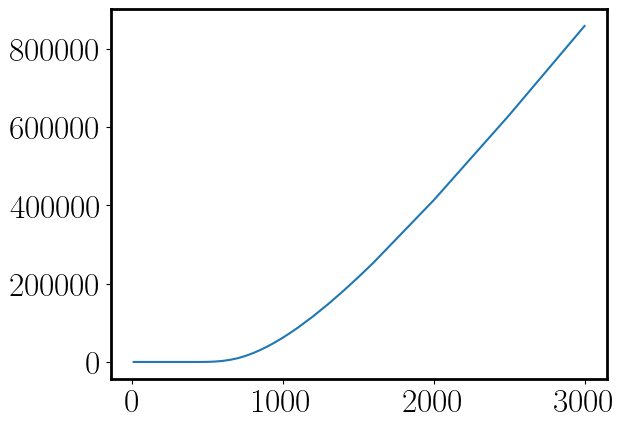

In [94]:
#Calculating the total Cerenkov yield (HO Model Fit)

# t = 500 #K.E of Proton  in MeV
# t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# t = np.array([500]) #K.E of Proton  in MeV
# t = 500
dx = 0.1 #cm

#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(106,700,2000)

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


# n_asymtoter = a_0j + a_j * lamd_uv**2
n_500 = 1.2278
n_uvr = 1.102
print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


n_asymtoter = a_0j + a_j * lamd_uv**2
print("n_asymtote = {}".format(n_asymtoter))

cos_ang_min = 1/(beta * n_peakr)
print("cos_ang_min= {}".format(cos_ang_min))



# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))



#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


# funclamd = n_jacksonr - y

# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
# print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

# plt.plot(lamd[idx], funclamd[idx], 'ro')
# plt.show()
# print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

n_jackson = lambda lamd: a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

func = lambda lamd,b: ((2 * np.pi * alpha) / (lamd**2 )) * (1- (1/(b**2 * n_jackson(lamd)*n_jackson(lamd))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

cerenkovnolist = []

# t = np.array([450,500,550,600]) # ,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440, 445, 448, 450, 460, 470, 480, 490, 500, 600, 700, 750, 800, 900, 1000, 1200, 1500])

cerenkovfinallist = []
scint_all = []
cerenkovtsum500 = []
for j in t: #range(len(t)):
    scintp = 40000*j*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
    scint = np.linspace(scintp, scintp, 2000)
    cerenkovtlist = []
    cerenkovsum = 0
#     print(j)
#     print(make_betalist(j))
    # mybetalist = make_betalist(j)
    mybetalist = make_betalist(j) #dx= 0.01 cm ,0,0.1
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]
        y= 1/i
        y = np.linspace(y,y,2000)   #wavelength of light 
        n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print(lamd[idx])
        
        # if 1/i >= n_peakr:
        #     lmin = lamd_peakr
        #     lmax = lamd_peakr
            
        if n_500 < 1/i < n_peakr:   
            lmin = lamd[min(idx)]
            lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
        if n_uvr < 1/i <= n_500:
            lmin = max(lamd[min(idx)], 106.67)
            lmax = 500
            
        if  1/i <= n_uvr:
            lmin = 106.67
            lmax = 500
    
        # print(j, i, lmin, lmax)
        
        no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(no_cerenkov_x[0])
        cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err
        cerenkovsum += no_cerenkov_x[0]
        
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsum500.append(cerenkovsum * 1e6 * (dx/0.1)) #conversion factor to standard units
    # cerenkov_all[j].append(cerenkovangsum)
    scint_all.append(scint)
    # scint_all.append(scint)

    
ax.grid()

list3 = list(map(list, list(zip(t, cerenkovtsum500))))
print(list3)

# dx = 0.01 #cm
plt.plot(t, cerenkovtsum500)
t, cerenkovtsum500  #:.2f = 2 decimal places
    
# no_cerenkov_x
# n2_grace(100)
# make_betalist(500), 

# plt.plot(cerenkovnolist)
# cerenkovsum * 1e6
# lamdmax

In [98]:
scintbg = np.sqrt(40000*t*0.275) #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost
t,scintbg

(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 array([ 331.66247904, 1048.80884817, 1284.52325787, 1483.23969742,
        1658.31239518, 1816.59021246, 2055.13016619, 2097.61769634,
        2224.85954613, 2345.20787991, 2459.67477525, 2569.04651573,
        2673.94839142, 2770.28121316, 2774.8873851 , 2872.28132327,
        2966.47939484, 3057.77697028, 3146.42654451, 3232.64597505,
        3316.62479036, 3398.52909359, 3478.50542619, 3633.18042492,
        3781.53408024, 3924.28337407, 4062.01920232, 4195.23539268,
        4690.41575982, 5244.04424085, 5744.56264654]))

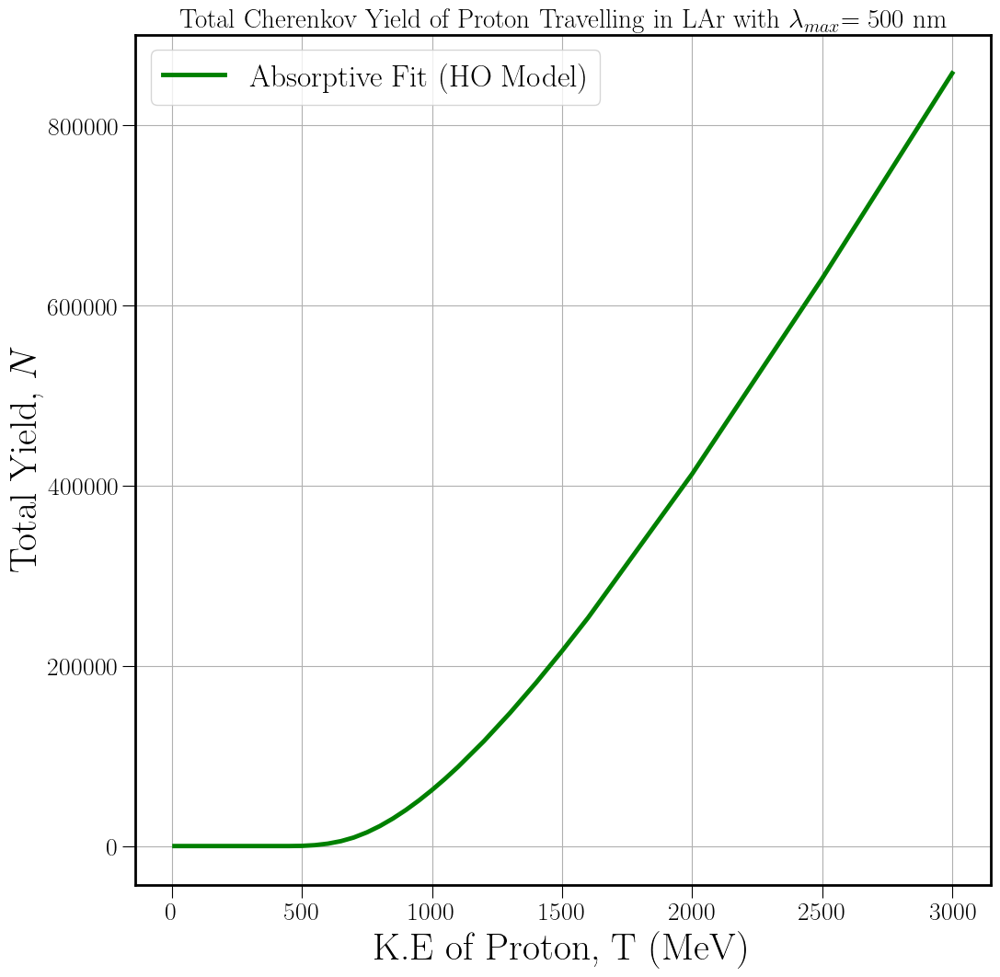

In [100]:
#Plot of Integrated Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Yield of Proton Travelling in LAr with $\lambda_{max}$= 500 nm", fontsize=21)
# ax.plot(t, cerenkovtsum, linewidth = 3.5,  color='g', label="Absorptive Fit Only")
ax.plot(t, cerenkovtsum500, linewidth = 3.5, color='g', label="Absorptive Fit (HO Model)") #linestyle= 'dashdot', 
# ax.plot(t, scint_all, linewidth = 3.5, ls = 'dashdot', color='r', label="Absorptive Fit (HO Model)") #linestyle= 'dashdot', 

ax.tick_params(axis='both',which='major',labelsize=20,length=10)


ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Total Yield, $N$',fontsize=30)

ax.grid()

ax.legend(fontsize=24)
# plt.xlim(383,500)
# plt.ylim(0,1000)
# plt.savefig("total_cherenkov_photons_absorptivefit.jpg", bbox_inches="tight")
# plt.savefig("total_cherenkov_photons_reabsorptivefit_lamdmax_500nm.jpg", bbox_inches="tight")
# plt.savefig("integrated_yield_hofit_lamdmax_500nm.jpg", bbox_inches="tight")


(383, 3000)

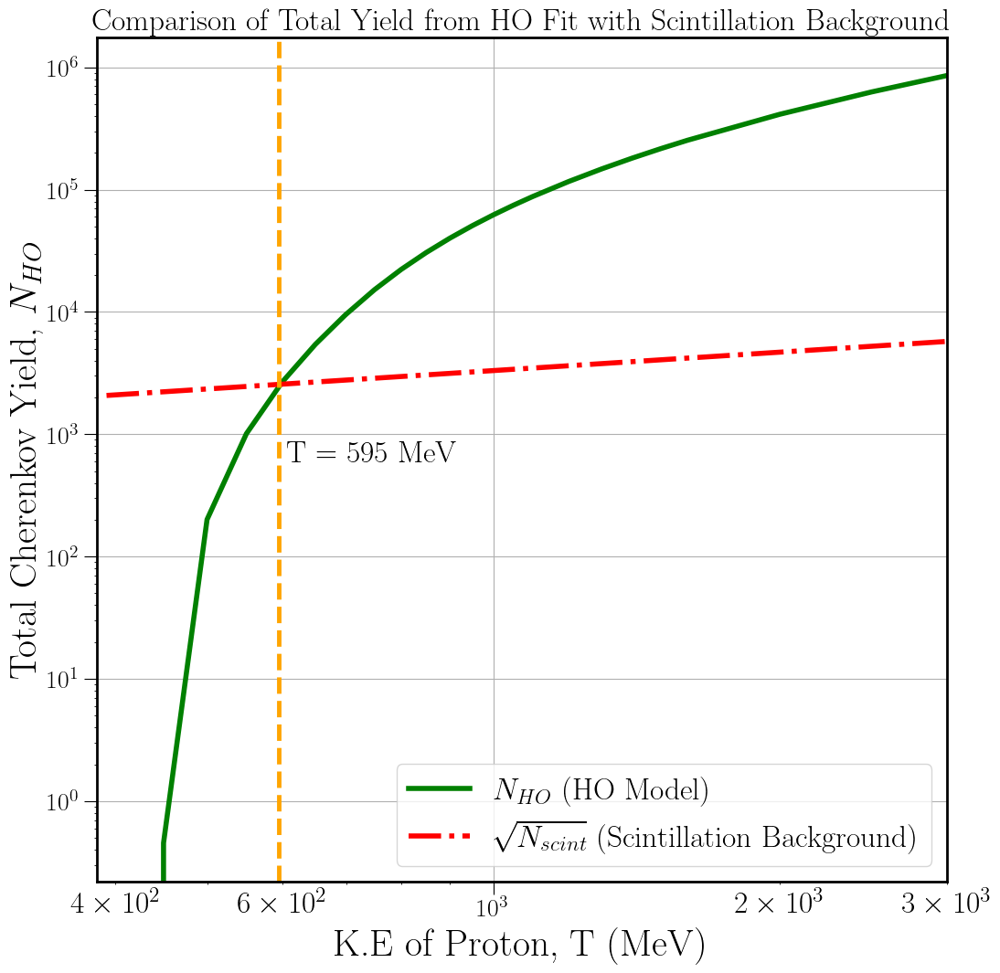

In [102]:
#Plot of Integrated Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Comparison of Total Yield from HO Fit with Scintillation Background", fontsize=24)
# ax.plot(t, cerenkovtsum, linewidth = 3.5,  color='g', label="Absorptive Fit Only")
ax.plot(t, cerenkovtsum500, linewidth = 4, color='g', label="$N_{HO}$ (HO Model)") #linestyle= 'dashdot', 
ax.plot(t, scintbg, linewidth = 4, ls = 'dashdot', color='r', label="$\sqrt{N_{scint}}$ (Scintillation Background)") #linestyle= 'dashdot',
plt.axvline(595, ls='--',c='orange',lw=3.5) #lamdmin

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Total Cherenkov Yield, $N_{HO}$',fontsize=30)

ax.grid()
plt.xscale("log")
plt.yscale("log")
plt.annotate('T = 595 MeV', xy = (605, 600))


ax.legend(fontsize=24)
plt.xlim(383,3000)
# plt.ylim(0,1000)
# plt.savefig("total_cherenkov_photons_absorptivefit.jpg", bbox_inches="tight")
# plt.savefig("total_cerenkov_photon_vs_scintback_ourfit_hight_log.jpg", bbox_inches="tight")
# plt.savefig("integrated_yield_resfit_lamdmax_500nm.jpg", bbox_inches="tight")


n_uvr = 1.102, n_500 = 1.2278
n_asymtote = 1.222558964716
cos_ang_min= [5.07386546 1.71634796 1.45065787 1.29812061 1.19775022 1.1262428
 1.04310109 1.03072176 0.99719435 0.96973288 0.94684228 0.92748489
 0.91091657 0.89721112 0.89658899 0.88408883 0.87309837 0.86336926
 0.85470447 0.84694569 0.83996422 0.83365436 0.82792849 0.81794738
 0.80956106 0.80243525 0.79632125 0.79103044 0.77561529 0.76400934
 0.75680621]
[[10.0, 0.0], [100.0, 0.0], [150.0, 0.0], [200.0, 0.0], [250.0, 0.0], [300.0, 0.0], [383.96, 0.0], [400.0, 0.0], [450.0, 0.003645418765235718], [500.0, 1.5861938642193787], [550.0, 7.856317523363012], [600.0, 20.44210657575521], [650.0, 40.47158622253136], [697.678, 67.33377590632392], [700.0, 68.84364176917516], [750.0, 105.6753253155815], [800.0, 150.27025708760806], [850.0, 201.95704753806743], [900.0, 260.1259145131443], [950.0, 324.23340539423793], [1000.0, 393.7859201370405], [1050.0, 468.3392637975614], [1100.0, 547.4916770496527], [1200.0, 718.1772879767944], [1300.0,

(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.003645418765235718,
  1.5861938642193787,
  7.856317523363012,
  20.44210657575521,
  40.47158622253136,
  67.33377590632392,
  68.84364176917516,
  105.6753253155815,
  150.27025708760806,
  201.95704753806743,
  260.1259145131443,
  324.23340539423793,
  393.7859201370405,
  468.3392637975614,
  547.4916770496527,
  718.1772879767944,
  903.3250255486122,
  1100.818078445864,
  1308.8519509187176,
  1525.9285274219635,
  2462.4100766966976,
  3731.7696729716035,
  5060.961531993047])

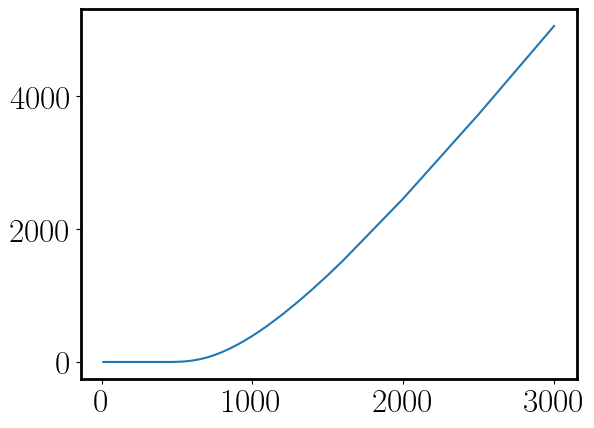

In [103]:
#Energy Deposit
#Calculating the total Cerenkov yield (resonance Model Fit)

# t = 500 #K.E of Proton  in MeV
# t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# t = np.array([500]) #K.E of Proton  in MeV
# t = 500
dx = 0.1 #cm
#Plot of n vs lambda in the LAr medium near Resonance 


h = 4.1357e-21 #MeV.s : Planck's constant
c = 3e17 #nm/s : speed of light 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta
y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(106,700,2000)

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


# n_asymtoter = a_0j + a_j * lamd_uv**2
n_500 = 1.2278
n_uvr = 1.102
print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


n_asymtoter = a_0j + a_j * lamd_uv**2
print("n_asymtote = {}".format(n_asymtoter))

cos_ang_min = 1/(beta * n_peakr)
print("cos_ang_min= {}".format(cos_ang_min))



# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))



#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance


# funclamd = n_jacksonr - y

# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
# print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

# plt.plot(lamd[idx], funclamd[idx], 'ro')
# plt.show()
# print("Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

n_jackson = lambda lamd: a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

efunc = lambda lamd,b: ((2 * np.pi * alpha) / (lamd**3 )) * (1- (1/(b**2 * n_jackson(lamd)*n_jackson(lamd))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

ecerenkovnolist = []

# t = np.array([450,500,550,600]) # ,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440, 445, 448, 450, 460, 470, 480, 490, 500, 600, 700, 750, 800, 900, 1000, 1200, 1500])

ecerenkovfinallist = []
ecerenkovtsum500 = []
for j in t: 
    ecerenkovtlist = []
    ecerenkovsum = 0
#     print(j)
#     print(make_betalist(j))
    # mybetalist = make_betalist(j)
    mybetalist = make_betalist(j) #dx= 0.01 cm ,0,0.1 
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    for i in filtered_lst_res:  #[0:20]
        y= 1/i
        y = np.linspace(y,y,2000)   #wavelength of light 
        n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print(lamd[idx])
        
        # if 1/i >= n_peakr:
        #     lmin = lamd_peakr
        #     lmax = lamd_peakr
            
        if n_500 < 1/i < n_peakr:   
            lmin = lamd[min(idx)]
            lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
        if n_uvr < 1/i <= n_500:
            lmin = max(lamd[min(idx)], 106.67)
            lmax = 500
            
        if  1/i <= n_uvr:
            lmin = 106.67
            lmax = 500
    
        # print(j, i, lmin, lmax)
        
        e_cerenkov_x = quad(efunc, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(no_cerenkov_x[0])
        ecerenkovtlist.append(e_cerenkov_x[0]) #indices 0,1 = int,err
        ecerenkovsum += e_cerenkov_x[0]
        
    ecerenkovfinallist.append(ecerenkovtlist)
    ecerenkovtsum500.append(ecerenkovsum * 1e6 * (dx/0.1)) #conversion factor to standard units
    
    
ax.grid()

list3 = list(map(list, list(zip(t, ecerenkovtsum500))))
print(list3)

# dx = 0.01 #cm
plt.plot(t, ecerenkovtsum500)
t, ecerenkovtsum500  #:.2f = 2 decimal places
    
# no_cerenkov_x
# n2_grace(100)
# make_betalist(500), 

# plt.plot(cerenkovnolist)
# cerenkovsum * 1e6
# lamdmax

In [105]:
t = 500 #K.E of Proton  in MeV
#Plot of n vs lambda in the LAr medium near Resonance 

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
y = 1/beta

cos_ang_min = 1/(beta * n_peakr)
thetamax = np.arccos(cos_ang_min)
thetamax_deg = thetamax*180/np.pi

cos_ang_max = 1 
thetamin = np.arccos(cos_ang_max)

print("cos_ang_min= {}, theta_max= {} degree, theta_min= {} degree".format(cos_ang_min, thetamax_deg, thetamin))



cos_ang_min= 0.969732876547658, theta_max= 14.132686901528965 degree, theta_min= 0.0 degree


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1854011867.py:17: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1854011867.py:18: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1854011867.py:21: RuntimeWarning: invalid value encountered in sqrt
  lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_

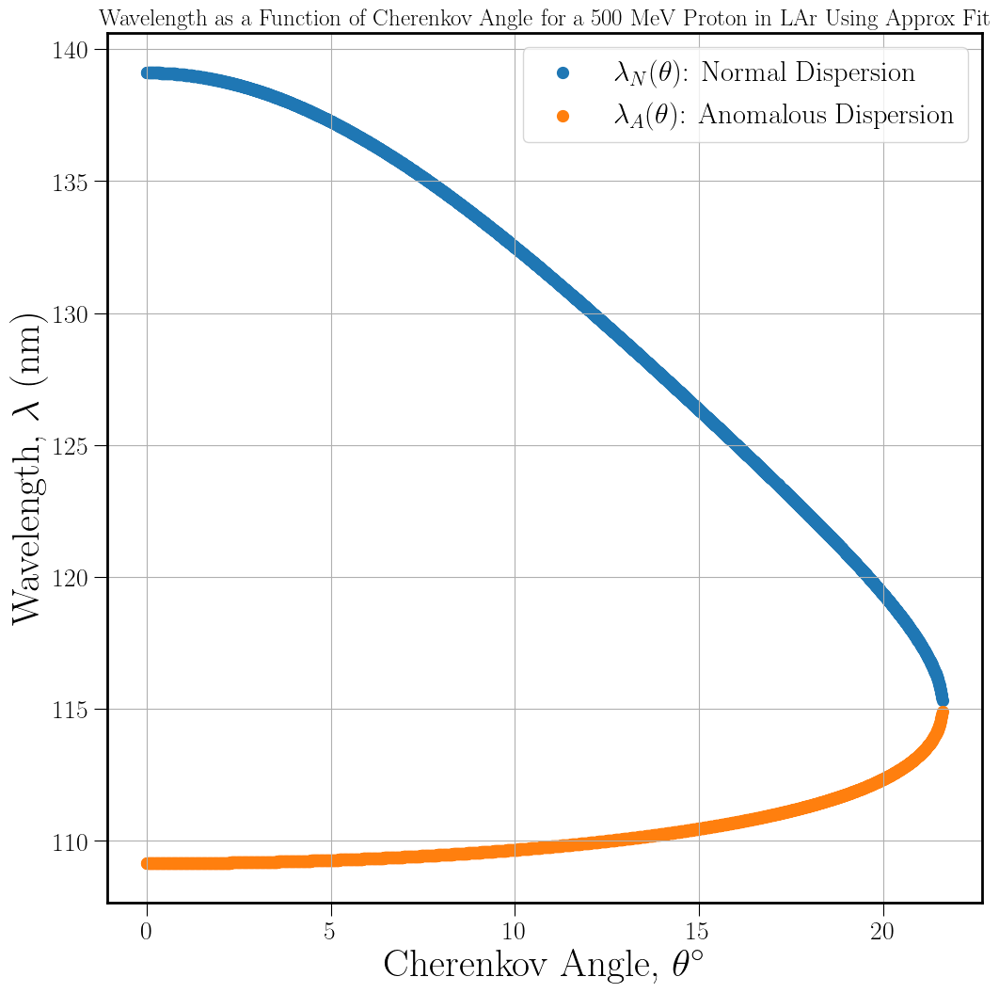

In [106]:
#Angular
#Wavelength Solutions (PVS)

#lambda(theta) when theta changes

# b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])
# lamd = np.linspace(0,700,700)
# n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))

alpha = 1/137 #Fine-structure (EM coupling) constant 

theta = np.linspace(0, np.pi/2, 10000)

b = 0.7579653181328908 #beta for T= 500 MeV

#Wavelength as a function of the angle: lambda(theta)
lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))

#term involving wavelengths: (lamd_uv^-1 - lamd_theta^-1)
lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
lamd_nterm = (((-b*a_pvs*np.cos(theta)) - ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p

func_angp = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_pterm**2)**2/(gamma**2 - lamd_pterm**2))) + ((2*a_0*a_pvs*b) * lamd_pterm * np.abs((gamma**2 + lamd_pterm**2)/(gamma**2 - lamd_pterm**2))) + ((b*a_pvs**2*lamd_pterm**2)/np.abs(gamma**2 - lamd_pterm**2))))
func_angn = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_nterm**2)**2/(gamma**2 - lamd_nterm**2))) + ((2*a_0*a_pvs*b) * lamd_nterm * np.abs((gamma**2 + lamd_nterm**2)/(gamma**2 - lamd_nterm**2))) + ((b*a_pvs**2*lamd_nterm**2)/np.abs(gamma**2 - lamd_nterm**2))))

func_angt = func_angp + func_angn

# print(b, lamd_thetap, lamd_thetan, lamd_pterm, lamd_nterm, func_angp, func_angn, sep='\n')

# print(theta, lamd_thetap) #, lamd_thetan, lamd_pterm, func_angp, func_angn
# print("{}, lamd_thetap= {:.5f}, lamd_thetan = {:.5f}, lamd_pterm  = {}, func_ang= {}".format(b, lamd_thetap, lamd_thetan, lamd_pterm, func_ang))
# lamd_pterm, lamd_nterm
#(0.00021947, 0.00061913), (0.00219235, 0.00077715)

#Plot of lambda vs theta in the LAr medium near Resonance  
# theta = np.linspace(0, np.pi/2, 10000)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

ax.set_title("Wavelength as a Function of Cherenkov Angle for a 500 MeV Proton in LAr Using Approx Fit", fontsize= 18)
ax.scatter(theta*(180/np.pi), lamd_thetap, linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$: Normal Dispersion")
ax.scatter(theta*(180/np.pi), lamd_thetan, linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$: Anomalous Dispersion")

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Cherenkov Angle, $\\theta ^{\circ} $ ",fontsize=30)
ax.set_ylabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
ax.grid()
ax.legend(fontsize=22)

# plt.ylim([0,300])
# plt.xlim([0,30])


# plt.savefig("wavelength_solutions_ourfit.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\2165937760.py:22: RuntimeWarning: invalid value encountered in sqrt
  lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\2165937760.py:23: RuntimeWarning: invalid value encountered in sqrt
  lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))


(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  6.789321534722043,
  227.76644918880726,
  932.306317713878,
  2302.814102679058,
  4522.40557836276,
  7819.086282652897,
  12276.639414263198,
  12534.30341429221,
  18829.765871542342,
  26574.730524393868,
  35638.09229989612,
  45898.634056565184,
  57251.12746202652,
  69598.82618394228,
  82857.03015762063,
  96949.89146573315,
  127369.62672541555,
  160387.2479383333,
  195615.21331981628,
  232735.42025059654,
  271482.2272436821,
  438780.6813707565,
  665834.5127859005,
  903836.3344228064])

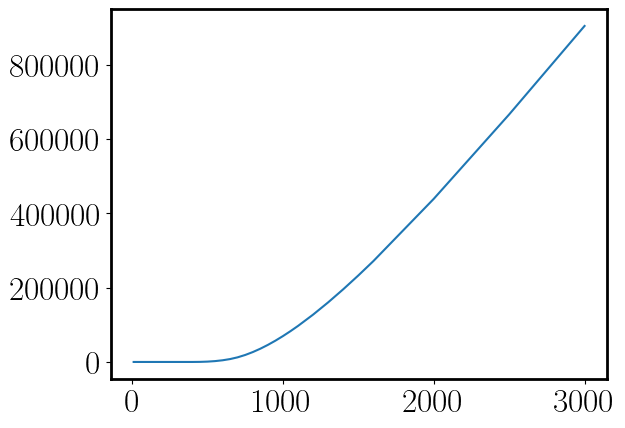

In [107]:
#Calculating the Total Yield (Approx Fit) lmax= 500

# t = 500 #K.E of Proton  in MeV
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
scint = 40000*t*0.275
scintback = np.sqrt(scint)

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# print(beta)
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))

#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

func = lambda wl,b: ((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n_pvs(wl)*n_pvs(wl))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

cerenkovnolist = []

# absorption_avg = 0.0675 #in nm^-1
# dx = 0.1*1e7 #cm -> nm 

# print(beta)

cerenkovfinallist = []
cerenkovtsumpvs500 = []

for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
#     print(j) #OUTPUT
#     print(make_betalist(j))
    mybetalist = make_betalist(j)
    filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
#     print(j, np.shape(filtered_betalist))
#     myxlist = make_xlist(j)
    
#         print(j, filtered_betalist, filtered_xlist) #OUTPUT filtered_betalist, 

  
    for i in filtered_betalist:  #[0:20]
        
        
#         filtered_xlist = myxlist
#         print(filtered_xlist)

         
        if (i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) < 1:
            lmin = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
            lmax = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i + np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
#             print(lmin, lmax, i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) #OUTPUT FOR WAVELENGTH RANGE
        if (i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) >= 1:
            lmin = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
            lmax = 500
#             print(lmin, lmax, i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) #OUTPUT FOR WAVELENGTH RANGE 
        no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(j, no_cerenkov_x[0]*1e7)
        cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err
        cerenkovsum += no_cerenkov_x[0] 
        
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsumpvs500.append(cerenkovsum * 1e6) #conversion factor to standard units
    
# print(t , cerenkovtsumpvs500)    
plt.plot(t, cerenkovtsumpvs500)
# t, beta, cerenkovt1sum500
t , cerenkovtsumpvs500

# make_betalist(500)

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1046843534.py:22: RuntimeWarning: invalid value encountered in sqrt
  lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))


(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  3.809119865559166,
  141.84512602718712,
  618.0532960924485,
  1601.8819493343503,
  3276.4236691888314,
  5874.797302059909,
  9530.477872722122,
  9745.825753245115,
  15059.519693810187,
  21693.67785501751,
  29525.60834206442,
  38442.2074850124,
  48345.90958192621,
  59147.18751203355,
  70768.07916672557,
  83139.00533287614,
  109883.84620286126,
  138952.50416331945,
  169993.0496444537,
  202717.87664312526,
  236887.4971884252,
  384465.0167700162,
  584738.233837692,
  794601.1648555491])

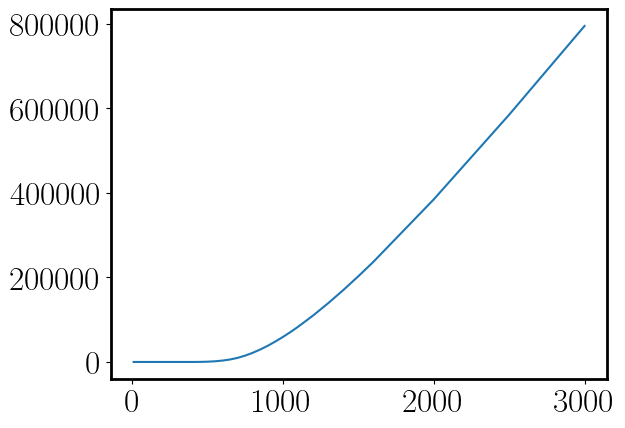

In [113]:
#Calculating the total Cerenkov light (Approx Fit: Reabsorption)
#(with considering absorption upto HWHM of the absorption plot-> treating no cerenkov emission upto respective wavelength i.e lambda_peak = 115.11 nm)

# t = 500 #K.E of Proton  in MeV
# t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([385,400,450,500,600,700,800,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 

mp = 938  #Proton's mass in MeV
#T = 90 K
# {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamdmin = 115.11 
lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))

#Formula: 
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2


integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(100,200,500)   #wavelength of light 

func = lambda wl,b: ((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n_pvs(wl)*n_pvs(wl))))
# funcv = np.vectorize(func)

# print(lamdmin, lamdmax, n2_pvs(120), func(120), beta)

y_list = []

cerenkovnolist = []

# t = np.array([10,20,50,100,200,250,300,400,500]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# n= np.array([0,1,2,3,4,5,6,7,8,9,10])

cerenkovfinallist = []
cerenkovtsumpvs500r = [] 
for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
#     print(j)
#     print(make_betalist(j))
    mybetalist = make_betalist(j)
    filtered_lst = [x for x in mybetalist if x > 0.7046534357]
#     print(filtered_lst)
   
    for i in filtered_lst:  #[0:20]
              
        
        if (i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) < 1:
            lmin1 = ((2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2))))
#         print(lmin, lmax)
            lmin2 = 115.11
            lmin = max(lmin1, lmin2)

            lmax = (2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i + np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2)))
#             print(j, lmin, lmax, i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2))))
        
        if (i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))) >= 1:
            lmin1 = ((2*lamd_uv*((a_0 * i) - 1))/(2 * ((a_0 * i) - 1) + lamd_uv * (a_pvs * i - np.sqrt((a_pvs * i)**2 - 4 * ((a_0 * i) - 1)**2 * gamma**2))))
            lmin2 = 115.11
            lmin = max(lmin1, lmin2)

            lmax = 500 #in nm
# #             print(j, lmin, lmax, i* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2))))
        no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
#         print(no_cerenkov_x[0])
        cerenkovtlist.append(no_cerenkov_x[0]) #indices 0,1 = int,err
        cerenkovsum += no_cerenkov_x[0]
#         print(j, lmin, lmax, i, no_cerenkov_x[0]* 1e6) #* (a_0 + a_pvs*(lamd_uv**-1/(lamd_uv**-2 + gamma**2)))

    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsumpvs500r.append(cerenkovsum * 1e6) #conversion factor to standard units
    
    
plt.plot(t, cerenkovtsumpvs500r)
t, cerenkovtsumpvs500r
    


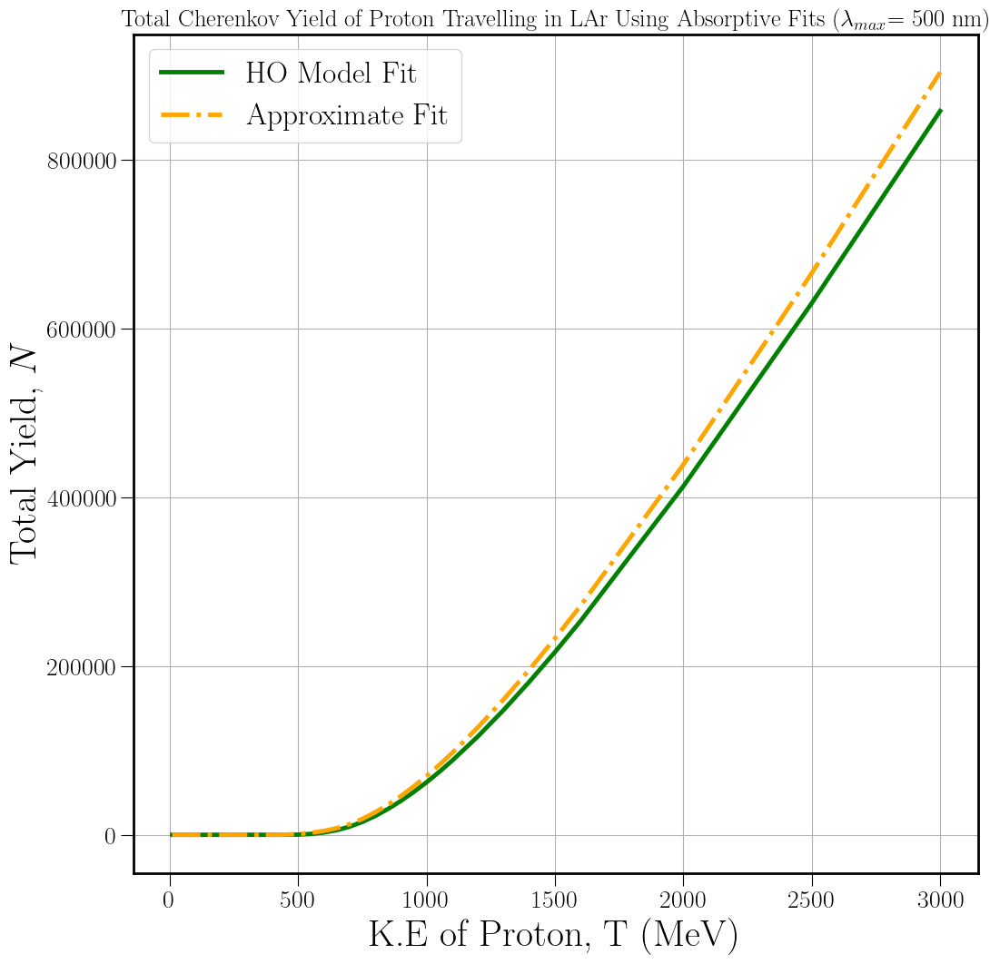

In [114]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title(r"Total Cherenkov Yield of Proton Travelling in LAr Using Absorptive Fits ($\lambda_{max}$= 500 nm)", fontsize=19)

ax.plot(t, cerenkovtsum500, linewidth = 3.5, color='g', label="HO Model Fit") #linestyle= 'dashdot', 
# ax.plot(t, cerenkovtsum500r, linewidth = 3.5, color='deepskyblue', label="Resonance Model Fit (n_uv:cut)") #linestyle= 'dashdot', 

ax.plot(t, cerenkovtsumpvs500, ls= 'dashdot', linewidth = 3.5, color='orange', label= 'Approximate Fit')

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Total Yield, $N$ ',fontsize=30)
ax.grid()
ax.legend(fontsize=24)
# plt.xlim(383,1000)
# plt.ylim(0,15000)
# plt.savefig("integrated_yield_resfit_lamdmax_500nm.jpg", bbox_inches="tight")
# plt.savefig("total_yield_comparison_absorptivefits.jpg", bbox_inches="tight")

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1199950271.py:10: RuntimeWarning: divide by zero encountered in divide
  ax.plot(t, np.divide(cerenkovtsumpvs500,cerenkovtsum500), linewidth = 3.5, color='green')
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1199950271.py:10: RuntimeWarning: invalid value encountered in divide
  ax.plot(t, np.divide(cerenkovtsumpvs500,cerenkovtsum500), linewidth = 3.5, color='green')


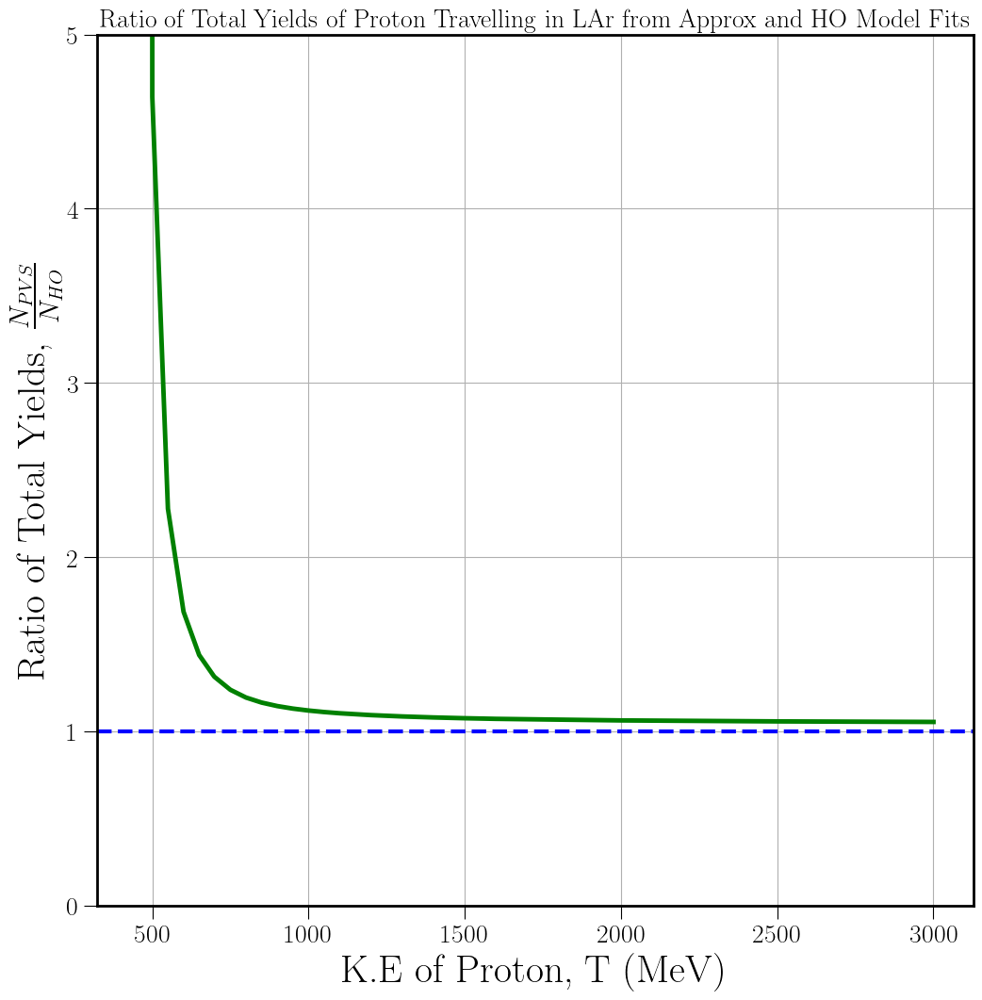

In [115]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Ratio of Total Yields of Proton Travelling in LAr from Approx and HO Model Fits", fontsize=20)
# ax.plot(t, cerenkovtsum, linewidth = 3.5, color='b')
# ax.plot(t, cerenkovtsumpvs, ls='dashdot', linewidth = 3.5, color='orange')

ax.plot(t, np.divide(cerenkovtsumpvs500,cerenkovtsum500), linewidth = 3.5, color='green')

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Ratio of Total Yields, $\\frac{N_{PVS}}{N_{HO}}$',fontsize=30)
ax.grid()
# ax.legend(fontsize=18)
# plt.xlim(440,1600)
plt.ylim(0,5)
plt.axhline(1,ls='--',c='blue',lw=3)

# plt.savefig("ratio_yields_pvsoverres.jpg", bbox_inches="tight")

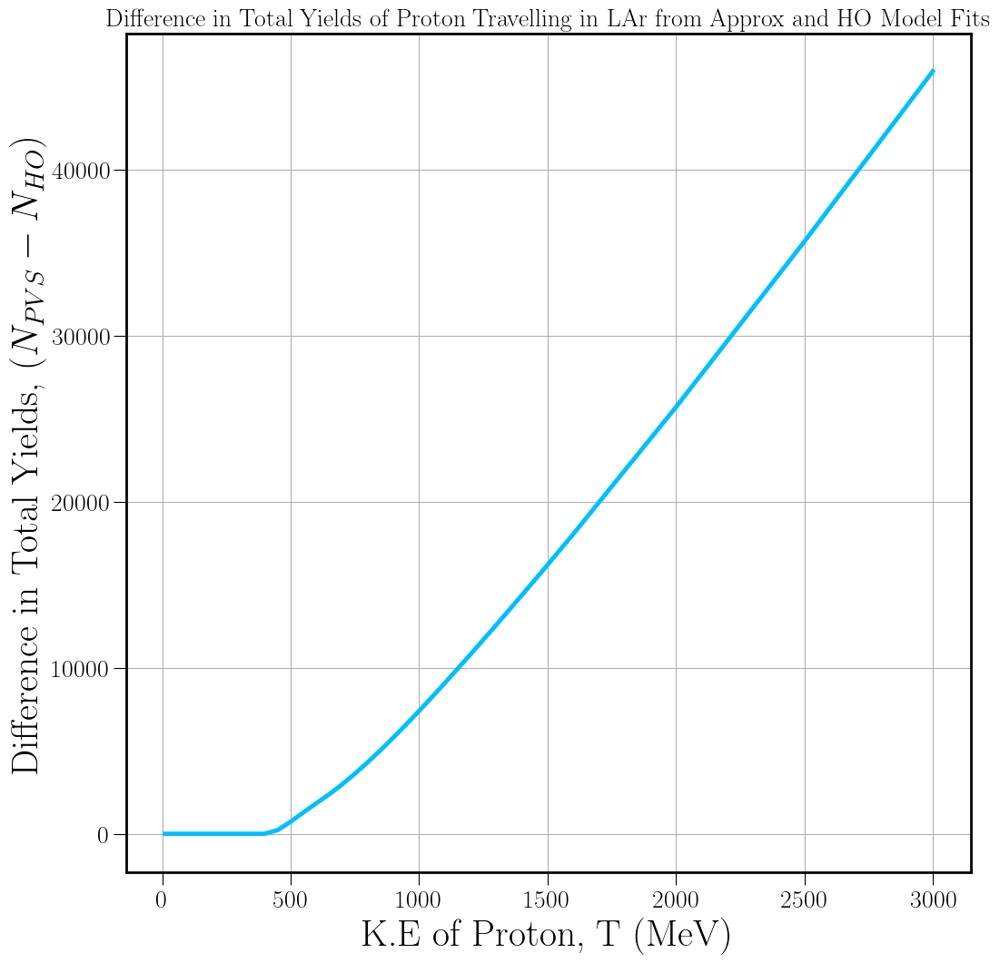

In [116]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Difference in Total Yields of Proton Travelling in LAr from Approx and HO Model Fits", fontsize=20)
# ax.plot(t, cerenkovtsum, linewidth = 3.5, color='b')
# ax.plot(t, cerenkovtsumpvs, ls='dashdot', linewidth = 3.5, color='orange')

ax.plot(t, np.subtract(cerenkovtsumpvs500,cerenkovtsum500), linewidth = 3.5, color='deepskyblue')

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=30)
ax.set_ylabel('Difference in Total Yields, $(N_{PVS} - N_{HO})$',fontsize=30)
ax.grid()
# ax.legend(fontsize=18)
# plt.xlim(440,1600)
# plt.ylim(0,5)
# plt.axhline(1,ls='--',c='blue',lw=3)

# plt.savefig("difference_yields_pvsminusres.jpg", bbox_inches="tight")

0.8198002603953367
111.54265254775818
[  10.     100.     150.     200.     250.     300.     383.96   400.
  450.     500.     550.     600.     650.     697.678  700.     750.
  800.     850.     900.     950.    1000.    1050.    1100.    1200.
 1300.    1400.    1500.    1600.    2000.    2500.    3000.   ] 106.7 106.63638829117868


(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.20344588771827354,
  187.5800198280814,
  600.2982260605042,
  1353.9351206004708,
  2526.955963831083,
  4188.862132311367,
  8262.027150986527,
  9243.989891932235,
  12769.47922555319,
  17057.241429853348,
  22192.75382353892,
  28284.273675048404,
  35478.203768791405,
  43581.349868713274,
  44012.20481622169,
  54095.310171677986,
  65612.99104180261,
  78426.18558992381,
  92412.43088366953,
  107463.41271429064,
  123483.1551641049,
  140385.88629581057,
  158095.38102869998,
  195667.75484038395,
  235731.32615399722,
  277904.38758270076,
  321872.95177502773,
  367377.5608339084,
  560897.6677692791,
  819242.2364818

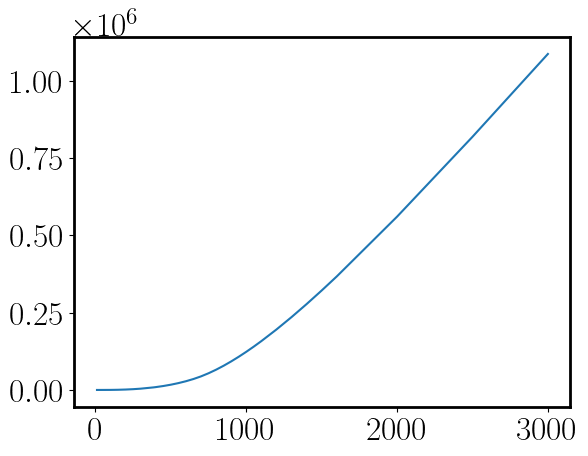

In [189]:
#Calculating the total Cerenkov light (Grace Fit)

t = 700 #K.E of Proton  in MeV
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
print(beta)
mp = 938  #Proton's mass in MeV
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamdmin = 106.7 #UV-Resonant wavelength in nm 
lamdmax = np.sqrt((a_0 - beta**(-2))/((a_0 - beta**(-2) + a_uv))) * lamd_uv

print(lamdmax)

integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 
# lamd = np.linspace(100,200,500)   #wavelength of light 
n2_grace = lambda wl: (a_0g + ((a_uvg * wl ** 2) / (wl**2-lamd_uv**2)))  #(ignoring the 3rd term) + (a_ir*lamd**2/(lamd**2-lamd_ir**2)  #Refractive index squared
# # for index in lamd:

func = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_grace(wl)))))

# print(lamdmin, lamdmax, n2_grace(120), func(120), beta)

y_list = []

cerenkovnolist = []

# 0.8192319205190405
# 697.6784525083162

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

cerenkovfinallist = []
cerenkovtsum500g = []

# dx = 0.1 #in cm 
      
for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
#     print(j) #OUTPUT
#     print(make_betalist(j))
    mybetalist = make_betalist(j)
#     filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
#     print(j, np.shape(filtered_betalist))#, filtered_betalist)
#     myxlist = make_xlist(j)
#     print(j, filtered_betalist, filtered_xlist) #OUTPUT filtered_betalist, 

  
    for i in mybetalist:  #[0:20]    for i in make_betalist(j):
        
        if i < 0.8183502: 
 
            lmax = min(np.sqrt((a_0g - i**(-2))/((a_0g - i**(-2) + a_uvg))) * lamd_uv, 500) #908.3
            lmin = 106.7 #in nm
        
        else: 
            # lmax= 908.3
            lmax= 500 # To match finite detector acceptance
            lmin = 106.7

        no_cerenkov_x = quad(func, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
    #     print(no_cerenkov_x[0])
        cerenkovtlist.append(no_cerenkov_x[0])
        cerenkovsum += no_cerenkov_x[0]
#         print(cerenkovsum * 1e6)
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsum500g.append(cerenkovsum * 1e6)

print(t,lmin,lmax)
    
plt.plot(t, cerenkovtsum500g)
t, cerenkovtsum500g

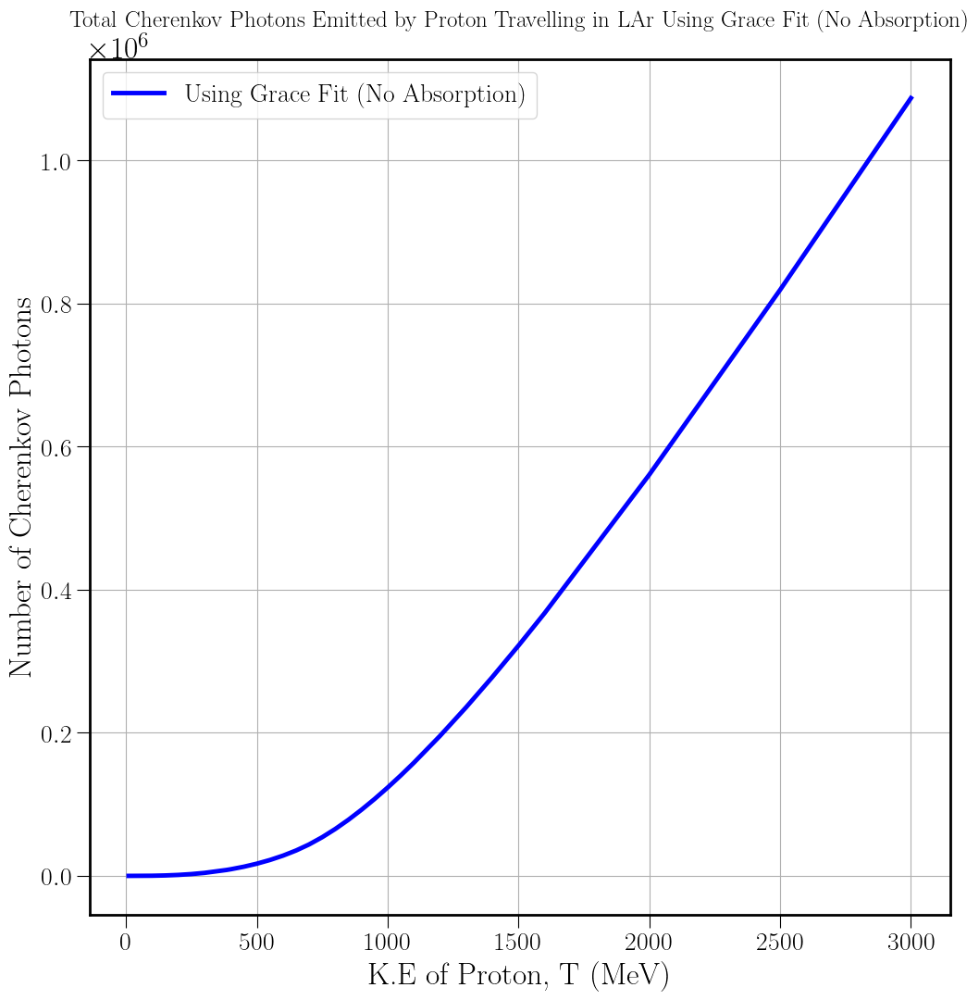

In [190]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Total Cherenkov Photons Emitted by Proton Travelling in LAr Using Grace Fit (No Absorption)", fontsize=18)
ax.plot(t, cerenkovtsum500g, linewidth = 3.5, color='b', label='Using Grace Fit (No Absorption)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=24)
ax.set_ylabel('Number of Cherenkov Photons',fontsize=24)
ax.grid()
ax.legend(fontsize=20)
# plt.xlim(0,600)
# plt.ylim(0,20000)
# plt.savefig("total_cerenkov_photon_Grace.jpg", bbox_inches="tight")
# plt.savefig("total_cerenkov_photon_Grace_hight.jpg", bbox_inches="tight")

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_12440\1986482219.py:23: RuntimeWarning: invalid value encountered in sqrt
  lamdmax = lamd_uv * np.sqrt(((a_0b - 3)*(beta**(-2)-1) + 3*a_0b)/(3*(a_0b + a_uvb) - (beta**(-2)-1)*(3-a_0b-a_uvb)))


[108.81209626 110.45412952 111.61055703 113.00514094 114.71456377
 116.85314353 121.95389095 123.24844077 128.32877259 135.89296263
 148.40884918 173.53297348 257.6313258           nan          nan
          nan          nan          nan  42.43798845  56.22985057
  64.00860624  69.12949477  72.78380469  77.67314521  80.8003793
  82.97163156  84.56473411  85.78125759  88.67461054  90.38049709
  91.28830357]


(array([  10.   ,  100.   ,  150.   ,  200.   ,  250.   ,  300.   ,
         383.96 ,  400.   ,  450.   ,  500.   ,  550.   ,  600.   ,
         650.   ,  697.678,  700.   ,  750.   ,  800.   ,  850.   ,
         900.   ,  950.   , 1000.   , 1050.   , 1100.   , 1200.   ,
        1300.   , 1400.   , 1500.   , 1600.   , 2000.   , 2500.   ,
        3000.   ]),
 [0.46839347861522246,
  121.3893343036351,
  373.34038776245546,
  828.3114707229939,
  1535.142013718733,
  2540.2176707621816,
  5029.122601907805,
  5635.1661594229745,
  7831.120669233973,
  10546.074903238543,
  13867.485899730378,
  17917.96997847722,
  22891.771937225003,
  28834.383730013702,
  29160.420928751893,
  36975.95468309977,
  46206.07584842333,
  56714.06214976576,
  68379.68797971465,
  81096.63531867761,
  94770.4092878557,
  109316.95840072741,
  124661.33632617195,
  157481.02581546985,
  192768.753951773,
  230149.01281215454,
  269313.2525904166,
  310005.7301238749,
  484262.4946780668,
  718620.3112295597

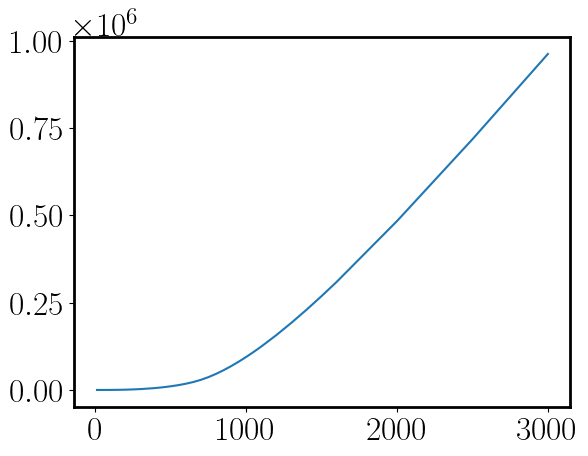

In [201]:
#Babicz:

#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#Calculating the total Cerenkov light 

# t = 500 #K.E of Proton  in MeV
# t = np.array([300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000.... 10,50,100,150,200,250,
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000


mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 

lamdmin = 106.7 #UV-Resonant wavelength in nm 
lamdmax = lamd_uv * np.sqrt(((a_0b - 3)*(beta**(-2)-1) + 3*a_0b)/(3*(a_0b + a_uvb) - (beta**(-2)-1)*(3-a_0b-a_uvb))) 

print(lamdmax)

integral = []
alpha = 1/137 #Fine-structure (EM coupling) constant 
# lamd = np.linspace(100,200,500)   #wavelength of light 

# x = (a_0 + (a_uv*lamd**2/(lamd**2-lamd_uv**2)) + (a_ir*lamd**2/(lamd**2-lamd_ir**2))) #(ignoring the 3rd term)
# n_babics = np.sqrt(1+(3*x/(3-x)))
# n2_babics = (1+(3*x/(3-x)))
n2_babics = lambda wl: (1 + ((3 * (a_0b + (a_uvb*wl**2/(wl**2-lamd_uv**2)) + (a_irb*wl**2/(wl**2-lamd_ir**2)))/(3 - (a_0b + (a_uvb*wl**2/(wl**2-lamd_uv**2)) + (a_irb*wl**2/(wl**2-lamd_ir**2)))))))

func2 = lambda wl,b: (((2 * np.pi * alpha) / (wl**2 )) * (1- (1/(b**2 * n2_babics(wl)))))
# print(func(130,0.78))
# print(lamdmin, lamdmax, n2_babics, beta) #, func(120,0.78)

y_list = []

cerenkovnolist = []

cerenkovfinallist = []
cerenkovtsum500b = []

# dx = 0.1 #in cm 
      
for j in t: 
    cerenkovtlist = []
    cerenkovsum = 0
#     print(j) #OUTPUT
#     print(make_betalist(j))
    mybetalist = make_betalist(j)
    filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
#     print(j, np.shape(filtered_betalist))#, filtered_betalist)
#     myxlist = make_xlist(j)
#     print(j, filtered_betalist, filtered_xlist) #OUTPUT filtered_betalist, 

  
    for i in mybetalist:  #[0:20]    for i in make_betalist(j):
        
        if i < 0.8139732:
            
            lmax = min((lamd_uv * np.sqrt(((a_0b - 3) * (i**(-2) - 1) + 3 * a_0b) / ((3 * (a_0b + a_uvb)) - (i**(-2) - 1) * (3 - a_0b - a_uvb)))), 500) #908.3 
            lmin = 108.65 #in nm
                
        else: 
            # lmax= 908.3
            lmax= 500 #detector acceptance
            lmin = 108.65
                       
#         print(lmax)
#         print(func())
        
        no_cerenkov_x = quad(func2, lmin, lmax, args=(i,)) #Integral gives no of Cerenkov photons/nm 
    #     print(no_cerenkov_x[0])
        cerenkovtlist.append(no_cerenkov_x[0])
        cerenkovsum += no_cerenkov_x[0]
#         print(cerenkovsum * 1e6)
    cerenkovfinallist.append(cerenkovtlist)
    cerenkovtsum500b.append(cerenkovsum * 1e6)
#     print(cerenkovt2sum)
    
plt.plot(t, cerenkovtsum500b)
t, cerenkovtsum500b

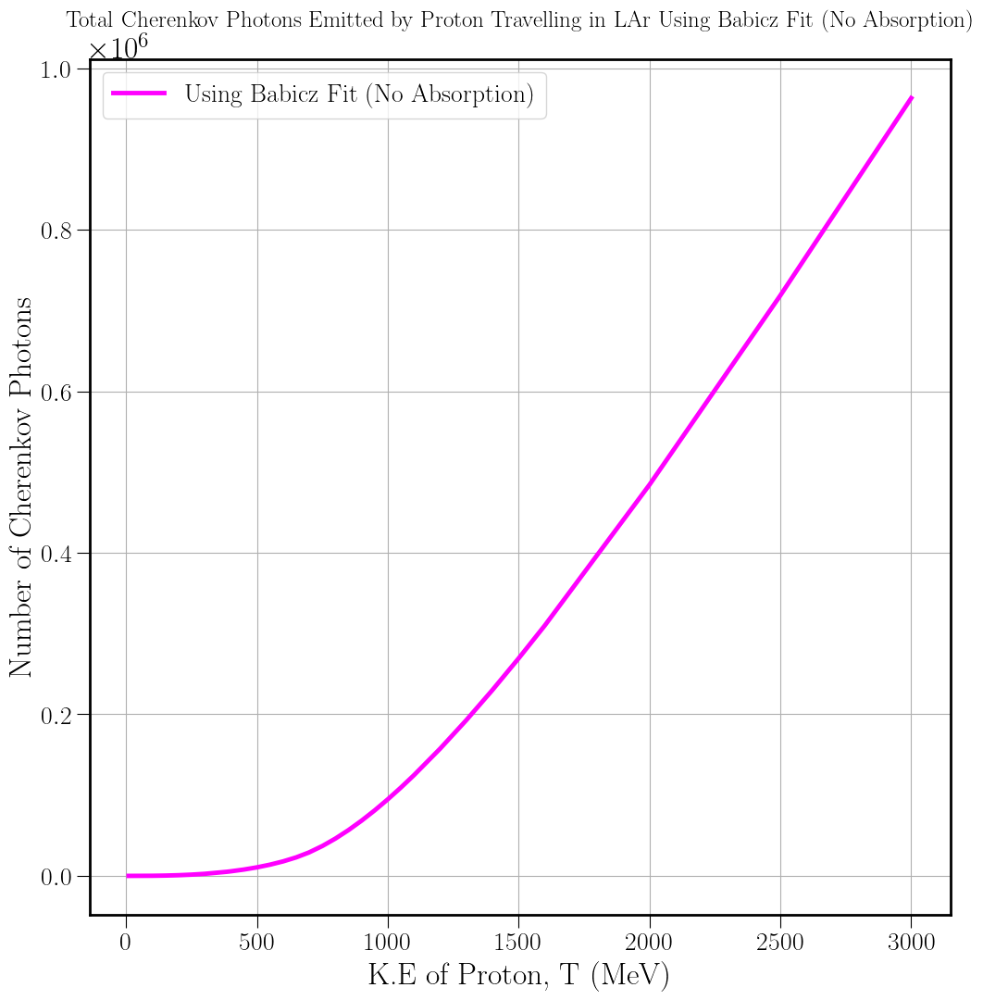

In [202]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Total Cherenkov Photons Emitted by Proton Travelling in LAr Using Babicz Fit (No Absorption)", fontsize=18)
ax.plot(t, cerenkovtsum500b, linewidth = 3.5, color='magenta', label='Using Babicz Fit (No Absorption)')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=24)
ax.set_ylabel('Number of Cherenkov Photons',fontsize=24)
ax.grid()
ax.legend(fontsize=20)
# plt.xlim(0,600)
# plt.ylim(0,20000)
# plt.savefig("total_cerenkov_photon_Babics.jpg", bbox_inches="tight")
# plt.savefig("total_cerenkov_photon_Babics_hight.jpg", bbox_inches="tight")

In [203]:
#Babics beta limit

betamaxb = np.sqrt((3-a_0-a_uv)/(3+2*a_0+2*a_uv))
print(betamaxb)

tmaxb = ((1/np.sqrt(1-betamaxb**2)) - 1) * mp 
print(tmaxb)

# lamd_ir = 908.3 #lambda_IR = 908.3 nm
# betab = 0.814488756
betab = 0.8139732
lamdmaxb = lamd_uv * np.sqrt(((a_0 - 3)*(betab**(-2)-1) + 3*a_0)/(3*(a_0 + a_uv) - (betab**(-2)-1)*(3-a_0-a_uv))) 
print(lamdmaxb)

0.8144887561015962
678.7414726069566
908.2812109932481


(-10000.0, 400000.0)

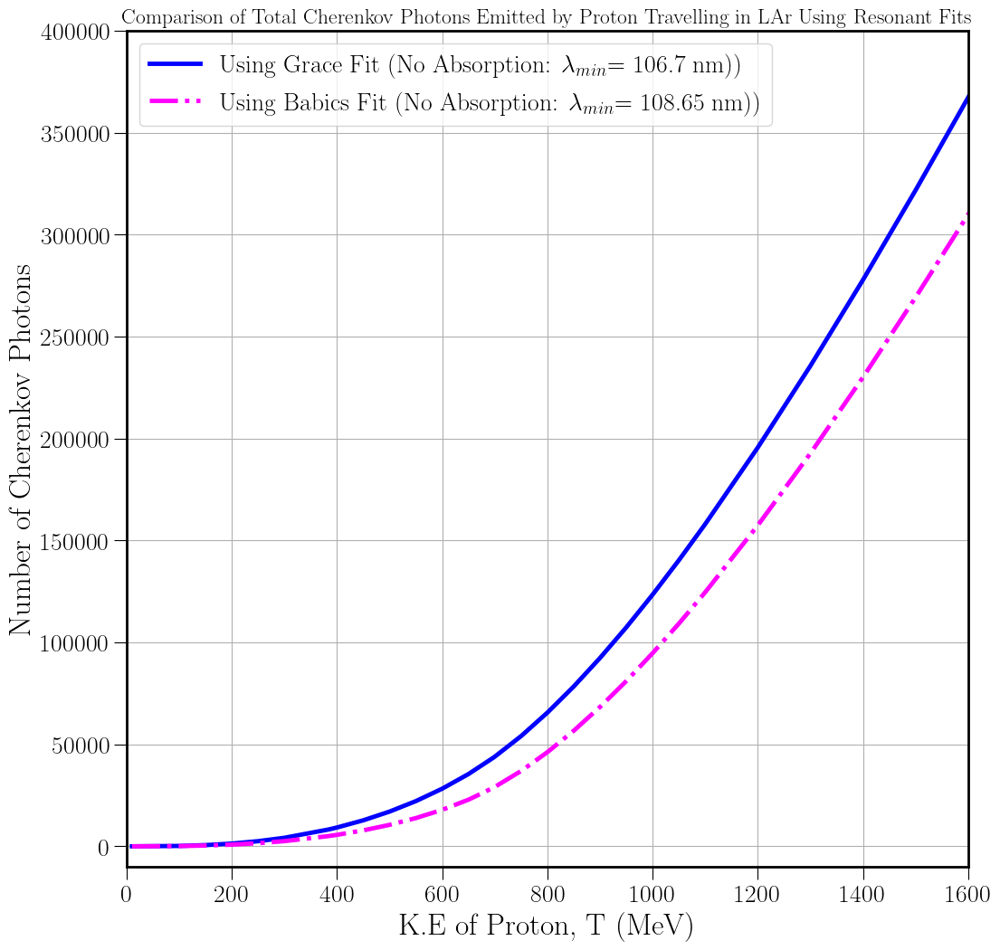

In [248]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Comparison of Total Cherenkov Photons Emitted by Proton Travelling in LAr Using Resonant Fits", fontsize=17)
ax.plot(t, cerenkovtsum500g, linewidth = 3.5, color='b', label='Using Grace Fit (No Absorption: $\lambda_{min}$= 106.7 nm))')
ax.plot(t, cerenkovtsum500b, linewidth = 3.5, ls= 'dashdot', color='magenta', label='Using Babics Fit (No Absorption: $\lambda_{min}$= 108.65 nm))')
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=24)
ax.set_ylabel('Number of Cherenkov Photons',fontsize=24)
ax.grid()
ax.legend(fontsize=20)

plt.xlim(0,1600)
plt.ylim(-1e4,4e5)

# plt.savefig("total_cerenkov_photon_comparison.jpg", bbox_inches="tight")
# plt.savefig("total_cerenkov_photon_comparison_babiczvsgrace_hight.jpg", bbox_inches="tight") #_zoom

(-10000.0, 400000.0)

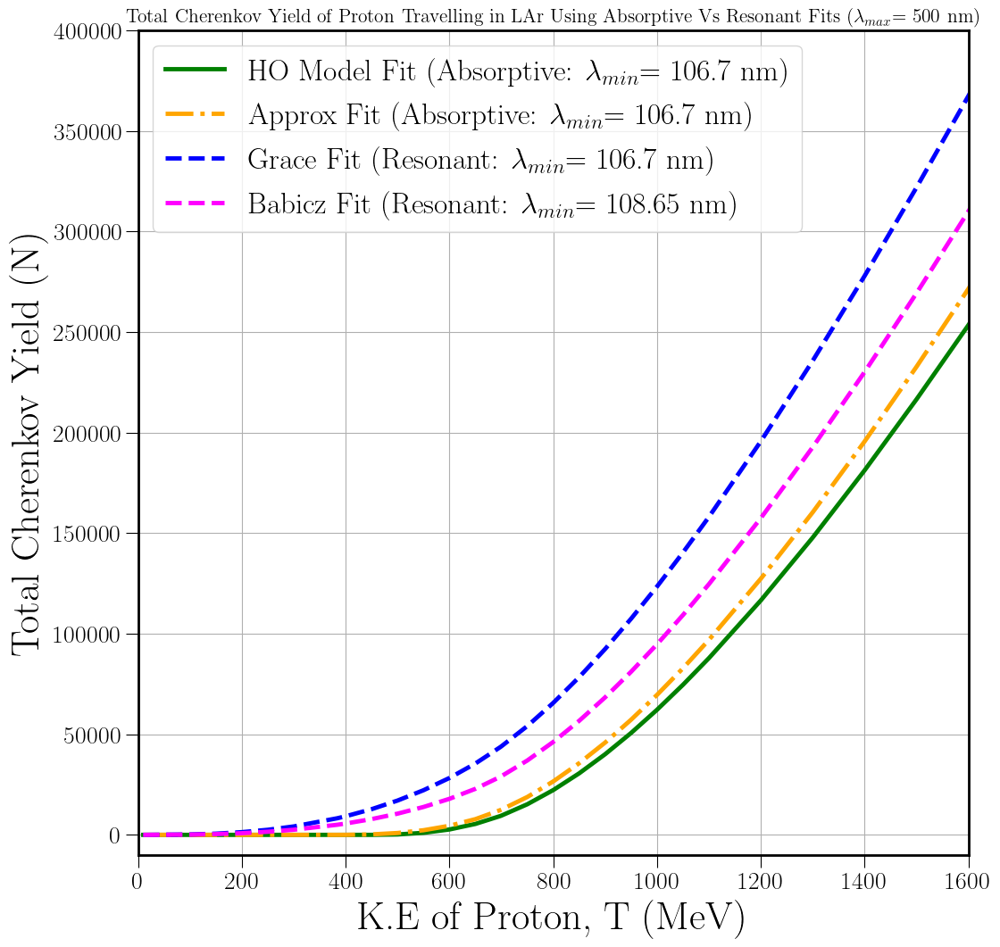

In [274]:
#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
# ax.set_title("Comparison of Total Cherenkov Photons Emitted by Proton Travelling in LAr Using Our Refractive Index Fit and Others ", fontsize=17)

ax.set_title(r"Total Cherenkov Yield of Proton Travelling in LAr Using Absorptive Vs Resonant Fits ($\lambda_{max}$= 500 nm)", fontsize=15.5)

ax.plot(t, cerenkovtsum500, linewidth = 3.5, color='g', label="HO Model Fit (Absorptive: $\lambda_{min}$= 106.7 nm)") #linestyle= 'dashdot', 
# ax.plot(t, cerenkovtsum500r, linewidth = 3.5, color='deepskyblue', label="HO Model Fit (n_uv:cut)") #linestyle= 'dashdot', 

ax.plot(t, cerenkovtsumpvs500, ls= 'dashdot', linewidth = 3.5, color='orange', label= 'Approx Fit (Absorptive: $\lambda_{min}$= 106.7 nm)')
# ax.plot(t, cerenkovtsumpvs500r, ls= 'dashdot', linewidth = 3.5, color='hotpink', label= 'Approximate Fit (Reabsorption)')

# ax.plot(t, cerenkovt1sum, linewidth = 3.5, color='green', label='This Work (Absorptive Fit)') #color='green'
# ax.plot(t, cerenkovt2sum, linewidth = 3.5, ls= ':', color='blueviolet', label="Reabsorption with $\\lambda_{max}$ = 500 nm")

ax.plot(t, cerenkovtsum500g, linewidth = 3.5, ls= 'dashed',color='b', label='Grace Fit (Resonant: $\lambda_{min}$= 106.7 nm)')
ax.plot(t, cerenkovtsum500b, linewidth = 3.5, ls= 'dashed', color='magenta', label='Babicz Fit (Resonant: $\lambda_{min}$= 108.65 nm)') #dashdot


ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)",fontsize=32)
ax.set_ylabel('Total Cherenkov Yield (N)',fontsize=32)
ax.grid()
ax.legend(fontsize=24)

plt.xlim(0,1600)
plt.ylim(-1e4, 4e5) #1
# plt.ylim(-1e4, 3.3e5) #2

# plt.savefig("total_cerenkov_photon_comparison_absorptionvsnoabsorption.jpg", bbox_inches="tight")
# plt.savefig("total_cerenkov_photon_comparison_absorptive_vs_resonant_fits_hight.jpg", bbox_inches="tight") #_zoom
# plt.savefig("total_cerenkov_photon_comparison_absorptive_vs_resonant_fits2_hight.jpg", bbox_inches="tight") #_zoom

# Wavelength Solutions

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\648764537.py:16: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\648764537.py:17: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\648764537.py:20: RuntimeWarning: invalid value encountered in sqrt
  lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lam

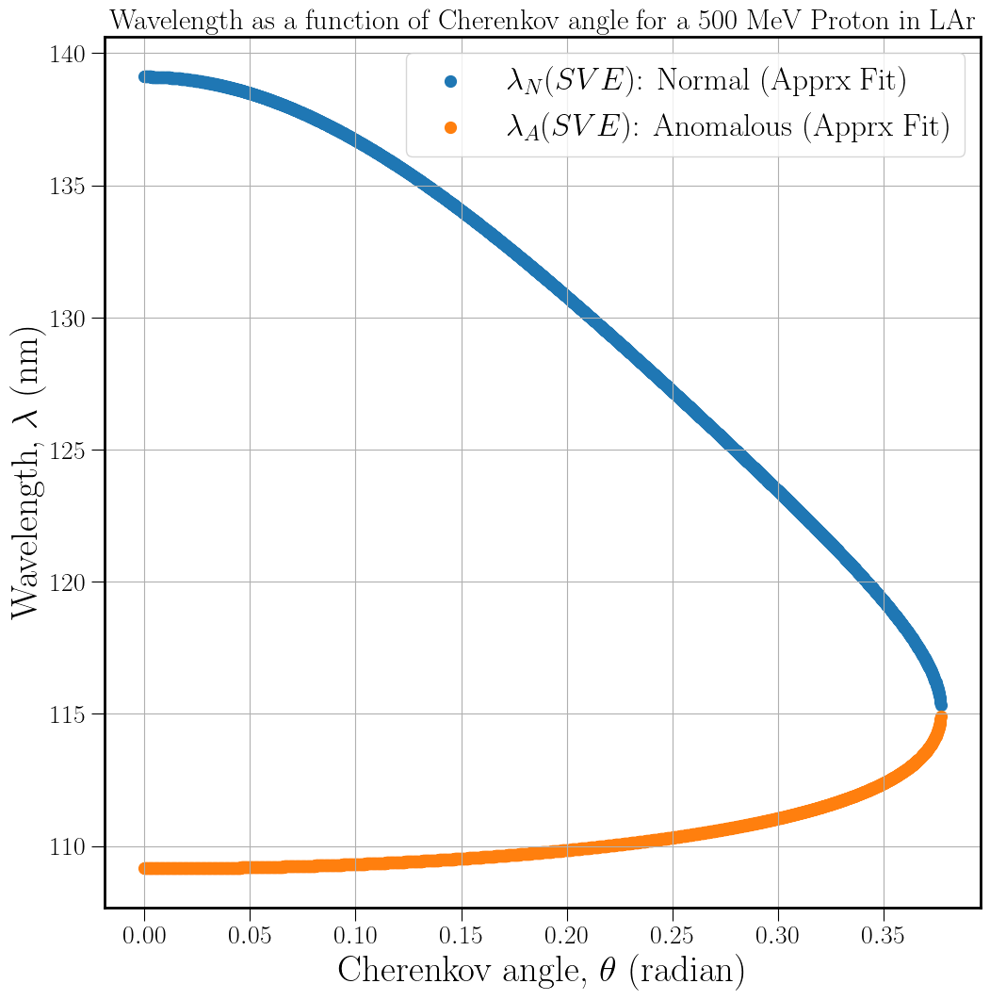

In [35]:
#Angular
#Wavelength Solutions (PVS)

#lambda(theta) when theta changes

# b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])
lamd = np.linspace(90,700,10000)
# n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))


theta = np.linspace(0, np.pi/2, 10000)

b = 0.7579653181328908 #beta

#Wavelength as a function of the angle: lambda(theta)
lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))

#term involving wavelengths: (lamd_uv^-1 - lamd_theta^-1)
lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
lamd_nterm = (((-b*a_pvs*np.cos(theta)) - ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p

func_angp = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_pterm**2)**2/(gamma**2 - lamd_pterm**2))) + ((2*a_0*a_pvs*b) * lamd_pterm * np.abs((gamma**2 + lamd_pterm**2)/(gamma**2 - lamd_pterm**2))) + ((b*a_pvs**2*lamd_pterm**2)/np.abs(gamma**2 - lamd_pterm**2))))
func_angn = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_nterm**2)**2/(gamma**2 - lamd_nterm**2))) + ((2*a_0*a_pvs*b) * lamd_nterm * np.abs((gamma**2 + lamd_nterm**2)/(gamma**2 - lamd_nterm**2))) + ((b*a_pvs**2*lamd_nterm**2)/np.abs(gamma**2 - lamd_nterm**2))))

func_angt = func_angp + func_angn

# print(b, lamd_thetap, lamd_thetan, lamd_pterm, lamd_nterm, func_angp, func_angn, sep='\n')

# print(theta, lamd_thetap) #, lamd_thetan, lamd_pterm, func_angp, func_angn
# print("{}, lamd_thetap= {:.5f}, lamd_thetan = {:.5f}, lamd_pterm  = {}, func_ang= {}".format(b, lamd_thetap, lamd_thetan, lamd_pterm, func_ang))
# lamd_pterm, lamd_nterm
#(0.00021947, 0.00061913), (0.00219235, 0.00077715)

#Plot of lambda vs theta in the LAr medium near Resonance  
# theta = np.linspace(0, np.pi/2, 2000)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

ax.set_title("Wavelength as a function of Cherenkov angle for a 500 MeV Proton in LAr", fontsize= 22)
ax.scatter(theta, lamd_thetap, linewidth = 3.5, label= "$\\lambda_{N}(SVE)$: Normal (Apprx Fit)")
ax.scatter(theta, lamd_thetan, linewidth = 3.5, label= "$\\lambda_{A}(SVE)$: Anomalous (Apprx Fit)")

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Cherenkov angle, $\\theta$ (radian)",fontsize=28)
ax.set_ylabel("Wavelength, $\\lambda$ (nm)",fontsize=28)
ax.grid()
ax.legend(fontsize=24)

# plt.ylim([0,300])
# plt.xlim([0,30])


# plt.savefig("wavelength_solutions_ourfit.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.81445258698903, cos_ang_min= 0.9024759697721595, cos_ang_max= 1


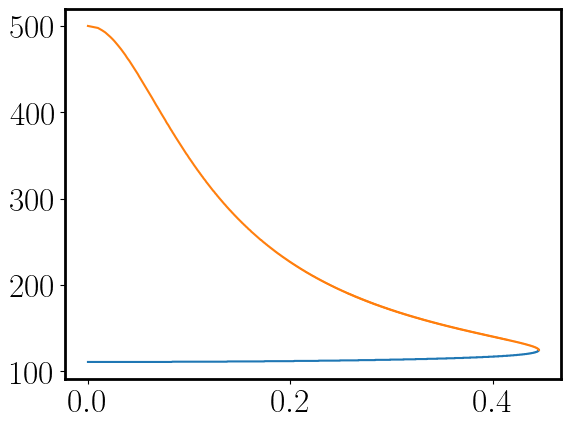

In [36]:
# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 678.6
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

#     funclamd = n_jacksonr - y

#     idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminrt = []
lamdmaxrt = []
    
# t = np.array([450, 500, 600, 700, 800, 900, 1000]) #K>E in MeV 
# mp = 938  #Proton's mass in MeV
# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278


# for i in beta: 

cos_ang_min = 1/(i * n_peakr)
cos_ang_max = min(1/(i * n_asymtoter), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_max= {}".format(i, cos_ang_min, cos_ang_max))
x_all = np.linspace(cos_ang_min, cos_ang_maxa, 2000)



for x in x_all: 
    
    if x >= cos_ang_min and x <= cos_ang_maxa:
        
        y= 1/(i*x)
        y = np.linspace(y,y,2000)   #wavelength of light 
        # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    
        if 1/(i*x) >= n_peakr:
            lmin = lamd_peakr
            lmax = lamd_peakr
            
        if n_500 < 1/(i*x) < n_peakr:   
            lmin = lamd[min(idx)]
            lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
        if n_uvr < 1/(i*x) <= n_500:
            lmin = max(lamd[min(idx)], 106.67)
            lmax = 500            
    
        lamdminrt.append(lmin)
        lamdmaxrt.append(lmax)
    
    
plt.plot(np.arccos(x_all), lamdminrt)
plt.plot(np.arccos(x_all), lamdmaxrt)



K.E= [ 450  500  600  700  800  900 1000], beta= [0.73709191 0.75796532 0.79249149 0.81980026 0.8418569  0.85997431
 0.87506571]
n_uv = 1.10232, n_peak = 1.3605, n_500 = 1.2278, n_asymtote = 1.222558964716
beta= 0.7370919123190173, cos_ang_min= 0.9971943471253918, cos_ang_maxA= 1
theta_range= [0.07492617 0.07492243 0.07491868 ... 0.00105942 0.00074912 0.        ]
beta= 0.7579653181328908, cos_ang_min= 0.969732876547658, cos_ang_maxA= 1
theta_range= [0.24666192 0.24664952 0.24663712 ... 0.00347967 0.00246049 0.        ]
beta= 0.7924914946784183, cos_ang_min= 0.9274848919036427, cos_ang_maxA= 1
theta_range= [0.38316803 0.38314863 0.38312923 ... 0.005386   0.00380848 0.        ]
beta= 0.8198002603953367, cos_ang_min= 0.8965889909841142, cos_ang_maxA= 1
theta_range= [0.45879006 0.45876671 0.45874335 ... 0.00643185 0.004548   0.        ]
beta= 0.8418569002610763, cos_ang_min= 0.8730983710514503, cos_ang_maxA= 1
theta_range= [0.50927466 0.50924863 0.5092226  ... 0.00712502 0.00503815 0.     

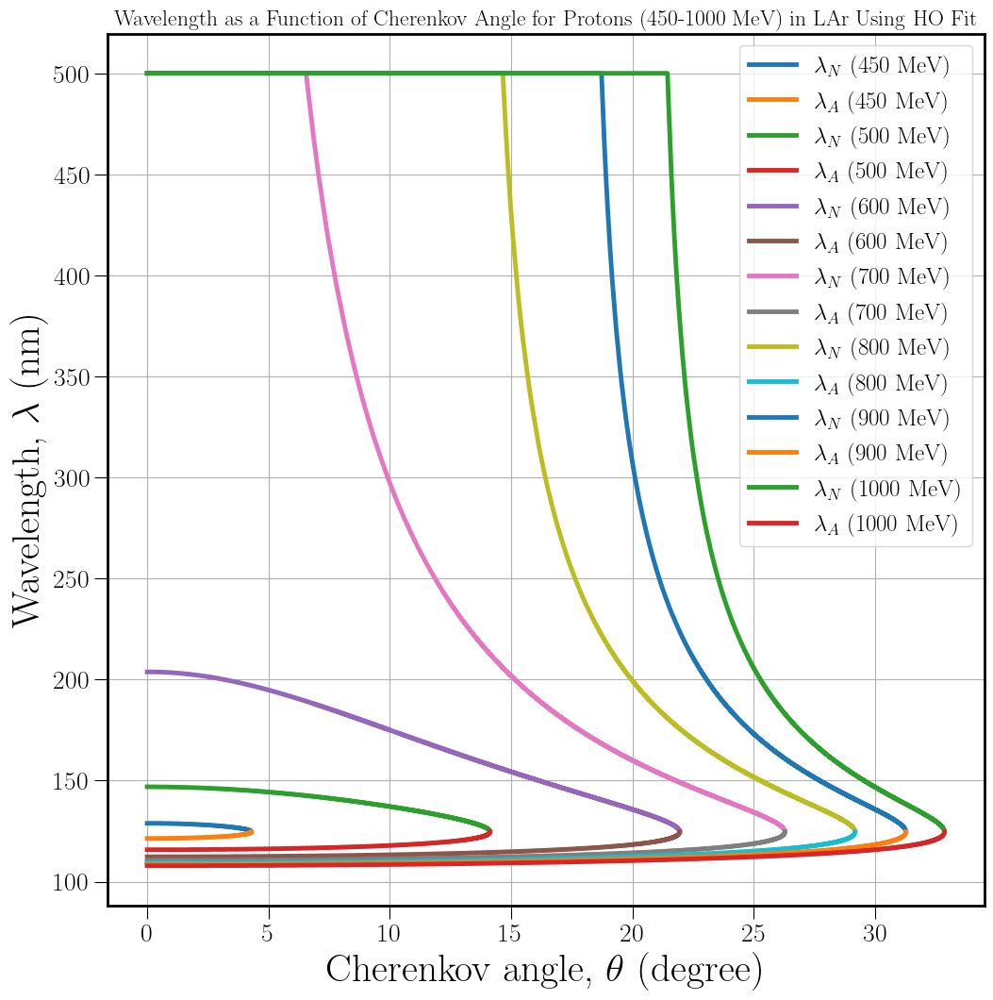

In [42]:
# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
# t = 800
# dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV

# i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 10000)
x_all = np.linspace(0, 1, 10000)
x = np.cos(theta)

lamd = np.linspace(90,700,10000)


n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

#     funclamd = n_jacksonr - y

#     idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


lamd_alist = []
lamd_nlist = []
    
t = np.array([450, 500, 600, 700, 800, 900, 1000]) #K>E in MeV 
# t = np.array([500,600]) #K>E in MeV 
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
print("K.E= {}, beta= {}".format(t, i))

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

print("n_uv = {}, n_peak = {}, n_500 = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))


fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

ax.set_title(r"Wavelength as a Function of Cherenkov Angle for Protons (450-1000 MeV) in LAr Using HO Fit", fontsize=17)
# ax.set_title(r"Normal Cherenkov Wavelength Solution for Protons (450-1000 MeV) in LAr Using HO Fit", fontsize=18)
# ax.set_title(r"Anomalous Cherenkov Wavelength Solution for Protons (450-1000 MeV) in LAr Using HO Fit", fontsize=18)


for j in t: 

    i  = np.sqrt(1 - (1/(1 + j/mp)**2)) #Relativistic Approach 

    cos_ang_min = 1/(i * n_peakr)
    cos_ang_max = min(1/(i * n_asymtoter), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

    cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
    cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

    print("beta= {}, cos_ang_min= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxa))
    x_all = np.linspace(cos_ang_min, cos_ang_maxa, 10000)
    
    print("theta_range= {}".format(np.arccos(x_all)))
    
    lamdminrts = []
    lamdmaxrts = []


    for x in x_all: 
    
        if x >= cos_ang_min and x <= cos_ang_maxa:

            y= 1/(i*x)
            y = np.linspace(y,y,10000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
            # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))


            if 1/(i*x) >= n_peakr:
                lmin = lamd_peakr
                lmax = lamd_peakr

            if n_500 < 1/(i*x) < n_peakr:   
                lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

            if n_uvr < 1/(i*x) <= n_500:
                lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            

        lamdminrts.append(lmin)
        lamdmaxrts.append(lmax)
        
    lamd_alist.append(lamdminrts) #normal
    lamd_nlist.append(lamdmaxrts) #anomalous
    
    # plt.plot(np.arccos(x_all)*(180/np.pi), lamdminrts) #in degrees
    # plt.plot(np.arccos(x_all)*(180/np.pi), lamdmaxrts) #in degrees

    
    ax.plot(np.arccos(x_all)*(180/np.pi), lamdmaxrts, linewidth = 3.5, label= r"$\lambda_N$ ({} MeV)".format(j)) # {} MeV".format(i)) #in degrees
    ax.plot(np.arccos(x_all)*(180/np.pi), lamdminrts, linewidth = 3.5, label= r"$\lambda_A$ ({} MeV)".format(j)) # {} MeV".format(i)) #in degrees


    ax.tick_params(axis='both',which='major',labelsize=20,length=10)

    ax.set_xlabel("Cherenkov angle, $\\theta$ (degree)",fontsize=30)
    ax.set_ylabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
    ax.grid()
    ax.legend(loc='best',fontsize=18) #loc='best' ,framealpha=None,shadow=True

    # plt.show()

# plt.savefig("lambda_r_vs_theta_HO_allT.jpg", bbox_inches="tight")

# plt.savefig("lambda_norm_r_vs_theta_HO_allT_highres_dth10k.jpg", bbox_inches="tight")
# plt.savefig("lambda_anom_r_vs_theta_HO_allT_highres_dth10k.jpg", bbox_inches="tight")


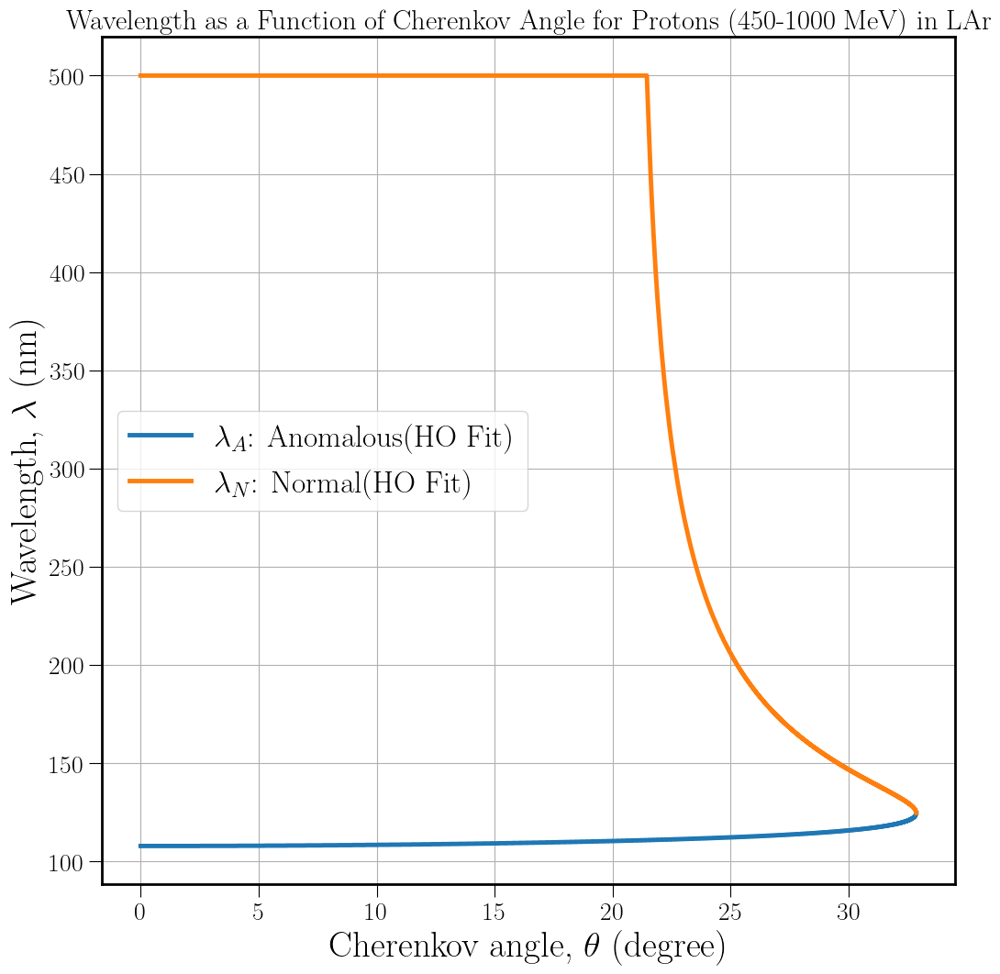

In [43]:
fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

ax.set_title(r"Wavelength as a Function of Cherenkov Angle for Protons (450-1000 MeV) in LAr", fontsize=22)

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.plot(np.arccos(x_all)*(180/np.pi), lamdminrts, linewidth = 3.5, label= "$\\lambda_{A}$: Anomalous(HO Fit)") #in degrees
ax.plot(np.arccos(x_all)*(180/np.pi), lamdmaxrts, linewidth = 3.5, label= "$\\lambda_{N}$: Normal(HO Fit)") #in degrees


ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Cherenkov angle, $\\theta$ (degree)",fontsize=28)
ax.set_ylabel("Wavelength, $\\lambda$ (nm)",fontsize=28)
ax.grid()
ax.legend(loc='best',fontsize=24) #loc='best' ,framealpha=None,shadow=True
# plt.savefig("lambda_r_vs_theta_HO_allT.jpg", bbox_inches="tight")

K.E= [ 450  500  600  700  800  900 1000], beta= [0.73709191 0.75796532 0.79249149 0.81980026 0.8418569  0.85997431
 0.87506571]


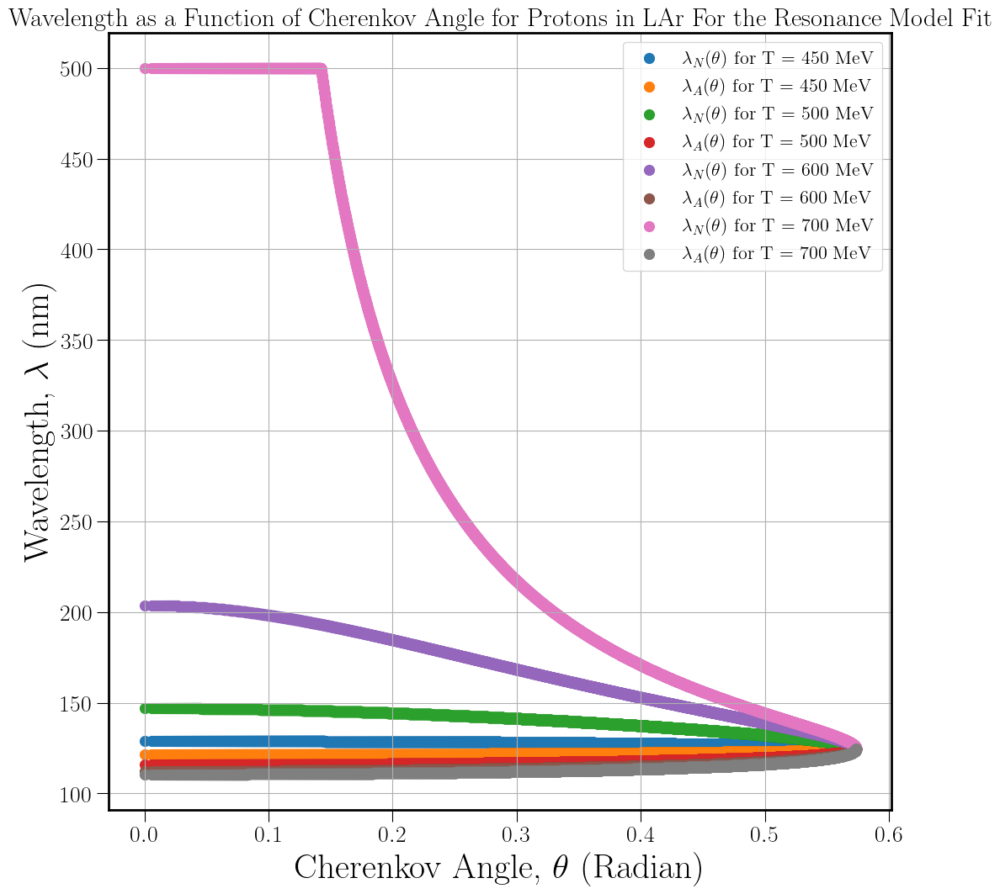

In [46]:
#Plot of lambda vs theta in the LAr medium near Resonance (HO)

# t = np.array([450, 500, 600, 650, 700, 750, 800, 850, 900]) #K>E in MeV 
t = np.array([450, 500, 600, 700, 800, 900, 1000]) #K>E in MeV 
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
print("K.E= {}, beta= {}".format(t, beta))

# theta = np.linspace(0, np.pi/2, 2000)
# x_all = np.linspace(0, 1, 2000)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Wavelength as a Function of Cherenkov Angle for Protons in LAr For the Resonance Model Fit", fontsize= 22)

ax.scatter(np.arccos(x_all), lamd_nlist[0], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 450 MeV")              #.format(t[0]))
ax.scatter(np.arccos(x_all), lamd_alist[0], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 450 MeV")             #.format(t[0]))

ax.scatter(np.arccos(x_all), lamd_nlist[1], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 500 MeV")
ax.scatter(np.arccos(x_all), lamd_alist[1], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 500 MeV")

ax.scatter(np.arccos(x_all), lamd_nlist[2], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 600 MeV")
ax.scatter(np.arccos(x_all), lamd_alist[2], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 600 MeV")

ax.scatter(np.arccos(x_all), lamd_nlist[3], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 700 MeV")
ax.scatter(np.arccos(x_all), lamd_alist[3], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 700 MeV")

# ax.scatter(np.arccos(x_all), lamd_nlist[4], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 800 MeV")
# ax.scatter(np.arccos(x_all), lamd_alist[4], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 800 MeV")

# ax.scatter(np.arccos(x_all), lamd_nlist[5], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 900 MeV")
# ax.scatter(np.arccos(x_all), lamd_alist[5], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 900 MeV")

# ax.scatter(np.arccos(x_all), lamd_nlist[6], linewidth = 3.5, label= "$\\lambda_{N}(\\theta)$ for T = 1000 MeV")
# ax.scatter(np.arccos(x_all), lamd_alist[6], linewidth = 3.5, label= "$\\lambda_{A}(\\theta)$ for T = 1000 MeV")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Cherenkov Angle, $\\theta$ (Radian)",fontsize=30)
ax.set_ylabel("Wavelength, $\\lambda$ (nm)",fontsize=30)
ax.grid()
ax.legend(fontsize=16)


# plt.ylim([100,500])
# plt.xlim([0,30])
# plt.savefig("lambda_r_vs_theta_HO_allT.jpg", bbox_inches="tight")

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


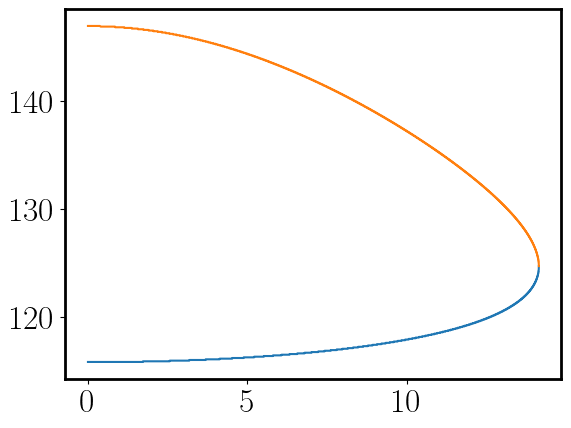

In [48]:
# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 500
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 10000)
x_all = np.linspace(0, 1, 10000)
x = np.cos(theta)

lamd = np.linspace(90,700,10000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovangnsum = []
cerenkovangasum = []
cerenkovangtsum = []

cerenkov_alln =  [] #[[] for j in t] #normal
cerenkov_alla =  [] #[[] for j in t] #anomalous

cerenkov_all =  [] #[[] for j in t] #total
scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []
cerenkovangsum = [0 for x in x_all]
cerenkovangnsum = [0 for x in x_all]
cerenkovangasum = [0 for x in x_all]

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

#     funclamd = n_jacksonr - y

#     idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    
n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278


cos_ang_min = 1/(i * n_peakr)
cos_ang_max = min(1/(i * n_asymtoter), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_max= {}".format(i, cos_ang_min, cos_ang_max))
x_all = np.linspace(cos_ang_min, cos_ang_maxa, 10000)

    
        
            # print(lamd[idx])

for x in x_all: 
    
    if x >= cos_ang_min and x <= cos_ang_maxa:
        
        y= 1/(i*x)
        y = np.linspace(y,y,10000)   #wavelength of light 
        # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    
        if 1/(i*x) >= n_peakr:
            lmin = lamd_peakr
            lmax = lamd_peakr
            
        if n_500 < 1/(i*x) < n_peakr:   
            lmin = lamd[min(idx)]
            lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
        if n_uvr < 1/(i*x) <= n_500:
            lmin = max(lamd[min(idx)], 106.67)
            lmax = 500            
    

        
        lamdminr.append(lmin)
        lamdmaxr.append(lmax)
    
    
plt.plot(np.arccos(x_all)*180/np.pi, lamdminr)
plt.plot(np.arccos(x_all)*180/np.pi, lamdmaxr)


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\2299385134.py:16: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\2299385134.py:17: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\2299385134.py:20: RuntimeWarning: invalid value encountered in sqrt
  lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_

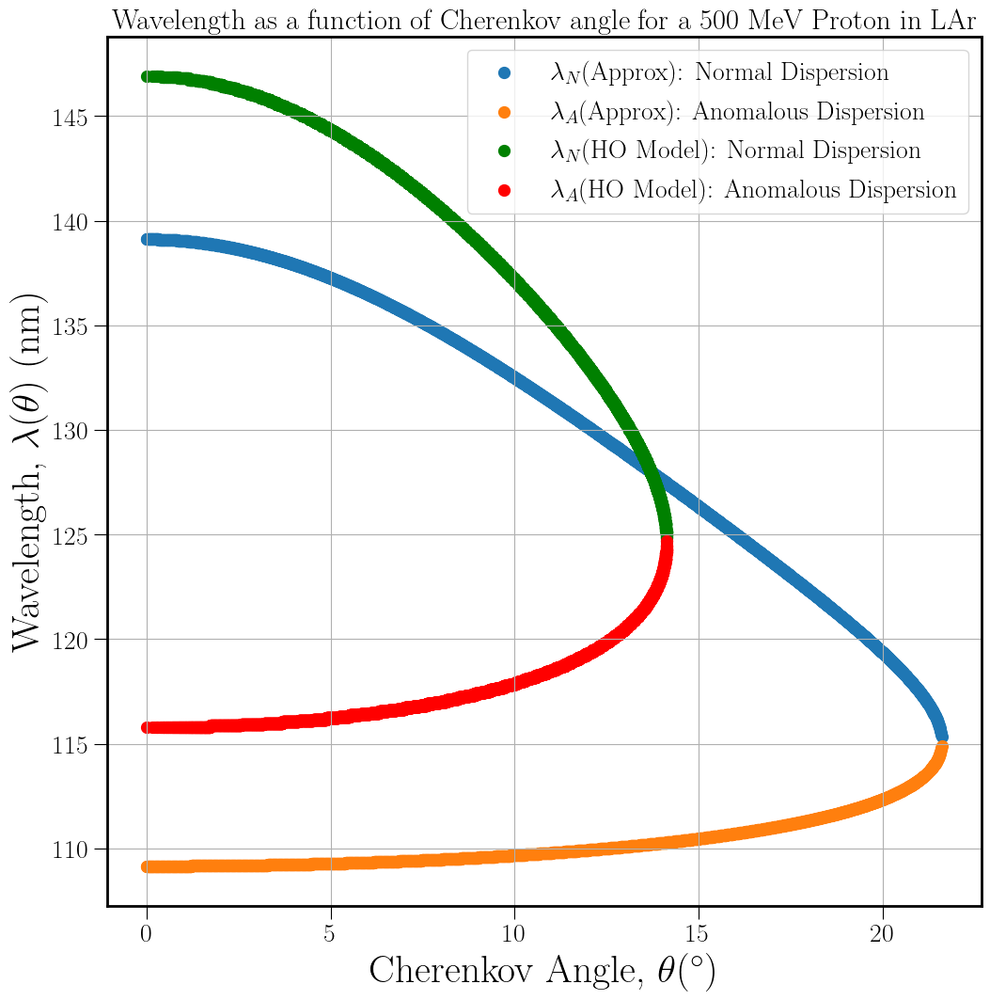

In [50]:
#Angular
#Wavelength Solutions (PVS)

#lambda(theta) when theta changes

# b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])
# lamd = np.linspace(0,700,700)
# n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))

thetadeg = theta * 180/np.pi
# theta = np.linspace(0, np.pi/2, 2000)
alpha = 1/137
b = 0.7579653181328908 #beta

#Wavelength as a function of the angle: lambda(theta)
lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))

#term involving wavelengths: (lamd_uv^-1 - lamd_theta^-1)
lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
lamd_nterm = (((-b*a_pvs*np.cos(theta)) - ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p

func_angp = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_pterm**2)**2/(gamma**2 - lamd_pterm**2))) + ((2*a_0*a_pvs*b) * lamd_pterm * np.abs((gamma**2 + lamd_pterm**2)/(gamma**2 - lamd_pterm**2))) + ((b*a_pvs**2*lamd_pterm**2)/np.abs(gamma**2 - lamd_pterm**2))))
func_angn = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_nterm**2)**2/(gamma**2 - lamd_nterm**2))) + ((2*a_0*a_pvs*b) * lamd_nterm * np.abs((gamma**2 + lamd_nterm**2)/(gamma**2 - lamd_nterm**2))) + ((b*a_pvs**2*lamd_nterm**2)/np.abs(gamma**2 - lamd_nterm**2))))

func_angt = func_angp + func_angn

# print(b, lamd_thetap, lamd_thetan, lamd_pterm, lamd_nterm, func_angp, func_angn, sep='\n')

# print(theta, lamd_thetap) #, lamd_thetan, lamd_pterm, func_angp, func_angn
# print("{}, lamd_thetap= {:.5f}, lamd_thetan = {:.5f}, lamd_pterm  = {}, func_ang= {}".format(b, lamd_thetap, lamd_thetan, lamd_pterm, func_ang))
# lamd_pterm, lamd_nterm
#(0.00021947, 0.00061913), (0.00219235, 0.00077715)

#Plot of lambda vs theta in the LAr medium near Resonance  
# theta = np.linspace(0, np.pi/2, 2000)

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

ax.set_title("Wavelength as a function of Cherenkov angle for a 500 MeV Proton in LAr", fontsize= 22) #($\\beta$ = 0.758) 

#Apprx PVS fit WL solution
ax.scatter(thetadeg, lamd_thetap, linewidth = 3.5, label= "$\\lambda_{N}$(Approx): Normal Dispersion")
ax.scatter(thetadeg, lamd_thetan, linewidth = 3.5, label= "$\\lambda_{A}$(Approx): Anomalous Dispersion")

#Exact HO fit WL solution
ax.scatter(np.arccos(x_all)*180/np.pi, lamdmaxr, c= 'g', linewidth = 3.5, label= "$\\lambda_{N}$(HO Model): Normal Dispersion")
ax.scatter(np.arccos(x_all)*180/np.pi, lamdminr, c= 'r', linewidth = 3.5, label= "$\\lambda_{A}$(HO Model): Anomalous Dispersion")

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Cherenkov Angle, $\\theta (^{\circ})$",fontsize=30)
ax.set_ylabel("Wavelength, $\\lambda (\\theta)$ (nm)",fontsize=30)
ax.grid()
ax.legend(fontsize=20)

# plt.ylim([0,300])
# plt.xlim([0,30])

# plt.savefig("wavelength_solutions_ourhofit_500MeV.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 
# plt.savefig("wavelength_solutions_HOvsPVS.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

beta = 0.8142990665639263, n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


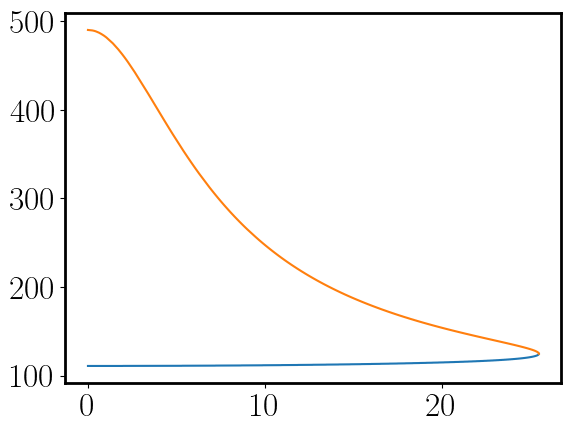

In [52]:
# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 678 #MeV
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 10000)
x_all = np.linspace(0, 1, 10000)
x = np.cos(theta)

lamd = np.linspace(90,700,10000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("beta = {}, n_uv = {}, n_peak = {}, n_asymtote = {}".format(i, n_uvr, n_peakr, n_asymtoter))


cerenkovangnsum = []
cerenkovangasum = []
cerenkovangtsum = []

cerenkov_alln =  [] #[[] for j in t] #normal
cerenkov_alla =  [] #[[] for j in t] #anomalous

cerenkov_all =  [] #[[] for j in t] #total
scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []
cerenkovangsum = [0 for x in x_all]
cerenkovangnsum = [0 for x in x_all]
cerenkovangasum = [0 for x in x_all]

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance

#     funclamd = n_jacksonr - y

#     idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    
n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278


cos_ang_min = 1/(i * n_peakr)
cos_ang_max = min(1/(i * n_asymtoter), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_max= {}".format(i, cos_ang_min, cos_ang_max))
x_all = np.linspace(cos_ang_min, cos_ang_maxa, 10000)

    
        
            # print(lamd[idx])

for x in x_all: 
    
    if x >= cos_ang_min and x <= cos_ang_maxa:
        
        y= 1/(i*x)
        y = np.linspace(y,y,10000)   #wavelength of light 
        # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    
        if 1/(i*x) >= n_peakr:
            lmin = lamd_peakr
            lmax = lamd_peakr
            
        if n_500 < 1/(i*x) < n_peakr:   
            lmin = lamd[min(idx)]
            lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
        if n_uvr < 1/(i*x) <= n_500:
            lmin = max(lamd[min(idx)], 106.67)
            lmax = 500            
    

        
        lamdminr.append(lmin)
        lamdmaxr.append(lmax)
    
    
plt.plot(np.arccos(x_all)*180/np.pi, lamdminr)
plt.plot(np.arccos(x_all)*180/np.pi, lamdmaxr)


In [53]:
# #Angular
# #Wavelength Solutions (PVS)

# #lambda(theta) when theta changes

# # b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])
# # lamd = np.linspace(0,700,700)
# # n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))

# thetadeg = theta * 180/np.pi
# # theta = np.linspace(0, np.pi/2, 2000)

# b = 0.8198002603953367 #beta 600 MeV

# #Wavelength as a function of the angle: lambda(theta)
# lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
# lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))

# #term involving wavelengths: (lamd_uv^-1 - lamd_theta^-1)
# lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
# lamd_nterm = (((-b*a_pvs*np.cos(theta)) - ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p

# func_angp = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_pterm**2)**2/(gamma**2 - lamd_pterm**2))) + ((2*a_0*a_pvs*b) * lamd_pterm * np.abs((gamma**2 + lamd_pterm**2)/(gamma**2 - lamd_pterm**2))) + ((b*a_pvs**2*lamd_pterm**2)/np.abs(gamma**2 - lamd_pterm**2))))
# func_angn = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_nterm**2)**2/(gamma**2 - lamd_nterm**2))) + ((2*a_0*a_pvs*b) * lamd_nterm * np.abs((gamma**2 + lamd_nterm**2)/(gamma**2 - lamd_nterm**2))) + ((b*a_pvs**2*lamd_nterm**2)/np.abs(gamma**2 - lamd_nterm**2))))

# func_angt = func_angp + func_angn

# # print(b, lamd_thetap, lamd_thetan, lamd_pterm, lamd_nterm, func_angp, func_angn, sep='\n')

# # print(theta, lamd_thetap) #, lamd_thetan, lamd_pterm, func_angp, func_angn
# # print("{}, lamd_thetap= {:.5f}, lamd_thetan = {:.5f}, lamd_pterm  = {}, func_ang= {}".format(b, lamd_thetap, lamd_thetan, lamd_pterm, func_ang))
# # lamd_pterm, lamd_nterm
# #(0.00021947, 0.00061913), (0.00219235, 0.00077715)

# #Plot of lambda vs theta in the LAr medium near Resonance  
# # theta = np.linspace(0, np.pi/2, 2000)

# fig = plt.figure(figsize=(12,12))

# ax = fig.add_subplot(111)

# #TeX up labels and text:

# plt.rc("text", usetex=True)
# plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
# plt.rc('font', size=24) 
# plt.rc('font', family='serif')

# #     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
# plt.rcParams["font.weight"] = "bold"     
# #     plt.rcParams["axes.labelweight"] = "bold"
# plt.rc('axes', linewidth=2)

# ax.set_title("Wavelength as a function of Cherenkov angle for a 700 MeV Proton in LAr", fontsize= 22) #($\\beta$ = 0.758) 

# #Apprx PVS fit WL solution
# ax.scatter(thetadeg, lamd_thetap, linewidth = 3.5, label= "$\\lambda_{N}(SVE)$: Normal Dispersion")
# ax.scatter(thetadeg, lamd_thetan, linewidth = 3.5, label= "$\\lambda_{A}(SVE)$: Anomalous Dispersion")

# #Exact HO fit WL solution
# ax.scatter(np.arccos(x_all)*180/np.pi, lamdmaxr, c= 'g', linewidth = 3.5, label= "$\\lambda_{N}(HO)$: Normal Dispersion")
# ax.scatter(np.arccos(x_all)*180/np.pi, lamdminr, c= 'r', linewidth = 3.5, label= "$\\lambda_{A}(HO)$: Anomalous Dispersion")

# # ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

# ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.set_xlabel("Cherenkov Angle, $\\theta$ (degree)",fontsize=28)
# ax.set_ylabel("Wavelength, $\\lambda (\\theta)$ (nm)",fontsize=28)
# ax.grid()
# ax.legend(fontsize=22)

# # plt.ylim([0,300])
# # plt.xlim([0,30])

# # plt.savefig("wavelength_solutions_ourhofit_500MeV.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 
# plt.savefig("wavelength_solutions_HOvsPVS_700MeV.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\1726635966.py:36: RuntimeWarning: invalid value encountered in sqrt
  n_grace = np.sqrt(a_0g + (a_uvg*lamd**2/(lamd**2-lamd_uv**2))) #+ (a_irg*lamd**2/(lamd**2-lamd_ir**2)))) #(ignoring the 3rd term)
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\1726635966.py:63: RuntimeWarning: invalid value encountered in sqrt
  n_babics = np.sqrt(1+(3*x/(3-x)))


[135.89296263 135.89295812 135.89294458 ... 108.65731093 108.65731062
 108.65731052]


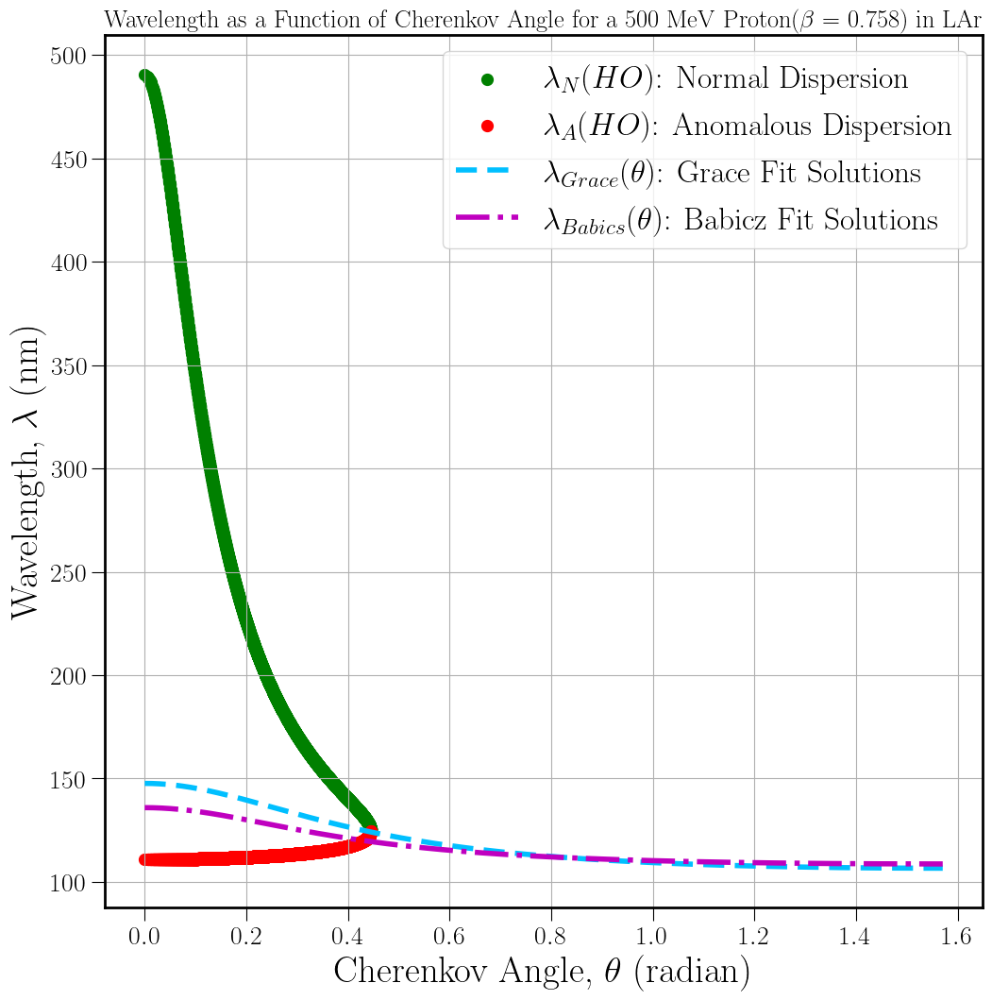

In [55]:
#Angular Distribution for Babics(2020) Fit: 500 MeV
#lambda(theta) for different betas

alpha = 1/137 #Fine-structure (EM coupling) constant 

mp = 938  #Proton's mass in MeV
# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# t = np.array([400, 500, 600, 650, 700]) #K>E in MeV 

beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
lamd_peak = 124.68 #where n is max 

# theta = np.linspace(0, np.pi/2, 10000)
# x = np.cos(theta)
# x_all = np.linspace(0, 1, 10000)
# lamd = np.linspace(90,700,10000)

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

b = 0.7579653181328908 #beta-> T = 500,700,800 MeV



#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

# n_grace = complex(n1,n2)
n_grace = np.sqrt(a_0g + (a_uvg*lamd**2/(lamd**2-lamd_uv**2))) #+ (a_irg*lamd**2/(lamd**2-lamd_ir**2)))) #(ignoring the 3rd term)

# b1 = 0.7579653181328908 #beta
# b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])

# lamd_thetalist = []
# func_angtlist = []
# func_ang = 2* np.pi * 1e6 * (alpha/a_uvg) * ((b * a_0g * (lamd_theta**2 - lamd_uv**2)/(lamd_theta**3 * lamd_uv**2)) + (b * a_uvg /(lamd_theta * lamd_uv**2)) -  ((lamd_theta**2 - lamd_uv**2)/(b * lamd_theta**3 * lamd_uv**2)))                                      

# for b in beta: 
# b = 0.7579653181328908 #beta-> T = 500,700,800 MeV

lamd_thetag = np.sqrt((a_0g*b**2*np.cos(theta)**2 - 1)/((a_0g + a_uvg)*b**2*np.cos(theta)**2 - 1)) * lamd_uv



#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008

# b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])

x = (a_0b + (a_uvb*lamd**2/(lamd**2-lamd_uv**2)) + (a_irb*lamd**2/(lamd**2-lamd_ir**2))) #(ignoring the 3rd term)
# x = a_0b + a_uvb + a_irb
n_babics = np.sqrt(1+(3*x/(3-x)))


# for b in beta: 
# b = 0.7579653181328908 #beta

lamd_thetab = np.sqrt(((a_0b - 3) + (b**2 * np.cos(theta)**2 * (3 + 2*a_0b))) / ((b**2 * np.cos(theta)**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv
print(lamd_thetab)   
# func_ang = 2*np.pi*1e6*(alpha/a_uvg)*((b*a_0g*(lamd_theta**2-lamd_uv**2)/(lamd_theta**3*lamd_uv**2)) + (b*a_uvg/(lamd_theta*lamd_uv**2)) -  ((lamd_theta**2-lamd_uv**2)/(b*lamd_theta**3*lamd_uv**2)))                                      

#Plot of lambda vs theta in the LAr medium near Resonance  

fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)

# #TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title("Wavelength as a Function of Cherenkov Angle for a 500 MeV Proton($\\beta$ = 0.758) in LAr", fontsize= 19)

#Apprx PVS fit WL solution
# ax.scatter(theta, lamd_thetap, linewidth = 3.5, label= "$\\lambda_{N}(SVE)$: Normal Dispersion")
# ax.scatter(theta, lamd_thetan, linewidth = 3.5, label= "$\\lambda_{A}(SVE)$: Anomalous Dispersion")

#Exact HO fit WL solution
ax.scatter(np.arccos(x_all), lamdmaxr, c= 'g', linewidth = 3.5, label= "$\\lambda_{N}(HO)$: Normal Dispersion")
ax.scatter(np.arccos(x_all), lamdminr, c= 'r', linewidth = 3.5, label= "$\\lambda_{A}(HO)$: Anomalous Dispersion")

ax.plot(theta, lamd_thetag, linewidth = 4, dashes=[4,2], color='deepskyblue', label= "$\\lambda_{Grace}(\\theta)$: Grace Fit Solutions")
ax.plot(theta, lamd_thetab, linewidth = 4, ls='dashdot', color='m', label= "$\\lambda_{Babics}(\\theta)$: Babicz Fit Solutions")

# ax.scatter(theta, lamd_theta, color='g', label= "$\\lambda_{Grace}(\\theta)$: Grace Fit Solutions")

# ax.plot(lamd, y, linewidth = 3.5,label="$1/ \\beta$")

ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("Cherenkov Angle, $\\theta$ (radian)",fontsize=28)
ax.set_ylabel("Wavelength, $\lambda$ (nm)",fontsize=28)
ax.grid()
ax.legend(fontsize=24, loc= 'best')

# plt.ylim([0,300])
# plt.xlim([0,30])

# plt.savefig("wavelength_solutions_BabicsnGrace.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 
# plt.savefig("wavelength_solutions_BabicznGracevsOurs.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

# Instantaneous AD

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.2278
beta= 0.7579653181328908, cos_ang_min= 0.969732876547658, cos_ang_maxN= 1, cos_ang_maxA= 1


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_19892\2201420767.py:129: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_19892\2201420767.py:168: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 2.00040008e-04 4.00080016e-04 ... 9.99599920e-01
 9.99799960e-01 1.00000000e+00] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

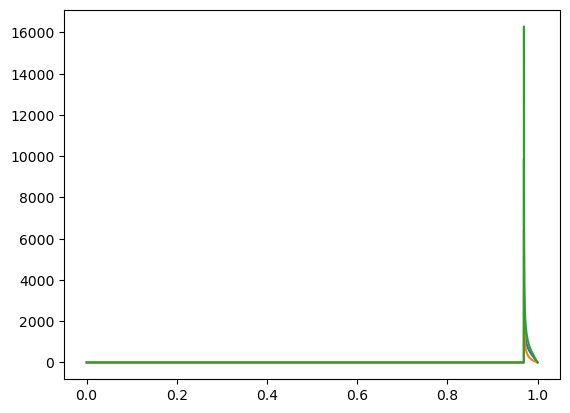

In [4]:
#Instantaneous AD with HO fit: 500 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 500
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)

lamd = np.linspace(90,700,5000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)
cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all:

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
           
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,5000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            lamdmaxr.append(lmax)
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc500 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,5000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            lamdminr.append(lmin)
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac500 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc500 = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 
print(x_all, func_angtc500)

# plt.plot(x_all, lamdminr)
# plt.plot(x_all, lamdmaxr)

plt.plot(x_all, func_angnc500)
plt.plot(x_all, func_angac500)
        
plt.plot(x_all, func_angtc500)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc500) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


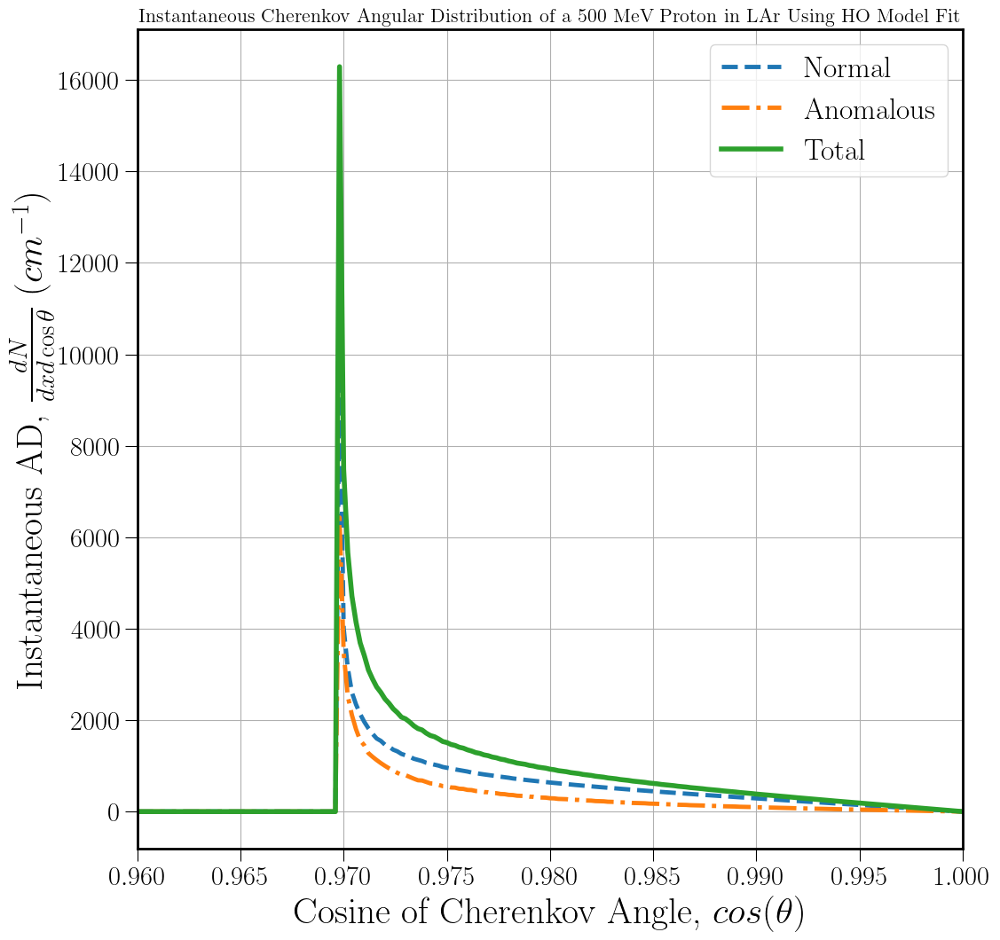

In [58]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using HO Model Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)


ax.plot(x_all, func_angnc500, ls='dashed', linewidth= 3.5, label='Normal') #.format(float(j))) #normal
ax.plot(x_all, func_angac500, ls='dashdot', linewidth= 3.5, label='Anomalous') #.format(float(j))) #anomalous

ax.plot(x_all, func_angtc500, linewidth= 4, label='Total') #.format(float(j))) #total
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.96,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=24) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Cherenkov_HOmodel_500MeV.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.2278
beta= 0.7370919123190173, cos_ang_min= 0.9971943471253918, cos_ang_maxN= 1, cos_ang_maxA= 1


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\3642964260.py:129: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_44780\3642964260.py:168: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 2.00040008e-04 4.00080016e-04 ... 9.99599920e-01
 9.99799960e-01 1.00000000e+00] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

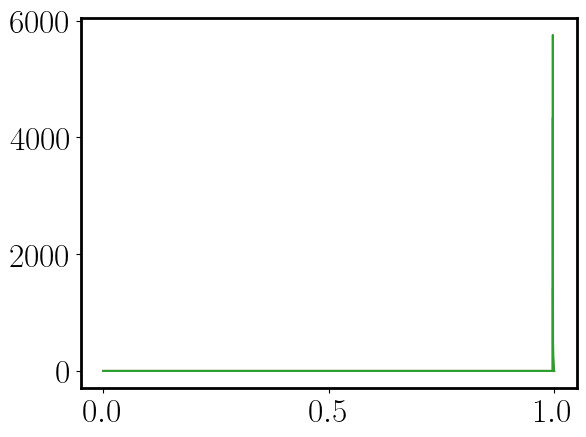

In [61]:
#Instantaneous AD with HO fit: 500 MeV & less (from betalist of a 500 MeV Proton)

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 450
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)

lamd = np.linspace(90,700,5000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)
cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all:

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
           
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,5000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            lamdmaxr.append(lmax)
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc450 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,5000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            lamdminr.append(lmin)
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac450 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc450 = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 
print(x_all, func_angtc450)

# plt.plot(x_all, lamdminr)
# plt.plot(x_all, lamdmaxr)

plt.plot(x_all, func_angnc450)
plt.plot(x_all, func_angac450)
        
plt.plot(x_all, func_angtc450)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc450) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


NameError: name 'func_angtc490' is not defined

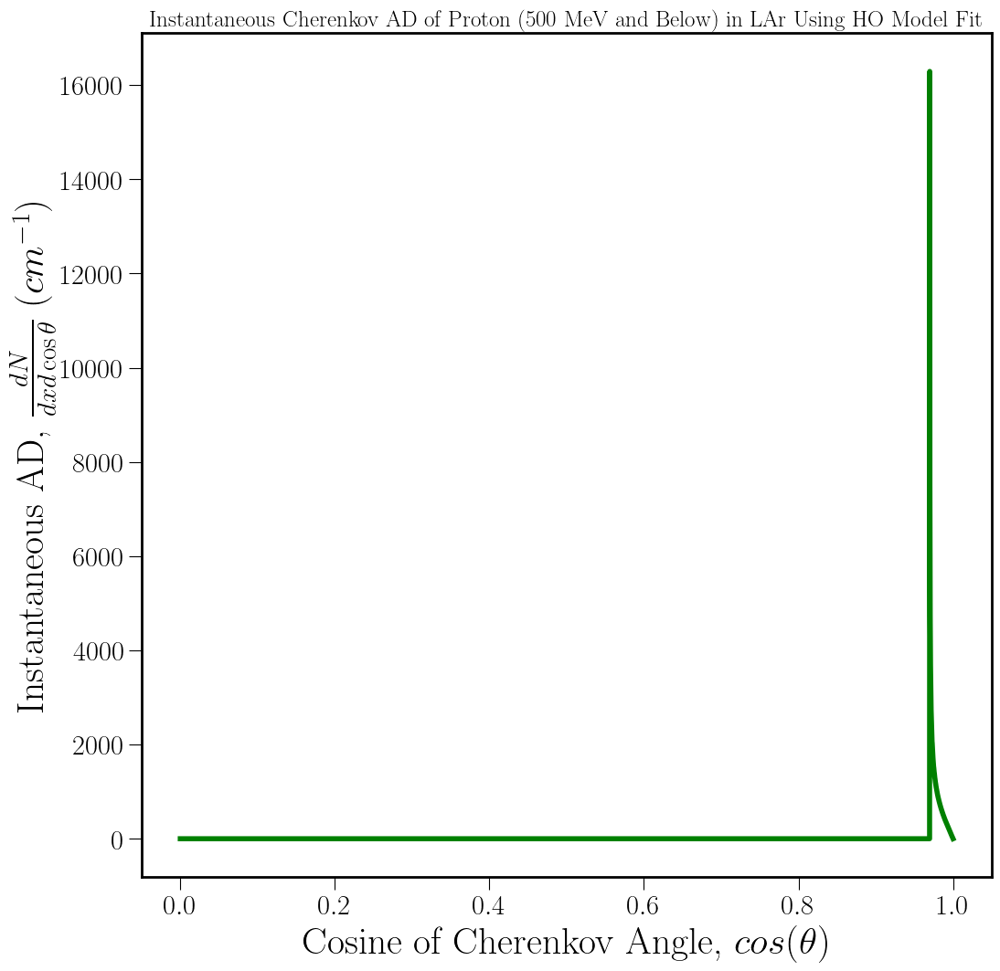

In [62]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov AD of Proton (500 MeV and Below) in LAr Using HO Model Fit", fontsize= 18) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)


#500 MeV 
# ax.plot(x_all, func_angnc500, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac500, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc500, linewidth= 4, c= 'g', label='500 MeV') #total

#700 MeV 
# ax.plot(x_all, func_angnc490, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac490, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc490, ls='dashed', linewidth= 4, c= 'deepskyblue', label='490 MeV') #total


#800 MeV 
# ax.plot(x_all, func_angnc480, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac480, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc480, ls='dashdot', linewidth= 4, c= 'b', label='480 MeV') #total

#1000 MeV 
# ax.plot(x_all, func_angnc470, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac470, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc470, ls= 'dashed', linewidth= 4, c= 'violet', label='470 MeV') #total

#1200 MeV 
# ax.plot(x_all, func_angnc460, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac460, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc460, ls='dashdot', linewidth= 4, c= 'orange', label='460 MeV') #total

# #1500 MeV
# # ax.plot(x_all, func_angnc450, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# # ax.plot(x_all, func_angac450, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc450, ls= 'dashed', linewidth= 4, c= 'red', label='450 MeV') #total
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.965,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_inst_Cherenkov_HOmodel_500nbl.jpg', bbox_inches= "tight") 
    

In [ ]:
# Babicz Instantaneous AD with lambda_min = 108.657 nm

#AD: BABICS FIT 

alpha = 1/137 #Fine-structure (EM coupling) constant 

lamd = np.linspace(0,700,2000)   #wavelength of light 
lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
# lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_uv = 108.657 #in nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t= 500
mp = 938  #Proton's mass in MeV
# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 

x = (a_0b + (a_uvb*lamd**2/(lamd**2-lamd_uv**2)) + (a_irb*lamd**2/(lamd**2-lamd_ir**2))) #(ignoring the 3rd term)
# x = a_0b + a_uvb + a_irb
n_babics = np.sqrt(1+(3*x/(3-x)))

# plt.plot(lamd, n_babics)

# for b in beta: 
b = 0.7579653181328908 #beta

for i in theta: 
    
    lamd_thetab = np.sqrt(((a_0b - 3) + (b**2 * np.cos(theta)**2 * (3 + 2*a_0b))) / ((b**2 * np.cos(theta)**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv
       
    func_angb2 = (2*np.pi*1e7) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
#     print(lamd_thetab, func_angb)
    
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

# ax.set_title("Instantaneous Angular Distribution of a 500 MeV Proton in LAr Using Babicz's Fit", fontsize= 20)
ax.set_title("Comparison of Instantaneous Angular Distribution of a 500 MeV Proton in LAr Using Babicz's and HO Model Fit", fontsize= 14)

# func_angt = func_angp + func_angn

# ax.scatter(np.cos(theta), 2*pi*1e7*func_angp, label= "$(\\frac{dN}{dx dcos\\theta})_{Normal}$")    #func_angp = f(lamd_pterm): Blue plot
# ax.scatter(np.cos(theta), 2*pi*1e7*func_angn, label= "$(\\frac{dN}{dx dcos\\theta})_{Anomalous}$")     #func_angp = f(lamd_pterm): Orange plot
# ax.scatter(np.cos(theta), 2*pi*1e7*func_angt, linewidth= 3.5, color= 'g', label= "$(\\frac{dN}{dx dcos\\theta})_{Total}$")     #func_angp = f(lamd_pterm): Green plot

ax.plot(np.cos(theta), 36*func_angb2, ls= 'dashdot', linewidth= 4, color= 'r', label= "$36 \\times$ Total (Babicz)")     #func_angp = f(lamd_pterm): Green plot

#HO fit
ax.plot(x_all, func_angnc500, ls='dashed', linewidth= 3.5, label='Normal (HO)') #.format(float(j))) #normal
ax.plot(x_all, func_angac500, ls='dashed', linewidth= 3.5, label='Anomalous (HO)') #.format(float(j))) #anomalous

ax.plot(x_all, func_angtc500, linewidth= 4, label='Total (HO)') #.format(float(j))) #total

ax.set_xlabel("Cosine of Cherenkov Angle, $\\cos(\\theta)$ ",fontsize=30)
ax.set_ylabel("Instantaneous AD, $\\frac{dN}{dx dcos\\theta}$ $(cm^{-1})$",fontsize=30)
ax.grid()
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.legend(fontsize=22)

# plt.ylim([0,0.0004])
# plt.xlim([0.96,1])

# plt.savefig("angdist_dcostheta_total_betap758_Babicz_lamdmin108p65.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 
# plt.savefig("angdist_inst_dcostheta_betap758_babiczvsho_comparisonplot.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.7579653181328908, cos_ang_min= 0.969732876547658, cos_ang_maxN= 1, cos_ang_maxA= 1


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\425046715.py:116: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\425046715.py:152: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Instantaneous Cerenkov photons emitted by a 500 Mev Proton in LAr: 29.641


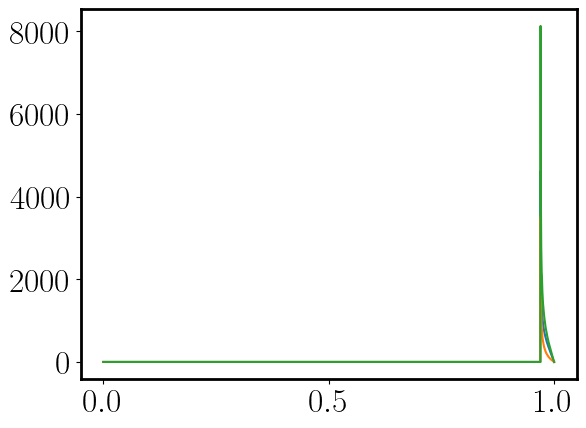

In [183]:
#Instantaneous AD with HO fit: 500 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 500
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    cerenkovangsum = [0 for x in x_all]
    cerenkovangnsum = [0 for x in x_all]
    cerenkovangasum = [0 for x in x_all]

        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 *  (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc500 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac500 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc500 = [(func_angn(x) + func_anga(x)) for x in x_all]  

        #Write to file: 
    
    with open('cherenkoviad_500.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc500, func_angac500, func_angtc500])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata500 = 'cerenkoviad500.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata500, costheta=x_all, normal500=func_angnc500, anomalous500=func_angac500, total500=func_angtc500)


# print(x_all, func_angtc500)

plt.plot(x_all, func_angnc500)
plt.plot(x_all, func_angac500)
        
plt.plot(x_all, func_angtc500)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc500)/2000)) )  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.7924914946784183, cos_ang_min= 0.9274848919036427, cos_ang_maxN= 1, cos_ang_maxA= 1


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1729446098.py:114: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1729446098.py:150: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Instantaneous Cerenkov photons emitted by a 600 Mev Proton in LAr: 129.096


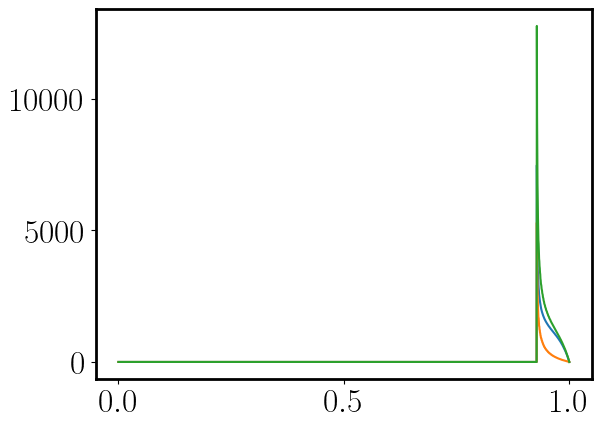

In [184]:
#Instantaneous AD with HO fit: 600 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([500])
t = 600
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    cerenkovangsum = [0 for x in x_all]
    cerenkovangnsum = [0 for x in x_all]
    cerenkovangasum = [0 for x in x_all]

        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 *  (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc600 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac600 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc600 = [(func_angn(x) + func_anga(x)) for x in x_all]  

        #Write to file: 
    
    with open('cherenkoviad_600.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc600, func_angac600, func_angtc600])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata600 = 'cerenkoviad600.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata600, costheta=x_all, normal600=func_angnc600, anomalous600=func_angac600, total600=func_angtc600)


# print(x_all, func_angtc500)

plt.plot(x_all, func_angnc600)
plt.plot(x_all, func_angac600)
        
plt.plot(x_all, func_angtc600)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc600)/2000)) )  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.8198002603953367, cos_ang_min= 0.8965889909841142, cos_ang_maxN= 0.9934918734597551, cos_ang_maxA= 1


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2570950867.py:116: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2570950867.py:152: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

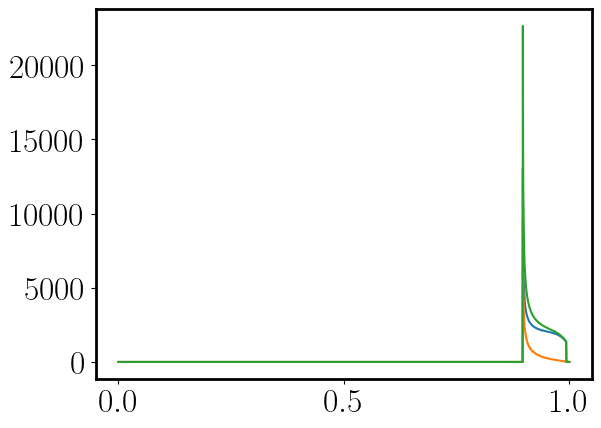

In [178]:
#Instantaneous AD with HO fit: 700 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 700
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    cerenkovangsum = [0 for x in x_all]
    cerenkovangnsum = [0 for x in x_all]
    cerenkovangasum = [0 for x in x_all]

        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 *  (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc700 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac700 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc700 = [(func_angn(x) + func_anga(x)) for x in x_all]  

        #Write to file: 
    
    with open('cherenkoviad_700.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc700, func_angac700, func_angtc700])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata700 = 'cerenkoviad700.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata700, costheta=x_all, normal700=func_angnc700, anomalous700=func_angac700, total700=func_angtc700)


print(x_all, func_angtc700)

plt.plot(x_all, func_angnc700)
plt.plot(x_all, func_angac700)
        
plt.plot(x_all, func_angtc700)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc700)/2000)) )  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


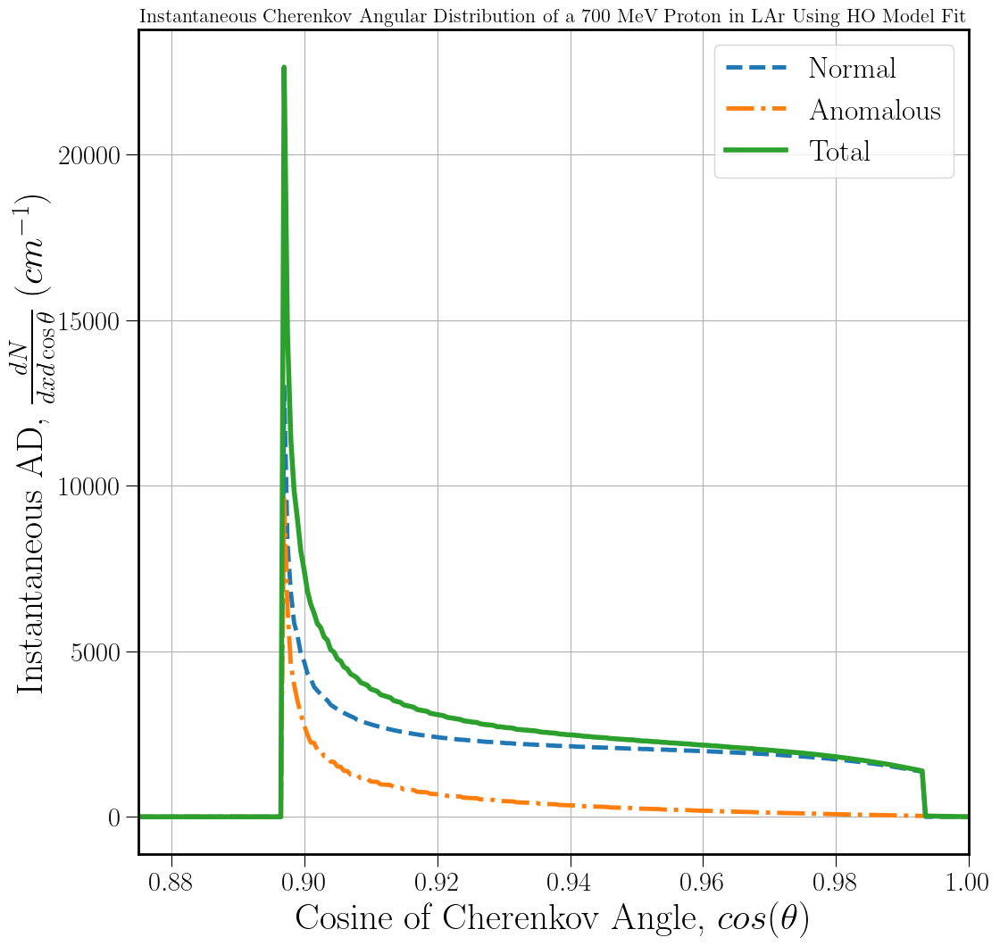

In [179]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Angular Distribution of a 700 MeV Proton in LAr Using HO Model Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, func_angnc700, ls='dashed', linewidth= 3.5, label='Normal') #.format(float(j))) #normal
ax.plot(x_all, func_angac700, ls='dashdot', linewidth= 3.5, label='Anomalous') #.format(float(j))) #anomalous

ax.plot(x_all, func_angtc700, linewidth= 4, label='Total') #.format(float(j))) #total
   
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.875,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=24) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Cherenkov_HOmodel_700MeV.jpg', bbox_inches= "tight") 
    

In [ ]:
lamd = 500
n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
print(n_jacksonr)


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.8418569002610763, cos_ang_min= 0.8730983710514503, cos_ang_maxN= 0.9674623992633149, cos_ang_maxA= 1


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2370519046.py:130: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2370519046.py:166: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

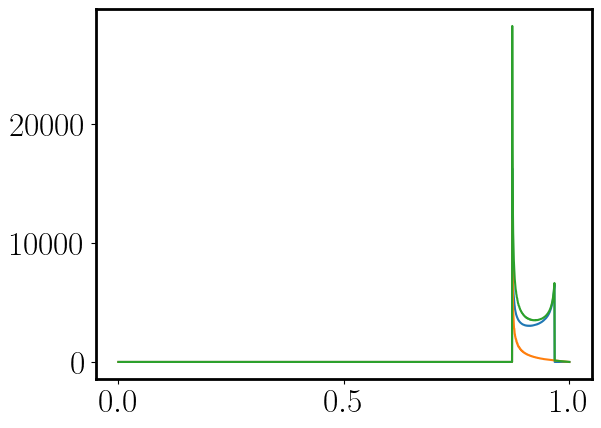

In [182]:
#Instantaneous AD with HO fit: 800 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 800
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

cerenkov_alln =  [] #[[] for j in t] #normal
cerenkov_alla =  [] #[[] for j in t] #anomalous

cerenkov_all =  [] #[[] for j in t] #total
scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 
    
    cerenkovangsum = [0 for x in x_all]
    cerenkovangnsum = [0 for x in x_all]
    cerenkovangasum = [0 for x in x_all]
        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc800 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac800 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc800 = [(func_angn(x) + func_anga(x)) for x in x_all]  

            #Write to file: 
    
    with open('cherenkoviad_800.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc800, func_angac800, func_angtc800])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata800 = 'cerenkoviad800.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata800, costheta=x_all, normal800=func_angnc800, anomalous800=func_angac800, total800=func_angtc800)


print(x_all, func_angtc800)

plt.plot(x_all, func_angnc800)
plt.plot(x_all, func_angac800)
        
plt.plot(x_all, func_angtc800)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc800)/2000)) ) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


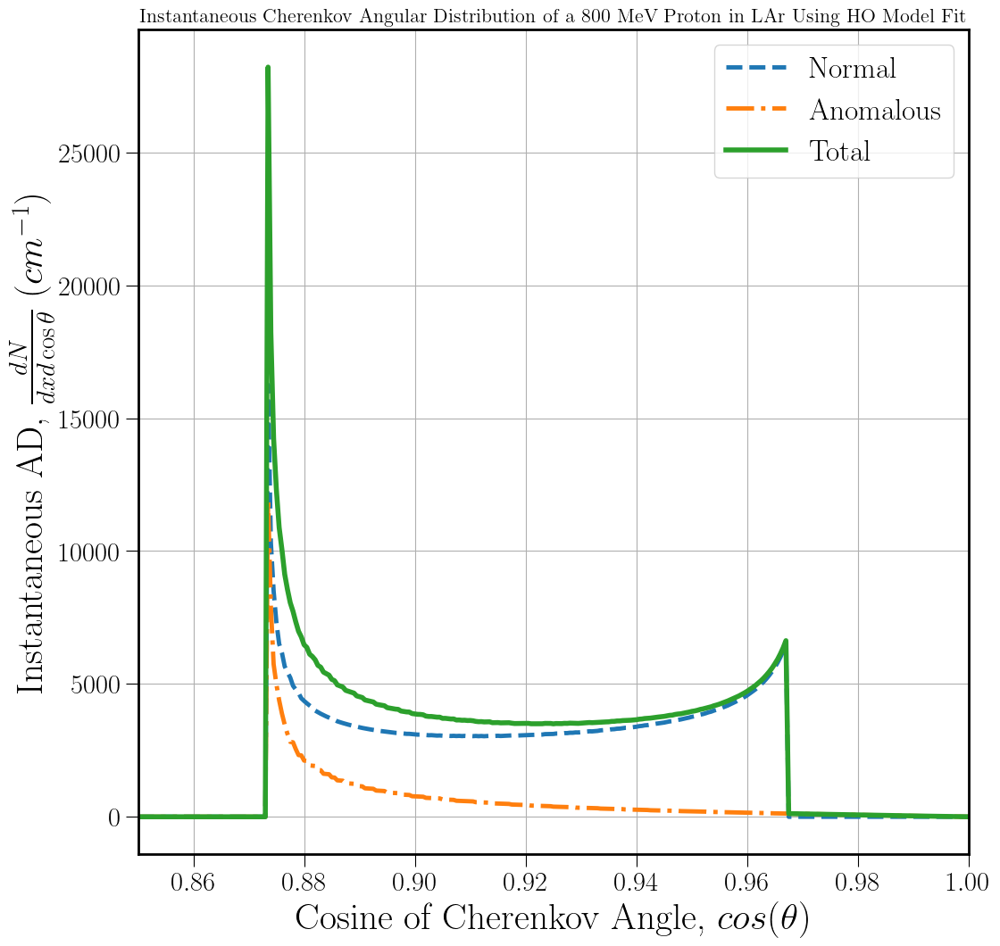

In [185]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Angular Distribution of a 800 MeV Proton in LAr Using HO Model Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)


ax.plot(x_all, func_angnc800, ls='dashed', linewidth= 3.5, label='Normal') #.format(float(j))) #normal
ax.plot(x_all, func_angac800, ls='dashdot', linewidth= 3.5, label='Anomalous') #.format(float(j))) #anomalous

ax.plot(x_all, func_angtc800, linewidth= 4, label='Total') #.format(float(j))) #total

    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.85,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=24) #loc='best' ,framealpha=None,shadow=True
plt.savefig('AD_Cherenkov_HOmodel_800MeV.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.8750657141671857, cos_ang_min= 0.8399642179740788, cos_ang_maxN= 0.9307471237609825, cos_ang_maxA= 1


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2996006007.py:131: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2996006007.py:167: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

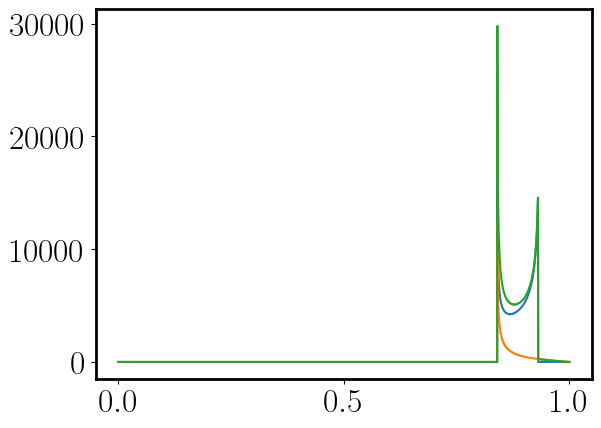

In [188]:
#Instantaneous AD with HO fit: 1000 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

t = 1000
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

    func_angnc1000 = [0 for x in x_all]
    func_angac1000 = [0 for x in x_all]
    func_angtc1000 = [0 for x in x_all]

    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc1000 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac1000 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc1000 = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 
            
#Write to file: 
    
    with open('cherenkoviad_1000.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc1000, func_angac1000, func_angtc1000])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata1000 = 'cerenkoviad1000.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata1000, costheta=x_all, normal1000=func_angnc1000, anomalous1000=func_angac1000, total1000=func_angtc1000)

print(x_all, func_angtc1000)

plt.plot(x_all, func_angnc1000)
plt.plot(x_all, func_angac1000)
        
plt.plot(x_all, func_angtc1000)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc1000)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Angular Distribution of a 1000 MeV Proton in LAr Using HO Model Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, func_angnc1000, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, func_angac1000, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, func_angtc1000, linewidth= 4, c= 'g', label='Total'.format(float(j))) #total

# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.80,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Cherenkov_HOmodel_1000MeV.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.898620015605076, cos_ang_min= 0.8179473809977944, cos_ang_maxN= 0.9063507182338323, cos_ang_maxA= 1


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\3016482148.py:134: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\3016482148.py:170: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Instantaneous Cerenkov photons emitted by a 1200 Mev Proton in LAr: 772.433


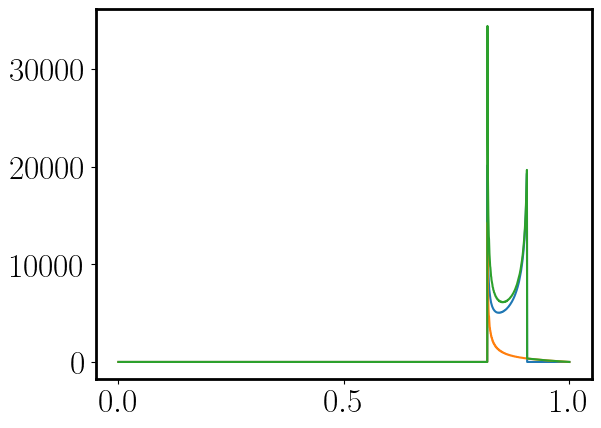

In [52]:
#Instantaneous AD with HO fit: 1200 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 1200
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

    func_angnc1200 = [0 for x in x_all]
    func_angac1200 = [0 for x in x_all]
    func_angtc1200 = [0 for x in x_all]

    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc1200 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac1200 = [func_anga(x) for x in x_all]       
           
            
    func_angtc1200 = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 

    # #Write to file: 
    
    # with open('cherenkoviad_1200.csv', 'w', encoding='UTF8', newline='') as f:
    #     writer = csv.writer(f)

    #     # write the header
        
    #     header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
    #     writer.writerow(header)

    #     # write multiple rows 
    #     writer.writerows([x_all, func_angnc1200, func_angac1200, func_angtc1200])  #Row wise csv -> mathematica ring plots
        
    #     # columns_data = zip_longest(*data)
    #     # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # # print(t, beta, cerenkovt1sum)
    
    # # Choose a filename, ending in .npz
    # cerenkovdata1200 = 'cerenkoviad1200.npz'

    # # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    # np.savez(cerenkovdata1200, costheta=x_all, normal1200=func_angnc1200, anomalous1200=func_angac1200, total1200=func_angtc1200)
 
# print(x_all, func_angtc1200)

plt.plot(x_all, func_angnc1200)
plt.plot(x_all, func_angac1200)
        
plt.plot(x_all, func_angtc1200)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc1200)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


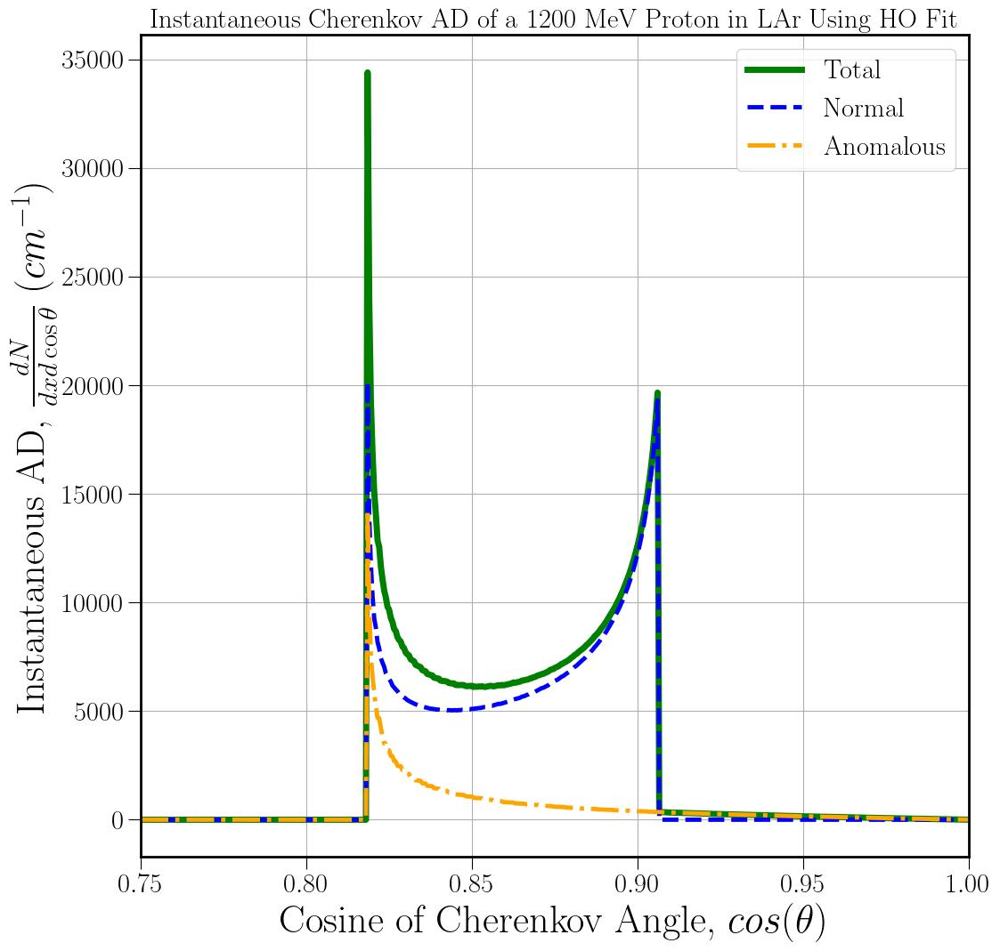

In [64]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

cos_ang_min= 0.8179473809977944 
cos_ang_maxN= 0.9063507182338323


ax.set_title(r"Instantaneous Cherenkov AD of a 1200 MeV Proton in LAr Using HO Fit", fontsize= 22) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos (\theta)$ ",fontsize=32)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=32)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, func_angtc1200, ls='solid', linewidth= 5, c='g', label='Total') #normal .format(float(j))
ax.plot(x_all, func_angnc1200, ls='dashed', linewidth= 3.5, c='b', label='Normal') #normal .format(float(j))
ax.plot(x_all, func_angac1200, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous') #anomalous .format(float(j))

# ax.plot(x_all, func_angtc1200, linewidth= 4, c= 'g', label='Total'.format(float(j))) #total

# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.75,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Cherenkov_HOmodel_1200MeV.jpg', bbox_inches= "tight") 
    

In [118]:


def func_angn(x):  #Normal AD_
    
    if x >= cos_ang_min and x <= cos_ang_maxn:
        
        y= 1/(i*x)
        y = np.linspace(y,y,2000)   #wavelength of light 
        # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

        
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
        
        if n_500 < 1/(i*x) < n_peakr:   
            # lmin = lamd[min(idx)]
            lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
        
        if 1/(i*x) <= n_500:
            # lmin = max(lamd[min(idx)], 106.67)
            lmax = 500            

        d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        
        return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
    
    else: 
        return 0 #To avaid getting negative contribution 

print(func_angn(0.83))

# func_angnc1200 = [func_angn(x) for x in x_all]  
# print(x_all, func_angnc)
# plt.plot(x_all, func_angnc)
        
# cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
        

def func_anga(x):  #Anomalous AD
    if x >= cos_ang_min and x <= cos_ang_maxa:
        
        y= 1/(i*x)
        y = np.linspace(y,y,2000)   #wavelength of light 
        # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
        funclamd = n_jacksonr - y
        idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

        
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
        
        if n_uvr < 1/(i*x) < n_peakr:   
            lmin = max(lamd[min(idx)], 106.67)
            # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
        
        if 1/(i*x) <= n_uvr:
            lmin = 106.67
            # lmax = 500            

        d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        
        return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

    else: 
        return 0 #To avaid getting negative contribution 

# func_angac1200 = [func_anga(x) for x in x_all]       

print(func_anga(0.83))

def func_angt(x):
      
    return (func_angn(x) + func_anga(x))




print(func_angt(cos_ang_min+0.02))
print(func_angt(cos_ang_maxN-0.02))


# func_angtc1200 = [(func_angn(x) + func_anga(x)) for x in x_all]  
        # func_angtc = func_angnc + func_angac 



5545.00601155634
2116.7157175554717
6643.94644018076
8325.778920461384


C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\904679338.py:24: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\Hasan's PC\AppData\Local\Temp\ipykernel_45404\904679338.py:62: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


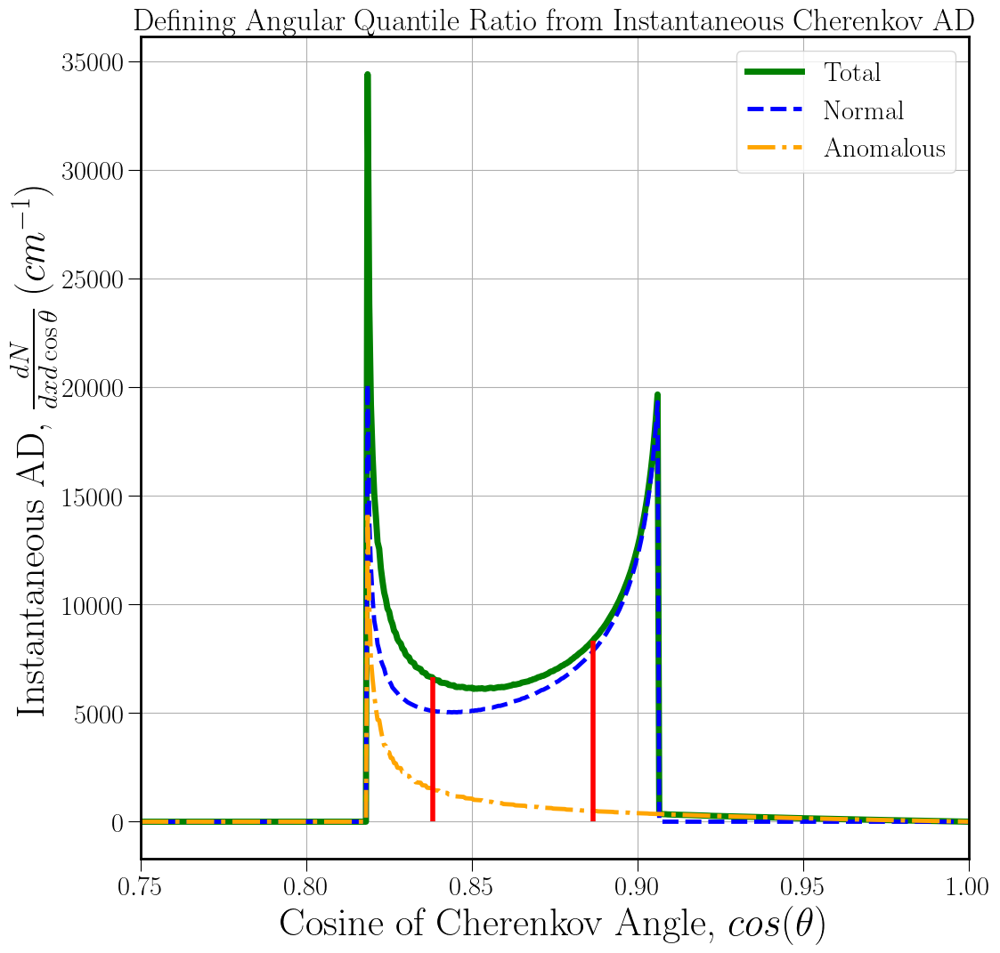

In [120]:
#Cartoon for AQR

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

cos_ang_min= 0.8179473809977944 
cos_ang_maxN= 0.9063507182338323


ax.set_title(r"Defining Angular Quantile Ratio from Instantaneous Cherenkov AD", fontsize= 25) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos (\theta)$ ",fontsize=32)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=32)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, func_angtc1200, ls='solid', linewidth= 5, c='g', label='Total') #normal .format(float(j))
ax.plot(x_all, func_angnc1200, ls='dashed', linewidth= 3.5, c='b', label='Normal') #normal .format(float(j))
ax.plot(x_all, func_angac1200, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous') #anomalous .format(float(j))

# ax.plot(x_all, func_angtc1200, linewidth= 4, c= 'g', label='Total'.format(float(j))) #total

# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.75,1)

ax.grid()

ax.vlines(cos_ang_min+0.02, 0, 6643.94644018076, color='red', linestyle='solid', lw=4)
ax.vlines(cos_ang_maxN-0.02, 0, 8325.778920461384, color='red', linestyle='solid', lw=4)

# # --- 1. Define physical X-positions for the vertical lines ---
# v_line_energies = [1000, 1600] # Adjust these values as needed

# for eng in v_line_energies:
#     # Map physical X to heatmap index
#     x_idx = np.interp(eng, phys_x, x_centers)
    
#     # 2. Find the exact Y-bounds at this energy from your data arrays
#     # 'x' is your flattened physical array, 'cer_angmax' and 'cer_angmin' are physical theta
#     data_idx = (np.abs(x - eng)).argmin()
#     y_top_phys = cer_angmax[data_idx]
#     y_bottom_phys = cer_angmin[data_idx]
    
#     # Map physical Y to heatmap index coordinates
#     y_top_idx = np.interp(y_top_phys, phys_y, y_centers)
#     y_bottom_idx = np.interp(y_bottom_phys, phys_y, y_centers)
    
#     # 3. Draw the vertical dashed line connecting the two curves
#     ax.vlines(x_idx, y_bottom_idx, y_top_idx, color='white', linestyle='--', lw=2)
    
#     # 4. Add horizontal arrows pointing out from the center of the vertical line
#     y_mid = (y_top_idx + y_bottom_idx) / 2
#     arrow_props = dict(arrowstyle='<->', color='lawngreen', lw=2, mutation_scale=20)
    
#     # Drawing a single double-headed arrow or two single-headed arrows
#     ax.annotate('', xy=(x_idx + 1.5, y_mid), xytext=(x_idx - 1.5, y_mid),
#                 arrowprops=arrow_props)


# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AQR_IAD_Cartoon.png', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.9230243267619495, cos_ang_min= 0.796321252826453, cos_ang_maxN= 0.882387249120695, cos_ang_maxA= 0.9828317226126619


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\4107200283.py:118: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\4107200283.py:154: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Instantaneous Cerenkov photons emitted by a 1500 Mev Proton in LAr: 957.076


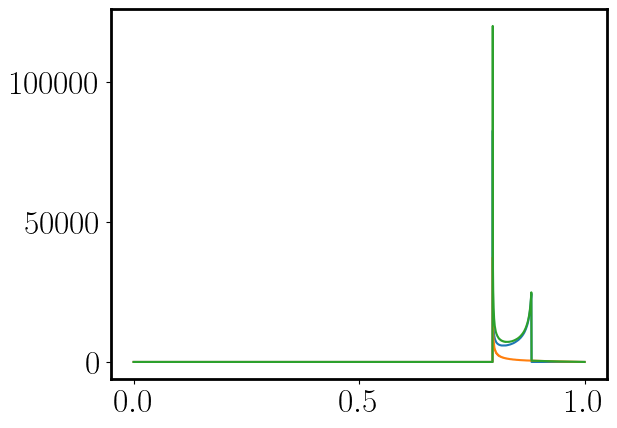

In [191]:
#Instantaneous AD with HO fit: T MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 1500
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

    # func_angnc = [0 for x in x_all]
    # func_angac = [0 for x in x_all]
    # func_angtc = [0 for x in x_all]
    
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 

        #Write to file: 
    
    with open('cherenkoviad_1500.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc, func_angac, func_angtc])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata1500 = 'cerenkoviad1500.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata1500, costheta=x_all, normal1500=func_angnc, anomalous1500=func_angac, total1500=func_angtc)

# print(x_all, func_angtc)

plt.plot(x_all, func_angnc)
plt.plot(x_all, func_angac)
        
plt.plot(x_all, func_angtc)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


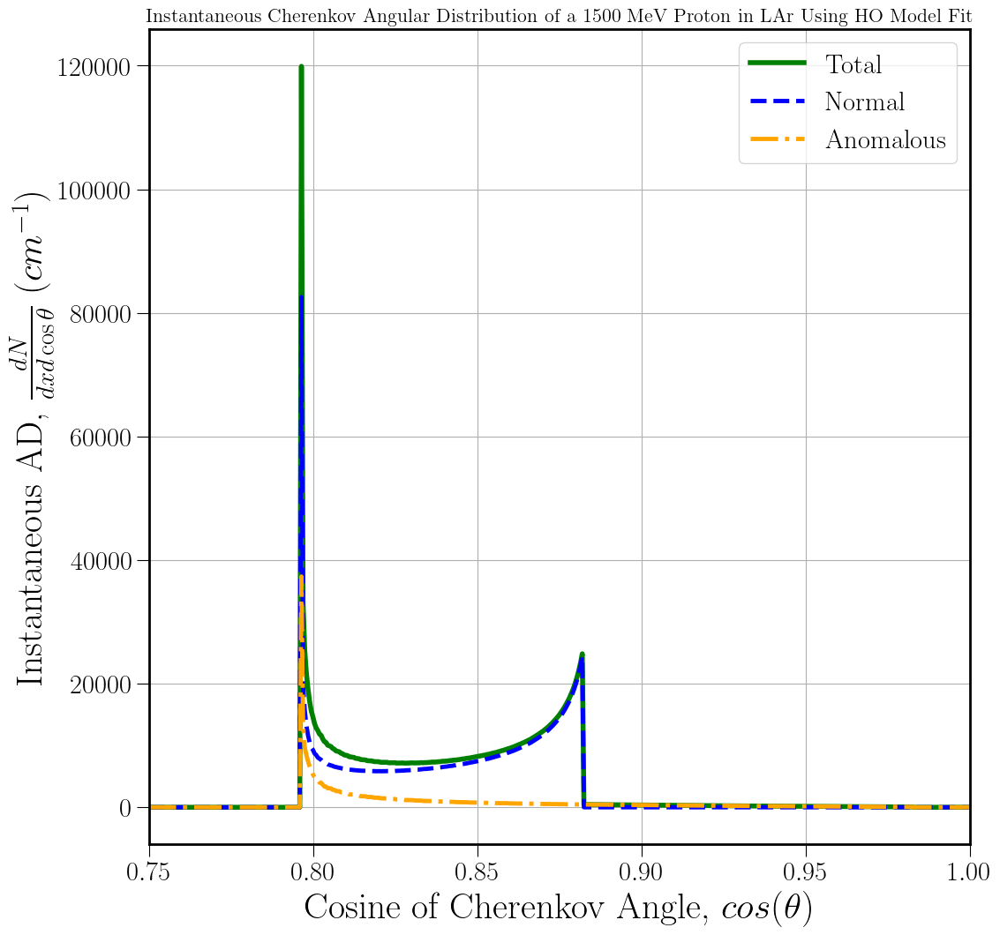

In [194]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Angular Distribution of a 1500 MeV Proton in LAr Using HO Model Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, func_angtc, linewidth= 4, c= 'g', label='Total'.format(float(t))) #total

ax.plot(x_all, func_angnc, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(t))) #normal
ax.plot(x_all, func_angac, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(t))) #anomalous
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.75,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Cherenkov_HOmodel_1500MeV.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716
beta= 0.9476655441957715, cos_ang_min= 0.7756152925240527, cos_ang_maxN= 0.8594433991521206, cos_ang_maxA= 0.9572761135414161


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1220413536.py:118: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1220413536.py:154: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Instantaneous Cerenkov photons emitted by a 2000 Mev Proton in LAr: 1049.807


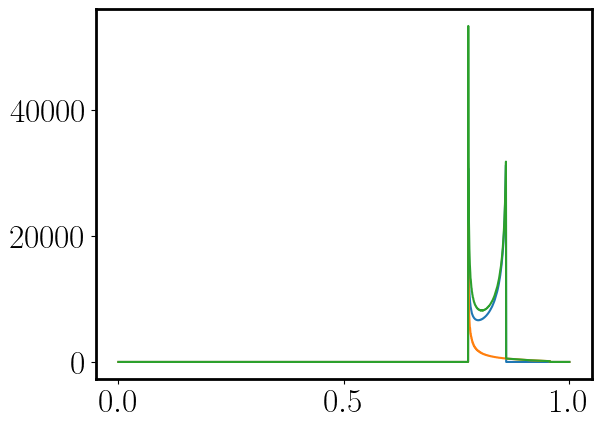

In [195]:
#Instantaneous AD with HO fit: T MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 2000
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)

cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all: 

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

    # func_angnc = [0 for x in x_all]
    # func_angac = [0 for x in x_all]
    # func_angtc = [0 for x in x_all]
    
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
    # lamdminr.append(lmin)
    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_angnc = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_angac = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 

        #Write to file: 
    
    with open('cherenkoviad_2000.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, func_angnc, func_angac, func_angtc])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata2000 = 'cerenkoviad2000.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata2000, costheta=x_all, normal2000=func_angnc, anomalous2000=func_angac, total2000=func_angtc)

# print(x_all, func_angtc)

plt.plot(x_all, func_angnc)
plt.plot(x_all, func_angac)
        
plt.plot(x_all, func_angtc)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_angtc)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


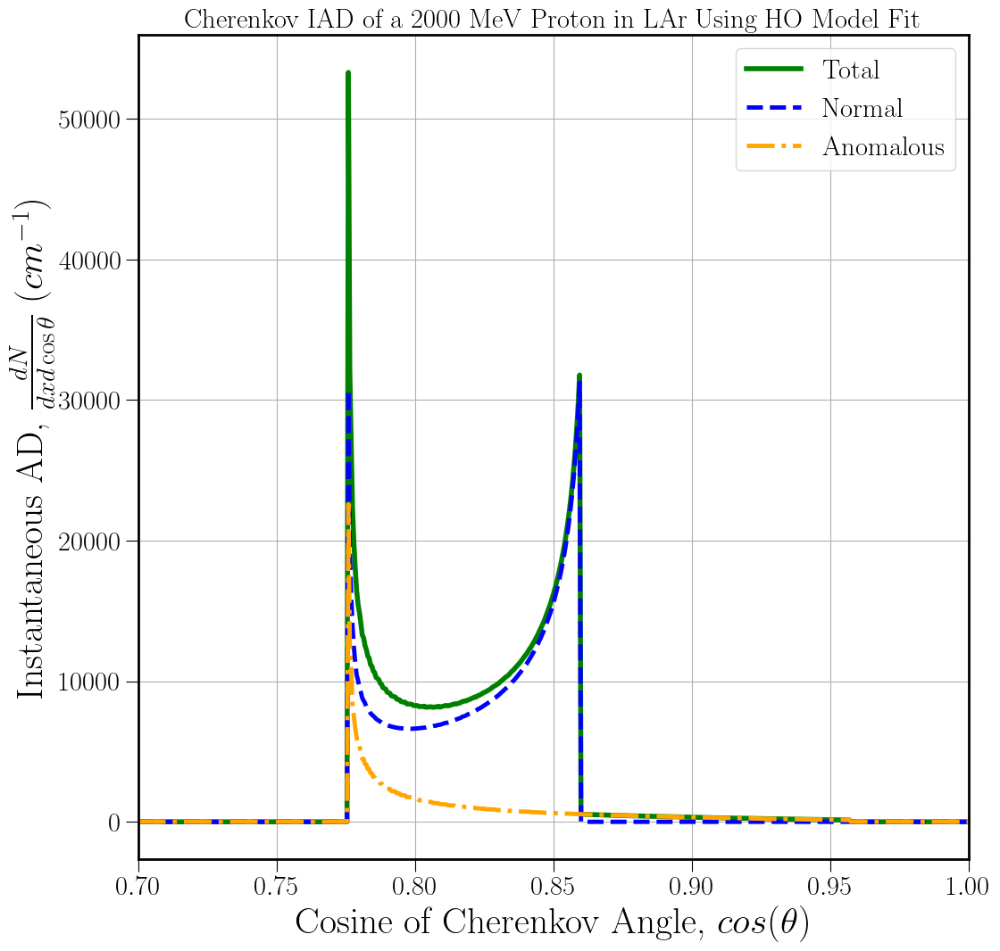

In [196]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Cherenkov IAD of a 2000 MeV Proton in LAr Using HO Model Fit", fontsize= 22) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, func_angtc, linewidth= 4, c= 'g', label='Total'.format(float(t))) #total

ax.plot(x_all, func_angnc, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(t))) #normal
ax.plot(x_all, func_angac, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(t))) #anomalous
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.7,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
plt.savefig('AD_Cherenkov_HOmodel_2000MeV.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.2278
beta= 0.7579653181328908, cos_ang_min= 0.969732876547658, cos_ang_maxN= 1, cos_ang_maxA= 1


C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3219768304.py:129: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3219768304.py:168: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

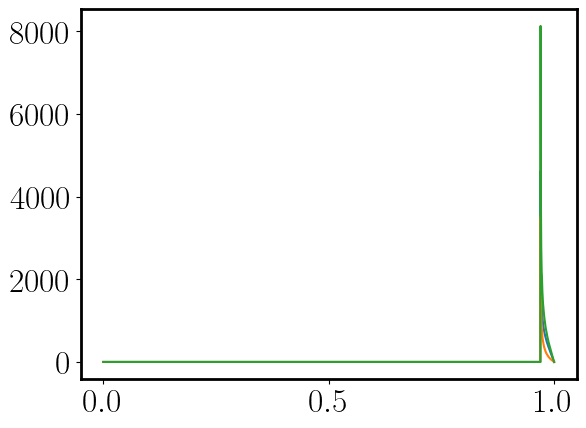

In [397]:
#Instantaneous AD with HO fit: 500 MeV 

# AD Instantaneous HO/ Jackson fit 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([500])
t = 500
dx = 0.1 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
i  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

lamdminr = []
lamdmaxr = []
    

cos_ang_min = 1/(i * n_peakr)
cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

for x in x_all:

    # cerenkovangsum = [0 for x in x_all]
    # cerenkovangnsum = [0 for x in x_all]
    # cerenkovangasum = [0 for x in x_all]

        
    def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))
    
           
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

    def func_angn(x):  #Normal AD_
        
        if x >= cos_ang_min and x <= cos_ang_maxn:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_500 < 1/(i*x) < n_peakr:   
                # lmin = lamd[min(idx)]
                lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_500:
                # lmin = max(lamd[min(idx)], 106.67)
                lmax = 500            
    
            d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
            lamdmaxr.append(lmax)
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
        else: 
            return 0 #To avaid getting negative contribution 

    func_ang2knc500 = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
    # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
            
    
    def func_anga(x):  #Anomalous AD
        if x >= cos_ang_min and x <= cos_ang_maxa:
            
            y= 1/(i*x)
            y = np.linspace(y,y,2000)   #wavelength of light 
            # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
            funclamd = n_jacksonr - y
            idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
#             if 1/(i*x) > n_peakr:
#                 lmin = lamd_peakr
#                 lmax = lamd_peakr
            
            if n_uvr < 1/(i*x) < n_peakr:   
                lmin = max(lamd[min(idx)], 106.67)
                # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
            if 1/(i*x) <= n_uvr:
                lmin = 106.67
                # lmax = 500            
    
            lamdminr.append(lmin)
            d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
            return 2*np.pi*1e7 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
        else: 
            return 0 #To avaid getting negative contribution 

    func_ang2kac500 = [func_anga(x) for x in x_all]       
           
    # cerenkovangasum = np.add(func_angac, cerenkovangasum) 
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
    
        
    func_ang2ktc500 = [(func_angn(x) + func_anga(x)) for x in x_all]  
            # func_angtc = func_angnc + func_angac 
print(x_all, func_ang2ktc500)

# plt.plot(x_all, lamdminr)
# plt.plot(x_all, lamdmaxr)

plt.plot(x_all, func_ang2knc500)
plt.plot(x_all, func_ang2kac500)
        
plt.plot(x_all, func_ang2ktc500)
    
print("Instantaneous Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(func_ang2ktc500) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


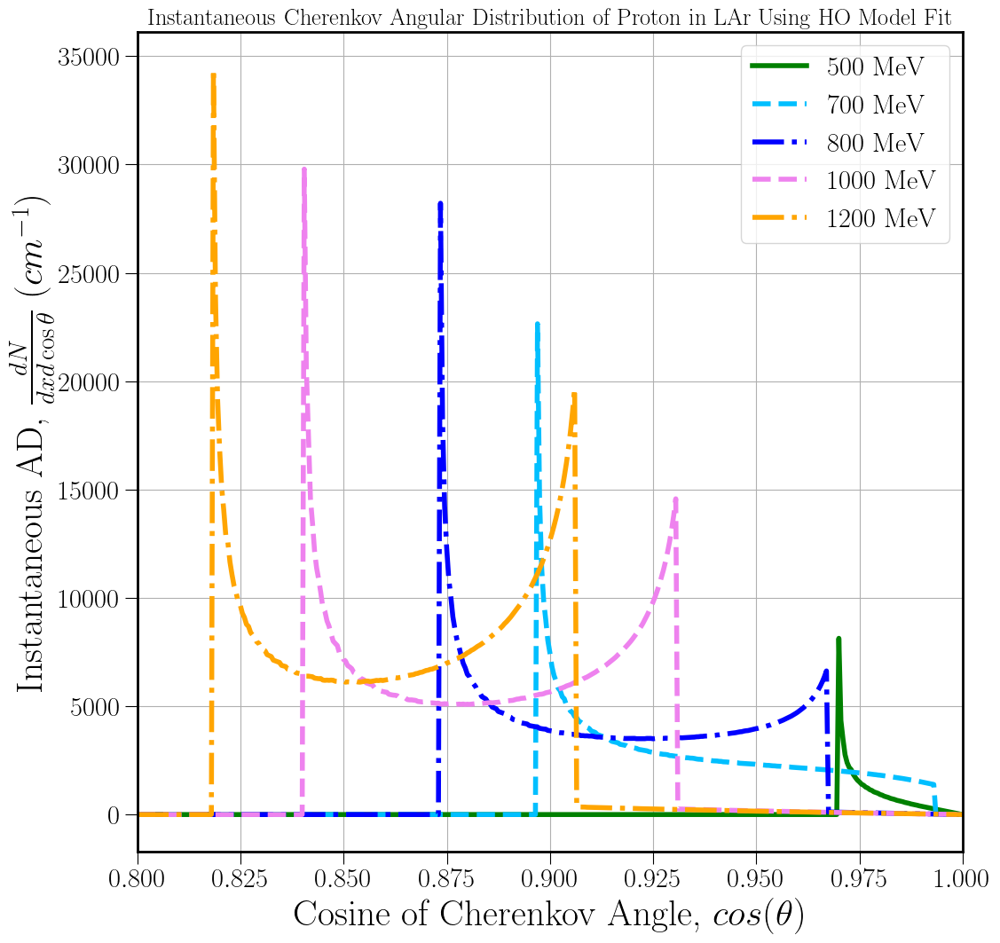

In [399]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Instantaneous Cherenkov Angular Distribution of Proton in LAr Using HO Model Fit", fontsize= 19) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Instantaneous AD, $\frac{dN}{dx d\cos\theta}$ $(cm^{-1})$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)


#500 MeV 
# ax.plot(x_all, func_ang2knc500, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_ang2kac500, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_ang2ktc500, ls= 'solid', linewidth= 4, c= 'g', label='500 MeV') #total

#700 MeV 
# ax.plot(x_all, func_angnc700, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac700, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc700, ls= 'dashed', linewidth= 4, c= 'deepskyblue', label='700 MeV') #total


#800 MeV 
# ax.plot(x_all, func_angnc800, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac800, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc800, ls='dashdot', linewidth= 4, c= 'b', label='800 MeV') #total

#1000 MeV 
# ax.plot(x_all, func_angnc1000, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac1000, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc1000, ls= 'dashed', linewidth= 4, c= 'violet', label=' 1000 MeV') #total

#1200 MeV 
# ax.plot(x_all, func_angnc1200, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# ax.plot(x_all, func_angac1200, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
ax.plot(x_all, func_angtc1200, ls='dashdot', linewidth= 4, c= 'orange', label='1200 MeV') #total

# #1500 MeV
# # ax.plot(x_all, func_angnc, ls='dashed', linewidth= 3.5, c='b', label='Normal'.format(float(j))) #normal
# # ax.plot(x_all, func_angac, ls='dashdot', linewidth= 3.5, c='orange', label='Anomalous'.format(float(j))) #anomalous
# ax.plot(x_all, func_angtc, ls= 'dotted', linewidth= 4, c= 'red', label='1200 MeV') #total
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.80,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
plt.savefig('AD_inst_Cherenkov_HOmodel_allT.jpg', bbox_inches= "tight") 
    

# Integrated AD

In [4]:
#Defining a function to calculate the betalist for some given initial K.E of Proton in LAr
#Calculating range of Proton of different initial KE travelling in LAr: 

t_arr = np.array([383.96156,385,400,450,500,550,600,650,700,750,800,850,900,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

rho = 1.38 #density of LAr in kg/m^3 at 89K temperature  
me = 9.11e-31 #Electron's mass in Kg.
io = 23.6e-6  #Average Ionization Potential of LAr in MeV
k =  0.307  #Constant in MeV.cm^2/g 
zb = 18  #Atomic No of Ar (absorber)
a = 39.948  #Mass no of Ar (absorber)
zs = 1 #charge of the particle 
c = 3e8
e = me*c**2/1.602e-13 #m(e)c^2 in MeV (1 MeV = 1.602e-13 J) #Electron's mass in MeV (the hit particle)
mp = 938 #Proton's mass in MeV/c^2 
k1 = k*rho*zb*zs**2/a
k2 = 2*e/io 

# lamd = np.linspace(100,200,925)   #wavelength of light 


#def make_first_list(t):


def make_betalist(t,x,dx):
    ''' t = t_list input from data'''
    
    
    xlist = []
    tlist = [] 
    tslope = []
    betalist = []
    
#     x = 0 #in cm 
#     dx = 0.01 #in cm 
    
    while t>0: 
        
        beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
        t_slope = (((k1*np.log(k2*(beta**2/(1-beta**2))))/beta**2) - k1)
        t = t - (t_slope * dx)
        tslope.append(t_slope)
        tlist.append(t)
        betalist.append(beta)

        x=x+dx    
        xlist.append(x)
        
#       print(t, beta, xlist)
         
    #Linear Interpolation: 

    if (len(tlist)>1)  and (len(xlist)>1):
    
        tnp1 = tlist[-1]
        tnp2 = tlist[-2]
        xnp1 = xlist[-1]
        xnp2 = xlist[-2]
        
        rang = xnp2 - (tnp2 * ((xnp1-xnp2)/(tnp1 - tnp2))) #Range of Proton: Relativistic approach 
#         print(betalist)
        
        return betalist  #range


betalist_500 = make_betalist(500,0,0.1)
# print(betalist_500)


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_13376\1472925768.py:140: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_13376\1472925768.py:179: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [  0.           0.           0.         ... 346.33408436 178.54554547
   0.        ]
Total Cerenkov photons emitted by a [460] Mev Proton in LAr: 7.574


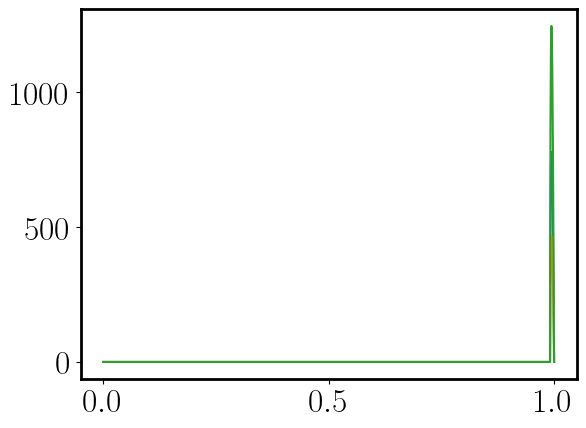

In [38]:
#Integrated AD with HO fit: 460 MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([460])
# t = 500
dx = 0.001 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.001

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsum460 = [0 for x in x_all]
    cerenkovangasum460 = [0 for x in x_all]

    cerenkovangtsum460 = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.001)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc460t = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac460t = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc460t = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsum460 = np.add(func_angnc460t, cerenkovangnsum460) 
        cerenkovangasum460 = np.add(func_angac460t, cerenkovangasum460) 
        cerenkovangtsum460 = np.add(func_angtc460t, cerenkovangtsum460)
            # func_angtc = func_angnc + func_angac 

    
    #Write to file: 
    
    with open('cherenkovad_460.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, cerenkovangnsum460, cerenkovangasum460, cerenkovangtsum460])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata460 = 'cerenkovdata460.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata460, costheta=x_all, normal460=cerenkovangnsum460, anomalous460=cerenkovangasum460, total460=cerenkovangtsum460)
    
    print(x_all, cerenkovangtsum460)

    plt.plot(x_all, cerenkovangnsum460)
    plt.plot(x_all, cerenkovangasum460)
        
    plt.plot(x_all, cerenkovangtsum460)
    
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(cerenkovangtsum460)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_13376\786003549.py:140: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_13376\786003549.py:179: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [  0.           0.           0.         ... 531.41604941 269.6902223
   0.        ]
Total Cerenkov photons emitted by a [475] Mev Proton in LAr: 43.814


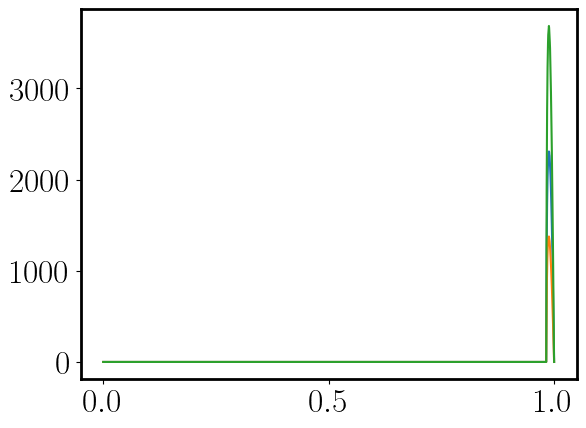

In [34]:
#Integrated AD with HO fit: 475 MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([475])
# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.001

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsum475 = [0 for x in x_all]
    cerenkovangasum475 = [0 for x in x_all]

    cerenkovangtsum475 = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.001)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc475t = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac475t = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc475t = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsum475 = np.add(func_angnc475t, cerenkovangnsum475) 
        cerenkovangasum475 = np.add(func_angac475t, cerenkovangasum475) 
        cerenkovangtsum475 = np.add(func_angtc475t, cerenkovangtsum475)
            # func_angtc = func_angnc + func_angac 

    
    #Write to file: 
    
    with open('cherenkovad_475.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, cerenkovangnsum475, cerenkovangasum475, cerenkovangtsum475])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata475 = 'cerenkovdata475.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata475, costheta=x_all, normal475=cerenkovangnsum475, anomalous475=cerenkovangasum475, total475=cerenkovangtsum475)
    
    print(x_all, cerenkovangtsum475)

    plt.plot(x_all, cerenkovangnsum475)
    plt.plot(x_all, cerenkovangasum475)
        
    plt.plot(x_all, cerenkovangtsum475)
    
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(cerenkovangtsum475)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


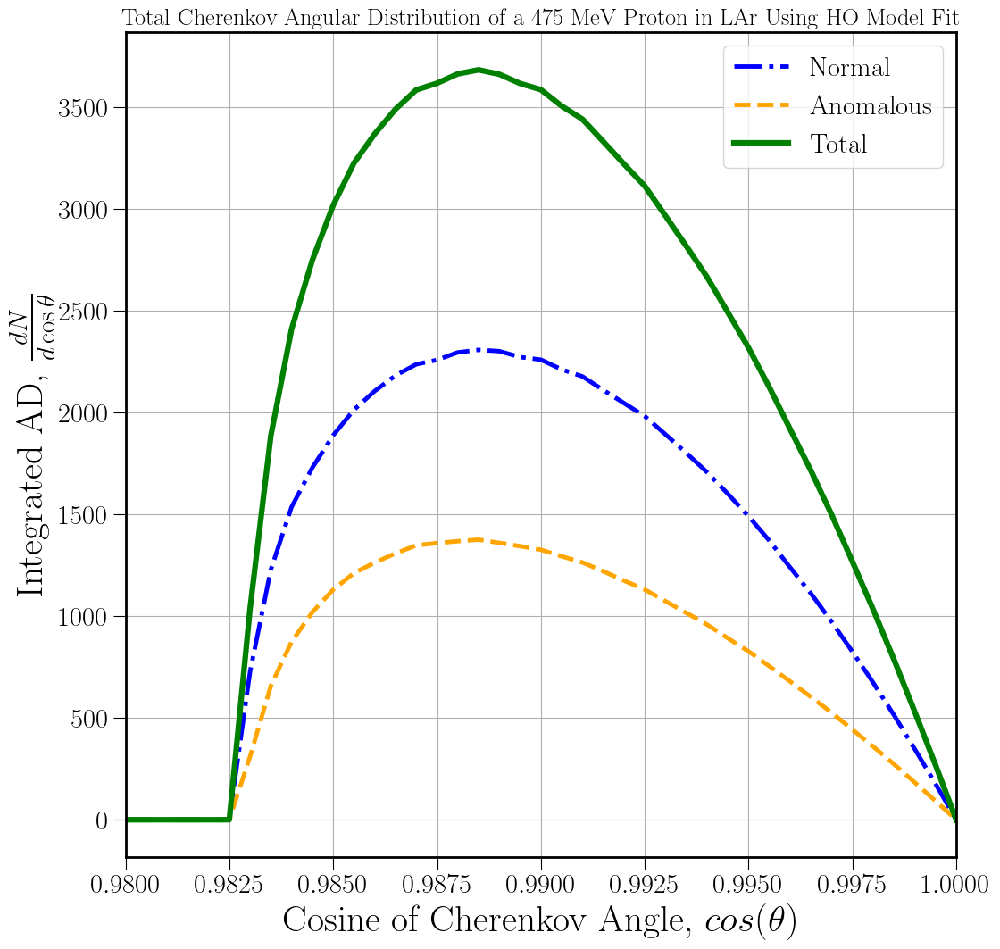

In [31]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of a 475 MeV Proton in LAr Using HO Model Fit", fontsize= 19) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangnsum475, linewidth= 3.5, ls='dashdot', c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasum475, linewidth= 3.5, ls= 'dashed', c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, cerenkovangtsum475, linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total
    
# plt.xlim([0.999/(n_peakr*filtered_lst_res[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.98,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 
# plt.savefig('AD_Total_Cherenkov_HOmodel_475MeV_dxp001dth2k.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_13376\3409784274.py:136: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_13376\3409784274.py:175: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [  0.           0.           0.         ... 803.32856543 405.28243608
   0.        ]
Total Cerenkov photons emitted by a [500] Mev Proton in LAr: 200.316


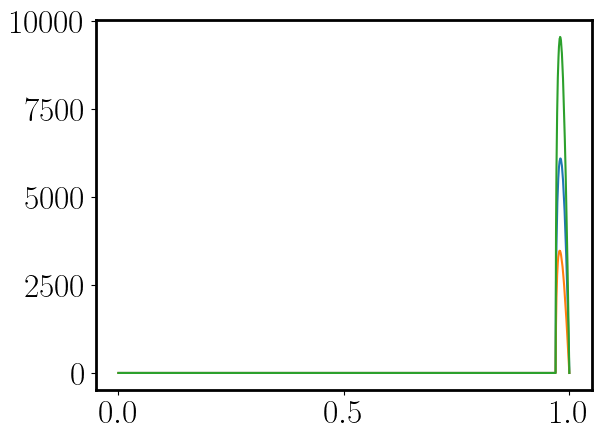

In [21]:
#Integrated AD with HO fit: 500 MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([500])
# t = 500
dx = 0.01 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.001

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsum500 = [0 for x in x_all]
    cerenkovangasum500 = [0 for x in x_all]

    cerenkovangtsum500 = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.001)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc500t = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac500t = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc500t = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsum500 = np.add(func_angnc500t, cerenkovangnsum500) 
        cerenkovangasum500 = np.add(func_angac500t, cerenkovangasum500) 
        cerenkovangtsum500 = np.add(func_angtc500t, cerenkovangtsum500)
            # func_angtc = func_angnc + func_angac 

    
    #Write to file: 
    
    with open('cherenkovad_500dxp001.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, cerenkovangnsum500, cerenkovangasum500, cerenkovangtsum500])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata500 = 'cerenkovdata500dxp001.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata500, costheta=x_all, normal500=cerenkovangnsum500, anomalous500=cerenkovangasum500, total500=cerenkovangtsum500)
    
    print(x_all, cerenkovangtsum500)

    plt.plot(x_all, cerenkovangnsum500)
    plt.plot(x_all, cerenkovangasum500)
        
    plt.plot(x_all, cerenkovangtsum500)
    
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t, (sum(cerenkovangtsum500)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


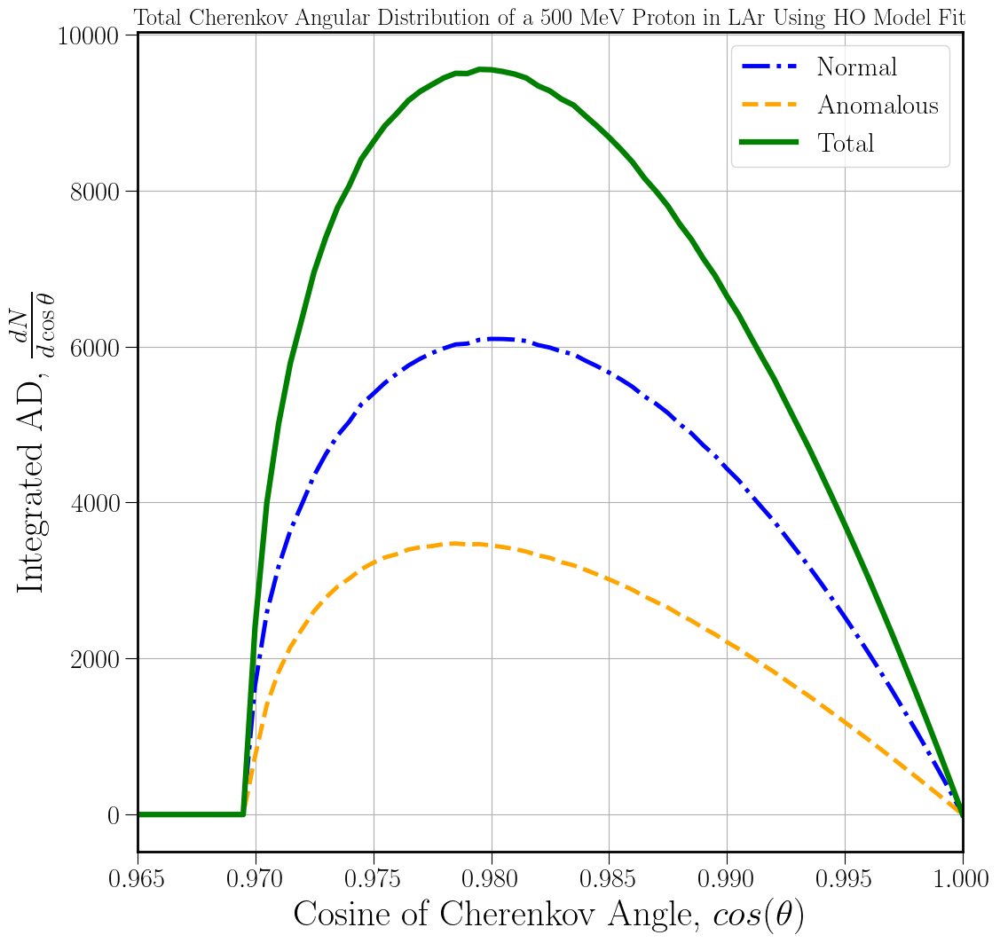

In [22]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using HO Model Fit", fontsize= 19) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangnsum500, linewidth= 3.5, ls='dashdot', c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasum500, linewidth= 3.5, ls= 'dashed', c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, cerenkovangtsum500, linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total
    
# plt.ylim(0,0.2e7)
plt.xlim(0.965,1)
# plt.xlim([0.999/(n_peakr*filtered_lst_res[0]), 1])

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp001dth2k.jpg', bbox_inches= "tight") 
    

In [ ]:
#Integrated Angular Distribution of Cerenkov Radiation (Babicz Fit)

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
# lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_uv = 108.657 #in nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)
dx = 0.1

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.68,700,750,800,850,900,950,1000]) #,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# t = np.array([200,400,500,600,678.78,700,750]) #,800,900,1000 #,500 #,550,600,650,697.678,700,750,800,850,900,950,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([700,750]) #,800,900,1000 #,500 #,550,600,650,697.678,700,750,800,850,900,950,1000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# t = np.array([383.962,400,500]) #,600,650,700,750,800,815,820,850]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([700,750,800,805,810])

t = np.array([500])

#Scintillation 
cerenkovangsum = []

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Comparison of Integrated Angular Distribution of a 500 MeV Proton in LAr Using Babicz's Fit Vs This Work (HO)", fontsize= 13)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
#     ax.grid()
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

for j in t: 

    cerenkovanglistb = []
    cerenkovangsumb = [0 for x in x_all]
    
    mybetalist = make_betalist(j,0,0.1)
#     print(j, mybetalist)
#     filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
#     print(j, np.shape(filtered_betalist), filtered_betalist)

    scintp = 40000*j*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
    scint = np.linspace(scintp, scintp, 2000)


    for b in mybetalist: 
        
            
#         cos_ang_min = 1/(b*n_max)
#         print(j,b)
        cos_ang_minb = 0
        cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)
    
        def func_ang_babics(x):
            
            lamd_thetab = np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv

            func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
#             func_ang_babics = ((2*np.pi*4/10) * (alpha/(9 * a_0b * a_uvb * lamd_thetab**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) - (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))/b) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(1/2))  
#             print(j,b,lamd_theta,func_ang_grace)
            if x >= cos_ang_minb and x <= cos_ang_maxb:
                return func_ang_babics #total ang distr
            else: 
                return 0 #To avaid getting negative contribution 
# #     print(b)

           
        func_ang_babicsc = [func_ang_babics(x) for x in x_all]  
        
#         print(func_ang_babicsc) #, cerenkovangsumg
        
# cerenkovanglist.append(func_angtc) #indices 0,1 = int,err
        cerenkovangsumb = np.add(func_ang_babicsc, cerenkovangsumb)
#         print(cerenkovangsumb)
        
        
#     print("Total Cherenkov photons emitted by a {} Mev Proton in LAr using Grace fit: {:.3f}" .format(j, (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cherenkov photons emitted by a {} Mev Proton in LAr using Babicz's fit: {:.3f}" .format(j, (np.nansum(cerenkovangsumb) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    
    ax.plot(x_all, cerenkovangsumb,  ls= 'dashdot', linewidth= 4, color= 'm', label= "Total(Babicz)")
    
    #HO fit: 
    ax.plot(x_all, 2*cerenkovangtsum500*(0.01/0.1), linewidth= 4, c= 'g', label='$2 \\times$Total(HO)'.format(float(j))) #total

    ax.plot(x_all, 2*cerenkovangnsum500*(0.01/0.1), linewidth= 3.5, c='b', label='$2 \\times$Normal(HO)'.format(float(j))) #normal ls= 'dotted',
    ax.plot(x_all, 2*cerenkovangasum500*(0.01/0.1), linewidth= 3.5, c='orange', label='$2 \\times$Anomalous(HO)'.format(float(j))) #anomalous ls= 'dotted',

    
# #     ax.plot(x_all, scint)  #40000*500*0.275
#     plt.show()
# #     plt.plot(x_all, scint)
# #     plt.yscale("log")

#     plt.xlim(0.8,1)
# #     plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
#     plt.ylim(0,0.2e7)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Cherenkov_Babicz_dxp1dth2000_10to1600MeV.jpg', bbox_inches= "tight") #_10to1000MeV

# plt.savefig('AD_Cherenkov_Babicz_dxp1dth2000_500MeV.jpg', bbox_inches= "tight")    
plt.savefig('angdist_total_dcostheta_babiczvsho_500MeV_comparisonplot.jpg', bbox_inches= "tight")    

In [ ]:
#Integrated AD with HO fit: 750 MeV 
import csv
from itertools import zip_longest

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([750])
# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.01

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsumhot = [0 for x in x_all]
    cerenkovangasumhot = [0 for x in x_all]

    cerenkovangtsumhot = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.01)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnchot = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angachot = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtchot = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumhot = np.add(func_angnchot, cerenkovangnsumhot) 
        cerenkovangasumhot = np.add(func_angachot, cerenkovangasumhot) 
        cerenkovangtsumhot = np.add(func_angtchot, cerenkovangtsumhot)


    # if plotting==True:
    #     plt.plot(x_all, cerenkovangtsumhot)
    #     plt.show()
    
    # print('saving to text file')
    

    # Saving to file: 
    
    #     with open('cherenkovad_750.csv', 'w', encoding='UTF8', newline='') as f:
    #         writer = csv.writer(f)
    
    #         # write the header
            
    #         header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
    #         writer.writerow(header)
    
    #         # write multiple rows 
    #         writer.writerows([x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])  #Row wise csv -> mathematica ring plots
            
    #         # columns_data = zip_longest(*data)
    #         # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
# #     print(t, beta, cerenkovt1sum)
    
#     # Choose a filename, ending in .npz
#     cerenkovdata750 = 'cerenkovdata750.npz'

#     # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
#     np.savez(cerenkovdata750, costheta=x_all, normal750=cerenkovangnsumhot, anomalous750=cerenkovangasumhot, total750=cerenkovangtsumhot)
    
    print(x_all, cerenkovangtsumhot)

    plt.plot(x_all, cerenkovangnsumhot)   #* (dx/0.1))
    plt.plot(x_all, cerenkovangasumhot)   #* (dx/0.1))
    plt.plot(x_all, cerenkovangtsumhot)   #* (dx/0.1))
    
    print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangnsumhot)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangasumhot)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangtsumhot)/2000) )) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18664\3077649799.py:142: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18664\3077649799.py:181: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


In [174]:
# Load the saved file
npzfile750 = np.load(cerenkovdata750)

# Extract the arrays using the argument names you fed to "np.savez"
costhetas = npzfile750['costheta']

normals750 = npzfile750['normal750']
anomalouss750 = npzfile750['anomalous750']
totals750 = npzfile750['total750']

# Create the plot using the loaded arrays

# fig, axis = plt.subplots(edgecolor='black', linewidth=5)
# axis.plot(costhetas, normals750)
# axis.plot(costhetas, anomalouss750)
# axis.plot(costhetas, totals750)

In [ ]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of a 750 MeV Proton in LAr Using HO Model Fit", fontsize= 19) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(costhetas, normals750, linewidth= 3.5, ls='dashdot', c='b', label='Normal'.format(float(j))) #normal
ax.plot(costhetas, anomalouss750, linewidth= 3.5, ls= 'dashed', c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(costhetas, totals750, linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total

# axis.plot(costhetas, normals750)
# axis.plot(costhetas, anomalouss750)
# axis.plot(costhetas, totals750)

# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.86,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 
# plt.savefig('AD_Total_Cherenkov_HOmodel_750MeV_dxp01dth2k.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18664\4175111167.py:132: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18664\4175111167.py:171: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [   0.            0.            0.         ... 4874.53582209 2424.01867924
    0.        ]
Normal Cerenkov photons emitted by a [750] Mev Proton in LAr (HO Fit): 11633.734
Anomalous Cerenkov photons emitted by a [750] Mev Proton in LAr (HO Fit): 3530.501
Total Cerenkov photons emitted by a [750] Mev Proton in LAr (HO Fit): 15164.235


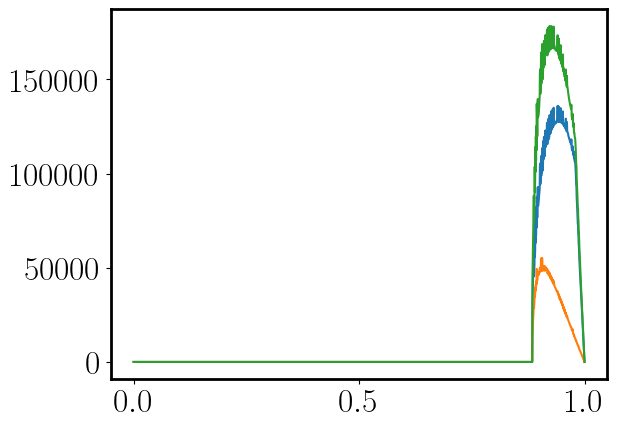

In [18]:
#Projection on a screen

#Integrated AD with HO fit: 750 MeV 
import csv
from itertools import zip_longest

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([750])
# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.1

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsumhot = [0 for x in x_all]
    cerenkovangasumhot = [0 for x in x_all]

    cerenkovangtsumhot = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.1)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnchot = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angachot = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtchot = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumhot = np.add(func_angnchot, cerenkovangnsumhot) 
        cerenkovangasumhot = np.add(func_angachot, cerenkovangasumhot) 
        cerenkovangtsumhot = np.add(func_angtchot, cerenkovangtsumhot)

        cerenkovangnscreen = cerenkovangnsumhot * (x**2 * np.sin(np.arccos(x))) 
        cerenkovangascreen = cerenkovangasumhot * (x**2 * np.sin(np.arccos(x)))
        cerenkovangtscreen = cerenkovangtsumhot * (x**2 * np.sin(np.arccos(x)))


    # if plotting==True:
    #     plt.plot(x_all, cerenkovangtsumhot)
    #     plt.show()
    
    # print('saving to text file')
    

    # Saving to file: 
    
    #     with open('cherenkovad_750.csv', 'w', encoding='UTF8', newline='') as f:
    #         writer = csv.writer(f)
    
    #         # write the header
            
    #         header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
    #         writer.writerow(header)
    
    #         # write multiple rows 
    #         writer.writerows([x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])  #Row wise csv -> mathematica ring plots
            
    #         # columns_data = zip_longest(*data)
    #         # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
# #     print(t, beta, cerenkovt1sum)
    
#     # Choose a filename, ending in .npz
#     cerenkovdata750 = 'cerenkovdata750.npz'

#     # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
#     np.savez(cerenkovdata750, costheta=x_all, normal750=cerenkovangnsumhot, anomalous750=cerenkovangasumhot, total750=cerenkovangtsumhot)
    
    print(x_all, cerenkovangtsumhot)

    plt.plot(x_all, cerenkovangnsumhot)   
    plt.plot(x_all, cerenkovangasumhot)   
    plt.plot(x_all, cerenkovangtsumhot) 

    print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangnsumhot)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangasumhot)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangtsumhot)/2000) )) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


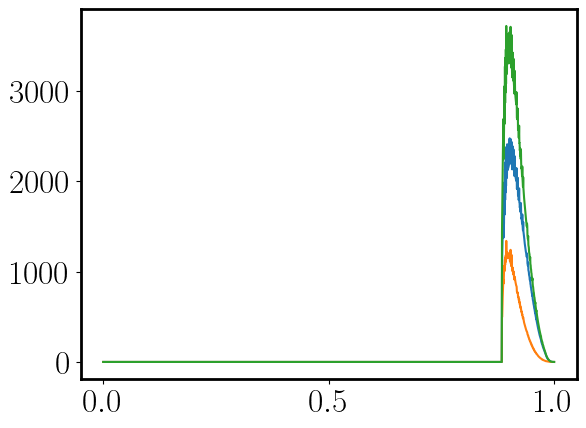

In [16]:
plt.plot(x_all, cerenkovangnscreen)   #* (dx/0.1))
plt.plot(x_all, cerenkovangascreen)   #* (dx/0.1))
plt.plot(x_all, cerenkovangtscreen)   #* (dx/0.1))

In [91]:
import csv
from itertools import zip_longest

data = [[1,2,3,4],[5,6]]
columns_data = zip_longest(*data)

with open("file.csv","w") as f:
    writer = csv.writer(f)
    writer.writerows(columns_data)




In [96]:
# Program to save a NumPy array to a text file
 
# Importing required libraries
import numpy
 
# Creating an array
List = [1, 2, 3, 4, 5]
Array = numpy.array(List)
 
# Displaying the array
print('Array:\n', Array)
 
# Saving the array in a text file
numpy.savetxt("file1.txt", Array)
 
# Displaying the contents of the text file
content = numpy.loadtxt('file1.txt')
print("\nContent in file1.txt:\n", content)

Array:
 [1 2 3 4 5]

Content in file1.txt:
 [1. 2. 3. 4. 5.]


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\1598413903.py:135: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\1598413903.py:174: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [   0.            0.            0.         ... 5484.46880108 2738.75186121
    0.        ]
Normal Cerenkov photons emitted by a [2000] Mev Proton in LAr (HO Fit): 339467.106
Anomalous Cerenkov photons emitted by a [2000] Mev Proton in LAr (HO Fit): 72779.586
Total Cerenkov photons emitted by a [2000] Mev Proton in LAr (HO Fit): 412246.693


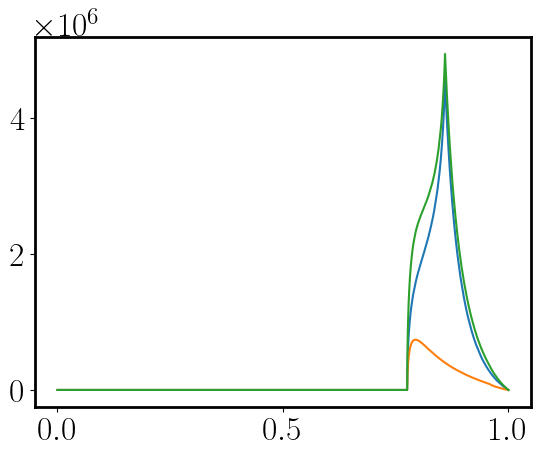

In [158]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([2000])
# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.01

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsumhot = [0 for x in x_all]
    cerenkovangasumhot = [0 for x in x_all]

    cerenkovangtsumhot = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.01)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnchot = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angachot = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtchot = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumhot = np.add(func_angnchot, cerenkovangnsumhot) 
        cerenkovangasumhot = np.add(func_angachot, cerenkovangasumhot) 
        cerenkovangtsumhot = np.add(func_angtchot, cerenkovangtsumhot)


    #Write to file: 
    
    with open('cherenkovad_2000.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  
        
    
    # print(t, beta, cerenkovt1sum)
    
    # Choose a filename, ending in .npz
    cerenkovdata2000 = 'cerenkovdata2000.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata2000, costheta=x_all, normal2000=cerenkovangnsumhot, anomalous2000=cerenkovangasumhot, total2000=cerenkovangtsumhot)
    
    print(x_all, cerenkovangtsumhot)

    plt.plot(x_all, cerenkovangnsumhot)
    plt.plot(x_all, cerenkovangasumhot)
    plt.plot(x_all, cerenkovangtsumhot)
    
    print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangnsumhot)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangasumhot)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangtsumhot)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


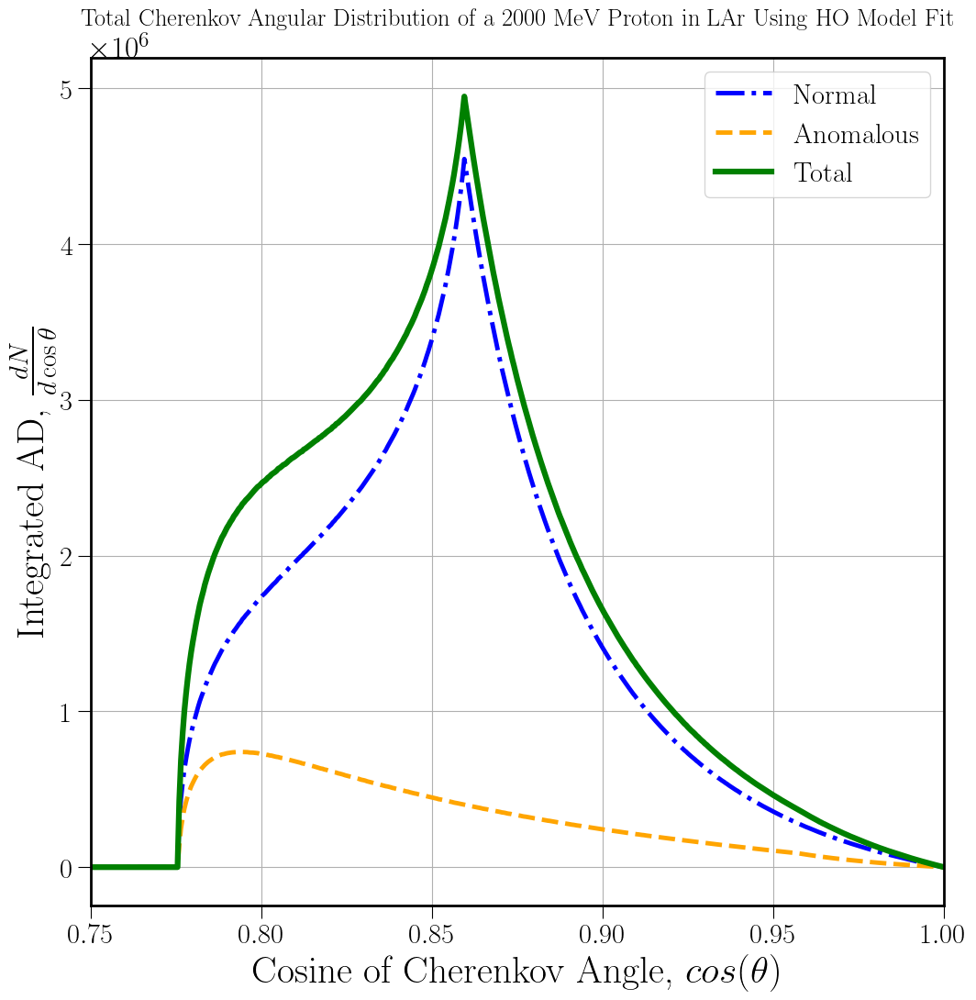

In [161]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of a 2000 MeV Proton in LAr Using HO Model Fit", fontsize= 19) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangnsumhot, linewidth= 3.5, ls='dashdot', c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasumhot, linewidth= 3.5, ls= 'dashed', c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, cerenkovangtsumhot, linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.75,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 
plt.savefig('AD_Total_Cherenkov_HOmodel_2000MeV_dxp01dth2k.jpg', bbox_inches= "tight") 
    

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\40866868.py:135: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\40866868.py:174: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


saving to text file
[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [   0.            0.            0.         ... 5390.14624469 2676.62238898
    0.        ]
Normal Cerenkov photons emitted by a [1200] Mev Proton in LAr (HO Fit): 94945.496
Anomalous Cerenkov photons emitted by a [1200] Mev Proton in LAr (HO Fit): 21322.630
Total Cerenkov photons emitted by a [1200] Mev Proton in LAr (HO Fit): 116268.126


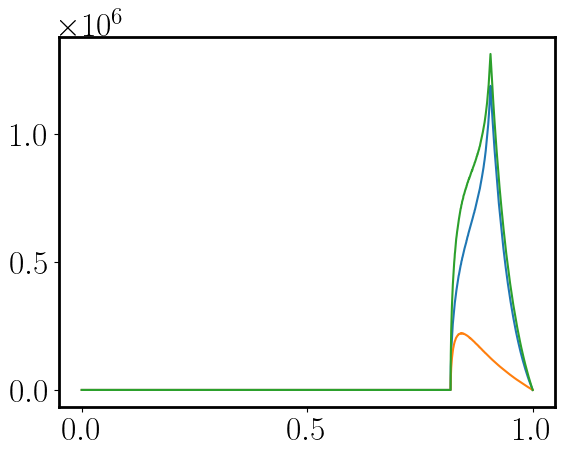

In [108]:
#Integrated AD with HO fit: T=1200 MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([1200])
# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.01

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsumhot = [0 for x in x_all]
    cerenkovangasumhot = [0 for x in x_all]

    cerenkovangtsumhot = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.01)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnchot = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angachot = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtchot = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumhot = np.add(func_angnchot, cerenkovangnsumhot) 
        cerenkovangasumhot = np.add(func_angachot, cerenkovangasumhot) 
        cerenkovangtsumhot = np.add(func_angtchot, cerenkovangtsumhot)

    # if plotting==True:
    #     plt.plot(x_all, cerenkovangtsumhot)
    #     plt.show()
    
    # print('saving to text file')
    


    # 
    
    
    # # Choose a filename, ending in .npz
    # cerenkovdata1200 = 'cerenkovdata1200.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata1200, costheta=x_all, normal1200=cerenkovangnsumhot, anomalous1200=cerenkovangasumhot, total1200=cerenkovangtsumhot)
    
    print(x_all, cerenkovangtsumhot)

    plt.plot(x_all, cerenkovangnsumhot)
    plt.plot(x_all, cerenkovangasumhot)
    plt.plot(x_all, cerenkovangtsumhot)
    
    print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangnsumhot)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangasumhot)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangtsumhot)/2000))) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


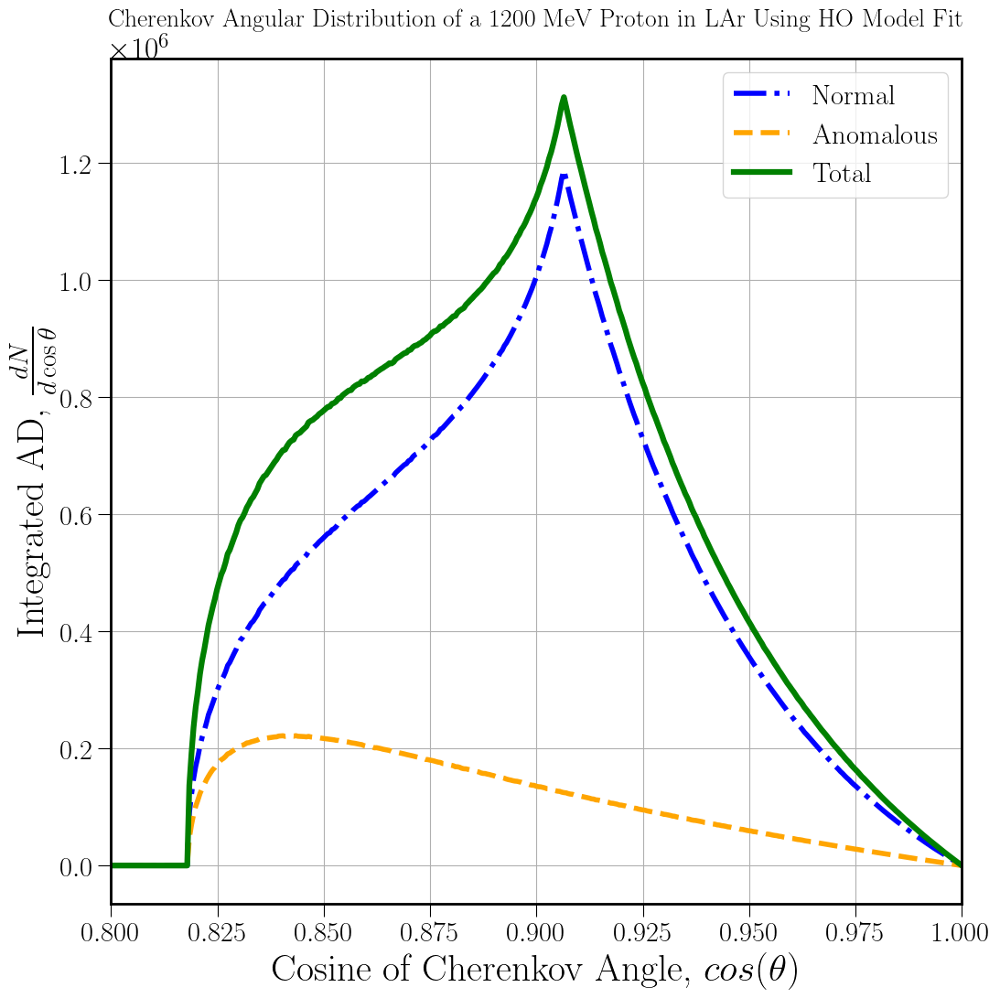

In [115]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

# plt.rc("text", usetex=True)
# plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
# plt.rc('font', size=24) 
# plt.rc('font', family='serif')

# #     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
# plt.rcParams["font.weight"] = "bold"     
# #     plt.rcParams["axes.labelweight"] = "bold"
# plt.rc('axes', linewidth=2)


ax.set_title(r"Cherenkov Angular Distribution of a 1200 MeV Proton in LAr Using HO Model Fit", fontsize= 20) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangnsumhot, ls='dashdot', linewidth= 4, c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasumhot, ls='dashed', linewidth= 4, c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, cerenkovangtsumhot, linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total
    
# plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.8,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 

plt.savefig('AD_Total_Cherenkov_HOmodel_1200MeV_dxp01dth2k.jpg', bbox_inches= "tight")     

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\1639754756.py:135: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\1639754756.py:174: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


saving to text file
[0.00000000e+00 5.00250125e-04 1.00050025e-03 ... 9.98999500e-01
 9.99499750e-01 1.00000000e+00] [   0.            0.            0.         ... 5484.27129772 2736.58869716
    0.        ]
Normal Cerenkov photons emitted by a [1500] Mev Proton in LAr (HO Fit): 177421.306
Anomalous Cerenkov photons emitted by a [1500] Mev Proton in LAr (HO Fit): 38624.020
Total Cerenkov photons emitted by a [1500] Mev Proton in LAr (HO Fit): 216045.326


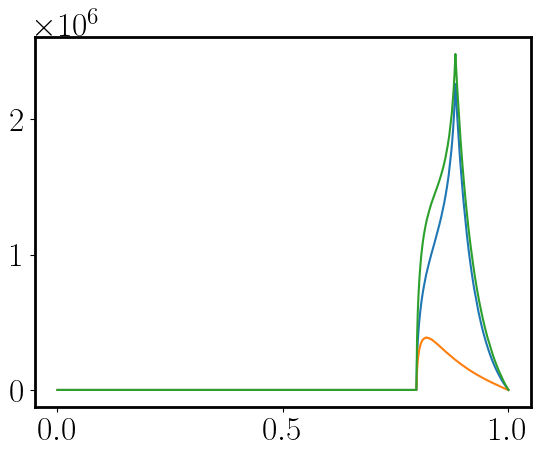

In [124]:
#Integrated AD with HO fit: T=1500 MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([1500])
# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV
#T = 90 K

# PVS {a0 -> 1.18416, aPVS -> 0.000325985, \[CapitalGamma] -> 0.000693652}
# a_0 = 1.18416
# a_pvs = 0.000325985
# gamma = 0.000693652
# n_max = 1.419


lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 


#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.01

lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkov_alln =  [] #[[] for j in t] #normal
# cerenkov_alla =  [] #[[] for j in t] #anomalous

# cerenkov_all =  [] #[[] for j in t] #total
# scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    
# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

for j in t: 

    cerenkovangnsumhot = [0 for x in x_all]
    cerenkovangasumhot = [0 for x in x_all]

    cerenkovangtsumhot = [0 for x in x_all]
   
    mybetalist = make_betalist(j,0,0.01)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    # if 1/(i*x) <= n_500:
                    #     # lmin = max(lamd[min(idx)], 106.67)
                    #     lmax = 500            

                    # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnchot = [func_angn(x) for x in x_all]  
    # print(x_all, func_angnc)
    # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
                # if 1/(i*x) > n_peakr:
                # lmin = lamd_peakr
                # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = max(lamd[min(idx)], 106.67)
                    # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                    
                lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)
        
    # print(j, i, lamdminr, lamdmaxr)
    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angachot = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtchot = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumhot = np.add(func_angnchot, cerenkovangnsumhot) 
        cerenkovangasumhot = np.add(func_angachot, cerenkovangasumhot) 
        cerenkovangtsumhot = np.add(func_angtchot, cerenkovangtsumhot)

    if plotting==True:
        plt.plot(x_all, cerenkovangtsumhot)
        plt.show()
    
    print('saving to text file')
    

#Saving to file: 

    with open('cherenkovad_1500.csv', 'w', encoding='UTF8', newline='') as f:
        writer = csv.writer(f)

        # write the header
        
        header = ['costheta','Normal_Cherenkov', 'Anomalous_Cherenkov', 'Total_Cherenkov']
        writer.writerow(header)

        # write multiple rows 
        writer.writerows([x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])  #Row wise csv -> mathematica ring plots
        
        # columns_data = zip_longest(*data)
        # writer.writerows(zip_longest(*[x_all, cerenkovangnsumhot, cerenkovangasumhot, cerenkovangtsumhot])) #Column wise csv  

    # Choose a filename, ending in .npz
    cerenkovdata1500 = 'cerenkovdata1500.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovdata1500, costheta=x_all, normal1500=cerenkovangnsumhot, anomalous1500=cerenkovangasumhot, total1500=cerenkovangtsumhot)
    
    print(x_all, cerenkovangtsumhot)

    plt.plot(x_all, cerenkovangnsumhot)
    plt.plot(x_all, cerenkovangasumhot)
    plt.plot(x_all, cerenkovangtsumhot)
    
    print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangnsumhot)/2000)) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangasumhot)/2000)) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr (HO Fit): {:.3f}" .format(t, (sum(cerenkovangtsumhot)/2000)) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


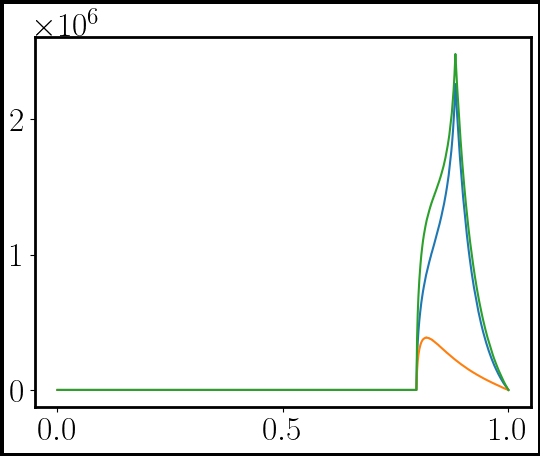

In [125]:
# Choose a filename, ending in .npz

cerenkovdata1500 = 'cerenkovdata1500.npz'

# Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
np.savez(cerenkovdata1500, costheta=x_all, normal1500=cerenkovangnsumhot, anomalous1500=cerenkovangasumhot, total1500=cerenkovangtsumhot)

# Load the saved file
npzfile1500 = np.load(cerenkovdata1500)

# Extract the arrays using the argument names you fed to "np.savez"
costhetas = npzfile1500['costheta']

normals1500 = npzfile1500['normal1500']
anomalouss1500 = npzfile1500['anomalous1500']
totals1500 = npzfile1500['total1500']

# Create the plot using the loaded arrays

fig, axis = plt.subplots(edgecolor='black', linewidth=5)
axis.plot(costhetas, normals1500)
axis.plot(costhetas, anomalouss1500)
axis.plot(costhetas, totals1500)

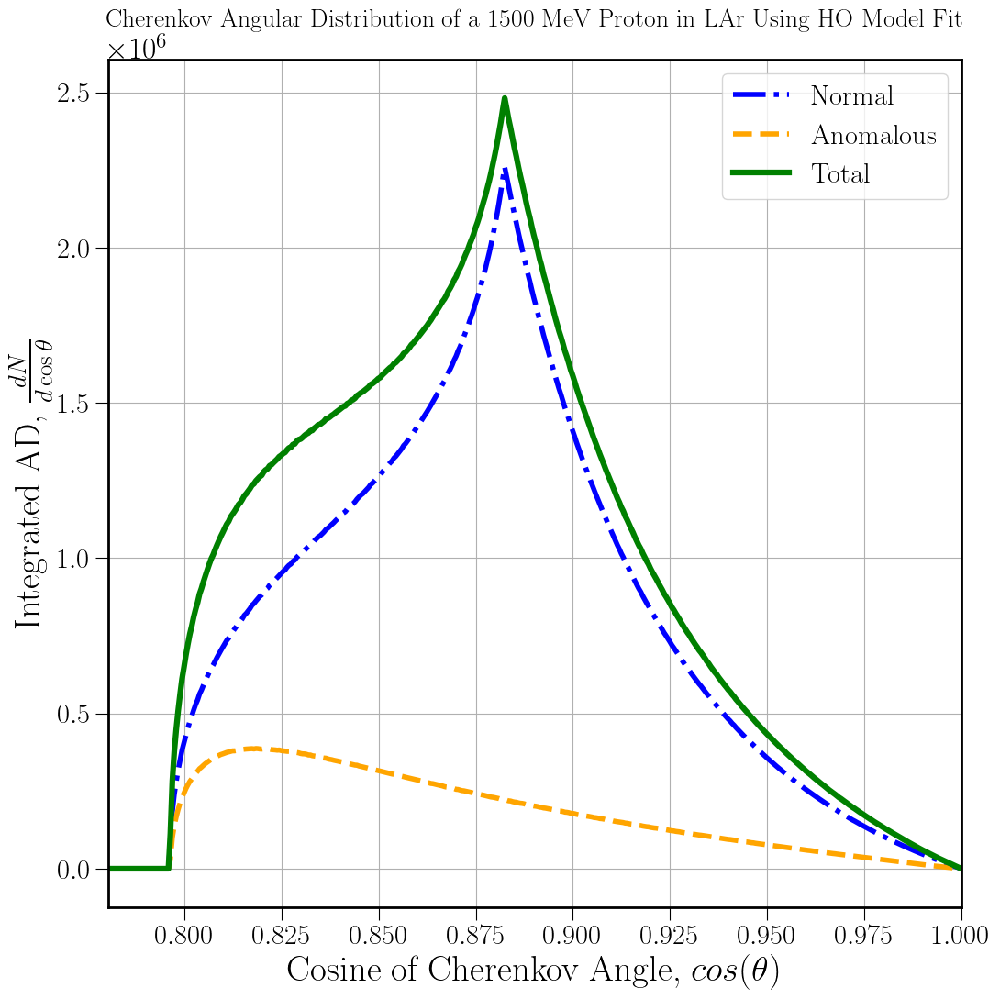

In [127]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

# plt.rc("text", usetex=True)
# plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
# plt.rc('font', size=24) 
# plt.rc('font', family='serif')

# #     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
# plt.rcParams["font.weight"] = "bold"     
# #     plt.rcParams["axes.labelweight"] = "bold"
# plt.rc('axes', linewidth=2)


ax.set_title(r"Cherenkov Angular Distribution of a 1500 MeV Proton in LAr Using HO Model Fit", fontsize= 20) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=28)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=28)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangnsumhot, ls='dashdot', linewidth= 4, c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasumhot, ls='dashed', linewidth= 4, c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, cerenkovangtsumhot, linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total
    
plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])
# plt.ylim(0,0.2e7)
# plt.xlim(0.88,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 

plt.savefig('AD_Total_Cherenkov_HOmodel_1500MeV_dxp01dth2k.jpg', bbox_inches= "tight")     

C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1724153887.py:146: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1724153887.py:188: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 450 Mev Proton in LAr: 0.389
Total Cerenkov photons emitted by a 500 Mev Proton in LAr: 200.542
Total Cerenkov photons emitted by a 600 Mev Proton in LAr: 2670.212
Total Cerenkov photons emitted by a 700 Mev Proton in LAr: 9486.070
Total Cerenkov photons emitted by a 800 Mev Proton in LAr: 22241.969
Total Cerenkov photons emitted by a 1000 Mev Proton in LAr: 62094.038
Total Cerenkov photons emitted by a 1200 Mev Proton in LAr: 116259.639
Total Cerenkov photons emitted by a 1500 Mev Proton in LAr: 216147.885
Total Cerenkov photons emitted by a 2000 Mev Proton in LAr: 412182.522
Total Cerenkov photons emitted by a 2500 Mev Proton in LAr: 628821.502
Total Cerenkov photons emitted by a 3000 Mev Proton in LAr: 856484.543
[[450, 0.3893988858512326], [500, 200.54196066548536], [600, 2670.2120077632144], [700, 9486.069895733595], [800, 22241.96917969575], [1000, 62094.038447192426], [1200, 116259.63945778129], [1500, 216147.88484624555], [2000, 412182.522033

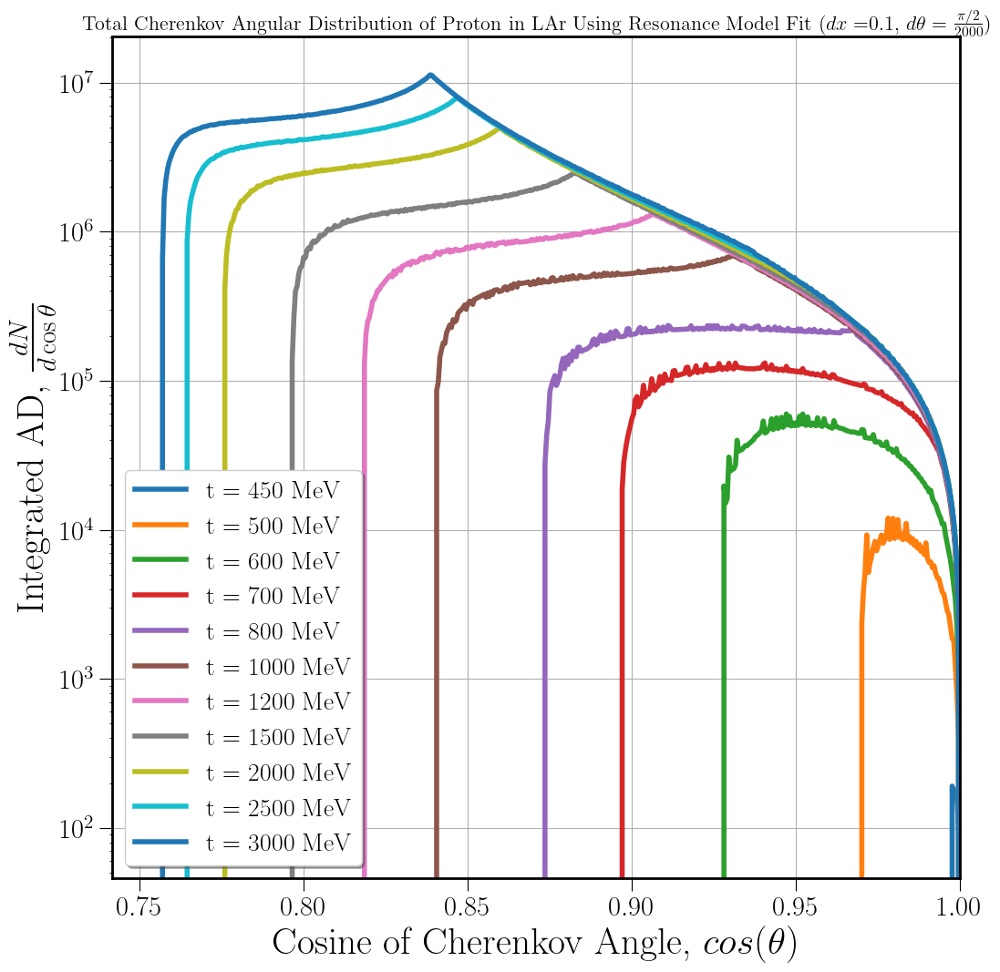

In [791]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440,450,460,470,475,480,490,500])
# t = 500
dx = 0.01 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.1

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278


# print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

t = np.array([450,500,600,700,800,1000,1200,1500,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)



fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title(r"Total Cherenkov Angular Distribution of Proton in LAr Using HO Model Fit", fontsize= 18) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()



cerenkovfinallistho = []
cerenkovtsumallts = []

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsumallt = [0 for x in x_all]
    cerenkovangasumallt = [0 for x in x_all]

    cerenkovangtsumallt = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.1)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumallt = np.add(func_angnc, cerenkovangnsumallt) 
        cerenkovangasumallt = np.add(func_angac, cerenkovangasumallt) 
        cerenkovangtsumallt = np.add(func_angtc, cerenkovangtsumallt)
            # func_angtc = func_angnc + func_angac 
    cerenkovfinallistho.append(cerenkovtlist)
    cerenkovtsumallts.append(sum(cerenkovangtsumallt) * (dx/0.1)/2000) #conversion factor to standard units
    # print(x_all, cerenkovangtsum)

    # plt.plot(x_all, cerenkovangnsum)
    # plt.plot(x_all, cerenkovangasum)
        
        # ax.plot(x_all, cerenkovangnsum, label='t = {} MeV'.format(float(j)))

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangtsumallt) * (dx/0.1)/2000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    # ax.grid()

    ax.plot(x_all, cerenkovangtsumallt* (dx/0.1), lw= 4, label='t = {} MeV'.format(j))
    
    plt.yscale("log")
    
    # plt.xlim(0.74,1)
    plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

list_ad = list(map(list, list(zip(t, cerenkovtsumallts))))
print(list_ad)
    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=20,framealpha=None,shadow=True) #loc='best'fig = plt.figure(figsize=(12,12))
plt.savefig('AD_HO_resonancefit_allTsnew_dxp1dth2k_logplot.jpg', bbox_inches="tight")
# print(t, sum(cerenkovangtsumallt) * (dx/0.1)/2000)


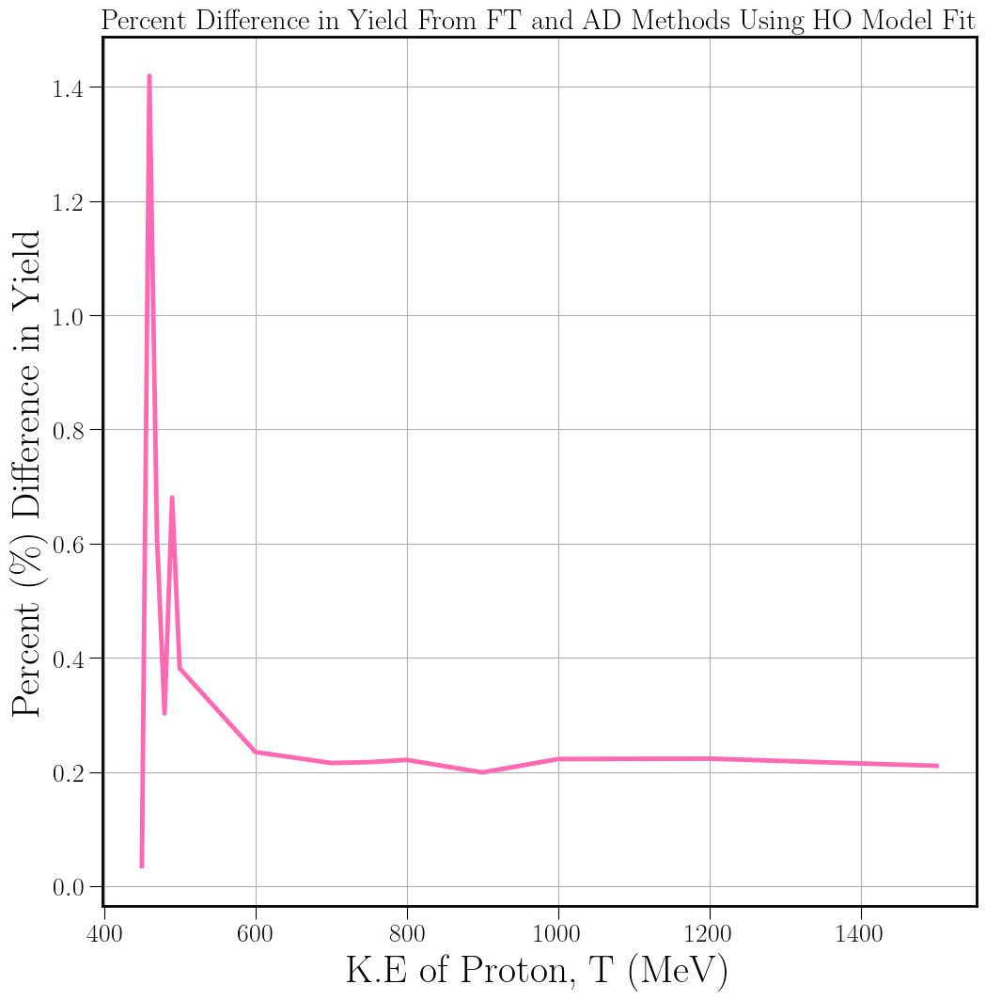

In [646]:
# % diff: HO fit

#Importing a CSV File into Python using Pandas
import pandas as pd
cherenkov = pd.read_csv (r'C:\Users\hrrah\Desktop\HEP\Cerenkov\Cherenkovho_Emission.csv')
cherenkov

t0 = cherenkov["T (MeV)"] #initial K.E of Proton
n_hofit_ft = cherenkov["N(FT)"] #number of Cerenkov photons emitted/unit length: This Work FT
n_hofit_ad = cherenkov["N(AD)"] #number of Cerenkov photons emitted/unit length: This Work AD
perdiff_hofit = cherenkov["%diffho"] # % difference: Babicz

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)

ax.set_title("Percent Difference in Yield From FT and AD Methods Using HO Model Fit", fontsize=22)
ax.plot(t0, perdiff_hofit, linewidth = 3.5, color='hotpink') #, label="Using Grace's Fit"
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.set_xlabel("K.E of Proton, T (MeV)", fontsize=30)
ax.set_ylabel('Percent ($\%$) Difference in Yield', fontsize=30)
ax.grid()
# plt.savefig("percentdifference_ho.jpg", bbox_inches="tight")
# ax.legend(fontsize=22)
# ax.set_xlim(475,3000)
# ax.set_ylim(0,2)

In [824]:
##### OVERAll FUNCTION ###### #####

def get_cerenkov(x=0,dx=0.1,plotx1=0.82,plotx2=1):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    cerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []

    cerenkov_all = [[] for j in t]
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]
        cerenkovangnsum = [0 for y in x_all]
        cerenkovangasum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angnc = [func_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angac = [func_anga(y) for y in x_all]       

            func_angtc = [(func_angn(y) + func_anga(y)) for y in x_all]
            
        
            cerenkovangsum = np.add(func_angtc, cerenkovangsum) #Total
            # cerenkovangnsum = np.add(func_angnc, cerenkovangnsum)  #Normal
            # cerenkovangasum = np.add(func_angac, cerenkovangasum) #Anomalous


        cerenkov_all[j].append(cerenkovangsum)
        scint_all[j].append(scint)

        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

#         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    # colors_all = ['deepskyblue','lime','orchid','darkturquoise','teal','green','firebrick','tomato','navy','purple'] #,'red','blueviolet'
    colors_all = ['darkgrey','brown','navy','hotpink','purple','orange','turquoise','blueviolet','green','magenta','royalblue','red','blueviolet', 'cyan','maroon','deepskyblue','olive'] #
   
    
    for i in range(len(t)):
        
#     def make_plot(x_all,scint,ceren)


#         ax.set_title("Total Angular Distribution of a {} MeV ($\\beta$ = 0.758) Proton in LAr", fontsize= 18) #
        # 
        # func_angt = func_angp + func_angn

        # ax.scatter(np.cos(theta), 2*pi*1e7*func_angp, label= "$(\\frac{dN}{dx dcos\\theta})_{R}$")    #func_angp = f(lamd_pterm): Blue plot
        # ax.scatter(np.cos(theta), 2*pi*1e7*func_angn, label= "$(\\frac{dN}{dx dcos\\theta})_{L}$")     #func_angp = f(lamd_pterm): Orange plot
        ax.plot(x_all, cerenkov_all[i][0], lw= 3,label= r"{} MeV".format(t[i]), c=colors_all[i])     #func_angp = f(lamd_pterm): Green plot label='Cerenkov',
        
        if i==len(t)-1:
            
            ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
        
        else:
            ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

        
#         plt.yscale("log")

    ax.set_title(r"Comparison of Cherenkov Angular Distribution of Protons in LAr with Scintillation", fontsize= 20)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
    ax.legend(loc='center left',fontsize=16,framealpha=None,shadow=True)

    plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

    # plt.xlim(plotx1,plotx2)
    
#     plt.savefig("AD_P_LAr_dxp1dth2000_383to800_normal.jpg", bbox_inches="tight")
# plt.savefig("AD_P_LAr_dxp1dth2000_383to500_normal.jpg", bbox_inches="tight")

#     plt.savefig("AD_comparison_P_LAr_dxp1dth2000_All_normal.jpg", bbox_inches="tight")
#     plt.savefig("AD_comparison_P_LAr_dxp01dth2000_All_normal.jpg", bbox_inches="tight")
#   
    plt.savefig("AD_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    
    plt.show()


Please enter one or more t-values in MeV, separated by a comma each 500,600,700,800,900,1000,1200,1500,2000


C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\556255725.py:128: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\556255725.py:170: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 200.542
Total Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 2670.212
Total Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 9486.070
Total Cerenkov photons emitted by a 800.0 Mev Proton in LAr using HO Fit: 22241.969
Total Cerenkov photons emitted by a 900.0 Mev Proton in LAr using HO Fit: 40034.414
Total Cerenkov photons emitted by a 1000.0 Mev Proton in LAr using HO Fit: 62094.038
Total Cerenkov photons emitted by a 1200.0 Mev Proton in LAr using HO Fit: 116259.639
Total Cerenkov photons emitted by a 1500.0 Mev Proton in LAr using HO Fit: 216147.885
Total Cerenkov photons emitted by a 2000.0 Mev Proton in LAr using HO Fit: 412182.522


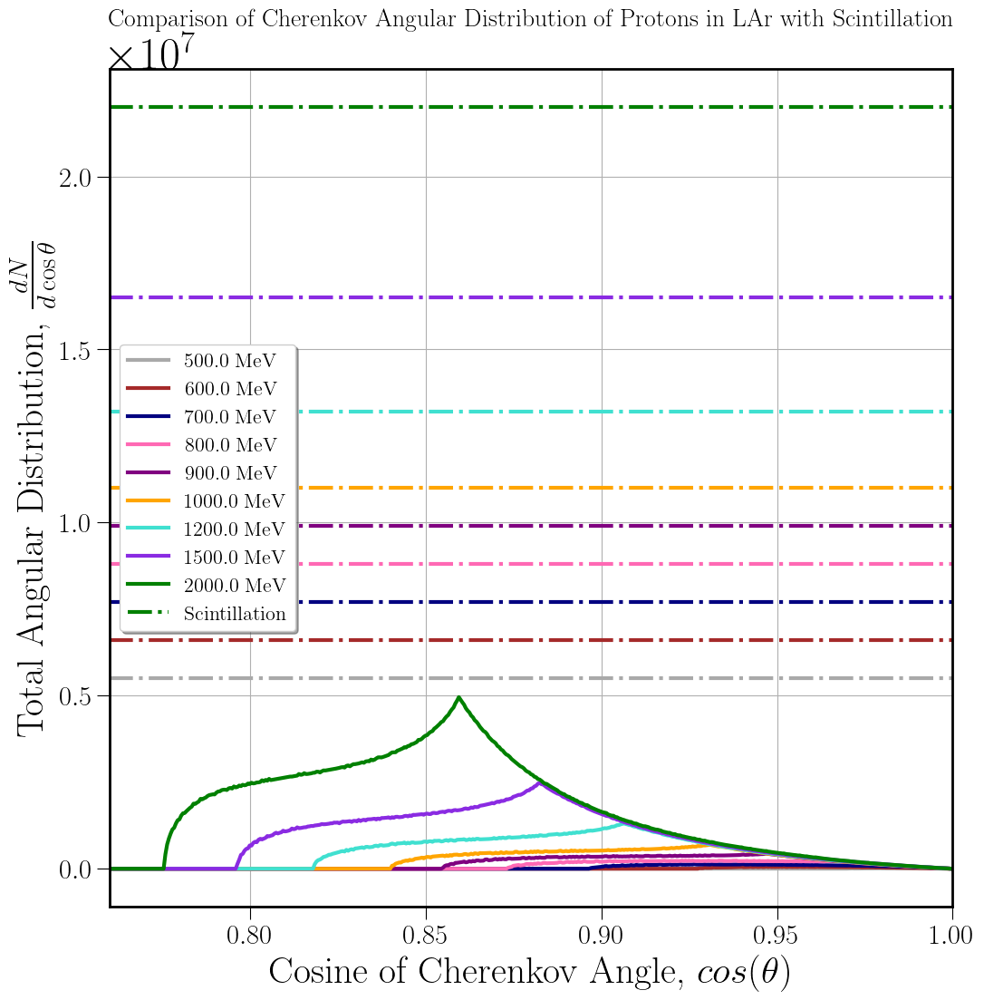

In [825]:
############ RUN THE FUNCTION ###################

# theta = np.linspace(0, np.pi/2, 2000)
# x_all = np.linspace(0, 1, 2000)
# t_arr = np.array([383.96,400,450,500,550,600,650,700,750,800,812]) #,900,1000]]) #initial  K.E of the proton in MeV 500,600,700,800,900,1000,1200
# t = 383.96,400,500,600,650,700,750,800 (450,500,600,700,800,900,1000)

get_cerenkov(x=0,dx=0.1,plotx1=0.98/(n_peakr*filtered_lst_res[0]),plotx2=1)


In [232]:
##### OVERAll FUNCTION ###### ##### TOTAL/ NORMAL/ANOMALOUS COMPONENTs

def get_cerenkov(x=0,dx=0.01,plotx1=0.82,plotx2=1):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    cerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []
    
    cerenkov_alln = [[] for j in t] #normal
    cerenkov_alla = [[] for j in t] #anomalous
    cerenkov_all = [[] for j in t] #total
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]
        cerenkovangnsum = [0 for y in x_all]
        cerenkovangasum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angnc = [func_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angac = [func_anga(y) for y in x_all]       

            func_angtc = [(func_angn(y) + func_anga(y)) for y in x_all]
            
            cerenkovangsum = np.add(func_angtc, cerenkovangsum) #Total
        
            cerenkovangnsum = np.add(func_angnc, cerenkovangnsum)  #Normal
            cerenkovangasum = np.add(func_angac, cerenkovangasum) #Anomalous
            
            
        cerenkov_all[j].append(cerenkovangsum) #Total
        
        cerenkov_alln[j].append(cerenkovangnsum) #Normal
        cerenkov_alla[j].append(cerenkovangasum) #Anomalous
        scint_all[j].append(scint)

        print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangnsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangasum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    # Choose a filename, ending in .npz ####################################### Uncomment #####
    cerenkovadallt = 'cerenkovadallt.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovadallt, costheta=x_all, normalallt=cerenkov_alln[j][0], anomalousallt=cerenkov_alla[j][0], totalallt=cerenkov_all[j][0], scintallt=scint_all[j][0])
        
    # #         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    # colors_all = ['cyan','purple','orange','hotpink', 'deepskyblue', 'darkturquoise','blueviolet,'magenta','maroon','olive','brown','navy','darkgrey'] #total
    colors_all = ['tomato','lime','orchid','firebrick','navy','seagreen','deeppink','dodgerblue','crimson','red','deepskyblue'] #,'red','deepskyblue','blueviolet' #normal
    # colors_all = ['darkgrey','brown','mediumslateblue','olive','red','darkcyan','maroon','royalblue','green','crimson','deepskyblue','olive'] #anomalous
   
    
    for i in range(len(t)):
        
        # ax.plot(x_all, cerenkov_all[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #total
        ax.plot(x_all, cerenkov_alln[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #normal
        # ax.plot(x_all, cerenkov_alla[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #anomalous
        
        
        
        # if i==len(t)-1:  #Scintillation Band
            
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
        
#         else:
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

        
#         plt.yscale("log")
 

    # ax.set_title(r"Total Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Total AD, $(\frac{dN}{d\cos\theta})_T$",fontsize=30) # (sr^{-1})
    
    ax.set_title(r"Normal Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Normal AD, $(\frac{dN}{d\cos\theta})_N$",fontsize=30) # (sr^{-1})
    
    # ax.set_title(r"Anomalous Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Anomalous AD, $(\frac{dN}{d\cos\theta})_A $",fontsize=30) #(sr^{-1})

    
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
    ax.legend(loc='upper right',fontsize=20,framealpha=None,shadow=True)

    plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

    # plt.xlim(plotx1,plotx2)
    
#     plt.savefig("AD_P_LAr_dxp1dth2000_383to800_normal.jpg", bbox_inches="tight")
# plt.savefig("AD_P_LAr_dxp1dth2000_383to500_normal.jpg", bbox_inches="tight")

#     plt.savefig("AD_comparison_P_LAr_dxp1dth2000_All_normal.jpg", bbox_inches="tight")
#     plt.savefig("AD_comparison_P_LAr_dxp01dth2000_All_normal.jpg", bbox_inches="tight")
#   
    # plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    
    plt.savefig("AD_normal_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    # plt.savefig("AD_anomls_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    
    plt.show()


started:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=7, tm_hour=13, tm_min=11, tm_sec=19, tm_wday=5, tm_yday=280, tm_isdst=0)


Please enter one or more t-values in MeV, separated by a comma each 450,500,600,700,800,900,1000,1200


C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3185710855.py:132: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3185710855.py:174: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Normal Cerenkov photons emitted by a 450.0 Mev Proton in LAr using HO Fit: 0.269
Anomalous Cerenkov photons emitted by a 450.0 Mev Proton in LAr using HO Fit: 0.148
Total Cerenkov photons emitted by a 450.0 Mev Proton in LAr using HO Fit: 0.416
Normal Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 129.751
Anomalous Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 70.409
Total Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 200.159
Normal Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 1871.197
Anomalous Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 797.860
Total Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 2669.057
Normal Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 7121.573
Anomalous Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 2405.192
Total Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 9526.76

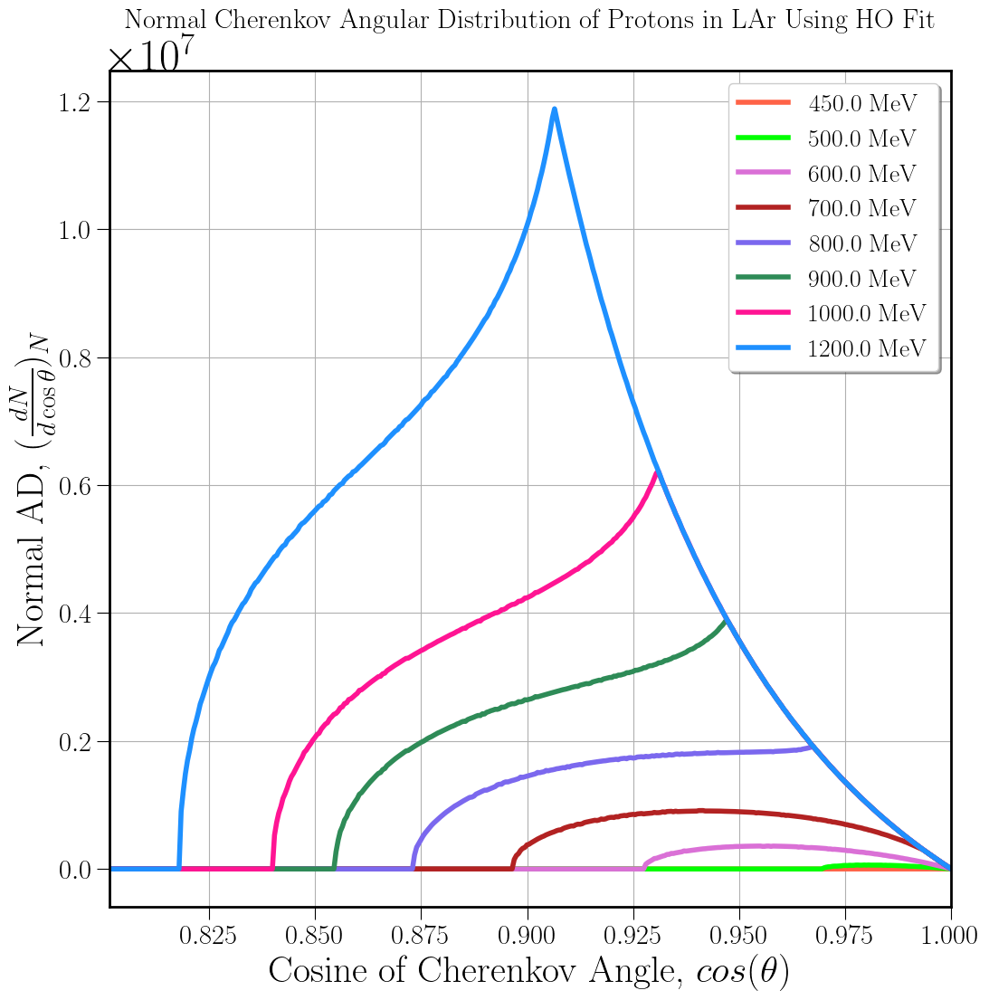

ended:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=7, tm_hour=16, tm_min=43, tm_sec=17, tm_wday=5, tm_yday=280, tm_isdst=0)


In [233]:
############ RUN THE FUNCTION ################### Normal/Anomalous AD ####

print('started: ', time.gmtime())
 
get_cerenkov(x=0,dx=0.01,plotx1=0.98/(n_peakr*filtered_lst_res[0]),plotx2=1)

print('ended: ', time.gmtime())

# t_arr = np.array([450,500,600,700,800,900,1000,1200,1500,2000])  #initial  K.E of the proton in MeV 600,700,800,900,1000
# low t = 400,445,448,450,460,470,480,490,500,600,700


In [326]:
##### OVERAll FUNCTION ###### ##### TOTAL/ NORMAL/ANOMALOUS COMPONENTs

def get_cerenkov(x,dx,plotx1,plotx2):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    cerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []
    
    cerenkov_alln = [[] for j in t] #normal
    cerenkov_alla = [[] for j in t] #anomalous
    cerenkov_all = [[] for j in t] #total
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]
        cerenkovangnsum = [0 for y in x_all]
        cerenkovangasum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angnc = [func_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angac = [func_anga(y) for y in x_all]       

            func_angtc = [(func_angn(y) + func_anga(y)) for y in x_all]
            
            cerenkovangsum = np.add(func_angtc, cerenkovangsum) #Total
        
            cerenkovangnsum = np.add(func_angnc, cerenkovangnsum)  #Normal
            cerenkovangasum = np.add(func_angac, cerenkovangasum) #Anomalous
            
            
        cerenkov_all[j].append(cerenkovangsum) #Total
        
        cerenkov_alln[j].append(cerenkovangnsum) #Normal
        cerenkov_alla[j].append(cerenkovangasum) #Anomalous
        scint_all[j].append(scint)

        # print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangnsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangasum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        # print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    # Choose a filename, ending in .npz ####################################### Uncomment #####
    cerenkovadallt = 'cerenkovadallt.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovadallt, costheta=x_all, normalallt=cerenkov_alln[j][0], anomalousallt=cerenkov_alla[j][0], totalallt=cerenkov_all[j][0], scintallt=scint_all[j][0])
        
    # #         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    # colors_all = ['cyan','purple','orange','hotpink', 'deepskyblue', 'darkturquoise','blueviolet,'magenta','maroon','olive','brown','navy','darkgrey'] #total
    # colors_all = ['tomato','lime','orchid','firebrick','navy','seagreen','deeppink','dodgerblue','crimson','red','deepskyblue'] #,'red','deepskyblue','blueviolet' #normal
    colors_all = ['darkgrey','brown','darkviolet','olive','red','darkcyan','maroon','royalblue','green','crimson','deepskyblue','olive'] #anomalous
   
    
    for i in range(len(t)):
        
        # ax.plot(x_all, cerenkov_all[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #total
        # ax.plot(x_all, cerenkov_alln[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #normal
        ax.plot(x_all, cerenkov_alla[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #anomalous
        
        
        
        # if i==len(t)-1:  #Scintillation Band
            
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
        
#         else:
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

        
#         plt.yscale("log")
 

    # ax.set_title(r"Total Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Total AD, $(\frac{dN}{d\cos\theta})_T$",fontsize=30) # (sr^{-1})
    
    # ax.set_title(r"Normal Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Normal AD, $(\frac{dN}{d\cos\theta})_N$",fontsize=30) # (sr^{-1})
    
    ax.set_title(r"Anomalous Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Anomalous AD, $(\frac{dN}{d\cos\theta})_A $",fontsize=30) #(sr^{-1})

    
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
    ax.legend(loc='upper right',fontsize=20,framealpha=None,shadow=True)

    plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

    # plt.xlim(plotx1,plotx2)
    
#     plt.savefig("AD_P_LAr_dxp1dth2000_383to800_normal.jpg", bbox_inches="tight")
# plt.savefig("AD_P_LAr_dxp1dth2000_383to500_normal.jpg", bbox_inches="tight")

#     plt.savefig("AD_comparison_P_LAr_dxp1dth2000_All_normal.jpg", bbox_inches="tight")
#     plt.savefig("AD_comparison_P_LAr_dxp01dth2000_All_normal.jpg", bbox_inches="tight")
#   
    # plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    
    # plt.savefig("AD_normal_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    plt.savefig("AD_anomls_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    
    plt.show()


started:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=8, tm_hour=1, tm_min=23, tm_sec=48, tm_wday=6, tm_yday=281, tm_isdst=0)


Please enter one or more t-values in MeV, separated by a comma each 450,500,600,700,800,900,1000,1200


C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3828604221.py:132: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3828604221.py:174: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Anomalous Cerenkov photons emitted by a 450.0 Mev Proton in LAr using HO Fit: 0.148
Anomalous Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 70.409
Anomalous Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 797.860
Anomalous Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 2405.192
Anomalous Cerenkov photons emitted by a 800.0 Mev Proton in LAr using HO Fit: 4849.789
Anomalous Cerenkov photons emitted by a 900.0 Mev Proton in LAr using HO Fit: 8056.544
Anomalous Cerenkov photons emitted by a 1000.0 Mev Proton in LAr using HO Fit: 11918.877
Anomalous Cerenkov photons emitted by a 1200.0 Mev Proton in LAr using HO Fit: 21322.630


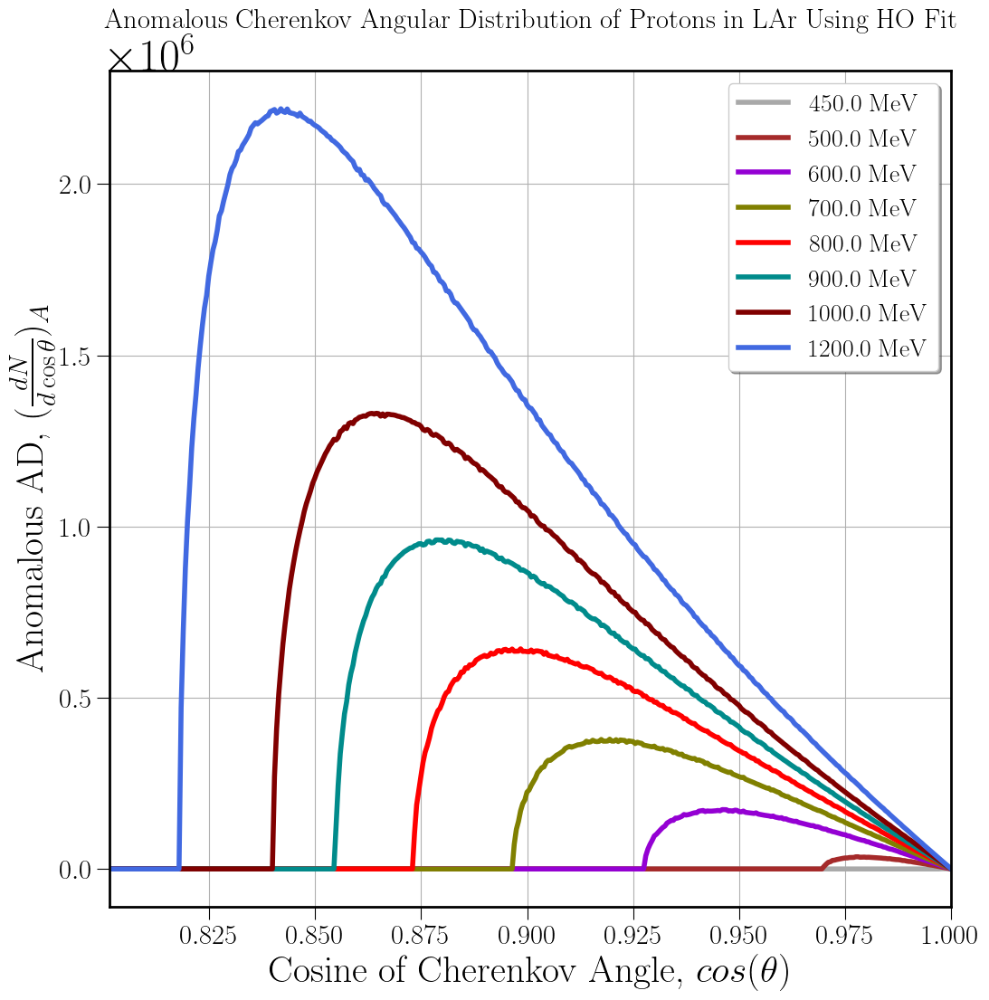

ended:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=8, tm_hour=4, tm_min=41, tm_sec=31, tm_wday=6, tm_yday=281, tm_isdst=0)


In [328]:
############ RUN THE FUNCTION ################### Normal/Anomalous AD ####

print('started: ', time.gmtime())
 
get_cerenkov(x=0,dx=0.01,plotx1=0.98/(n_peakr*filtered_lst_res[0]),plotx2=1)

print('ended: ', time.gmtime())

# t_arr = np.array([450,500,600,700,800,900,1000,1200,1500,2000])  #initial  K.E of the proton in MeV 600,700,800,900,1000
# low t = 400,445,448,450,460,470,480,490,500,600,700


In [77]:
##### OVERAll FUNCTION ###### ##### TOTAL/ NORMAL/ANOMALOUS COMPONENTs

def get_cerenkov(x,dx,plotx1,plotx2):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    cerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []
    
    cerenkov_alln = [[] for j in t] #normal
    cerenkov_alla = [[] for j in t] #anomalous
    cerenkov_all = [[] for j in t] #total
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]
        cerenkovangnsum = [0 for y in x_all]
        cerenkovangasum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angnc = [func_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angac = [func_anga(y) for y in x_all]       

            func_angtc = [(func_angn(y) + func_anga(y)) for y in x_all]
            
            cerenkovangsum = np.add(func_angtc, cerenkovangsum) #Total
        
            cerenkovangnsum = np.add(func_angnc, cerenkovangnsum)  #Normal
            cerenkovangasum = np.add(func_angac, cerenkovangasum) #Anomalous
            
            
        cerenkov_all[j].append(cerenkovangsum) #Total
        
        cerenkov_alln[j].append(cerenkovangnsum) #Normal
        cerenkov_alla[j].append(cerenkovangasum) #Anomalous
        scint_all[j].append(scint)

        # print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangnsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        # print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangasum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    # Choose a filename, ending in .npz ####################################### Uncomment #####
    cerenkovadallt = 'cerenkovadallt.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovadallt, costheta=x_all, normalallt=cerenkov_alln[j][0], anomalousallt=cerenkov_alla[j][0], totalallt=cerenkov_all[j][0], scintallt=scint_all[j][0])
        
    # # #         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    
    # colors_all = ['tomato','lime','orchid','firebrick','navy','seagreen','deeppink','dodgerblue','crimson','red','deepskyblue'] #,'red','deepskyblue','blueviolet' #normal
    # colors_all = ['darkgrey','brown','darkviolet','olive','red','darkcyan','maroon','royalblue','green','crimson','deepskyblue','olive'] #anomalous
    colors_all = ['cyan','purple','orange','hotpink', 'deepskyblue', 'darkturquoise','blueviolet','magenta','maroon','olive','brown','navy','darkgrey'] #total #'orange','green',
    
    for i in range(len(t)):
        
        # ax.plot(x_all, cerenkov_alln[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #normal
        # ax.plot(x_all, cerenkov_alla[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #anomalous
        ax.plot(x_all, cerenkov_all[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #total
        
        
        # if i==len(t)-1:  #Scintillation Band
            
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
        
#         else:
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

        
#         plt.yscale("log")
 

    
    # ax.set_title(r"Normal Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Normal AD, $(\frac{dN}{d\cos\theta})_N$",fontsize=30) # (sr^{-1})
    
    # ax.set_title(r"Anomalous Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Anomalous AD, $(\frac{dN}{d\cos\theta})_A $",fontsize=30) #(sr^{-1})

    ax.set_title(r"Total Cherenkov Angular Distribution of Protons in LAr Using HO Model Fit", fontsize= 20)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Total AD, $(\frac{dN}{d\cos\theta})_T$",fontsize=30) # (sr^{-1})
    
    
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
    ax.legend(loc='upper right',fontsize=20,framealpha=None,shadow=True)

    # plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

    plt.xlim(plotx1,plotx2)
    # plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000.jpg", bbox_inches="tight")

    plt.show()
    
#     plt.savefig("AD_P_LAr_dxp1dth2000_383to800_normal.jpg", bbox_inches="tight")
    # plt.savefig("AD_P_LAr_dxp1dth2000_383to500_normal.jpg", bbox_inches="tight")

#     plt.savefig("AD_comparison_P_LAr_dxp1dth2000_All_normal.jpg", bbox_inches="tight")
#     plt.savefig("AD_comparison_P_LAr_dxp01dth2000_All_normal.jpg", bbox_inches="tight")

    
    # plt.savefig("AD_normal_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    # plt.savefig("AD_anomls_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
        
    # plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")

    # plt.savefig("AD_total_hofit_P_LAr_dx1dth2000_500abv.jpg", bbox_inches="tight")
    # plt.savefig("AD_total_hofit_P_LAr_dx1dth2000_500blw.jpg", bbox_inches="tight")
    

started:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=31, tm_hour=8, tm_min=18, tm_sec=49, tm_wday=1, tm_yday=304, tm_isdst=0)


Please enter one or more t-values in MeV, separated by a comma each 450,500,600,700,800,900,1000,1200


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\89374400.py:132: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\89374400.py:174: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 450.0 Mev Proton in LAr using HO Fit: 0.389
Total Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 200.542
Total Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 2670.212
Total Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 9486.070
Total Cerenkov photons emitted by a 800.0 Mev Proton in LAr using HO Fit: 22241.969
Total Cerenkov photons emitted by a 900.0 Mev Proton in LAr using HO Fit: 40034.414
Total Cerenkov photons emitted by a 1000.0 Mev Proton in LAr using HO Fit: 62094.038
Total Cerenkov photons emitted by a 1200.0 Mev Proton in LAr using HO Fit: 116259.639


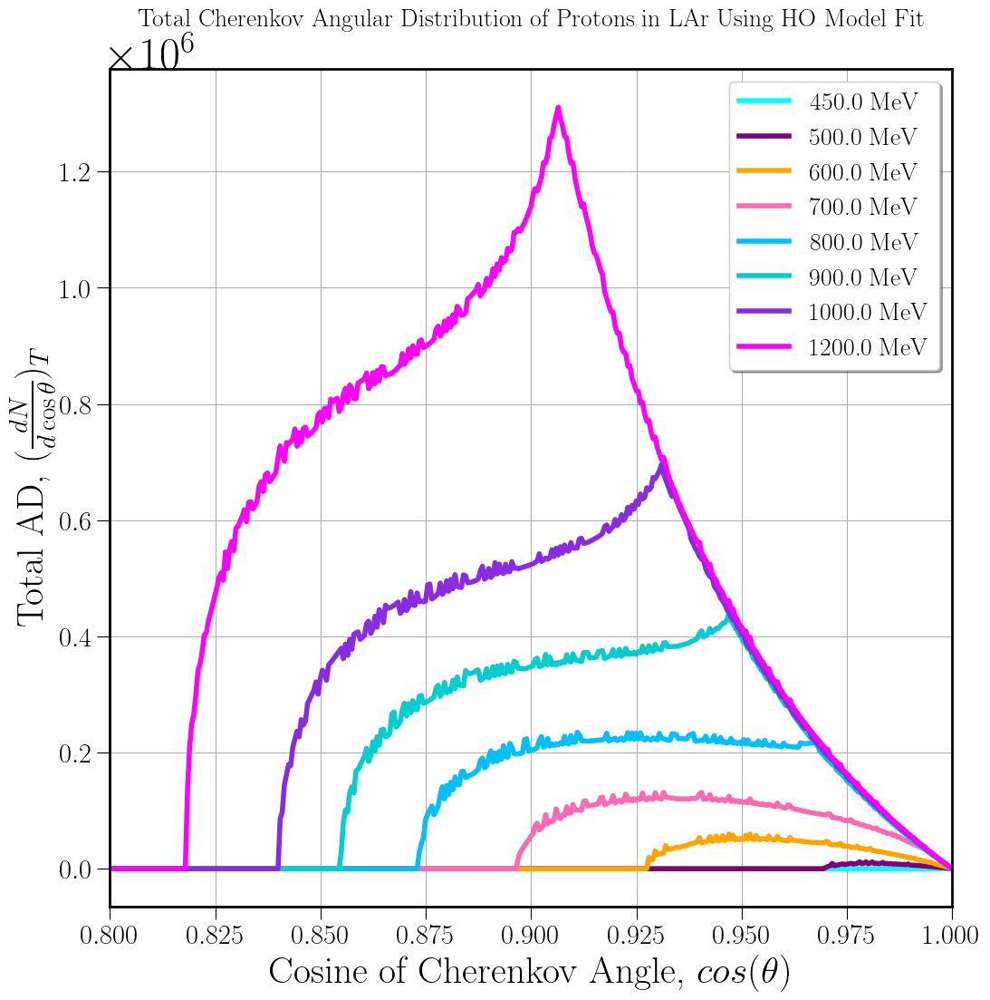

ended:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=31, tm_hour=9, tm_min=15, tm_sec=42, tm_wday=1, tm_yday=304, tm_isdst=0)


In [78]:
############ RUN THE FUNCTION ################### Normal/Anomalous AD ####

print('started: ', time.gmtime())
 
# get_cerenkov(x=0,dx=10,plotx1=0.98/(n_peakr*filtered_lst_res[0]),plotx2=1)
# get_cerenkov(x=0,dx=10,plotx1=0.8,plotx2=1)
get_cerenkov(x=0,dx=0.1,plotx1=0.8,plotx2=1)

print('ended: ', time.gmtime())

# t_arr = np.array([450,500,600,700,800,900,1000,1200,1500,2000])  #initial  K.E of the proton in MeV 600,700,800,900,1000
# low t = 400,445,448,450,460,470,480,490,500,600,700


In [25]:

# # Choose a filename, ending in .npz ####################################### Uncomment #####
# # cerenkovadallt = 'cerenkovadallt.npz'

# # # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
# # np.savez(cerenkovadallt, costheta=x_all, normalallt=cerenkov_alln[j][0], anomalousallt=cerenkov_alla[j][0], totalallt=cerenkov_all[j][0], scintallt=scint_all[j][0])

# # Load the saved file
# npzadallt = np.load(cerenkovadallt)

# # Extract the arrays using the argument names you fed to "np.savez"
# costhetas = npzadallt['costheta']

# normalallts = npzadallt['normalallt']
# anomalousallts = npzadallt['anomalousallt']
# totalallts = npzadallt['totalallt']

# # Create the plot using the loaded arrays

# fig, ax = plt.subplots(edgecolor='black', linewidth=5)
# ax.plot(costhetas, normalallts)
# # ax.plot(costhetas, anomalousallts)
# # ax.plot(costhetas, totalallts)

# # plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])
# plt.xlim([0.8, 1])

In [71]:
#Energy distribution

##### OVERAll FUNCTION ###### ##### TOTAL/ NORMAL/ANOMALOUS COMPONENTs

def get_ecerenkov(x,dx,plotx1,plotx2):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV
    h = 4.1357e-21 #MeV.s
    c = 3e17 #nm/s

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    ecerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []
    
    cerenkov_alln = [[] for j in t] #normal
    cerenkov_alla = [[] for j in t] #anomalous
    cerenkov_all = [[] for j in t] #total
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        ecerenkovanglist = []
        ecerenkovangsum = [0 for y in x_all]
        ecerenkovangnsum = [0 for y in x_all]
        ecerenkovangasum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def efunc_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6*h*c * ((2*alpha)/(i**2*lmax**3)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            efunc_angnc = [efunc_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def efunc_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6*h*c * ((2*alpha)/(i**2*lmin**3)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            efunc_angac = [efunc_anga(y) for y in x_all]       

            efunc_angtc = [(efunc_angn(y) + efunc_anga(y)) for y in x_all]
            
            ecerenkovangsum = np.add(efunc_angtc, ecerenkovangsum) #Total
        
            ecerenkovangnsum = np.add(efunc_angnc, ecerenkovangnsum)  #Normal
            ecerenkovangasum = np.add(efunc_angac, ecerenkovangasum) #Anomalous
            
            
        cerenkov_all[j].append(ecerenkovangsum) #Total
        
        cerenkov_alln[j].append(ecerenkovangnsum) #Normal
        cerenkov_alla[j].append(ecerenkovangasum) #Anomalous
        scint_all[j].append(scint)

        # print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangnsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        # print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangasum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("Total Energy radiated in Cerenkov by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(ecerenkovangsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("% Energy radiated by a {} Mev Proton in LAr using HO Fit: {:.5f} %" .format(t[j], (sum(ecerenkovangsum) * (dx/0.1) * 100)/(t[j]*2000) ) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    # Choose a filename, ending in .npz ####################################### Uncomment #####
    ecerenkovadallt = 'ecerenkovadallt.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(ecerenkovadallt, costheta=x_all, enormalallt=cerenkov_alln[j][0], eanomalousallt=cerenkov_alla[j][0], etotalallt=cerenkov_all[j][0], scintallt=scint_all[j][0])

    # # #         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    
    # colors_all = ['tomato','lime','orchid','firebrick','navy','seagreen','deeppink','dodgerblue','crimson','red','deepskyblue'] #,'red','deepskyblue','blueviolet' #normal
    # colors_all = ['darkgrey','brown','darkviolet','olive','red','darkcyan','maroon','royalblue','green','crimson','deepskyblue','olive'] #anomalous
    colors_all = ['cyan','purple','orange','hotpink', 'deepskyblue', 'darkturquoise','blueviolet','magenta','maroon','olive','brown','navy','darkgrey'] #total #'orange','green',
    
    for i in range(len(t)):
        
        # ax.plot(x_all, cerenkov_alln[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #normal
        # ax.plot(x_all, cerenkov_alla[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #anomalous
        ax.plot(x_all, cerenkov_all[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #total
        
        
        # if i==len(t)-1:  #Scintillation Band
            
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
        
#         else:
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

        
#         plt.yscale("log")
 

    
    # ax.set_title(r"Normal Cherenkov Energy Distribution (ED) of Protons in LAr Using HO Model Fit", fontsize= 20)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Normal ED, $(\frac{dE}{d\cos\theta})_N$",fontsize=30) # (sr^{-1})
    
    # ax.set_title(r"Anomalous Cherenkov Energy Distribution (ED) of Protons in LAr Using HO Model Fit", fontsize= 20)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Anomalous ED, $(\frac{dE}{d\cos\theta})_A$",fontsize=30) # (sr^{-1})
    
    ax.set_title(r"Total Cherenkov Energy Distribution (ED) of Protons in LAr Using HO Model Fit", fontsize= 20)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Total ED, $(\frac{dE}{d\cos\theta})_T$",fontsize=30) # (sr^{-1})
    
    
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
    ax.legend(loc='upper right',fontsize=20,framealpha=None,shadow=True)

    # plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

    plt.xlim(plotx1,plotx2)
    # plt.savefig("eAD_normal_hofit_P_LAr_dxp01dth2000.jpg", bbox_inches="tight")
    # plt.savefig("eAD_anomalous_hofit_P_LAr_dxp01dth2000.jpg", bbox_inches="tight")
    # plt.savefig("eAD_total_hofit_P_LAr_dxp01dth2000.jpg", bbox_inches="tight")
    
    plt.show()
    

started:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=31, tm_hour=7, tm_min=17, tm_sec=35, tm_wday=1, tm_yday=304, tm_isdst=0)


Please enter one or more t-values in MeV, separated by a comma each 450,500,600,700,800,900,1000,1200


C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\1023670876.py:136: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_18872\1023670876.py:178: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Energy radiated in Cerenkov by a 450.0 Mev Proton in LAr using HO Fit: 0.000
% Energy radiated by a 450.0 Mev Proton in LAr using HO Fit: 0.00000 %
Total Energy radiated in Cerenkov by a 500.0 Mev Proton in LAr using HO Fit: 0.002
% Energy radiated by a 500.0 Mev Proton in LAr using HO Fit: 0.00039 %
Total Energy radiated in Cerenkov by a 600.0 Mev Proton in LAr using HO Fit: 0.025
% Energy radiated by a 600.0 Mev Proton in LAr using HO Fit: 0.00421 %
Total Energy radiated in Cerenkov by a 700.0 Mev Proton in LAr using HO Fit: 0.085
% Energy radiated by a 700.0 Mev Proton in LAr using HO Fit: 0.01210 %
Total Energy radiated in Cerenkov by a 800.0 Mev Proton in LAr using HO Fit: 0.186
% Energy radiated by a 800.0 Mev Proton in LAr using HO Fit: 0.02329 %
Total Energy radiated in Cerenkov by a 900.0 Mev Proton in LAr using HO Fit: 0.322
% Energy radiated by a 900.0 Mev Proton in LAr using HO Fit: 0.03581 %
Total Energy radiated in Cerenkov by a 1000.0 Mev Proton in LAr using HO Fit

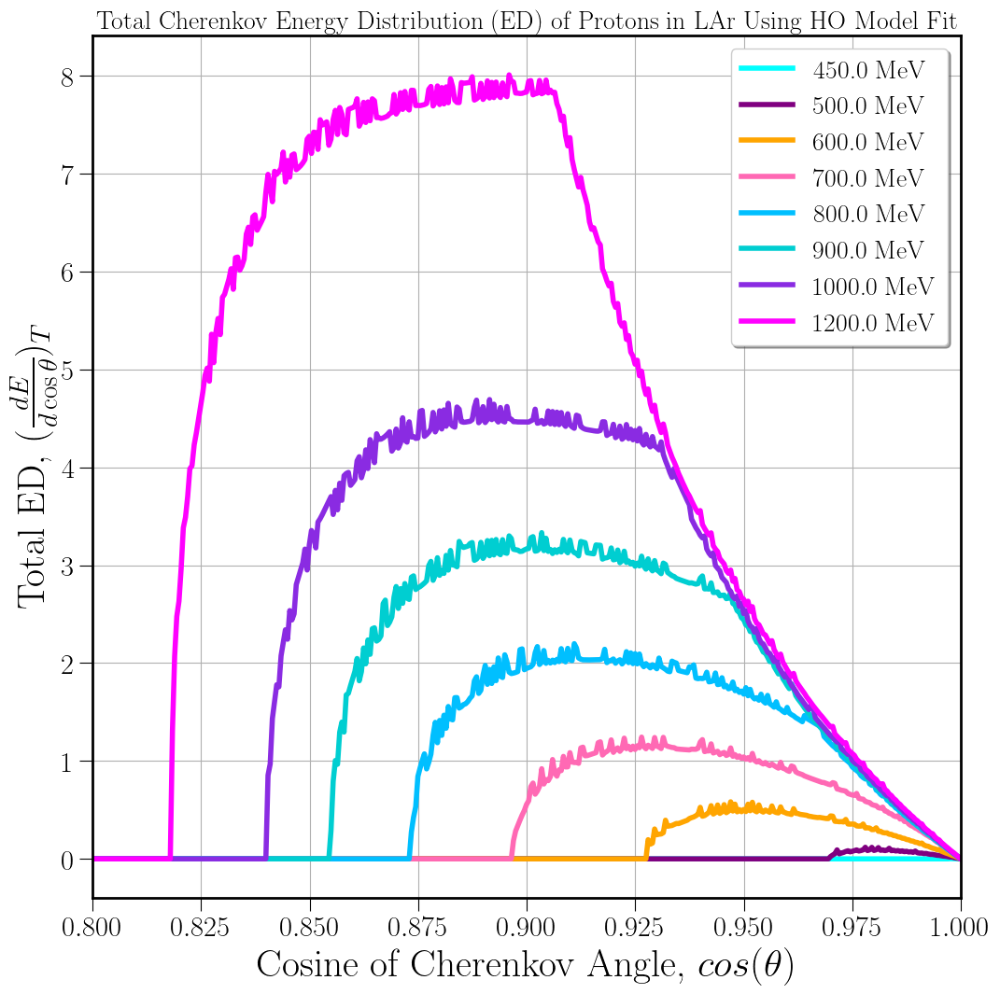

ended:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=31, tm_hour=8, tm_min=11, tm_sec=36, tm_wday=1, tm_yday=304, tm_isdst=0)


In [72]:
############ RUN THE FUNCTION ################### Normal/Anomalous ED ####

print('started: ', time.gmtime())
 
# get_ecerenkov(x=0,dx=0.01,plotx1=0.98/(n_peakr*filtered_lst_res[0]),plotx2=1)
# get_cerenkov(x=0,dx=10,plotx1=0.8,plotx2=1)
get_ecerenkov(x=0,dx=0.1,plotx1=0.8,plotx2=1)

print('ended: ', time.gmtime())

# t_arr = np.array([450,500,600,700,800,900,1000,1200,1500,2000])  #initial  K.E of the proton in MeV 600,700,800,900,1000
# low t = 400,445,448,450,460,470,480,490,500,600,700


In [27]:

# # Choose a filename, ending in .npz ####################################### Uncomment #####
# # cerenkovadallt = 'cerenkovadallt.npz'

# # # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
# # np.savez(cerenkovadallt, costheta=x_all, normalallt=cerenkov_alln[j][0], anomalousallt=cerenkov_alla[j][0], totalallt=cerenkov_all[j][0], scintallt=scint_all[j][0])

# # Load the saved file
# enpzadallt = np.load(ecerenkovadallt)

# # Extract the arrays using the argument names you fed to "np.savez"
# costhetas = enpzadallt['costheta']

# enormalallts = enpzadallt['enormalallt']
# eanomalousallts = enpzadallt['eanomalousallt']
# etotalallts = enpzadallt['etotalallt']

# # Create the plot using the loaded arrays

# fig, ax = plt.subplots(edgecolor='black', linewidth=5)
# ax.plot(costhetas, enormalallts)
# # ax.plot(costhetas, anomalousallts)
# # ax.plot(costhetas, totalallts)

# # plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])
# plt.xlim([0.8, 1])

In [ ]:
#make figure: Anomalous AD

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=36) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)



# colors_all = ['cyan','purple','orange','hotpink', 'deepskyblue', 'darkturquoise','blueviolet,'magenta','maroon','olive','brown','navy','darkgrey'] #total
# colors_all = ['tomato','lime','orchid','firebrick','navy','seagreen','deeppink','dodgerblue','crimson','red','deepskyblue'] #,'red','deepskyblue','blueviolet' #normal
colors_all = ['darkgrey','brown','mediumslateblue','olive','red','darkcyan','maroon','royalblue','green','crimson','deepskyblue','olive'] #anomalous


for i in range(len(t)):
    
    # ax.plot(x_all, cerenkov_all[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #total
    # ax.plot(x_all, cerenkov_alln[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #normal
    ax.plot(x_all, cerenkov_alla[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #anomalous
    
    
    
    # if i==len(t)-1:  #Scintillation Band
        
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
    
#         else:
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

    
#         plt.yscale("log")


# ax.set_title(r"Total Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
# ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
# ax.set_ylabel(r"Total AD, $(\frac{dN}{d\cos\theta})_T$",fontsize=30) # (sr^{-1})

# ax.set_title(r"Normal Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
# ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
# ax.set_ylabel(r"Normal AD, $(\frac{dN}{d\cos\theta})_N$",fontsize=30) # (sr^{-1})

ax.set_title(r"Anomalous Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
ax.set_ylabel(r"Anomalous AD, $(\frac{dN}{d\cos\theta})_A $",fontsize=30) #(sr^{-1})


ax.grid()
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='upper right',fontsize=20,framealpha=None,shadow=True)

plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

# plt.xlim(plotx1,plotx2)

#     plt.savefig("AD_P_LAr_dxp1dth2000_383to800_normal.jpg", bbox_inches="tight")
# plt.savefig("AD_P_LAr_dxp1dth2000_383to500_normal.jpg", bbox_inches="tight")

#     plt.savefig("AD_comparison_P_LAr_dxp1dth2000_All_normal.jpg", bbox_inches="tight")
#     plt.savefig("AD_comparison_P_LAr_dxp01dth2000_All_normal.jpg", bbox_inches="tight")
#   
# plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
# plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000_smallT.jpg", bbox_inches="tight")

# plt.savefig("AD_normal_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
plt.savefig("AD_anomls_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")

plt.show()


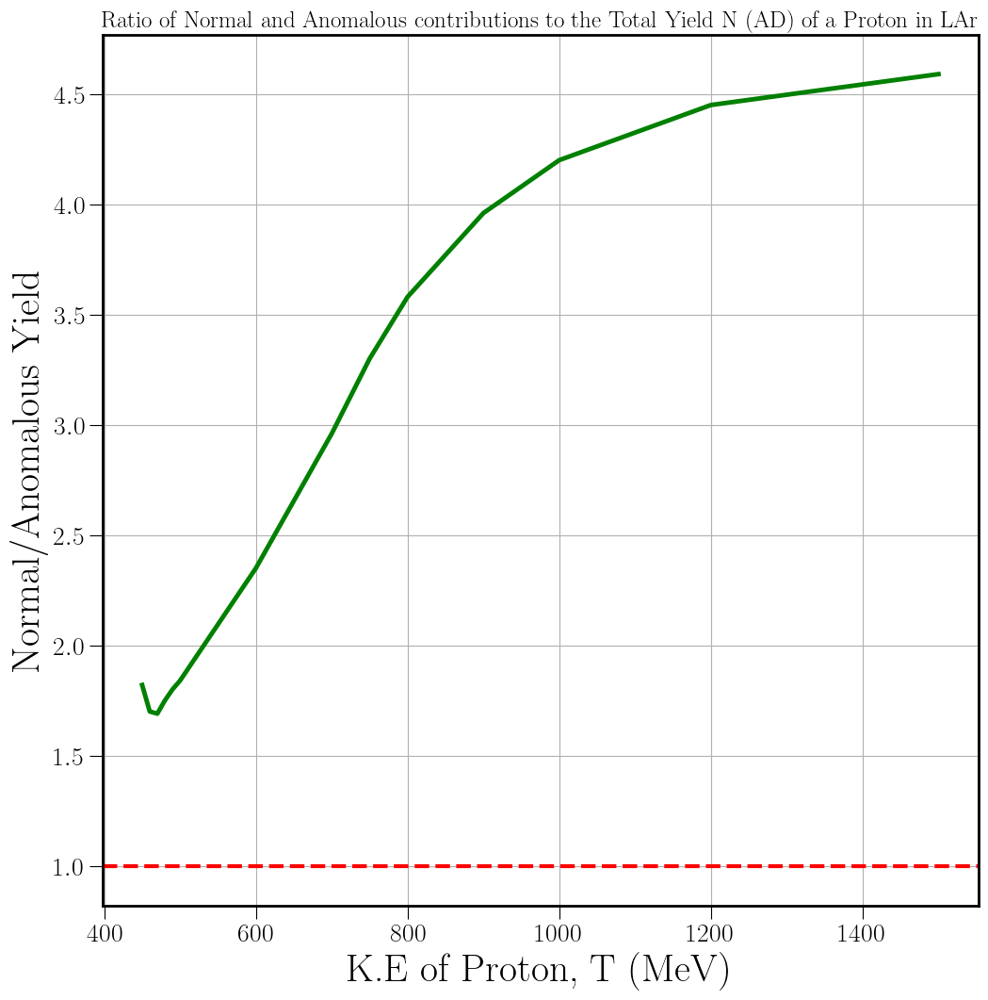

In [675]:
#Importing a CSV File into Python using Pandas
import pandas as pd
cerenkovho = pd.read_csv (r'C:\Users\hrrah\Desktop\HEP\Cerenkov\Cherenkovho_Emission.csv')
cerenkovho

#Calling the columns of data table by their headers 
t_0 = cerenkovho["T (MeV)"] #initial K.E of Proton 
normbyanom = cerenkovho["NbyA"] #normal/anomalous

#Plot of Cerenkov photons emitted by Proton in the LAr medium. (no vs T)
fig = plt.figure(figsize=(12,12))

ax = fig.add_subplot(111)
ax.set_title("Ratio of Normal and Anomalous contributions to the Total Yield N (AD) of a Proton in LAr", fontsize=18)
ax.plot(t_0, normbyanom, linewidth = 3.5, color='g') #, label="Using Grace's Fit"
plt.axhline(1, ls='--',c='r',lw=3) #y=1 line


ax.tick_params(axis='both',which='major',labelsize=20,length=10)
ax.set_xlabel("K.E of Proton, T (MeV)", fontsize=30)
ax.set_ylabel('Normal/Anomalous Yield', fontsize=30)
ax.grid()
plt.savefig("Cerenkovho_normbyanom.jpg", bbox_inches="tight")
# ax.legend(fontsize=22)
# ax.set_xlim(0,500)

In [571]:
##### OVERAll FUNCTION ###### ##### TOTAL/ NORMAL/ANOMALOUS COMPONENTs small T

def get_cerenkov(x,dx,plotx1,plotx2):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    cerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []
    
    cerenkov_alln = [[] for j in t] #normal
    cerenkov_alla = [[] for j in t] #anomalous
    cerenkov_all = [[] for j in t] #total
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]
        cerenkovangnsum = [0 for y in x_all]
        cerenkovangasum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angnc = [func_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angac = [func_anga(y) for y in x_all]       

            func_angtc = [(func_angn(y) + func_anga(y)) for y in x_all]
            
            cerenkovangsum = np.add(func_angtc, cerenkovangsum) #Total
        
            cerenkovangnsum = np.add(func_angnc, cerenkovangnsum)  #Normal
            cerenkovangasum = np.add(func_angac, cerenkovangasum) #Anomalous
            
            
        cerenkov_all[j].append(cerenkovangsum) #Total
        
        cerenkov_alln[j].append(cerenkovangnsum) #Normal
        cerenkov_alla[j].append(cerenkovangasum) #Anomalous
        scint_all[j].append(scint)

        # print(cerenkov_alln[j][0])
        # print(cerenkov_alla[j][0])
        # print(cerenkov_all[j][0])
        # print(scint_all[j][0])

        # print("Normal Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangnsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        # print("Anomalous Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangasum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    # Choose a filename, ending in .npz ####################################### Uncomment #####
    cerenkovadsmallt = 'cerenkovadsmallt.npz'

    # Feed the arrays to "np.savez" with arguments named as the names you want to extract the data with
    np.savez(cerenkovadsmallt, costheta=x_all, normalsmallt=cerenkov_alln[j][0], anomaloussmallt=cerenkov_alla[j][0], totalsmallt=cerenkov_all[j][0], scintsmallt=scint_all[j][0])
        
    # #         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    # colors_all = ['cyan','purple','orange','hotpink', 'deepskyblue', 'darkturquoise','blueviolet,'magenta','maroon','olive','brown','navy','darkgrey'] #total
    # colors_all = ['tomato','lime','orchid','firebrick','navy','seagreen','deeppink','dodgerblue','crimson','red','deepskyblue'] #,'red','deepskyblue','blueviolet' #normal
    colors_all = ['darkgrey','brown','mediumslateblue','olive','red','darkcyan','maroon','royalblue','green','crimson','deepskyblue','olive'] #anomalous
   
    
    for i in range(len(t)):
        
        # ax.plot(x_all, cerenkov_all[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #total
        # ax.plot(x_all, cerenkov_alln[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #normal
        ax.plot(x_all, cerenkov_alla[i][0], lw= 4,label= r"{} MeV".format(t[i]), c=colors_all[i])    #anomalous
        
        
        
        # if i==len(t)-1:  #Scintillation Band
            
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', label=r'Scintillation', c=colors_all[i]) #color='black') #, color= 'g'
        
#         else:
#             ax.plot(x_all, scint_all[i][0],lw=3, ls= 'dashdot', c=colors_all[i]) #color='black') #, color= 'g'

        
#         plt.yscale("log")
 

    ax.set_title(r"Total Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Total AD, $(\frac{dN}{d\cos\theta})_T$",fontsize=30) # (sr^{-1})
    
    # ax.set_title(r"Normal Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Normal AD, $(\frac{dN}{d\cos\theta})_N$",fontsize=30) # (sr^{-1})
    
    # ax.set_title(r"Anomalous Cherenkov Angular Distribution of Protons in LAr Using HO Fit", fontsize= 22)
    # ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    # ax.set_ylabel(r"Anomalous AD, $(\frac{dN}{d\cos\theta})_A $",fontsize=30) #(sr^{-1})

    
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

#     ax.text(0.96,1e2,r'dx={} cm'.format(dx),fontsize=16)
    ax.legend(loc='best',fontsize=18,framealpha=None,shadow=True)

    # plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])
    plt.xlim([plotx1, plotx2])

    # plt.xlim(plotx1,plotx2)
    
#     plt.savefig("AD_P_LAr_dxp1dth2000_383to800_normal.jpg", bbox_inches="tight")
# plt.savefig("AD_P_LAr_dxp1dth2000_383to500_normal.jpg", bbox_inches="tight")

#     plt.savefig("AD_comparison_P_LAr_dxp1dth2000_All_normal.jpg", bbox_inches="tight")
#     plt.savefig("AD_comparison_P_LAr_dxp01dth2000_All_normal.jpg", bbox_inches="tight")
#   
    # plt.savefig("AD_total_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    
    # plt.savefig("AD_normal_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")
    # plt.savefig("AD_anomls_hofit_P_LAr_dxp01dth2000_medT.jpg", bbox_inches="tight")

    # plt.savefig("AD_total_hofit_P_LAr_dxp001dth2000_smallT.jpg", bbox_inches="tight")
    
    plt.show()


In [575]:
############ RUN THE FUNCTION ################### Normal/Anomalous AD ####

print('started: ', time.gmtime())
 
get_cerenkov(x=0,dx=0.1,plotx1=0.75,plotx2=1)  #0.99/(n_peakr*filtered_lst_res[0])
 
print('ended: ', time.gmtime())

# t_arr = np.array([450,500,600,700,800,900,1000,1200,1500,2000])  #initial  K.E of the proton in MeV 600,700,800,900,1000
low t = 445,448,450,460,470,480,490,500,600,700


In [288]:
# #Example of saving data within a for loop
# import numpy as np
# a = np.array([[[1, 2, 3],
#                [4, 5, 6],
#                [7, 8, 9]],

#               [[10, 11, 12],
#                [13, 14, 15],
#                [16, 17, 18]]])
# ar = []
# for x in range(0,2):
#     b = a[x, :] + 1
#     ar.append(b)

# print(np.stack(ar))

In [370]:
##### OVERAll FUNCTION ###### ##### Threshold Corrected Version ####### DEFAULT:FINAL

def get_cerenkov(z,dz,plotz1,plotz2):
    
    t0 = input('Please enter one or more t-values in MeV, separated by a comma each')
    
    t1 = t0.split(',')
    
    t = [float(num) for num in t1]
        
#     theta = input('Please enter an array of theta values')
    
#     x_all = input('Please enter an array of x-values')

    alpha = 1/137
    mp = 938  #Proton's mass in MeV
    # beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
    # y = 1/beta
    # y = np.linspace(y,y,2000)   #wavelength of light 

    mp = 938  #Proton's mass in MeV

    lamd_uv = 106.6 #lambda_UV = 106.6 nm
    lamd_ir = 908.3 #lambda_IR = 908.3 nm 
    lamd = np.linspace(90,700,2000)

    #HO/Jackson fit parameters
    a_0j = 1.10232
    a_j = 0.0000105811
    gamma_j = 0.0025239

    lamd_peakr = 124.68 #nm
    n_peakr = 1.3605 #res model peak


    theta = np.linspace(0, np.pi/2, 2000)
    x_all = np.linspace(0, 1, 2000)
    # x = np.cos(theta)
    # dx = 0.1

    n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
    n_uvr = a_0j #when lamd -> lamd_UV
    n_500 = 1.2278

    # print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


    cerenkovanglist = []

    n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
    # funclamd = n_jacksonr - y
    # idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

    #     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

    def n2_j(lamd):
            return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

        # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
        # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
        # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


    lamdminr = [[] for j in t]
    lamdmaxr = [[] for j in t]
    
    #Scintillation 
    cerenkovangtsum = []

    cerenkov_all = [[] for j in t]
    scint_all = [[] for j in t]
    
    # cerenkovfinallistho = [[] for j in t]
    # cerenkovtsumallts = [[] for j in t]


    for j in range(len(t)): 

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],z,dz)
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
    
        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

        
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                        # lmin = lamd_peakr
                        # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = lamd[max(idx)] #lamd[idx[1]]

                    # if 1/(i*x) <= n_500:
                        # lmin = max(lamd[min(idx)], 106.67)
                        # lmax = 500            

                    # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angnc = [func_angn(y) for y in x_all]  
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)

            
    
            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                   # if 1/(i*x) > n_peakr:
                       # lmin = lamd_peakr
                       # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = lamd[min(idx)]  #, 106.67)
                       # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                    # if 1/(i*x) <= n_uvr:
                        # lmin = 106.67
                        #     # lmax = 500        

                    lamdminr.append(lmin)
                    # lamdmaxr.append(lmax)

                    # print(j, i, lamdminr, lamdmaxr)
                    # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angac = [func_anga(y) for y in x_all]       

            func_angtc = [(func_angn(y) + func_anga(y)) for y in x_all]
            
        
            cerenkovangsum = np.add(func_angtc, cerenkovangsum) 

        cerenkov_all[j].append(cerenkovangsum* (dz/0.1))
        scint_all[j].append(scint)

        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using HO Fit: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dz/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

#         return cereknov_all,scint_all

    #make figure
    

    fig = plt.figure(figsize=(12,12))
    ax = fig.add_subplot(111)
 
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=36) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    
    
    # colors_all = ['deepskyblue','lime','orchid','darkturquoise','teal','green','firebrick','tomato','navy','purple'] #,'red','blueviolet'
    colors_all = ['deepskyblue','hotpink','purple','orange','darkturquoise','blueviolet','green','magenta','royalblue','red','blueviolet', 'cyan','maroon','olive','brown','navy','darkgrey'] #
        
    
    for i in range(len(t)):
        
#     def make_plot(x_all,scint,ceren)


#         ax.set_title("Total Angular Distribution of a {} MeV ($\\beta$ = 0.758) Proton in LAr", fontsize= 18) #
        # 
        # func_angt = func_angp + func_angn

        # ax.scatter(np.cos(theta), 2*pi*1e7*func_angp, label= "$(\\frac{dN}{dx dcos\\theta})_{R}$")    #func_angp = f(lamd_pterm): Blue plot
        # ax.scatter(np.cos(theta), 2*pi*1e7*func_angn, label= "$(\\frac{dN}{dx dcos\\theta})_{L}$")     #func_angp = f(lamd_pterm): Orange plot
        ax.plot(x_all, cerenkov_all[i][0], lw= 4, label= r"{} MeV".format(t[i]), c=colors_all[i])     #func_angp = f(lamd_pterm): Green plot label='Cerenkov',
        
        if i==len(t)-1:
            
            ax.plot(x_all, scint_all[i][0], lw=3, label=r'Scintillation', color=colors_all[i]) #, color= 'g' ls='dashdot',
        
        else:
            ax.plot(x_all, scint_all[i][0], lw=3, color=colors_all[i]) #, color= 'g' ls='dashdot',

        
        plt.yscale("log")

    ax.set_title(r"Comparison (Logplot) of Cherenkov Angular Distribution of Protons in LAr with Scintillation", fontsize= 18)
    ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$",fontsize=30)
    ax.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax.grid()
    ax.tick_params(axis='both',which='major',labelsize=22,length=10)

    # ax.text(0.96,1.5e2,r'dz={} cm'.format(dz),fontsize=18)
    ax.legend(loc='best',fontsize=16,framealpha=None,shadow=True)

    # plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

    plt.xlim(plotz1,plotz2)
    
# plt.savefig("AD_comparison_P_LAr_dxp1dth2000_allnew_logplot2.jpg", bbox_inches="tight")
    # plt.savefig("AD_comparison_P_LAr_dxp1dth2000_2000to3000_logplot.jpg", bbox_inches="tight")
    
    plt.savefig("AD_comparison_P_LAr_hofit_dxp01dth2000_medTnew_logplot.jpg", bbox_inches="tight")
    
    plt.show()
    
    

started:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=8, tm_hour=13, tm_min=23, tm_sec=11, tm_wday=6, tm_yday=281, tm_isdst=0)


Please enter one or more t-values in MeV, separated by a comma each 450,500,600,700,800,900,1000,1200


C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\4244906505.py:128: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\4244906505.py:170: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 450.0 Mev Proton in LAr using HO Fit: 0.416
Total Cerenkov photons emitted by a 500.0 Mev Proton in LAr using HO Fit: 200.159
Total Cerenkov photons emitted by a 600.0 Mev Proton in LAr using HO Fit: 2669.057
Total Cerenkov photons emitted by a 700.0 Mev Proton in LAr using HO Fit: 9526.765
Total Cerenkov photons emitted by a 800.0 Mev Proton in LAr using HO Fit: 22195.928
Total Cerenkov photons emitted by a 900.0 Mev Proton in LAr using HO Fit: 39993.249
Total Cerenkov photons emitted by a 1000.0 Mev Proton in LAr using HO Fit: 62030.373
Total Cerenkov photons emitted by a 1200.0 Mev Proton in LAr using HO Fit: 116268.198


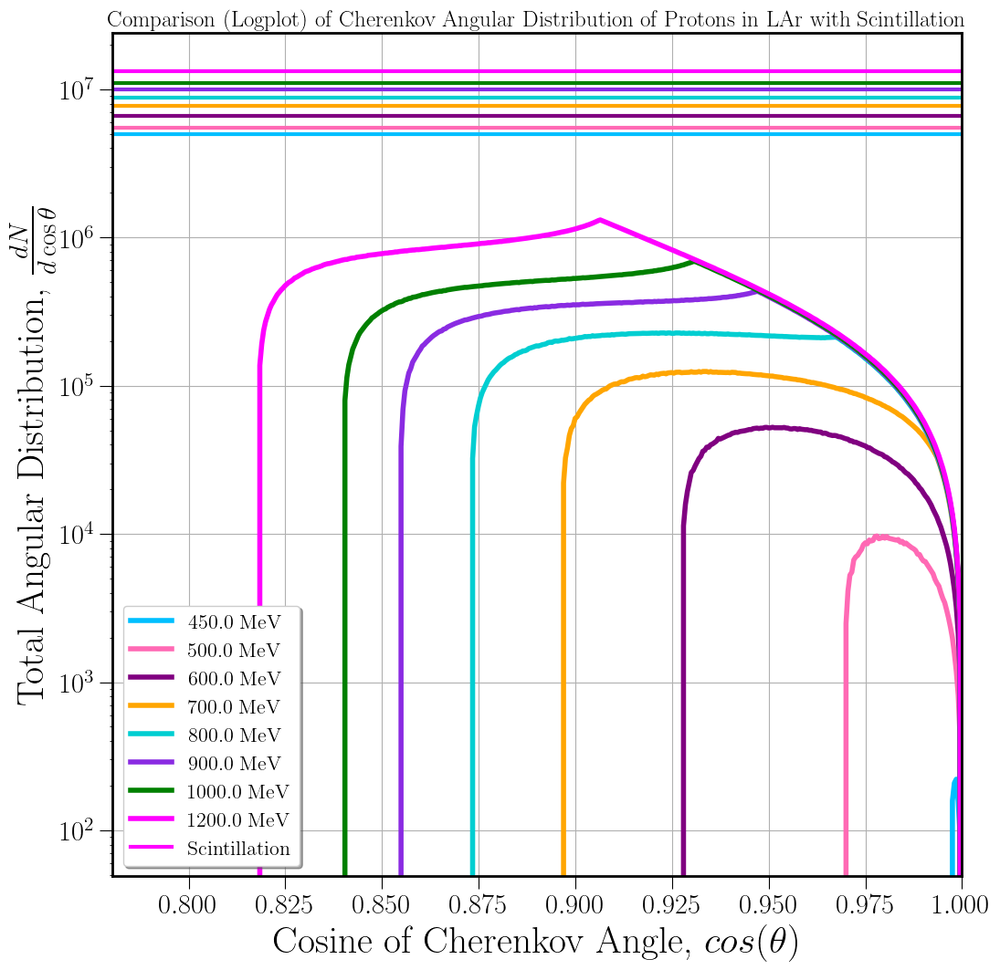

ended:  time.struct_time(tm_year=2023, tm_mon=10, tm_mday=8, tm_hour=17, tm_min=33, tm_sec=54, tm_wday=6, tm_yday=281, tm_isdst=0)


In [371]:
############ RUN THE FUNCTION ###################Total AD####

print('started: ', time.gmtime())

get_cerenkov(z=0,dz=0.01,plotz1=0.98/(n_peakr*filtered_lst_res[0]),plotz2=1)

print('ended: ', time.gmtime())

# t_arr = np.array([450,500,600,700,800,900,1000,1200,1500,2000])  #initial  K.E of the proton in MeV 600,700,800,900,1000

C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3292572501.py:146: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\3292572501.py:188: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 450 Mev Proton in LAr: 0.225
Total Cerenkov photons emitted by a 450 Mev Proton in LAr: 0.165
Total Cerenkov photons emitted by a 450 Mev Proton in LAr: 0.391
[[450, 0.9767305222630268]]


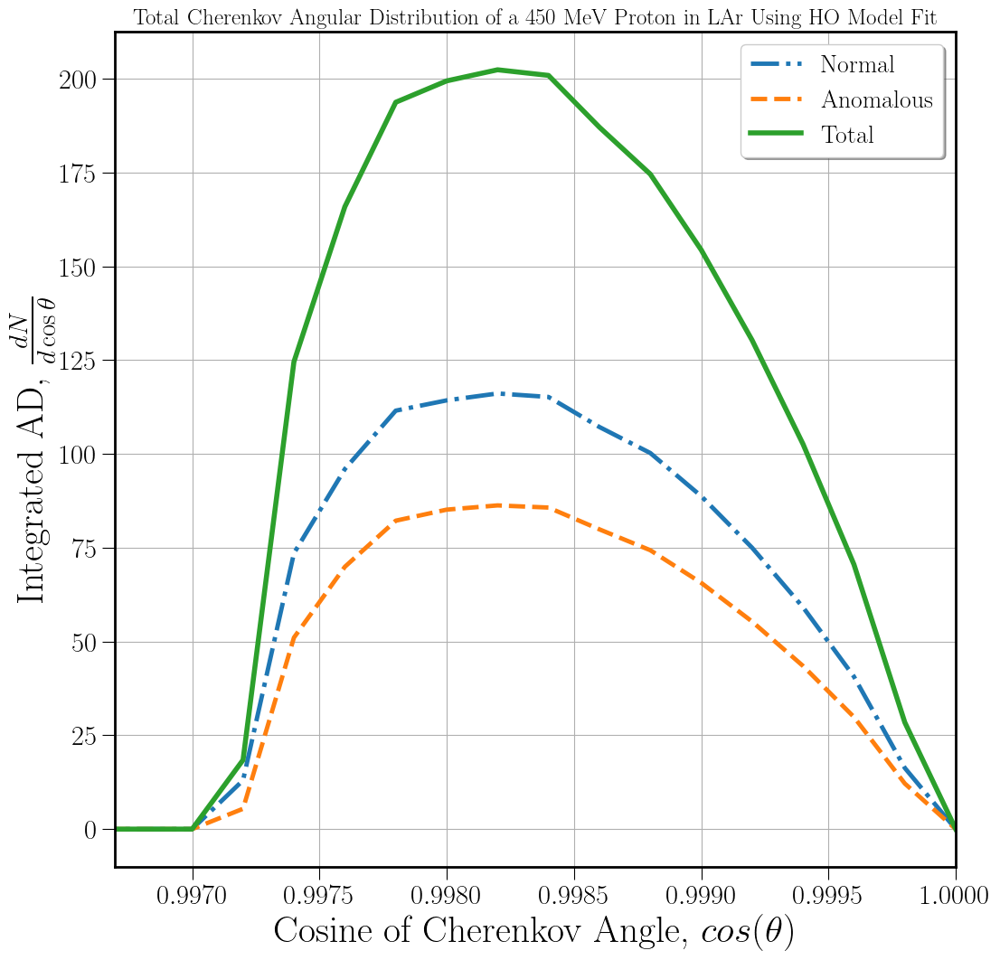

In [395]:
#Integrated AD with HO fit: T MeV (dx= 0.01 cm)
 
from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440,450,460,470,475,480,490,500])
# t = 500
dx = 0.001 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,5000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)
dx = 0.001

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

# print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

t = np.array([450]) #500,600,800,1000,1200,1500,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)



fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title(r"Total Cherenkov Angular Distribution of a 450 MeV Proton in LAr Using HO Model Fit", fontsize= 18) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()



cerenkovfinallistho = []
cerenkovtsumalltsp01 = []

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsumalltp01 = [0 for x in x_all]
    cerenkovangasumalltp01 = [0 for x in x_all]

    cerenkovangtsumalltp01 = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.001)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,5000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,5000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumalltp01 = np.add(func_angnc, cerenkovangnsumalltp01) 
        cerenkovangasumalltp01 = np.add(func_angac, cerenkovangasumalltp01) 
        cerenkovangtsumalltp01 = np.add(func_angtc, cerenkovangtsumalltp01)
            # func_angtc = func_angnc + func_angac 
    cerenkovfinallistho.append(cerenkovtlist)
    cerenkovtsumalltsp01.append(sum(cerenkovangtsumalltp01) * (dx/0.1)/2000) #conversion factor to standard units
    # print(x_all, cerenkovangtsum)

    # plt.plot(x_all, cerenkovangnsum)
    # plt.plot(x_all, cerenkovangasum)
        
        # ax.plot(x_all, cerenkovangnsum, label='t = {} MeV'.format(float(j)))

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangnsumalltp01) * (dx/0.1)/5000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangasumalltp01) * (dx/0.1)/5000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    
    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangtsumalltp01) * (dx/0.1)/5000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    # ax.grid()

    ax.plot(x_all, cerenkovangnsumalltp01* (dx/0.1), ls= 'dashdot', lw= 3.5, label='Normal')  #t = {} MeV'.format(float(j)))
    ax.plot(x_all, cerenkovangasumalltp01* (dx/0.1), ls= 'dashed', lw= 3.5, label='Anomalous')  #t = {} MeV'.format(float(j)))
    ax.plot(x_all, cerenkovangtsumalltp01* (dx/0.1), lw= 4, label='Total')  #t = {} MeV'.format(float(j)))
        
    # plt.xlim(0.96,1)
    plt.xlim([0.9995/(n_peakr*filtered_lst_res[0]), 1])

list_adp01 = list(map(list, list(zip(t, cerenkovtsumalltsp01))))
print(list_adp01)
    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=20,framealpha=None,shadow=True) #loc='best'fig = plt.figure(figsize=(12,12))
# plt.savefig('AD_HO_resonancefit_allTs_dxp01dth2k.jpg', bbox_inches="tight")
# print(t, sum(cerenkovangtsumallt) * (dx/0.1)/2000)
plt.savefig('AD_HOfit_450MeV_dxp001dth5k.jpg', bbox_inches="tight")


In [389]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440,450,460,470,475,480,490,500])
# t = 500
t = np.array([450,500,600,700,800,900,1000]) #,1200,1500,2000,2500,3000]) #initial  K.E of the proton in MeV 600,700,800,900,1000

    
alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.1

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

# print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of Proton in LAr Using HO Model Fit", fontsize= 18) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=28)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=28)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()



cerenkovfinallist = []

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsumallt = [0 for x in x_all]
    cerenkovangasumallt = [0 for x in x_all]

    cerenkovangtsumallt = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.1)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumallt = np.add(func_angnc, cerenkovangnsumallt) 
        cerenkovangasumallt = np.add(func_angac, cerenkovangasumallt) 
        cerenkovangtsumallt = np.add(func_angtc, cerenkovangtsumallt)
            # func_angtc = func_angnc + func_angac 

    # print(x_all, cerenkovangtsum)

    # plt.plot(x_all, cerenkovangnsum)
    # plt.plot(x_all, cerenkovangasum)
        
        # ax.plot(x_all, cerenkovangnsum, label='t = {} MeV'.format(float(j)))

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangtsumallt) * (dx/0.1)/2000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    # ax.grid()

    ax.plot(x_all, cerenkovangtsumallt, label='t = {} MeV'.format(float(j)))
    
        
    # plt.xlim(0.75,1)
    plt.xlim([0.97/(n_peakr*filtered_lst_res[0]), 1])

#     plt.xlim([0.97/(n_peakr*filtered_lst_res[0]), 1])

ax.grid()

list_ad2 = list(map(list, list(zip(t, cerenkovangtsumallt))))
print(list_ad2)
    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=20,framealpha=None,shadow=True) #loc='best'fig = plt.figure(figsize=(12,12))
plt.savefig('AD_HO_resonancefit_allT_dxp1dth2k.jpg', bbox_inches="tight")
# print(t, sum(cerenkovangtsumallt) * (dx/0.1)/2000)


In [ ]:
# # % diff: PVS

# fig = plt.figure(figsize=(12,12))

# ax = fig.add_subplot(111)
# ax.set_title("Percent Difference in Yield From FT and AD Method Using Resonance Fit", fontsize=24)
# ax.plot(t0, perdiff_hofit, linewidth = 3.5, color='g') #, label="Using Grace's Fit"
# ax.tick_params(axis='both',which='major',labelsize=20,length=10)

# ax.set_xlabel("K.E of Proton, T (MeV)", fontsize=28)
# ax.set_ylabel('Percent ($\%$) Difference in Yield', fontsize=28)
# ax.grid()
# plt.savefig("percentdifference_ho.jpg", bbox_inches="tight")
# # ax.legend(fontsize=22)
# # ax.set_xlim(0,500)

Total Cerenkov photons emitted by a 440 Mev Proton in LAr: 0.000
Total Cerenkov photons emitted by a 450 Mev Proton in LAr: 0.389


C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1352077122.py:144: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1352077122.py:186: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 460 Mev Proton in LAr: 7.564
Total Cerenkov photons emitted by a 470 Mev Proton in LAr: 28.743
Total Cerenkov photons emitted by a 475 Mev Proton in LAr: 44.363
Total Cerenkov photons emitted by a 480 Mev Proton in LAr: 63.486
Total Cerenkov photons emitted by a 490 Mev Proton in LAr: 117.683
Total Cerenkov photons emitted by a 500 Mev Proton in LAr: 200.542


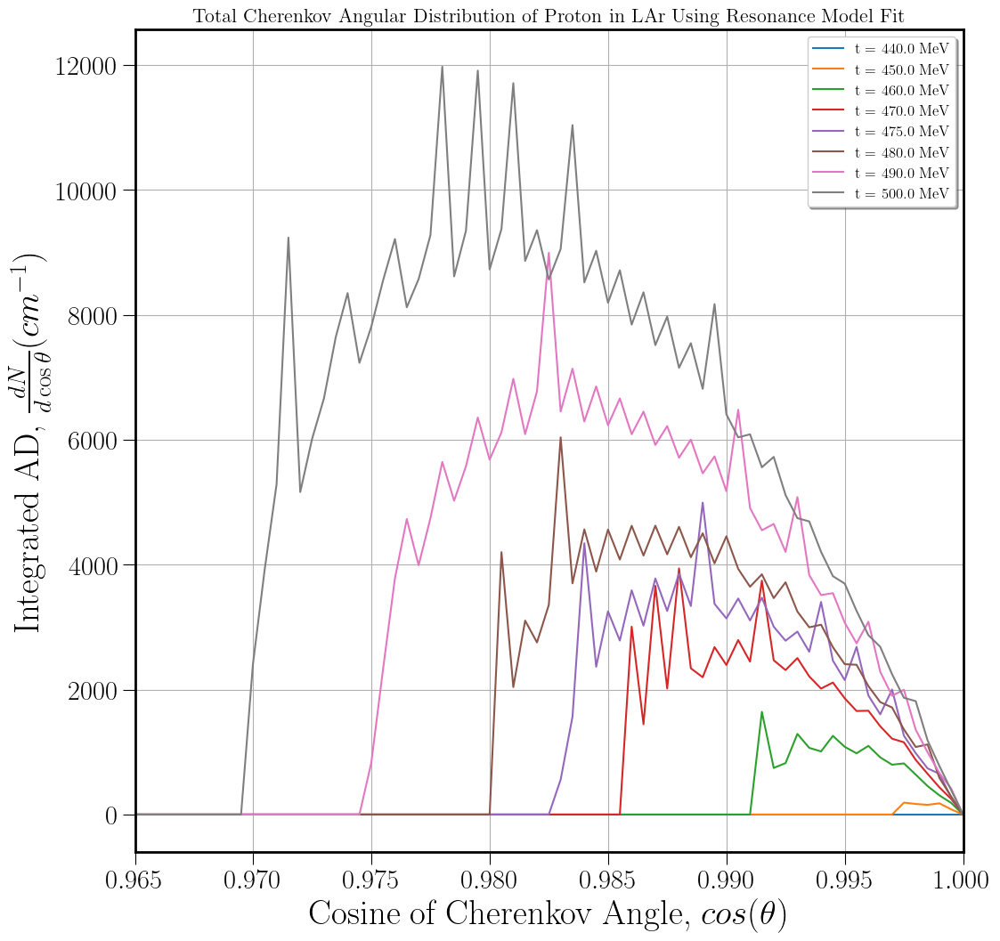

In [162]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t = np.array([440,450,460,470,475,480,490,500])
# t = 500
dx = 0.1 #cm
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using HO Model Fit ($dx=$0.01, $d\theta=\frac{\pi/2}{2000}$)", fontsize= 15) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=28)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=28)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangnsum500*(dx/0.1), linewidth= 3, c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasum500*(dx/0.1), linewidth= 3, c='orange', label='Anomalous'.format(float(j))) #anomalous

ax.plot(x_all, cerenkovangtsum500*(dx/0.1), linewidth= 4, c= 'g', label='Total'.format(float(j))) #total
    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.965,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22) #loc='best' ,framealpha=None,shadow=True
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp1dth2k.jpg', bbox_inches= "tight") 
# plt.savefig('AD_Total_Cherenkov_HOmodel_500MeV_dxp01dth2k.jpg', bbox_inches= "tight") 
    
alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.1

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

# print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of Proton in LAr Using Resonance Model Fit ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=28)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=28)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()



cerenkovfinallist = []

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsum = [0 for x in x_all]
    cerenkovangasum = [0 for x in x_all]

    cerenkovangtsum = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.1)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
        cerenkovangasum = np.add(func_angac, cerenkovangasum) 
        cerenkovangtsum = np.add(func_angtc, cerenkovangtsum)
            # func_angtc = func_angnc + func_angac 

    # print(x_all, cerenkovangtsum)

    # plt.plot(x_all, cerenkovangnsum)
    # plt.plot(x_all, cerenkovangasum)
        
        # ax.plot(x_all, cerenkovangnsum, label='t = {} MeV'.format(float(j)))

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangtsum) * (dx/0.1)/2000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    # ax.grid()

    ax.plot(x_all, cerenkovangtsum, label='t = {} MeV'.format(float(j)))
    
        
    plt.xlim(0.965,1)
#     plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])

    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=12,framealpha=None,shadow=True) #loc='best'fig = plt.figure(figsize=(12,12))
# plt.savefig('AD_HO_resonancefit_lowT_dxp1dth2k.jpg', bbox_inches="tight")



In [ ]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440,450,460,470,475,480,490,500])
t = np.array([500,600,700,800,900])

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.1 #cm

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

# print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of Proton in LAr Using HO Model Fit", fontsize= 18) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()



cerenkovfinallist = []

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsump1 = [0 for x in x_all]
    cerenkovangasump1 = [0 for x in x_all]

    cerenkovangtsump1 = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.1)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsump1 = np.add(func_angnc, cerenkovangnsump1) 
        cerenkovangasump1 = np.add(func_angac, cerenkovangasump1) 
        cerenkovangtsump1 = np.add(func_angtc, cerenkovangtsump1)
            # func_angtc = func_angnc + func_angac 

    # print(x_all, cerenkovangtsum)

    # plt.plot(x_all, cerenkovangnsum)
    # plt.plot(x_all, cerenkovangasum)
        
        # ax.plot(x_all, cerenkovangnsum, label='t = {} MeV'.format(float(j)))

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, sum(cerenkovangtsump1) * (dx/0.1)/2000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
    # ax.grid()

    ax.plot(x_all, cerenkovangtsump1, label='t = {} MeV'.format(float(j)))
    
        
    plt.xlim(0.8,1)
#     plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])

    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=12,framealpha=None,shadow=True) #loc='best'
# plt.savefig('AD_HO_resonancefit_lowT_dxp1dth2k.jpg', bbox_inches="tight")
plt.savefig('AD_HO_resonancefit_medT_dxp1dth2k.jpg', bbox_inches="tight")



n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1776783342.py:159: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1776783342.py:201: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 450 Mev Proton in LAr: 0.415
Total Cerenkov photons emitted by a 500 Mev Proton in LAr: 200.202
Total Cerenkov photons emitted by a 600 Mev Proton in LAr: 2675.879
Total Cerenkov photons emitted by a 700 Mev Proton in LAr: 9527.783
Total Cerenkov photons emitted by a 800 Mev Proton in LAr: 22197.320
Total Cerenkov photons emitted by a 900 Mev Proton in LAr: 39998.558
Total Cerenkov photons emitted by a 1000 Mev Proton in LAr: 62052.052


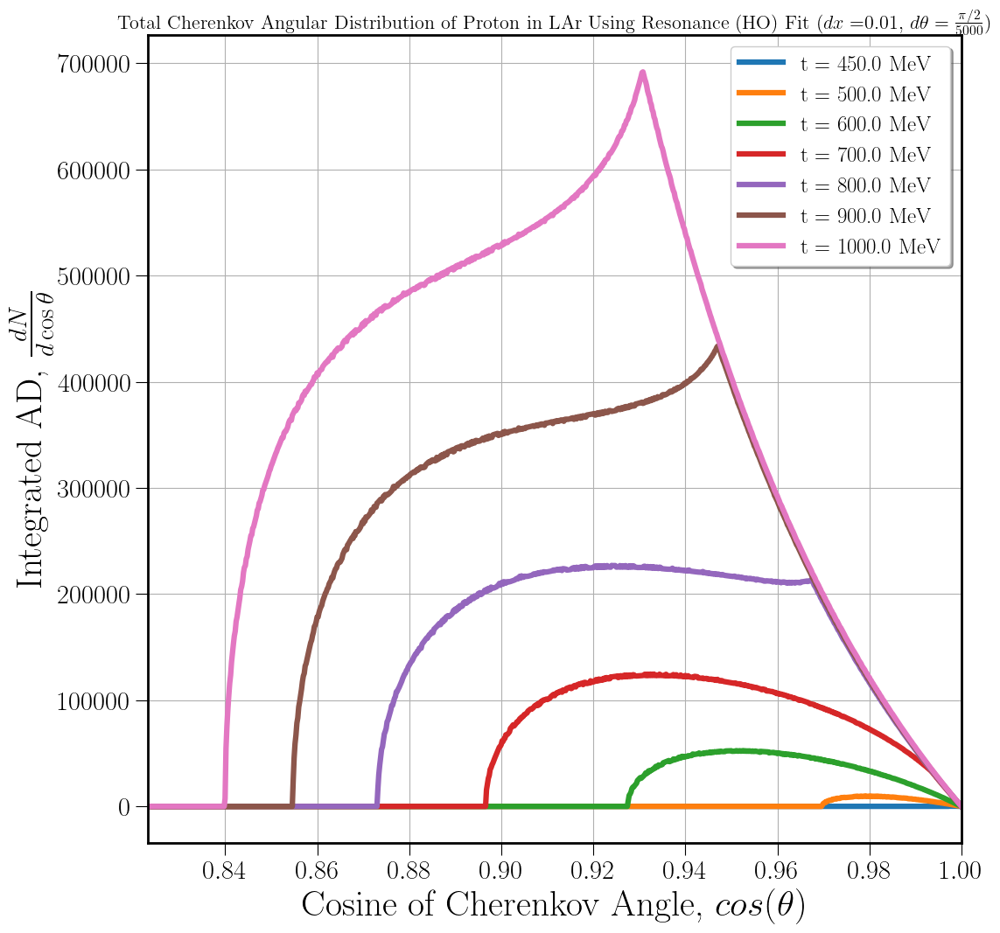

In [780]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440,450,460,470,480,490,500])
t = np.array([450,500,600,700,800,900,1000])
# t = 500
dx = 0.01 #cm

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)
# dx = 0.01

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

cerenkov_alln =  [] #[[] for j in t] #normal
cerenkov_alla =  [] #[[] for j in t] #anomalous

cerenkov_all =  [] #[[] for j in t] #total
scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of Proton in LAr Using HO Fit", fontsize= 18) # ($dx=$0.01, $d\theta=\frac{\pi/2}{5000}$) 
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsum = [0 for x in x_all]
    cerenkovangasum = [0 for x in x_all]

    cerenkovangtsum = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.01)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
        cerenkovangasum = np.add(func_angac, cerenkovangasum) 
        cerenkovangtsum = np.add(func_angtc, cerenkovangtsum)
            # func_angtc = func_angnc + func_angac 

    # print(x_all, cerenkovangtsum)

    # plt.plot(x_all, cerenkovangnsum)
    # plt.plot(x_all, cerenkovangasum)
        
        # ax.plot(x_all, cerenkovangnsum, label='t = {} MeV'.format(float(j)))

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, (sum(cerenkovangtsum) * (dx/0.1))/5000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    ax.plot(x_all, cerenkovangtsum*(dx/0.1), lw= 4.5, label='t = {} MeV'.format(float(j)))
    # plt.yscale("log")
        
    # plt.xlim(0.8,1)
    plt.xlim([0.98/(n_peakr*filtered_lst_res[0]), 1])

#     plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])

    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=18,framealpha=None,shadow=True) #loc='best'
# plt.savefig('AD_HO_resonancefit_lowT_dxp01dth2k.jpg', bbox_inches="tight")
# plt.savefig('AD_HO_resonancefit_medT_dxp01dth5k.jpg', bbox_inches="tight") #_logplot



# Model Comparison on AD: HO and Approx Fit

n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\2175142530.py:159: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\2175142530.py:201: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 500 Mev Proton in LAr: 200.316


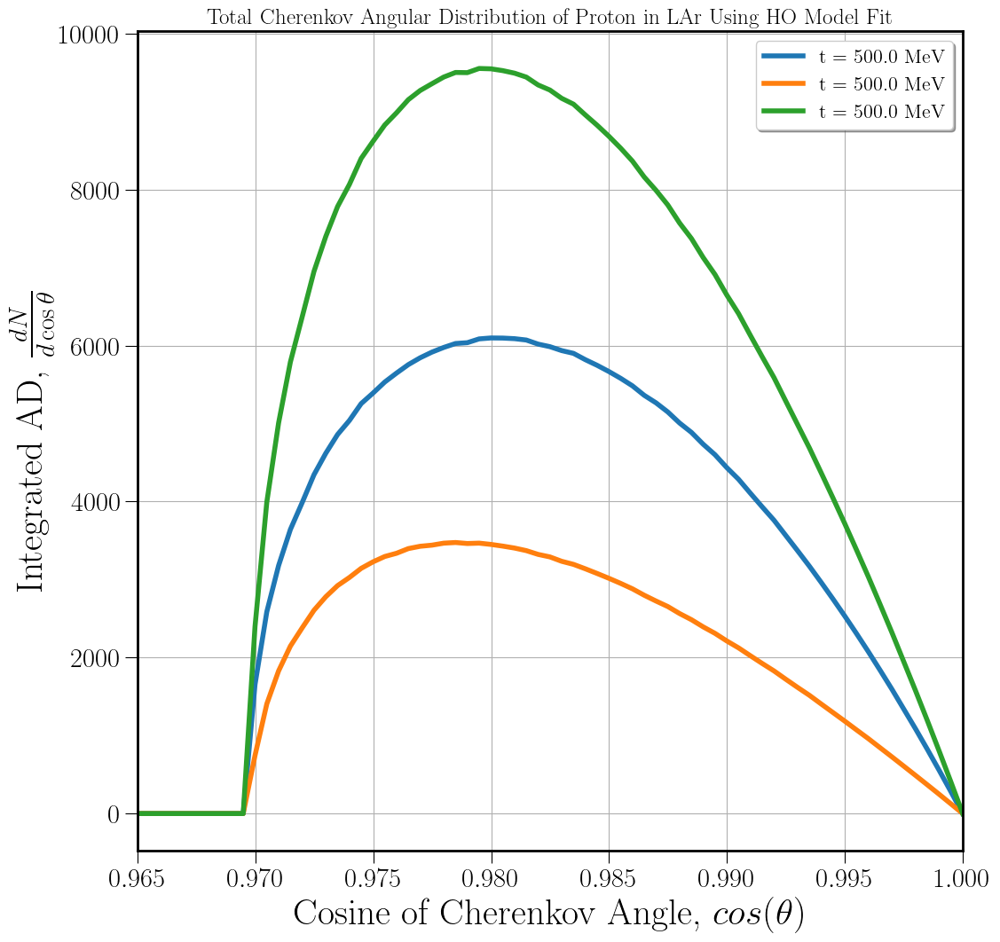

In [574]:
#Integrated AD with HO fit: T MeV 

from scipy.misc import derivative

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([400, 500, 800]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([440,450,460,470,480,490,500])
t = np.array([500])

# t = 500

alpha = 1/137
mp = 938  #Proton's mass in MeV
beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# y = 1/beta
# y = np.linspace(y,y,2000)   #wavelength of light 

mp = 938  #Proton's mass in MeV

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.001 #cm

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))


# cerenkovangnsum = []
# cerenkovangasum = []
# cerenkovangtsum = []

cerenkov_alln =  [] #[[] for j in t] #normal
cerenkov_alla =  [] #[[] for j in t] #anomalous

cerenkov_all =  [] #[[] for j in t] #total
scint_all =  []  #[[] for j in t]

# beta  = np.sqrt(1 - (1/(1 + t/mp)**2)) #Relativistic Approach 
# # print(beta)

# for j in t: #range(len(t)) 

cerenkovanglist = []

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
        return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []
    

# t = np.array([10,100,150,200,250,300,383.96,400,450,500,550,600,650,697.678,700,750,800,850,900,950,1000,1050,1100,1200,1300,1400,1500,1600]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# cerenkovfinallist = []
# cerenkovtsum500 = []

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Total Cherenkov Angular Distribution of Proton in LAr Using HO Model Fit", fontsize= 18) # ($dx=$0.001, $d\theta=\frac{\pi/2}{2000}$) 
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)
ax.grid()

for j in t: 
    cerenkovtlist = []
    # cerenkovsum = 0
    cerenkovangnsumho = [0 for x in x_all]
    cerenkovangasumho = [0 for x in x_all]

    cerenkovangtsumho = [0 for x in x_all]

#     print(j)
#     print(make_betalist(j))
    
    mybetalist = make_betalist(j,0,0.001)
    filtered_lst_res = [x for x in mybetalist if x > 0.735294]
    # print(filtered_lst_res)
    
    for i in filtered_lst_res:  #[0:20]

        cos_ang_min = 1/(i * n_peakr)
        cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
        cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

        # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

        
        def func_angn(x):  #Normal AD_
        
            if x >= cos_ang_min and x <= cos_ang_maxn:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()
           
                    
                # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    # lmin = lamd[min(idx)]
                    lmax = lamd[max(idx)] #lamd[idx[1]]
            
                # if 1/(i*x) <= n_500:
                    # lmin = max(lamd[min(idx)], 106.67)
                    # lmax = 500            

                # lamdminr.append(lmin)
                lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)
        
            else: 
                return 0 #To avaid getting negative contribution 

        func_angnc = [func_angn(x) for x in x_all]  
        # print(x_all, func_angnc)
        # plt.plot(x_all, func_angnc)
            
            
    
        def func_anga(x):  #Anomalous AD
        
            if x >= cos_ang_min and x <= cos_ang_maxa:
            
                y= 1/(i*x)
                y = np.linspace(y,y,2000)   #wavelength of light 
                # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                funclamd = n_jacksonr - y
                idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

            
               # if 1/(i*x) > n_peakr:
                   # lmin = lamd_peakr
                   # lmax = lamd_peakr
            
                if 1/(i*x) < n_peakr:   
                    lmin = lamd[min(idx)]  #, 106.67)
                   # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]
            
                # if 1/(i*x) <= n_uvr:
                    # lmin = 106.67
                    #     # lmax = 500        
                    
                lamdminr.append(lmin)
                # lamdmaxr.append(lmax)
        
                # print(j, i, lamdminr, lamdmaxr)
                # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
    
                d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
            
                return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)
    
            else: 
                return 0 #To avaid getting negative contribution 

        func_angac = [func_anga(x) for x in x_all]       
           
            
    # cerenkovangsum = cerenkovangnsum + cerenkovangasum  
           
        func_angtc = [(func_angn(x) + func_anga(x)) for x in x_all]
            
        cerenkovangnsumho = np.add(func_angnc, cerenkovangnsumho) 
        cerenkovangasumho = np.add(func_angac, cerenkovangasumho) 
        cerenkovangtsumho = np.add(func_angtc, cerenkovangtsumho)
            # func_angtc = func_angnc + func_angac 

    print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(j, (sum(cerenkovangtsumho) * (dx/0.1))/2000)) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    ax.plot(x_all, cerenkovangnsumho*(dx/0.1), lw= 4, label='t = {} MeV'.format(float(j)))
    ax.plot(x_all, cerenkovangasumho*(dx/0.1), lw= 4, label='t = {} MeV'.format(float(j)))

    ax.plot(x_all, cerenkovangtsumho*(dx/0.1), lw= 4, label='t = {} MeV'.format(float(j)))
    
        
    plt.xlim(0.965,1)
#     plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])

    
#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=16,framealpha=None,shadow=True) #loc='best'
# plt.savefig('AD_HO_resonancefit_lowT_dxp001dth2k.jpg', bbox_inches="tight")



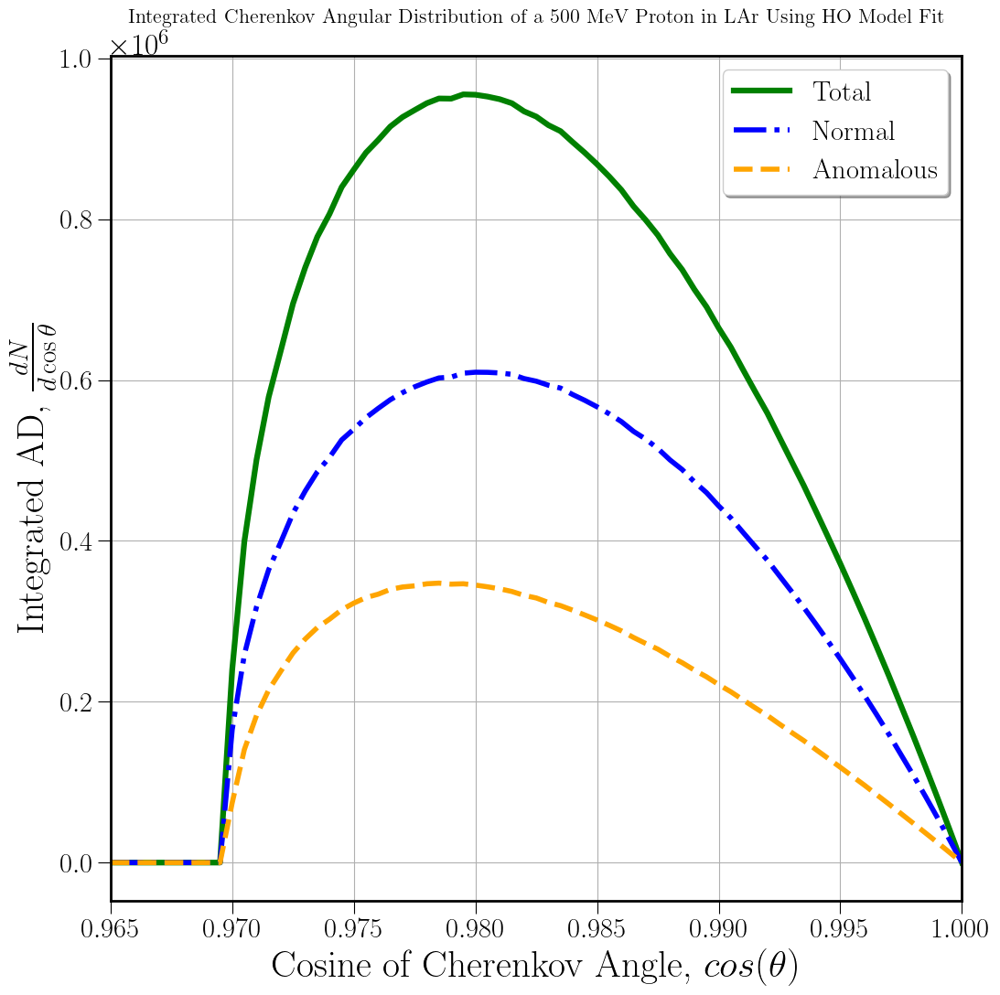

In [116]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Integrated Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using HO Model Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangtsumho*(dx/0.1), linewidth= 4.5, c= 'g', label='Total'.format(float(j))) #total

ax.plot(x_all, cerenkovangnsumho*(dx/0.1), linewidth= 4, ls= 'dashdot', c='b', label='Normal'.format(float(j))) #normal
ax.plot(x_all, cerenkovangasumho*(dx/0.1), linewidth= 4, ls= 'dashed', c='orange', label='Anomalous'.format(float(j))) #anomalous

    
# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.965,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=22,framealpha=None,shadow=True) #loc='best'
plt.savefig('AD_Total_Cherenkov_comps_HOmodel_500MeV_dxp001dth2k.jpg', bbox_inches= "tight") 
    

C:\Users\hrrah\AppData\Local\Temp\ipykernel_11432\1604015220.py:5: RuntimeWarning: divide by zero encountered in divide
  f = (1- x_all**2)/x_all**3


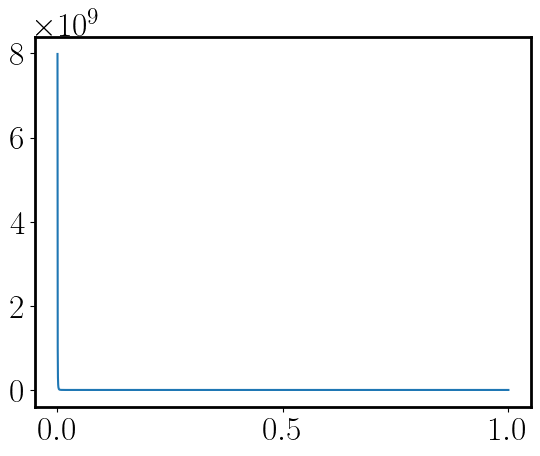

In [282]:
theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)

f = (1- x_all**2)/x_all**3

plt.plot(x_all,f)

In [ ]:
# ##REF: Visualize high order derivatives of the tanh function

# import numpy as np
# import numdifftools as nd
# import matplotlib.pyplot as plt
# x = np.linspace(-2, 2, 100)
# for i in range(10):
#     df = nd.Derivative(np.tanh, n=i)
#     y = df(x)
#     h = plt.plot(x, y/np.abs(y).max())
    
# plt.show()   

from scipy.misc import derivative

def f(x):
    return x**2 + 1

derivative(f, 5, dx=1e-6)
# 10.00000000139778


In [120]:

#Formula: PVS FIT
n_pvs = lambda wl: a_0 + (a_pvs * ((lamd_uv**(-1) - wl**(-1))/((lamd_uv**(-1) - wl**(-1))**2 + gamma**2)))
# n2_pvs = lambda wl: (a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2))))**2
# lamdmin = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta - np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))
# lamdmax = (2*lamd_uv*(a_0*beta - 1))/(2 * (a_0*beta - 1) + lamd_uv * (a_pvs * beta + np.sqrt((a_pvs * beta)**2 - 4 * (a_0*beta - 1)**2 * gamma**2)))

# print("Algebraic Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdmin, lamdmax))
# cos_ang_min = 1/(b*n_max)
# cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


#lambda(theta) when theta changes

# b = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])
# lamd = np.linspace(0,700,700)
# n_pvs = a_0 + (a_pvs * ((lamd_uv**(-1) - lamd**(-1))/((lamd_uv**(-1) - lamd**(-1))**2 + gamma**2)))

alpha = 1/137 #Fine-structure (EM coupling) constant 

a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
# beta = 0.75

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm

#Refractive index new fit: M. Sievert (Mathematica equivalent)

lamd = np.linspace(100,500,500)   #wavelength of light 
mp = 938  #Proton's mass in MeV


theta = np.linspace(0, np.pi/2, 2000)

b = 0.7579653181328908 #beta

#Wavelength as a function of the angle: lambda(theta)
lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))

#term involving wavelengths: (lamd_uv^-1 - lamd_theta^-1)
lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
lamd_nterm = (((-b*a_pvs*np.cos(theta)) - ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p

func_angp = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_pterm**2)**2/(gamma**2 - lamd_pterm**2))) + ((2*a_0*a_pvs*b) * lamd_pterm * np.abs((gamma**2 + lamd_pterm**2)/(gamma**2 - lamd_pterm**2))) + ((b*a_pvs**2*lamd_pterm**2)/np.abs(gamma**2 - lamd_pterm**2))))
func_angn = ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_nterm**2)**2/(gamma**2 - lamd_nterm**2))) + ((2*a_0*a_pvs*b) * lamd_nterm * np.abs((gamma**2 + lamd_nterm**2)/(gamma**2 - lamd_nterm**2))) + ((b*a_pvs**2*lamd_nterm**2)/np.abs(gamma**2 - lamd_nterm**2))))

func_angt = func_angp + func_angn

# print(b, lamd_thetap, lamd_thetan, lamd_pterm, lamd_nterm, func_angp, func_angn, sep='\n')

# print(theta, lamd_thetap) #, lamd_thetan, lamd_pterm, func_angp, func_angn
# print("{}, lamd_thetap= {:.5f}, lamd_thetan = {:.5f}, lamd_pterm  = {}, func_ang= {}".format(b, lamd_thetap, lamd_thetan, lamd_pterm, func_ang))
# lamd_pterm, lamd_nterm
#(0.00021947, 0.00061913), (0.00219235, 0.00077715)

C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\2363343043.py:28: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\2363343043.py:29: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\2363343043.py:32: RuntimeWarning: invalid value encountered in sqrt
  lamd_pterm = (((-b*a_pvs*np.cos(theta)) + ((b**2*a_pvs**2*np.cos(theta)**2) - (4 * ((b*a_0*np.cos(theta)) - 1) * ((b*a_0*gamma**2*np.cos(theta)) - gamma**2)))**(1/2))/(2*((b*a_0*np.cos(theta)) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
C

C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\3326987252.py:10: RuntimeWarning: invalid value encountered in multiply
  ax.plot(np.cos(theta), 2*pi*1e7*func_angp, linewidth= 3.5, ls= '--', label= "$(\\frac{dN}{dx dcos\\theta})_{Normal}$")    #func_angp = f(lamd_pterm): Blue plot
C:\Users\hrrah\anaconda3\Lib\site-packages\matplotlib\cbook\__init__.py:1335: RuntimeWarning: invalid value encountered in cast
  return np.asarray(x, float)
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\3326987252.py:11: RuntimeWarning: invalid value encountered in multiply
  ax.plot(np.cos(theta), 2*pi*1e7*func_angn, linewidth= 3.5, ls= 'dashdot', label= "$(\\frac{dN}{dx dcos\\theta})_{Anomalous}$")     #func_angp = f(lamd_pterm): Orange plot
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\3326987252.py:12: RuntimeWarning: invalid value encountered in multiply
  ax.plot(np.cos(theta), 2*pi*1e7*func_angt, linewidth= 4.5, color= 'g', label= "$(\\frac{dN}{dx d\\cos\\theta})_{Total}$")     #func_angp = f(l

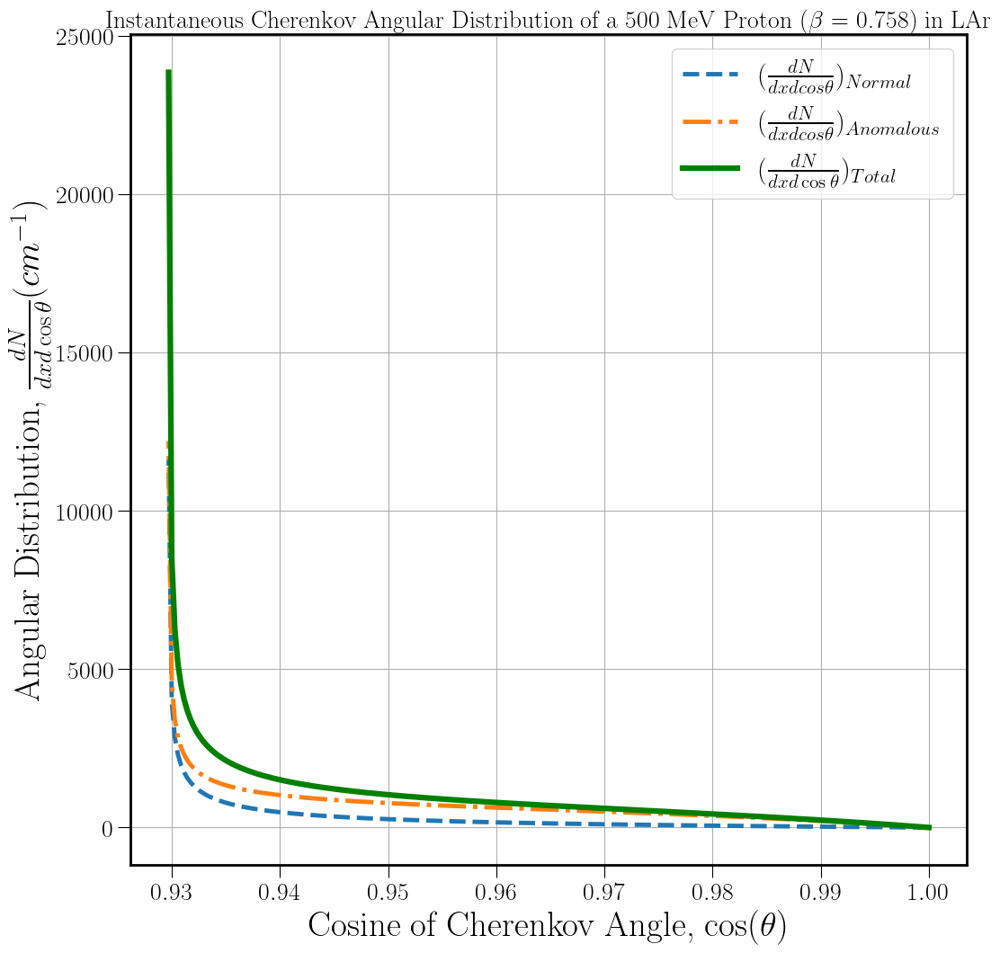

In [121]:
#Converting the above plot to dcos(theta) vs cos(theta)
# print(b, func_angp, func_angn)
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

ax.set_title("Instantaneous Cherenkov Angular Distribution of a 500 MeV Proton ($\\beta$ = 0.758) in LAr", fontsize= 18)

func_angt = func_angp + func_angn

ax.plot(np.cos(theta), 2*pi*1e7*func_angp, linewidth= 3.5, ls= '--', label= "$(\\frac{dN}{dx dcos\\theta})_{Normal}$")    #func_angp = f(lamd_pterm): Blue plot
ax.plot(np.cos(theta), 2*pi*1e7*func_angn, linewidth= 3.5, ls= 'dashdot', label= "$(\\frac{dN}{dx dcos\\theta})_{Anomalous}$")     #func_angp = f(lamd_pterm): Orange plot
ax.plot(np.cos(theta), 2*pi*1e7*func_angt, linewidth= 4.5, color= 'g', label= "$(\\frac{dN}{dx d\\cos\\theta})_{Total}$")     #func_angp = f(lamd_pterm): Green plot


# plt.scatter(theta,func_angn)    #func_angn = f(lamd_nterm): Orange plot


ax.set_xlabel("Cosine of Cherenkov Angle, $\\cos(\\theta)$ ",fontsize=28)
ax.set_ylabel("Angular Distribution, $\\frac{dN}{dx d\\cos\\theta} (cm^{-1})$",fontsize=28)
ax.grid()
ax.tick_params(axis='both',which='major',labelsize=20,length=10)

ax.legend(fontsize=22)

# plt.ylim([0,10000])
# plt.xlim([0,30])

# plt.savefig("angdist_dcostheta_total_betap758.jpg", bbox_inches="tight") #Ctrl+/ to comment in or out 
# theta, func_angp, func_angn

C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\1739723852.py:18: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\1739723852.py:19: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\1739723852.py:22: RuntimeWarning: invalid value encountered in sqrt
  lamd_pterm = (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
C:\Users\hrrah\AppData\Local\Temp\ipykernel_2096\1739723852.p

97.0177210196262*pi 193.538485570839*pi 290.556206590465*pi


(0.9203777678659733, 1.0)

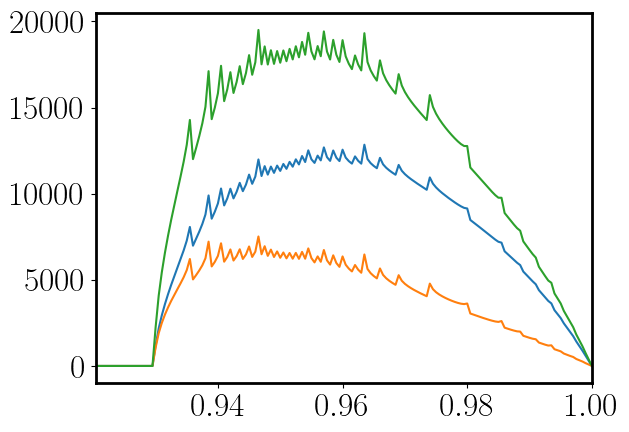

In [127]:
#Integrated/Total AD PVS Fit:


#AD (normal)

alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

# b= 0.7579653181328908

# b= 0.79249149
betalist = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])

#Wavelength as a function of the angle: lambda(theta)
lamd_thetap = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) + np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))
lamd_thetan = 2*(b*a_0*np.cos(theta) - 1)/(((2*lamd_uv**(-1)) * (b*a_0*np.cos(theta) - 1)) + (b*a_pvs*np.cos(theta)) - np.sqrt(b**2*a_pvs**2*np.cos(theta)**2 - (4*gamma**2*(b*a_0*np.cos(theta) - 1)**2)))

#term involving wavelengths: (lamd_uv^-1 - lamd_theta^-1)
lamd_pterm = (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p
lamd_nterm = (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) #lamd_uv_inv_min_lamd_theta_inv_p

func_angp = lambda lamd_pterm: ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_pterm**2)**2/(gamma**2 - lamd_pterm**2))) + ((2*a_0*a_pvs*b) * lamd_pterm * np.abs((gamma**2 + lamd_pterm**2)/(gamma**2 - lamd_pterm**2))) + ((b*a_pvs**2*lamd_pterm**2)/np.abs(gamma**2 - lamd_pterm**2))))
func_angn = lambda lamd_nterm: ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + lamd_nterm**2)**2/(gamma**2 - lamd_nterm**2))) + ((2*a_0*a_pvs*b) * lamd_nterm * np.abs((gamma**2 + lamd_nterm**2)/(gamma**2 - lamd_nterm**2))) + ((b*a_pvs**2*lamd_nterm**2)/np.abs(gamma**2 - lamd_nterm**2))))

# func_angt = lambda func_angp, func_angn: (func_angp + func_angn)*1e7  #dN/dx.dcos(theta)

# cerenkovangfinallist = []
# cerenkovangt00sum = []
# theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)

# t = np.array([383.96156,400,500,600,650,700]) #initial  K.E of the proton in MeV 600,700,800,900,1000

# for j in t: 

# cerenkovanglist = []
cerenkovangpsum = [0 for x in x_all]
cerenkovangnsum = [0 for x in x_all]

for b in betalist: 
    
    cos_ang_min = 1/(b*n_max)

    
#     print(j) #OUTPUT
#     print(make_betalist(j))
# mybetalist = make_betalist(j)
# filtered_lst = [x for x in mybetalist if x > 0.7046534357]
# print(j, np.shape(filtered_lst), filtered_lst)
    
# for b in filtered_lst:

    def func_angp(x):
        if x >= cos_ang_min:
            return 2*pi*1e6* (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))))) #+ ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
        else: 
            return 0 
#     print(b)
        
    func_angpc = [func_angp(x) for x in x_all]       
    cerenkovangpsum = np.add(func_angpc, cerenkovangpsum) 
# print(sum(cerenkovangpsum)/2000)


#AD (anomalous)


    def func_angn(x):
        if x >= cos_ang_min:
            return 2*pi*1e6* (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta) ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + 

        else: 
            return 0 
#     print(b)
        
    func_angnc = [func_angn(x) for x in x_all]    
    
    cerenkovangnsum = np.add(func_angnc, cerenkovangnsum) 
    
    
    cerenkovangsum = cerenkovangpsum + cerenkovangnsum
print(sum(cerenkovangpsum)/2000, sum(cerenkovangnsum)/2000, sum(cerenkovangsum)/2000) 
# print(cerenkovangsum)
# cerenkovangfinallist.append(cerenkovangtlist)

plt.plot(x_all, cerenkovangnsum)
plt.plot(x_all, cerenkovangpsum)
plt.plot(x_all, cerenkovangsum)

plt.xlim([0.99/(n_max*betalist[0]), 1])
# t,cerenkovangt00sum


C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\1194773394.py:75: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetan = 2*(b*a_0*x - 1)/(((2*lamd_uv**(-1)) * (b*a_0*x - 1)) + (b*a_pvs*x) - np.sqrt(b**2*a_pvs**2*x**2 - (4*gamma**2*(b*a_0*x - 1)**2)))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_7032\1194773394.py:97: RuntimeWarning: invalid value encountered in sqrt
  lamd_thetap = 2*(b*a_0*x - 1)/(((2*lamd_uv**(-1)) * (b*a_0*x - 1)) + (b*a_pvs*x) + np.sqrt(b**2*a_pvs**2*x**2 - (4*gamma**2*(b*a_0*x - 1)**2)))


Cherenkov photons emitted by a 500 Mev Proton in LAr (PVS fit): 910.977


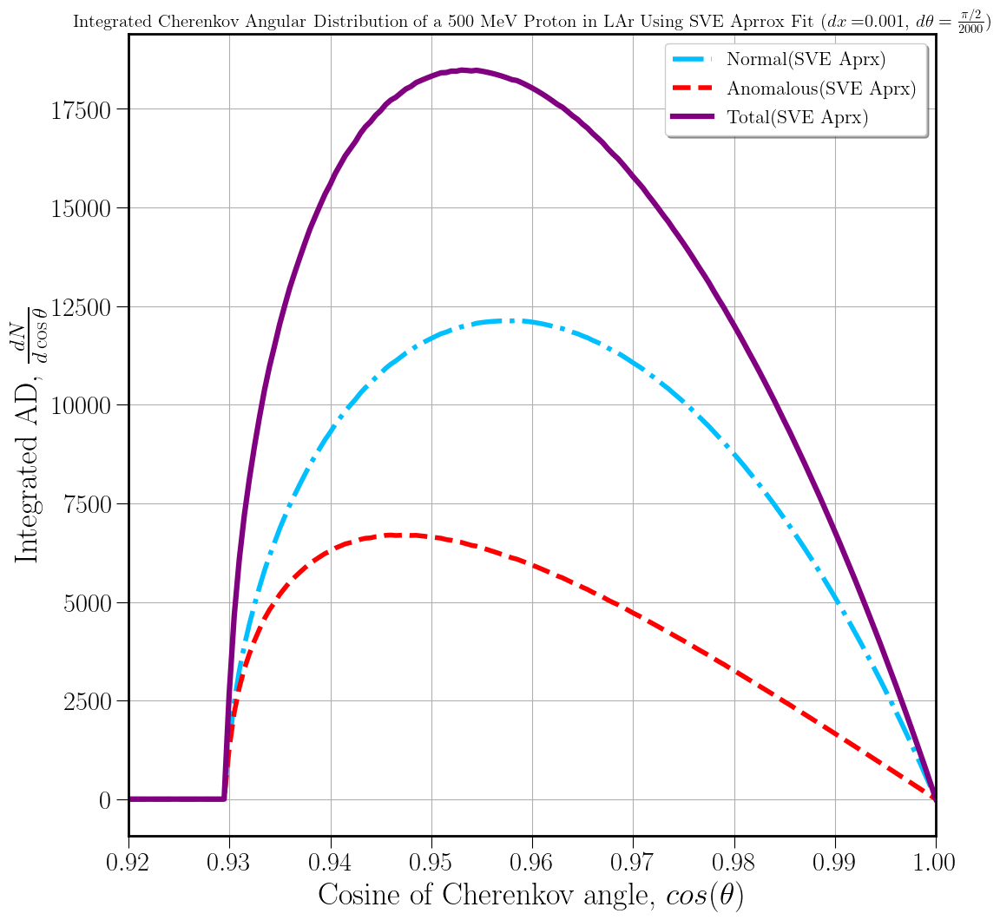

In [45]:
# Angular Distribution of Cerenkov Radiation (ANOMALOUS AD)

alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081
lamd_uv = 106.6 #in nm 

# betalist = np.array([0.7579653181328908, 0.7578303147381336, 0.7576951498969984, 0.7575598232721383, 0.7574243345251596, 0.7572886833166151, 0.7571528693060026, 0.7570168921517577, 0.7568807515112517, 0.7567444470407855, 0.7566079783955859, 0.7564713452298011, 0.7563345471964956, 0.7561975839476465, 0.756060455134138, 0.7559231604057575, 0.755785699411191, 0.7556480717980177, 0.7555102772127064, 0.7553723153006094, 0.7552341857059597, 0.7550958880718638, 0.7549574220402998, 0.7548187872521097, 0.754679983346997, 0.7545410099635202, 0.7544018667390884, 0.7542625533099574, 0.7541230693112227, 0.7539834143768168, 0.7538435881395024, 0.7537035902308686, 0.7535634202813252, 0.7534230779200978, 0.7532825627752229, 0.7531418744735427, 0.7530010126406996, 0.7528599769011316, 0.7527187668780668, 0.7525773821935179, 0.7524358224682773, 0.752294087321912, 0.7521521763727579, 0.7520100892379145, 0.7518678255332395, 0.7517253848733438, 0.7515827668715855, 0.7514399711400648, 0.7512969972896183, 0.7511538449298137, 0.7510105136689442, 0.7508670031140227, 0.7507233128707762, 0.7505794425436405, 0.7504353917357542, 0.7502911600489532, 0.7501467470837648, 0.7500021524394018, 0.7498573757137571, 0.7497124165033976, 0.7495672744035583, 0.7494219490081363, 0.7492764399096855, 0.7491307466994097, 0.7489848689671572, 0.7488388063014149, 0.7486925582893011, 0.7485461245165616, 0.7483995045675609, 0.7482526980252782, 0.7481057044712999, 0.7479585234858139, 0.7478111546476035, 0.7476635975340403, 0.7475158517210785, 0.7473679167832487, 0.7472197922936509, 0.747071477823948, 0.7469229729443603, 0.7467742772236576, 0.7466253902291535, 0.7464763115266991, 0.746327040680675, 0.746177577253986, 0.7460279208080539, 0.7458780709028101, 0.7457280270966904, 0.7455777889466261, 0.745427356008039, 0.7452767278348331, 0.7451259039793887, 0.7449748839925544, 0.7448236674236414, 0.7446722538204145, 0.7445206427290869, 0.7443688336943122, 0.7442168262591768, 0.7440646199651937, 0.7439122143522939, 0.7437596089588205, 0.7436068033215202, 0.7434537969755363, 0.7433005894544015, 0.7431471802900299, 0.7429935690127099, 0.7428397551510962, 0.742685738232203, 0.7425315177813947, 0.7423770933223802, 0.7422224643772034, 0.7420676304662366, 0.7419125911081719, 0.7417573458200136, 0.7416018941170703, 0.7414462355129469, 0.741290369519536, 0.7411342956470106, 0.7409780134038155, 0.7408215222966595, 0.7406648218305065, 0.7405079115085679, 0.7403507908322936, 0.7401934593013643, 0.7400359164136826, 0.7398781616653645, 0.7397201945507313, 0.7395620145623004, 0.7394036211907772, 0.7392450139250457, 0.739086192252161, 0.7389271556573387, 0.7387679036239481, 0.7386084356335013, 0.7384487511656458, 0.7382888496981546, 0.7381287307069174, 0.7379683936659314, 0.7378078380472923, 0.7376470633211851, 0.7374860689558739, 0.7373248544176941, 0.7371634191710419, 0.7370017626783648, 0.7368398844001527, 0.7366777837949278, 0.7365154603192353, 0.7363529134276335, 0.7361901425726838, 0.7360271472049414, 0.7358639267729453, 0.7357004807232075, 0.7355368085002046, 0.7353729095463664, 0.735208783302066, 0.7350444292056099, 0.7348798466932281, 0.7347150351990626, 0.7345499941551582, 0.7343847229914511, 0.7342192211357594, 0.7340534880137715, 0.733887523049036, 0.733721325662951, 0.733554895274753, 0.7333882313015065, 0.7332213331580926, 0.7330542002571979, 0.7328868320093043, 0.7327192278226771, 0.7325513871033538, 0.7323833092551332, 0.7322149936795638, 0.7320464397759324, 0.731877646941253, 0.7317086145702544, 0.7315393420553692, 0.7313698287867219, 0.7312000741521175, 0.7310300775370286, 0.7308598383245848, 0.7306893558955593, 0.730518629628358, 0.7303476588990065, 0.7301764430811387, 0.7300049815459829, 0.7298332736623516, 0.7296613187966269, 0.7294891163127489, 0.7293166655722036, 0.7291439659340091, 0.7289710167547028, 0.7287978173883296, 0.7286243671864276, 0.7284506654980161, 0.7282767116695813, 0.7281025050450644, 0.7279280449658467, 0.7277533307707378, 0.7275783617959609, 0.7274031373751395, 0.7272276568392838, 0.7270519195167771, 0.7268759247333614, 0.7266996718121241, 0.7265231600734832, 0.7263463888351737, 0.7261693574122327, 0.7259920651169861, 0.7258145112590336, 0.7256366951452334, 0.7254586160796886, 0.7252802733637325, 0.7251016662959128, 0.7249227941719775, 0.7247436562848593, 0.7245642519246612, 0.7243845803786407, 0.7242046409311942, 0.7240244328638422, 0.7238439554552132, 0.7236632079810287, 0.7234821897140864, 0.7233008999242454, 0.7231193378784094, 0.7229375028405113, 0.7227553940714962, 0.7225730108293057, 0.7223903523688612, 0.7222074179420476, 0.7220242067976961, 0.7218407181815679, 0.7216569513363374, 0.7214729055015751, 0.7212885799137294, 0.7211039738061117, 0.7209190864088761, 0.7207339169490049, 0.7205484646502887, 0.7203627287333094, 0.7201767084154229, 0.7199904029107405, 0.7198038114301107, 0.7196169331811015, 0.7194297673679816, 0.7192423131917022, 0.719054569849878, 0.7188665365367687, 0.7186782124432602, 0.7184895967568454, 0.7183006886616051, 0.7181114873381885, 0.7179219919637942, 0.7177322017121504, 0.7175421157534946, 0.7173517332545551, 0.71716105337853, 0.7169700752850667, 0.7167787981302428, 0.7165872210665449, 0.7163953432428483, 0.7162031638043957, 0.7160106818927772, 0.7158178966459086, 0.7156248071980108, 0.7154314126795877, 0.7152377122174052, 0.71504370493447, 0.7148493899500065, 0.7146547663794359, 0.7144598333343541, 0.7142645899225089, 0.7140690352477775, 0.7138731684101445, 0.7136769885056784, 0.7134804946265093, 0.7132836858608052, 0.7130865612927492, 0.7128891200025153, 0.712691361066246, 0.7124932835560273, 0.7122948865398653, 0.7120961690816618, 0.71189713024119, 0.7116977690740699, 0.711498084631744, 0.7112980759614517, 0.7110977421062048, 0.7108970821047621, 0.7106960949916032, 0.7104947797969045, 0.7102931355465107, 0.7100911612619124, 0.7098888559602161, 0.7096862186541201, 0.709483248351887, 0.7092799440573174, 0.7090763047697219, 0.7088723294838948, 0.7086680171900861, 0.7084633668739737, 0.7082583775166362, 0.7080530480945236, 0.7078473775794306, 0.7076413649384661, 0.7074350091340263, 0.7072283091237643, 0.7070212638605616, 0.7068138722924986, 0.7066061333628245, 0.7063980460099281, 0.7061896091673068, 0.7059808217635369, 0.7057716827222428, 0.7055621909620661, 0.7053523453966342, 0.7051421449345298, 0.7049315884792579, 0.7047206749292158])

# cerenkovangfinallist = []
# cerenkovangt00sum = []
theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
dx = 0.001


# t = np.array([383.962,400,500]) #,600,650,700,750,800,815,820,850]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t = np.array([700,750,800,805,810])

t = np.array([500])

#Scintillation 
cerenkovangtsum = []

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Integrated Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using Approx Fit", fontsize= 15)
ax.set_xlabel(r"Cosine of Cherenkov angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
#     ax.grid()
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

for j in t: 

    cerenkovanglist = []
    cerenkovangpsumpvs = [0 for x in x_all]
    cerenkovangnsumpvs = [0 for x in x_all]
    cerenkovangtsumpvs = [0 for x in x_all]
    
    mybetalist = make_betalist(j,0,0.001)
    filtered_betalist = [x for x in mybetalist if x > 0.7046534357] 
#     print(j, np.shape(filtered_betalist), filtered_betalist)

    scintp = 40000*j*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
    scint = np.linspace(scintp, scintp, 2000)


    for b in filtered_betalist: 
    
        cos_ang_min = 1/(b*n_max)
        cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)

        # print("T= {}, beta= {}, cos_ang_min= {}, cos_ang_max= {}".format(j, b, cosang_min, cos_ang_max))
        
        def func_angn(x):
            
#             lamd_thetap = 2*(b*a_0*x - 1)/(((2*lamd_uv**(-1)) * (b*a_0*x - 1)) + (b*a_pvs*x) + np.sqrt(b**2*a_pvs**2*x**2 - (4*gamma**2*(b*a_0*x - 1)**2)))
            lamd_thetan = 2*(b*a_0*x - 1)/(((2*lamd_uv**(-1)) * (b*a_0*x - 1)) + (b*a_pvs*x) - np.sqrt(b**2*a_pvs**2*x**2 - (4*gamma**2*(b*a_0*x - 1)**2)))
            
#             func_angp = 2*pi*1e6*((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (lamd_uv**(-1) - lamd_thetap**(-1))**2)**2/(gamma**2 - (lamd_uv**(-1) - lamd_thetap**(-1))**2))) + ((2*a_0*a_pvs*b) * (lamd_uv**(-1) - lamd_thetap**(-1)) * np.abs((gamma**2 + (lamd_uv**(-1) - lamd_thetap**(-1))**2)/(gamma**2 - (lamd_uv**(-1) - lamd_thetap**(-1))**2))) + ((b*a_pvs**2*(lamd_uv**(-1) - lamd_thetap**(-1))**2)/np.abs(gamma**2 - (lamd_uv**(-1) - lamd_thetap**(-1))**2))))
            func_angn = 2*pi*1e6*((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (lamd_uv**(-1) - lamd_thetan**(-1))**2)**2/(gamma**2 - (lamd_uv**(-1) - lamd_thetan**(-1))**2))) + ((2*a_0*a_pvs*b) * (lamd_uv**(-1) - lamd_thetan**(-1)) * np.abs((gamma**2 + (lamd_uv**(-1) - lamd_thetan**(-1))**2)/(gamma**2 - (lamd_uv**(-1) - lamd_thetan**(-1))**2))) + ((b*a_pvs**2*(lamd_uv**(-1) - lamd_thetan**(-1))**2)/np.abs(gamma**2 - (lamd_uv**(-1) - lamd_thetan**(-1))**2))))
            
#             print(j, b, lamd_thetap, lamd_thetan)
#             func_angt = (func_angp + func_angn)  #dN/dx.dcos(theta)

            
            if x >= cos_ang_min and x <= cos_ang_max:
                return func_angn #total ang distr
            else: 
                return 0 #To avaid getting negative contribution 
            
        func_angnc = [func_angn(x) for x in x_all]  
            
# cerenkovanglist.append(func_angtc) #indices 0,1 = int,err
        cerenkovangnsumpvs = np.add(func_angnc, cerenkovangnsumpvs)


        def func_angp(x):
            
            lamd_thetap = 2*(b*a_0*x - 1)/(((2*lamd_uv**(-1)) * (b*a_0*x - 1)) + (b*a_pvs*x) + np.sqrt(b**2*a_pvs**2*x**2 - (4*gamma**2*(b*a_0*x - 1)**2)))
            # lamd_thetan = 2*(b*a_0*x - 1)/(((2*lamd_uv**(-1)) * (b*a_0*x - 1)) + (b*a_pvs*x) - np.sqrt(b**2*a_pvs**2*x**2 - (4*gamma**2*(b*a_0*x - 1)**2)))
            
            func_angp = 2*pi*1e6*((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (lamd_uv**(-1) - lamd_thetap**(-1))**2)**2/(gamma**2 - (lamd_uv**(-1) - lamd_thetap**(-1))**2))) + ((2*a_0*a_pvs*b) * (lamd_uv**(-1) - lamd_thetap**(-1)) * np.abs((gamma**2 + (lamd_uv**(-1) - lamd_thetap**(-1))**2)/(gamma**2 - (lamd_uv**(-1) - lamd_thetap**(-1))**2))) + ((b*a_pvs**2*(lamd_uv**(-1) - lamd_thetap**(-1))**2)/np.abs(gamma**2 - (lamd_uv**(-1) - lamd_thetap**(-1))**2))))
            # func_angn = 2*pi*1e6*((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (lamd_uv**(-1) - lamd_thetan**(-1))**2)**2/(gamma**2 - (lamd_uv**(-1) - lamd_thetan**(-1))**2))) + ((2*a_0*a_pvs*b) * (lamd_uv**(-1) - lamd_thetan**(-1)) * np.abs((gamma**2 + (lamd_uv**(-1) - lamd_thetan**(-1))**2)/(gamma**2 - (lamd_uv**(-1) - lamd_thetan**(-1))**2))) + ((b*a_pvs**2*(lamd_uv**(-1) - lamd_thetan**(-1))**2)/np.abs(gamma**2 - (lamd_uv**(-1) - lamd_thetan**(-1))**2))))
            
#             print(j, b, lamd_thetap, lamd_thetan)
#             func_angt = (func_angp + func_angn)  #dN/dx.dcos(theta)
            
            if x >= cos_ang_min and x <= cos_ang_max:
                return func_angp #total ang distr
            else: 
                return 0 #To avaid getting negative contribution 
            
        func_angpc = [func_angp(x) for x in x_all]  
        func_angtc = [(func_angp(x) + func_angn(x)) for x in x_all]  
            
# cerenkovanglist.append(func_angtc) #indices 0,1 = int,err
        cerenkovangpsumpvs = np.add(func_angpc, cerenkovangpsumpvs)
        cerenkovangtsumpvs = np.add(func_angtc, cerenkovangtsumpvs)

    
    print("Cherenkov photons emitted by a {} Mev Proton in LAr (PVS fit): {:.3f}" .format(j, (sum(cerenkovangtsumpvs) * (dx/0.1))/2000) ) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*
#         print(cerenkovangsum)

#     cerenkovangtsum.append(cerenkovangsum) #conversion factor to standard units
    
#     print(cerenkovangtsum)
   
#     plt.plot(x_all, cerenkovangsum)
#     plt.plot(x_all, scint)
#     plt.yscale("log")

    
#     plt.show()
    ax.plot(x_all, cerenkovangpsumpvs*(dx/0.1), c='deepskyblue', ls = 'dashdot', lw= 4, label = "Normal (Approx)") #label='t = {} MeV'.format(float(j)))
    ax.plot(x_all, cerenkovangnsumpvs*(dx/0.1), c= 'red', ls = 'dashed', lw= 4, label = "Anomalous (Approx)") #label='t = {} MeV'.format(float(j)))
    
    ax.plot(x_all, cerenkovangtsumpvs*(dx/0.1), c= 'purple', lw= 4.5,  label = "Total (Approx)")  #label='t = {} MeV'.format(float(j)))

#     ax.plot(x_all, scint)  #40000*500*0.275

#     plt.plot(x_all, scint)
#     plt.yscale("log")

    plt.xlim(0.92,1)
#     plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])

    ax.grid()

#     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=16,framealpha=None,shadow=True) #loc='best'
# plt.savefig("AD_Cherenkov_PVS_500MeV_dxp1dth2000.jpg", bbox_inches="tight")
# plt.savefig("AD_comps_Cherenkov_PVS_500MeV_dxp001dth2000.jpg", bbox_inches="tight")
    
# angular_cerenkov_dx[0]

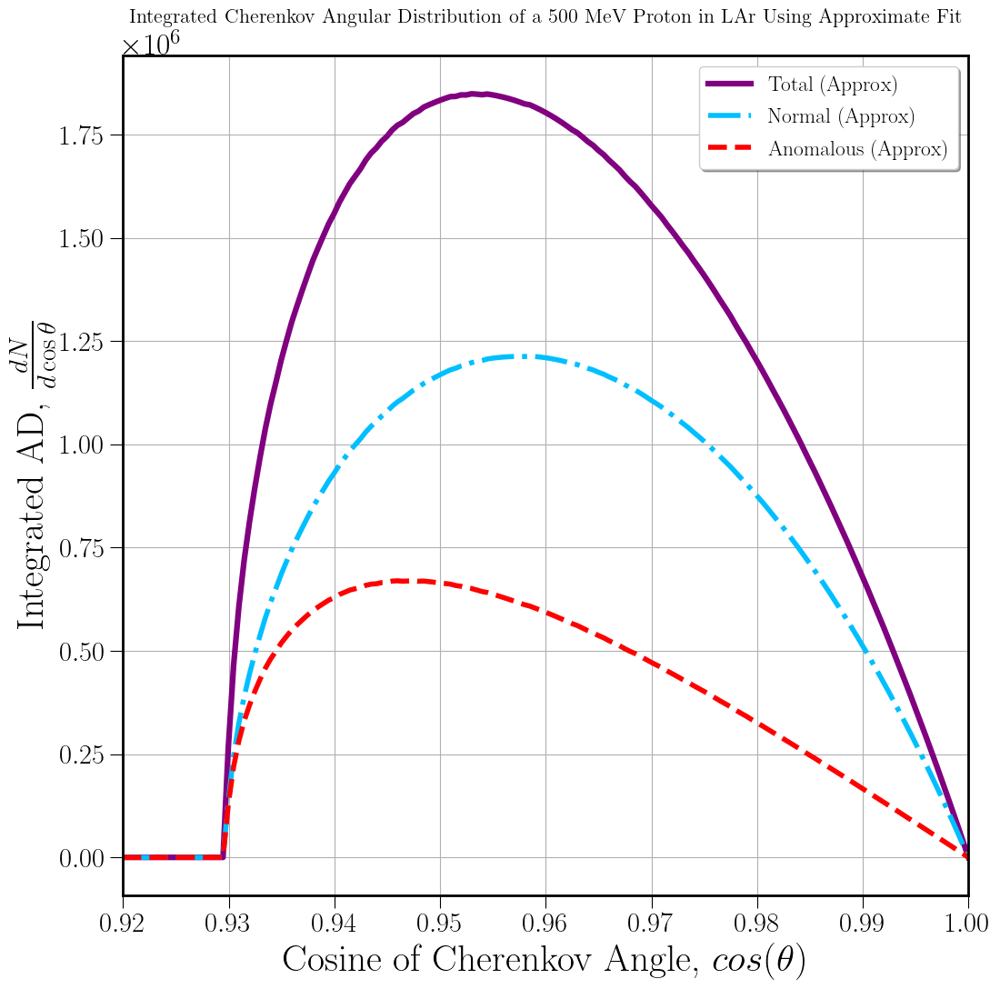

In [119]:
#Approx Fit

fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Integrated Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using Approximate Fit", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangtsumpvs*(dx/0.1), linewidth= 4.5, c= 'purple', label='Total (Approx)'.format(float(j))) #total PVS
ax.plot(x_all, cerenkovangpsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4, c= 'deepskyblue', label='Normal (Approx)'.format(float(j))) #normal PVS
ax.plot(x_all, cerenkovangnsumpvs*(dx/0.1), ls= 'dashed', linewidth= 4, c= 'r', label='Anomalous (Approx)'.format(float(j))) #anomalous PVS
plt.xlim(0.92,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=17,framealpha=None,shadow=True) #loc='best'
plt.savefig("AD_comps_Cherenkov_PVS_500MeV_dxp001dth2000.jpg", bbox_inches="tight")


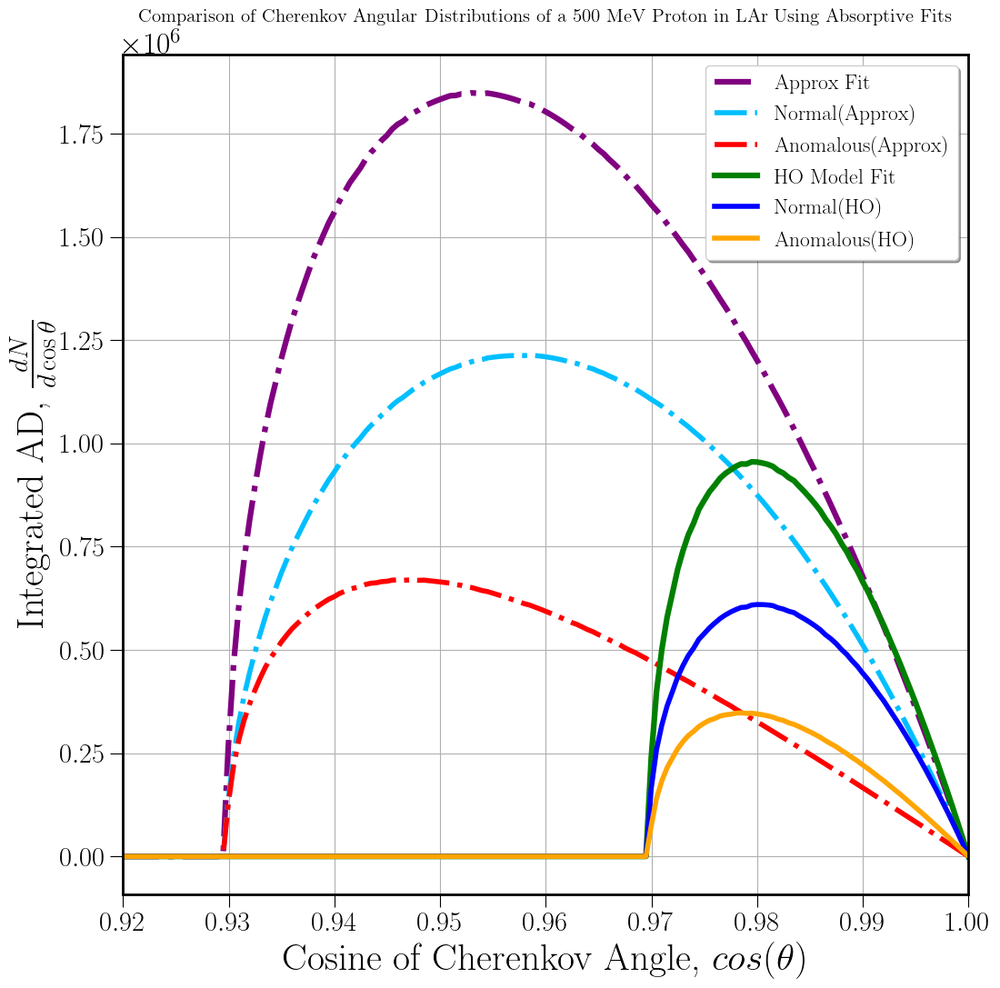

In [117]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Comparison of Cherenkov Angular Distributions of a 500 MeV Proton in LAr Using Absorptive Fits", fontsize= 15) # ($dx=$0.001, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax.set_ylabel(r"Integrated AD, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)

ax.plot(x_all, cerenkovangtsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4.5, c= 'purple', label='Approx Fit'.format(float(j))) #total PVS
ax.plot(x_all, cerenkovangpsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4, c= 'deepskyblue', label='Normal(Approx)'.format(float(j))) #normal PVS
ax.plot(x_all, cerenkovangnsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4, c= 'r', label='Anomalous(Approx)'.format(float(j))) #anomalous PVS

ax.plot(x_all, cerenkovangtsumho*(dx/0.1) , linewidth= 4.5, c= 'g', label='HO Model Fit'.format(float(j))) #totalHO
ax.plot(x_all, cerenkovangnsumho*(dx/0.1), linewidth= 4, c='b', label='Normal(HO)'.format(float(j))) #normal HO ls= 'dashed',
ax.plot(x_all, cerenkovangasumho*(dx/0.1), linewidth= 4, c='orange', label='Anomalous(HO)'.format(float(j))) #anomalous HO ls= 'dashed',

# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.92,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=17,framealpha=None,shadow=True) #loc='best'
# plt.savefig('AD_comps_comparison_Cherenkov_HOvsPVS_500MeV_dxp001dth2k.jpg', bbox_inches= "tight") 
    

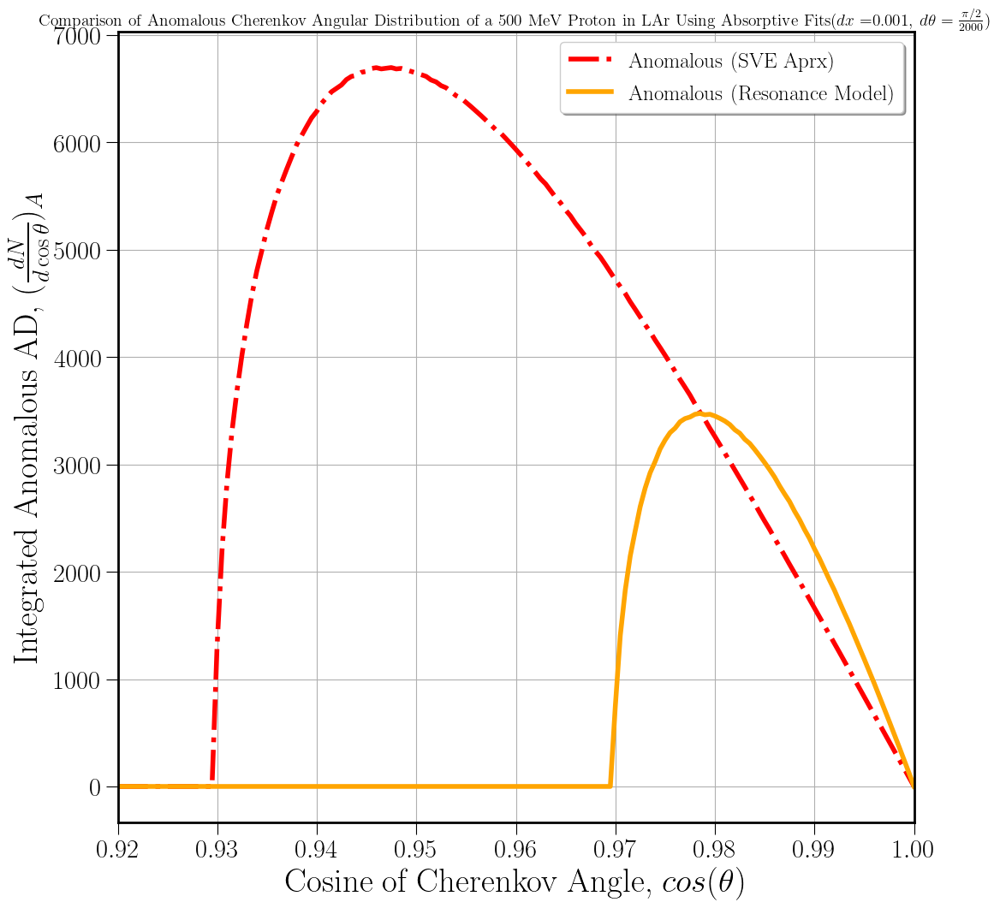

In [203]:
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)

#TeX up labels and text:

plt.rc("text", usetex=True)
plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
plt.rc('font', size=24) 
plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
plt.rc('axes', linewidth=2)


ax.set_title(r"Comparison of Anomalous Cherenkov Angular Distribution of a 500 MeV Proton in LAr Using Absorptive Fits", fontsize= 16) # ($dx=$0.1, $d\theta=\frac{\pi/2}{2000}$)
ax.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=28)
ax.set_ylabel(r"Integrated Anomalous AD, $(\frac{dN}{d\cos\theta})_{A}$",fontsize=28)
ax.tick_params(axis='both',which='major',labelsize=22,length=10)


# ax.plot(x_all, cerenkovangpsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4, c= 'deepskyblue', label='Normal (SVE Aprx)'.format(float(j))) #normal PVS
ax.plot(x_all, cerenkovangnsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4, c= 'r', label='Anomalous (Approx)'.format(float(j))) #anomalous PVS

# ax.plot(x_all, cerenkovangtsumpvs*(dx/0.1), ls= 'dashdot', linewidth= 4.5, c= 'purple', label='Total (SVE Aprx)'.format(float(j))) #total PVS
# ax.plot(x_all, cerenkovangtsumho*(dx/0.1) , linewidth= 4.5, c= 'g', label='Total (Resonance Model)'.format(float(j))) #totalHO

# ax.plot(x_all, cerenkovangnsumho*(dx/0.1), linewidth= 4, c='b', label='Normal (Resonance Model)'.format(float(j))) #normal HO
ax.plot(x_all, cerenkovangasumho*(dx/0.1), linewidth= 4, c='orange', label='Anomalous (HO Model)'.format(float(j))) #anomalous HO



# plt.xlim([0.99/(n_max*filtered_betalist[0]), 1])
# plt.ylim(0,0.2e7)
plt.xlim(0.92,1)

ax.grid()

# #     ax.text(0.94,1e2,r'dx={} cm'.format(dx),fontsize=16)
ax.legend(loc='best',fontsize=18,framealpha=None,shadow=True) #loc='best'
plt.savefig('AD_comparison_anom_Cherenkov_HOvsPVS_500MeV_dxp001dth2k.jpg', bbox_inches= "tight") 
    

# Sigma Plots (All Fits) : Early Version 

In [401]:
# Angular Distribution of Cerenkov Radiation: Absorptive Fits (only) + Scintillation (500 MeV)
#Abs Fits only for different T 
alpha = 1/137 #Fine-structure (EM coupling) constant 

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

# #Babics: 
    
# #T = 90 K
# a_0b = 0.334 
# a_uvb = 0.100
# a_irb = 0.008

# #Grace, Nikkel: 
    
# #T = 90 K
# a_0g = 1.26 
# a_uvg = 0.23
# a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# dx = 0.01
# z = np.cos(theta)


n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([1500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000


def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
                    # derivative_norm = nd.Derivative(n2_j, lmax)
                    # print("derivative_norm= {}".format(derivative_norm))
                    # d_norm = np.abs(derivative_norm) #value of normal derivative at a given point , dx=1e-6
                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point , dx=1e-6
                    return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
                    # derivative_anom = nd.Derivative(n2_j, lmin)
                    # print("derivative_anom= {}".format(derivative_anom))
                    # d_anom = np.abs(derivative_anom) #value of anomalous derivative at a given point , (n2_j, lmin, dx=1e-6)
                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point , dx=1e-6

                    return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
# Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 
            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (dx/0.1) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump)/2000)))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
#         #GRACE AD: 
#         for b in mybetalist: 

#             cos_ang_ming = 0
#             cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
# #             print(cos_ang_maxg)

            
#             def func_angtg(x):
#                 if x >= cos_ang_ming and x <= cos_ang_maxg:
#                     return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
#                 else: 
#                     return 0 #To avaid getting negative contribution 

#             func_angtc = [func_angtg(z) for z in x_all]   
# #             print(func_angtc)

#             cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
# #         print(np.shape(cerenkovangsum))
        
#         cerenkov_allg[j].append(cerenkovangsumg)
# #         scint_all[j].append(scint)
        
#         print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
#         #BABICZ AD:        
#         for b in mybetalist: 

#             cos_ang_minb = 0
#             cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

# #             print(cos_ang_maxg)

            
#             def func_angtb(x):
#                 if x >= cos_ang_minb and x <= cos_ang_maxb:
#                     return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
#                 else: 
#                     return 0 #To avaid getting negative contribution 
                
# #             def func_ang_babics(x):
            
# #                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

# #                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

#             func_angtc = [func_angtb(z) for z in x_all]   
# #             print(func_angtc)

#             cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
# #         print(np.shape(cerenkovangsum))
        
#         cerenkov_allb[j].append(cerenkovangsumb)
# #         scint_all[j].append(scint)
        
#         print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 1500 MeV Proton in LAr Using Absorptive Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=32)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=32)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=32, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=32, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
    # ax2.grid()
    
    
    
#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)
#     colors_all =) ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['red','cyan','deeppink','orange','dimgray'] #600 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    # colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
    # colors_all = ['peru','darkturquoise','darkorchid','dodgerblue','dimgrey']  #1200 MeV   
    colors_all = ['aqua','crimson','fuchsia','mediumslateblue','dimgrey']  #1500 MeV   
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        # ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        # ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, cerenkov_allp[k][0]+scint_all[k][0], linewidth= 4.5, label='Approximate', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, cerenkov_allhot[k][0]+scint_all[k][0], linewidth= 4.5, label='HO Model', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.2, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
#     plt.yscale("log")
    # plt.xlim([0.98/(n_peakr*filtered_betalist[0]), 1])

    # ax2.grid()
    # ax1.set_xlim([plotx1,plotx2])
    # ax3.set_xlim(41.409,0) #0.75->1
    # # ax3.set_xlim(36.869,0) #0.8->1
    # # ax3.set_xlim(90,0) #Full theta range
    # ax1.legend(loc='upper left',fontsize=22,framealpha=None,shadow=True) #best

        # ax1.grid()
    ax2.grid()
    ax3.grid()
    ax1.set_xlim([plotx1,plotx2])
    
    # ax1.set_xlim([plotx1,plotx2])
    x = np.linspace(0.75,1,10) #costheta
    theta = np.arccos(x)*(180/np.pi)
    print(x, theta)
    
    def thetaval(x): 
    	return np.arccos(x)*(180./np.pi) 
    
    ax1.callbacks.connect("xlim_changed", thetagrid) 
    # Set up x axis ticks
    # Set lower axis limits and ticks
    # ax1.set_xlim([0.75, 1]) ##check on/off
    
    # Align upper axis limits with lower axis
    ax3.set_xlim(ax1.get_xlim())
    
    # Find the limits in theta of the axes
    lower_ticks = ax1.get_xticks()
    theta_ticks_0 = int(np.arccos(lower_ticks[0]) * (180/np.pi))
    theta_ticks_f = int(np.arccos(lower_ticks[-1]) * (180/np.pi))
    
    # Create a linearly spaced list of ticks in theta space
    theta_ticks = np.append(np.flip(np.arange(theta_ticks_f, theta_ticks_0, 5, dtype=int)), theta_ticks_0)
    
    # Get the actual tick locations in cos(theta) space
    costheta_ticks = np.cos(theta_ticks * (np.pi/180))
    
    # Set the ticks as desired
    ax3.set_xticks(ticks=costheta_ticks, labels=theta_ticks)
    #ax3.set_xlim(theta_ticks_0, theta_ticks_f)
    
    print(np.arccos(0.75)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
    # ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
    # ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!
    
    ax1.legend(loc='best',fontsize=22,framealpha=None,shadow=True)


# The strings 'upper left', 'upper right', 'lower left', 'lower right' place the legend at the corresponding corner of the axes/figure.

# The strings 'upper center', 'lower center', 'center left', 'center right' place the legend at the center of the corresponding edge of the axes/figure.


#     # Plot sigma ticks on the right twin axis
    
    t=1500
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma

    # #1 sigma increment
    # num_ticks = 14 # How many sigmas to plot
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
    
    # num_ticks = 51 # How many sigmas to plot
    # # 5*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 5)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(5, num_ticks-1, 5)]))  # Create matching list of labels from the list of numbers of sigmas

    # num_ticks = 181 # How many sigmas to plot
    # # 10*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 10)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(10, num_ticks-1, 10)]))  # Create matching list of labels from the list of numbers of sigmas

    # num_ticks = 351 # How many sigmas to plot      
    # # 25*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 25)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(25, num_ticks-1, 25)]))  # Create matching list of labels from the list of numbers of sigmas

    num_ticks = 1201 # How many sigmas to plot
    # 100*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 100)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(100, num_ticks-1, 100)]))  # Create matching list of labels from the list of numbers of sigmas
    
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    plt.savefig('signal_over_background_1500MeV_absfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200
    plt.show()
       
# plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uv = 1.10232, n_peak = 1.3605, n_500= 1.2278, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=11, tm_hour=20, tm_min=55, tm_sec=32, tm_wday=0, tm_yday=345, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\184091953.py:163: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point , dx=1e-6
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\184091953.py:203: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point , dx=1e-6


Total Cerenkov photons emitted by a 1500 Mev Proton in LAr from HO Model fit: 216045.326
Total Cerenkov photons emitted by a 1500 Mev Proton in LAr using Apprx (PVS) fit: 268024.808
16500000.000000002 16500000.000000002
[0.75       0.77777778 0.80555556 0.83333333 0.86111111 0.88888889
 0.91666667 0.94444444 0.97222222 1.        ] [41.40962211 38.94244127 36.33605751 33.55730976 30.55843179 27.26604445
 23.55646431 19.18813645 13.53620274  0.        ]
41.40962210927086 0.0


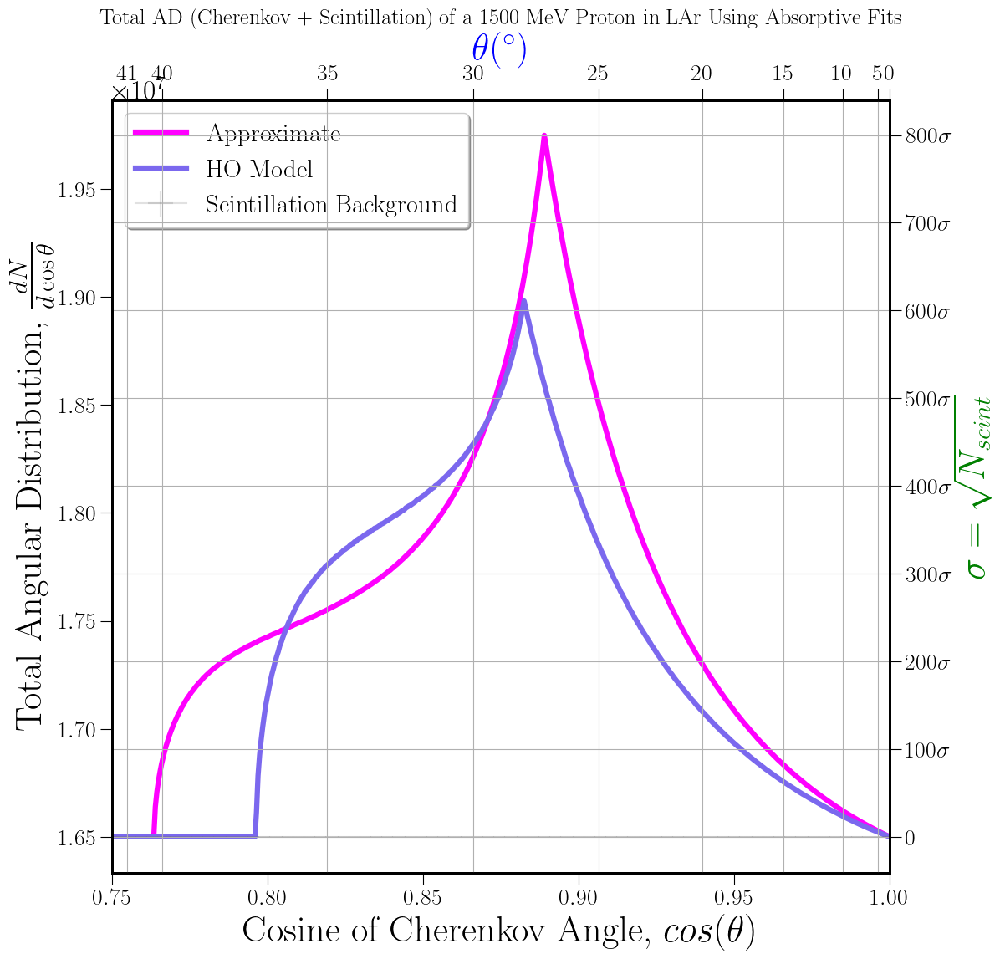

ended:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=12, tm_hour=1, tm_min=8, tm_sec=46, tm_wday=1, tm_yday=346, tm_isdst=0)


In [402]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0.75,plotx2=1) #plotx1= 0.99/(n_peakr*filtered_betalist[0])

print('ended: ', time.gmtime())


In [42]:
# import numpy as np
# import numdifftools as nd
# import matplotlib.pyplot as plt
# x = np.linspace(-2, 2, 100)
# for i in range(10):
#     df = nd.Derivative(np.tanh, n=i)
#     y = df(x)
#     h = plt.plot(x, y/np.abs(y).max())

C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2954023019.py:10: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  df = derivative(np.tanh, x, dx=0.1, n=i, args=(), order=11)


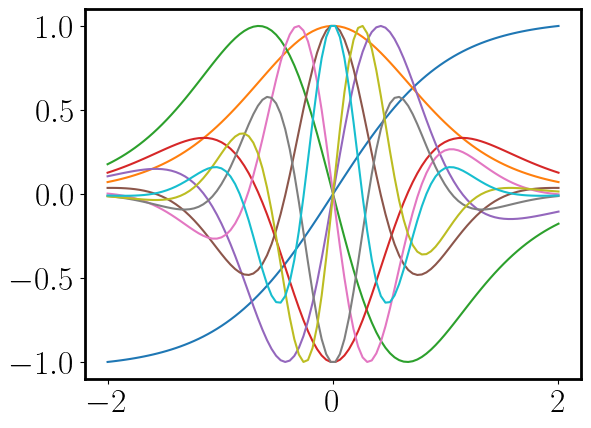

In [23]:
import numpy as np
from scipy.misc import derivative
# import numdifftools as nd
import matplotlib.pyplot as plt

# scipy.misc.derivative(func, x0, dx=1.0, n=1, args=(), order=3)

x = np.linspace(-2, 2, 100)
for i in range(10):
    df = derivative(np.tanh, x, dx=0.1, n=i, args=(), order=11)
    y = df
    h = plt.plot(x, y/np.abs(y).max())

In [332]:
# Angular Distribution of Cerenkov Radiation: Absoptive Fits + Scintillation (T MeV)
#n(dtheta)= 5000

alpha = 1/137 #Fine-structure (EM coupling) constant 
print(np.arccos(0.8))
    
# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

# #Babics: 
    
# #T = 90 K
# a_0b = 0.334 
# a_uvb = 0.100
# a_irb = 0.008

# #Grace, Nikkel: 
    
# #T = 90 K
# a_0g = 1.26 
# a_uvg = 0.23
# a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)
dx = 0.001
# z = np.cos(theta)

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

lamd = np.linspace(90,700,5000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000


def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t] #PVS Approx

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t] #HO 

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 5000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,5000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,5000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
                
 # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
#         #GRACE AD: 
#         for b in mybetalist: 

#             cos_ang_ming = 0
#             cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
# #             print(cos_ang_maxg)

            
#             def func_angtg(x):
#                 if x >= cos_ang_ming and x <= cos_ang_maxg:
#                     return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
#                 else: 
#                     return 0 #To avaid getting negative contribution 

#             func_angtc = [func_angtg(z) for z in x_all]   
# #             print(func_angtc)

#             cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
# #         print(np.shape(cerenkovangsum))
        
#         cerenkov_allg[j].append(cerenkovangsumg)
# #         scint_all[j].append(scint)
        
#         print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
#         #BABICZ AD:        
#         for b in mybetalist: 

#             cos_ang_minb = 0
#             cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

# #             print(cos_ang_maxg)

            
#             def func_angtb(x):
#                 if x >= cos_ang_minb and x <= cos_ang_maxb:
#                     return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
#                 else: 
#                     return 0 #To avaid getting negative contribution 
                
# #             def func_ang_babics(x):
            
# #                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

# #                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

#             func_angtc = [func_angtb(z) for z in x_all]   
# #             print(func_angtc)

#             cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
# #         print(np.shape(cerenkovangsum))
        
#         cerenkov_allb[j].append(cerenkovangsumb)
# #         scint_all[j].append(scint)
        
#         print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    # ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 500 MeV Proton in LAr Using Absorptive Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
    # ax2.grid()
    
    ax3.set_xlim(90,0)

#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)
#     colors_all =) ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    
    colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['red','cyan','deeppink','orange','dimgray'] #600 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    # colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
    # colors_all = ['peru','darkturquoise','darkorchid','dodgerblue','dimgrey']  #1200 MeV   
    # colors_all = ['aqua','crimson','fuchsia','mediumslateblue','dimgrey']  #1500 MeV   
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        # ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        # ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='Approximate', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='HO Model', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
#     plt.yscale("log")

    # ax2.grid()
    # ax1.set_xlim([plotx1,plotx2])
    # # ax3.set_xlim(41.409,0) #0.75->1
    # ax3.set_xlim(36.869,0) #0.8->1
    # # ax3.set_xlim(90,0) #Full theta range
    # ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)

    # ax1.grid()
    ax2.grid()
    ax3.grid()
    ax1.set_xlim([plotx1,plotx2])
    
    # ax1.set_xlim([plotx1,plotx2])
    x = np.linspace(0.8,1,10) #costheta
    theta = np.arccos(x)*(180/np.pi)
    print(x, theta)
    
    def thetaval(x): 
    	return np.arccos(x)*(180./np.pi) 
    
    ax1.callbacks.connect("xlim_changed", thetagrid) 
    # Set up x axis ticks
    # Set lower axis limits and ticks
    ax1.set_xlim([0.8, 1])
    
    # Align upper axis limits with lower axis
    ax3.set_xlim(ax1.get_xlim())
    
    # Find the limits in theta of the axes
    lower_ticks = ax1.get_xticks()
    theta_ticks_0 = int(np.arccos(lower_ticks[0]) * (180/np.pi))
    theta_ticks_f = int(np.arccos(lower_ticks[-1]) * (180/np.pi))
    
    # Create a linearly spaced list of ticks in theta space
    theta_ticks = np.append(np.flip(np.arange(theta_ticks_f, theta_ticks_0, 5, dtype=int)), theta_ticks_0)
    
    # Get the actual tick locations in cos(theta) space
    costheta_ticks = np.cos(theta_ticks * (np.pi/180))
    
    # Set the ticks as desired
    ax3.set_xticks(ticks=costheta_ticks, labels=theta_ticks)
    #ax3.set_xlim(theta_ticks_0, theta_ticks_f)
    
    print(np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
    # ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
    # ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!
    
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)
    
    t=500
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma

    num_ticks = 14  # How many sigmas to plot
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    # plt.savefig('signal_over_background_500MeV_absfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_500MeV_absfitsnew_p01_fulltheta.jpg', bbox_inches="tight") #,dpi=200
    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


0.6435011087932843
n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=5, tm_hour=13, tm_min=49, tm_sec=43, tm_wday=1, tm_yday=339, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1310345637.py:164: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1310345637.py:203: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 500 Mev Proton in LAr from HO Model fit: 193.534
Total Cerenkov photons emitted by a 500 Mev Proton in LAr using Apprx (PVS) fit: 2286.456
5500000.0 5500000.0
[0.8        0.82222222 0.84444444 0.86666667 0.88888889 0.91111111
 0.93333333 0.95555556 0.97777778 1.        ] [36.86989765 34.69213059 32.38753853 29.92643487 27.26604445 24.34064673
 21.03946978 17.14621    12.10149203  0.        ]
36.86989764584401 0.0


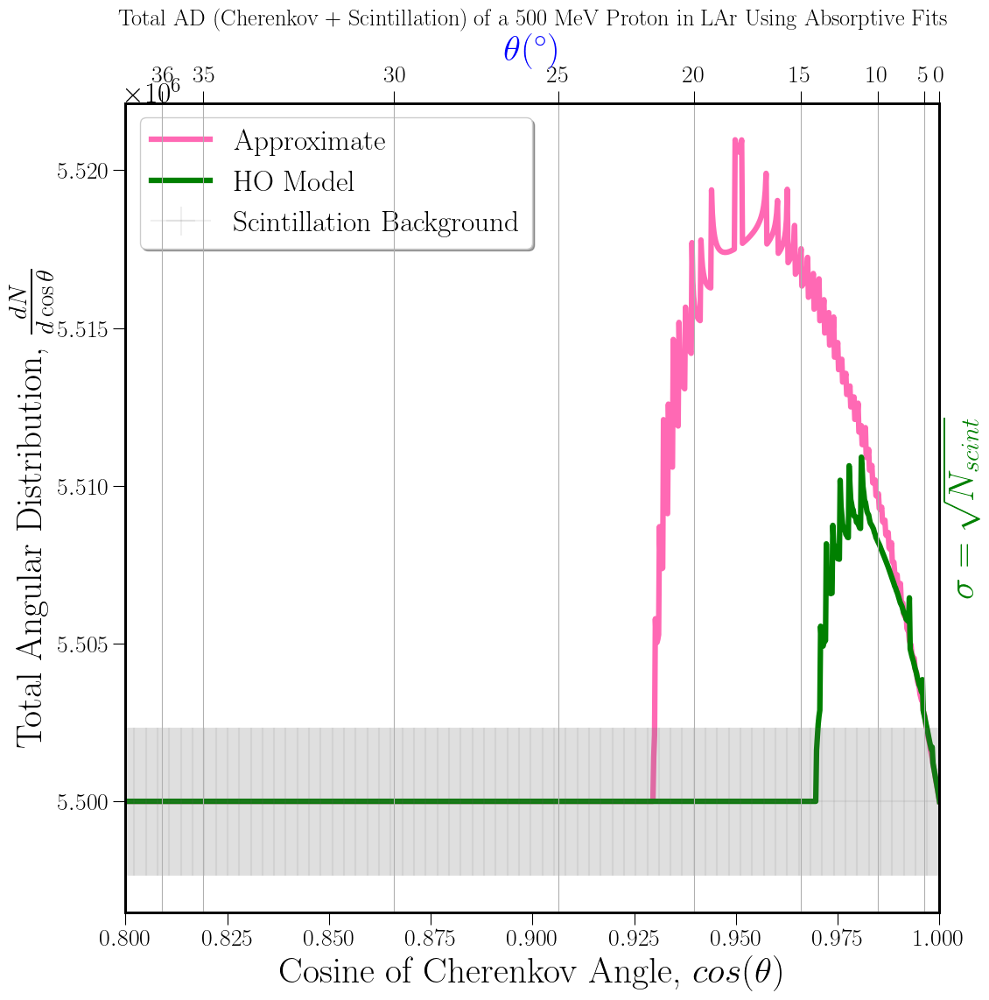

ended:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=5, tm_hour=13, tm_min=51, tm_sec=19, tm_wday=1, tm_yday=339, tm_isdst=0)


In [333]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.1,plotx1=0.8,plotx2=1) #plotx1= 0.99/(n_peakr*filtered_betalist[0])

print('ended: ', time.gmtime())


In [86]:
# import matplotlib.pyplot as plt
# import numpy as np 

# y = np.random.rand(41*8)

# fig,ax = plt.subplots()
# ax.set_xticks(np.arange(0,41*8,5*8))
# xticklabels = [str(x) for x in range(0, 41, 5)]
# ax.set_xticklabels(xticklabels)

# secx = ax.secondary_xaxis('top', functions=(lambda x: x/8, lambda x: x/8))

# ax.plot(y)
# plt.show()

In [372]:
# Angular Distribution of Cerenkov Radiation 

alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([415]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000


def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
    
    cerenkov_all = [[] for j in t]
    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
#     i=0
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for y in x_all]

        mybetalist = make_betalist(t[j],x,dx)
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 5000)

        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)


            def func_angt(x):
                if x >= cos_ang_min:
                    return 2*pi*1e6*(((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angt(y) for y in x_all]       

            cerenkovangsum = np.add(func_angtc, cerenkovangsum) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_all[j].append(cerenkovangsum)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr: {:.3f}" .format(t[j], (sum(cerenkovangsum) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
        
    #TeX up labels and text:

    plt.rc("text", usetex=True)
    plt.rcParams['text.latex.preamble'] = r'\usepackage{graphicx}'
    plt.rc('font', size=24) 
    plt.rc('font', family='serif')

#     matplotlib.rcParams['text.latex.preamble'] = [r'\boldmath']
    plt.rcParams["font.weight"] = "bold"     
#     plt.rcParams["axes.labelweight"] = "bold"
    plt.rc('axes', linewidth=2)

    #Make plot:
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 415 MeV Proton in LAr Using Absorptive Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=32)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=32)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=32, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=32, color='b')
    
#     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
    # colors_all = ['brown','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','purple'] 
           
    colors_all = ['purple', 'red'] #'brown','red','orange', 'green','cyan','royalblue', 'navy','blueviolet',

    cerenkovapprox= np.linspace(0,0,5000)
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_all[k][0])+scint_all[k][0], lw= 4.5, c=colors_all[k], label='Approx Fit') #label='t = {} MeV'.format((t[k]))
        ax1.plot(x_all, cerenkovapprox+scint_all[k][0], lw= 4.5, c=colors_all[k+1], label='HO Model')
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k], alpha=0.2, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k]))
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
    
         # plt.yscale("log")
    
    # ax1.grid()
    ax2.grid()
    ax3.grid()
    ax1.set_xlim([plotx1,plotx2])
    
    # ax1.set_xlim([plotx1,plotx2])
    x = np.linspace(0.9,1,10) #costheta
    theta = np.arccos(x)*(180/np.pi)
    print(x, theta)
   
    def thetaval(x): 
    	return np.arccos(x)*(180./np.pi) 
    
    ax1.callbacks.connect("xlim_changed", thetagrid) 
    # Set up x axis ticks
    # Set lower axis limits and ticks
    ax1.set_xlim([0.9, 1])
    
    # Align upper axis limits with lower axis
    ax3.set_xlim(ax1.get_xlim())
    
    # Find the limits in theta of the axes
    lower_ticks = ax1.get_xticks()
    theta_ticks_0 = int(np.arccos(lower_ticks[0]) * (180/np.pi))
    theta_ticks_f = int(np.arccos(lower_ticks[-1]) * (180/np.pi))
    
    # Create a linearly spaced list of ticks in theta space
    theta_ticks = np.append(np.flip(np.arange(theta_ticks_f, theta_ticks_0, 5, dtype=int)), theta_ticks_0)
    
    # Get the actual tick locations in cos(theta) space
    costheta_ticks = np.cos(theta_ticks * (np.pi/180))
    
    # Set the ticks as desired
    ax3.set_xticks(ticks=costheta_ticks, labels=theta_ticks)
    #ax3.set_xlim(theta_ticks_0, theta_ticks_f)
    
    print(np.arccos(0.9)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
    # ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
    # ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!
    
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)
    
    #Scintillation Background (sigma level)
    t=415 #MeV
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    
    num_ticks = 14 # How many sigmas to plot
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas

    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    

    plt.savefig('signal_over_background_absfits_415MeV_dxp001dth5k.jpg', bbox_inches="tight") #,dpi=200

    plt.show()        


started:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=10, tm_hour=9, tm_min=39, tm_sec=21, tm_wday=6, tm_yday=344, tm_isdst=0)
Total Cerenkov photons emitted by a 415 Mev Proton in LAr: 32.948
4565000.0 4565000.0
[0.9        0.91111111 0.92222222 0.93333333 0.94444444 0.95555556
 0.96666667 0.97777778 0.98888889 1.        ] [25.84193276 24.34064673 22.74685127 21.03946978 19.18813645 17.14621
 14.83511158 12.10149203  8.54907883  0.        ]
25.841932763167126 0.0


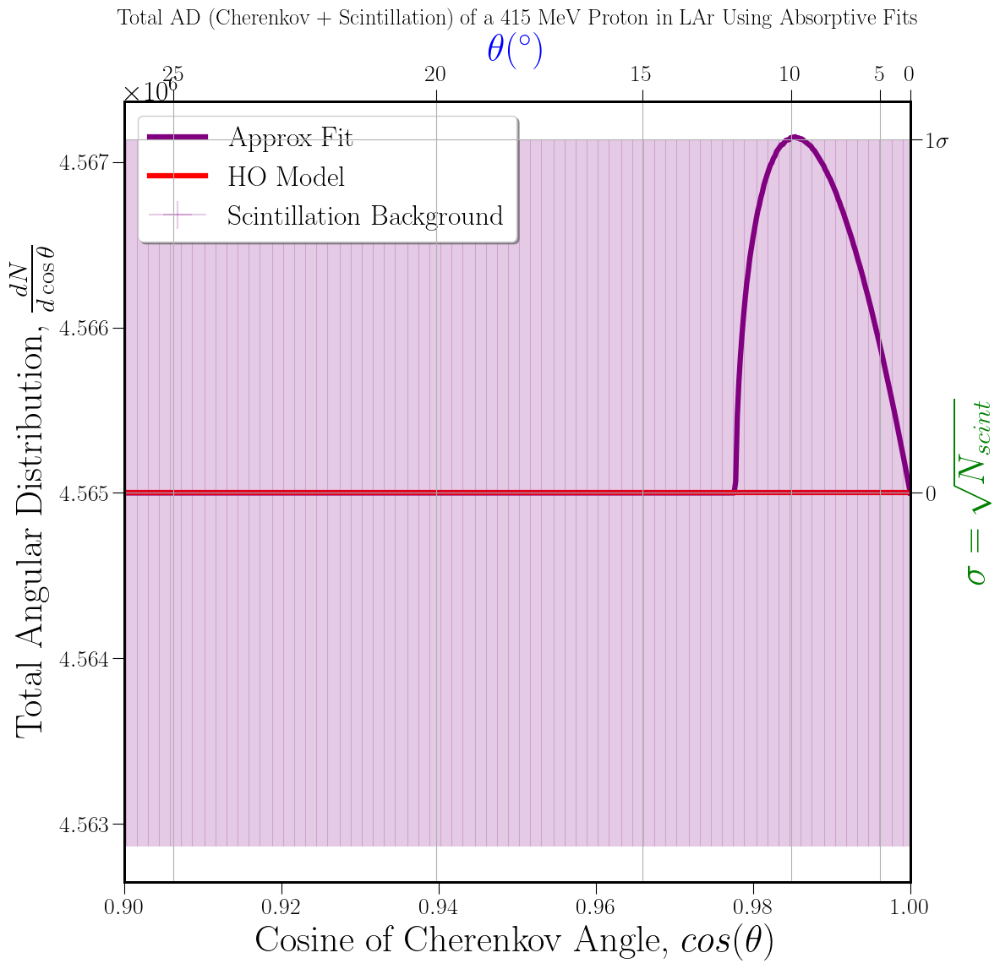

ended:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=10, tm_hour=9, tm_min=43, tm_sec=1, tm_wday=6, tm_yday=344, tm_isdst=0)


In [373]:

################### RUN THE FUNCTION: All Fit (Latest) 415 MeV

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.001,plotx1=0.9,plotx2=1) #plotx1= 0.99/(n_peakr*filtered_betalist[0])

print('ended: ', time.gmtime())


In [368]:
# Angular Distribution of Cerenkov Radiation: Absorptive Fits (only) + Scintillation (411 and 445 MeV)

alpha = 1/137 #Fine-structure (EM coupling) constant 

lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 
lamd = np.linspace(90,700,2000)

# #Babics: 
    
# #T = 90 K
# a_0b = 0.334 
# a_uvb = 0.100
# a_irb = 0.008

# #Grace, Nikkel: 
    
# #T = 90 K
# a_0g = 1.26 
# a_uvg = 0.23
# a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 5000)
x_all = np.linspace(0, 1, 5000)
x = np.cos(theta)
# dx = 0.1
# z = np.cos(theta)


n_uvr = a_0j #when lamd -> lamd_UV
n_500 = 1.2278
n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf


print("n_uv = {}, n_peak = {}, n_500= {}, n_asymtote = {}".format(n_uvr, n_peakr, n_500, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([467]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = 411

def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 5000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
                    # derivative_norm = nd.Derivative(n2_j, lmax)
                    # print("derivative_norm= {}".format(derivative_norm))
                    # d_norm = np.abs(derivative_norm) #value of normal derivative at a given point , dx=1e-6
                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point , dx=1e-6
                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))
                    # derivative_anom = nd.Derivative(n2_j, lmin)
                    # print("derivative_anom= {}".format(derivative_anom))
                    # d_anom = np.abs(derivative_anom) #value of anomalous derivative at a given point , (n2_j, lmin, dx=1e-6)
                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point , dx=1e-6

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Resonance Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/5000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/5000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
#         #GRACE AD: 
#         for b in mybetalist: 

#             cos_ang_ming = 0
#             cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
# #             print(cos_ang_maxg)

            
#             def func_angtg(x):
#                 if x >= cos_ang_ming and x <= cos_ang_maxg:
#                     return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
#                 else: 
#                     return 0 #To avaid getting negative contribution 

#             func_angtc = [func_angtg(z) for z in x_all]   
# #             print(func_angtc)

#             cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
# #         print(np.shape(cerenkovangsum))
        
#         cerenkov_allg[j].append(cerenkovangsumg)
# #         scint_all[j].append(scint)
        
#         print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
#         #BABICZ AD:        
#         for b in mybetalist: 

#             cos_ang_minb = 0
#             cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

# #             print(cos_ang_maxg)

            
#             def func_angtb(x):
#                 if x >= cos_ang_minb and x <= cos_ang_maxb:
#                     return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
#                 else: 
#                     return 0 #To avaid getting negative contribution 
                
# #             def func_ang_babics(x):
            
# #                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

# #                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

#             func_angtc = [func_angtb(z) for z in x_all]   
# #             print(func_angtc)

#             cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
# #         print(np.shape(cerenkovangsum))
        
#         cerenkov_allb[j].append(cerenkovangsumb)
# #         scint_all[j].append(scint)
        
#         print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    # x = np.linspace(0, 1, 2000)
    # ax3 = ax1.secondary_xaxis('top', functions=(lambda x: np.arccos(x)*(180/np.pi), lambda x: np.arccos(x)*(180/np.pi)))
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 467 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=32)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=32)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=32, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=32, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)

#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)
#     colors_all =) ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    colors_all = ['seagreen','darkmagenta','royalblue','crimson','dimgray'] #467 MeV
    # colors_all = ['red','navy','skyblue','salmon','dimgray'] #445 MeV
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['red','cyan','deeppink','orange','dimgray'] #600 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    # colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
    # colors_all = ['peru','darkturquoise','darkorchid','dodgerblue','dimgrey']  #1200 MeV   
    # colors_all = ['aqua','crimson','fuchsia','mediumslateblue','dimgrey']  #1500 MeV   
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        # ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        # ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='Approximate', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='HO Model', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.2, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
#     plt.yscale("log")
    # plt.xlim([0.98/(n_peakr*filtered_betalist[0]), 1])

    # ax1.grid()
    ax2.grid()
    ax3.grid()
    ax1.set_xlim([plotx1,plotx2])
    
    # ax1.set_xlim([plotx1,plotx2])
    x = np.linspace(0.9,1,10) #costheta
    theta = np.arccos(x)*(180/np.pi)
    print(x, theta)
   
    def thetaval(x): 
    	return np.arccos(x)*(180./np.pi) 
    
    ax1.callbacks.connect("xlim_changed", thetagrid) 
    # Set up x axis ticks
    # Set lower axis limits and ticks
    ax1.set_xlim([0.9, 1])
    
    # Align upper axis limits with lower axis
    ax3.set_xlim(ax1.get_xlim())
    
    # Find the limits in theta of the axes
    lower_ticks = ax1.get_xticks()
    theta_ticks_0 = int(np.arccos(lower_ticks[0]) * (180/np.pi))
    theta_ticks_f = int(np.arccos(lower_ticks[-1]) * (180/np.pi))
    
    # Create a linearly spaced list of ticks in theta space
    theta_ticks = np.append(np.flip(np.arange(theta_ticks_f, theta_ticks_0, 5, dtype=int)), theta_ticks_0)
    
    # Get the actual tick locations in cos(theta) space
    costheta_ticks = np.cos(theta_ticks * (np.pi/180))
    
    # Set the ticks as desired
    ax3.set_xticks(ticks=costheta_ticks, labels=theta_ticks)
    #ax3.set_xlim(theta_ticks_0, theta_ticks_f)
    
    print(np.arccos(0.9)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
    # ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
    # ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!

   
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)
       
#     # Plot sigma ticks on the right twin axis
#     scint_value = 40000*600*0.275
#     sigma = np.sqrt(scint_value)  # Value of sigma
#     num_ticks = 14  # How many sigmas to plot
#     sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
#     sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
#     ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
#     ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
#     plt.savefig('signal_over_background_500MeV_absfitsnew_p1.jpg', bbox_inches="tight") #,dpi=200
#     plt.show()
    
    t=467
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    
    num_ticks = 14 # How many sigmas to plot
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
    
    # num_ticks = 51 # How many sigmas to plot

    # # 5*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 5)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(5, num_ticks-1, 5)]))  # Create matching list of labels from the list of numbers of sigmas

#     num_ticks = 181 # How many sigmas to plot

#     # 10*\sigma increment
#     sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 10)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
#     sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(10, num_ticks-1, 10)]))  # Create matching list of labels from the list of numbers of sigmas

#     num_ticks = 351 # How many sigmas to plot
       
#     # 25*\sigma increment
#     sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 25)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
#     sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(25, num_ticks-1, 25)]))  # Create matching list of labels from the list of numbers of sigmas

    # num_ticks = 1201 # How many sigmas to plot
    
    # # 100*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 100)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(100, num_ticks-1, 100)]))  # Create matching list of labels from the list of numbers of sigmas
    
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    plt.savefig('signal_over_background_467MeV_absfitsnew_dxp001dth5k.jpg', bbox_inches="tight") #,dpi=200
    plt.show()
    


n_uv = 1.10232, n_peak = 1.3605, n_500= 1.2278, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=10, tm_hour=8, tm_min=59, tm_sec=29, tm_wday=6, tm_yday=344, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1540242740.py:163: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point , dx=1e-6
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\1540242740.py:203: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point , dx=1e-6


Total Cerenkov photons emitted by a 467 Mev Proton in LAr from Resonance Model fit: 19.999
Total Cerenkov photons emitted by a 467 Mev Proton in LAr using Apprx (PVS) fit: 391.962
5137000.0 5137000.0
[0.9        0.91111111 0.92222222 0.93333333 0.94444444 0.95555556
 0.96666667 0.97777778 0.98888889 1.        ] [25.84193276 24.34064673 22.74685127 21.03946978 19.18813645 17.14621
 14.83511158 12.10149203  8.54907883  0.        ]
25.841932763167126 0.0


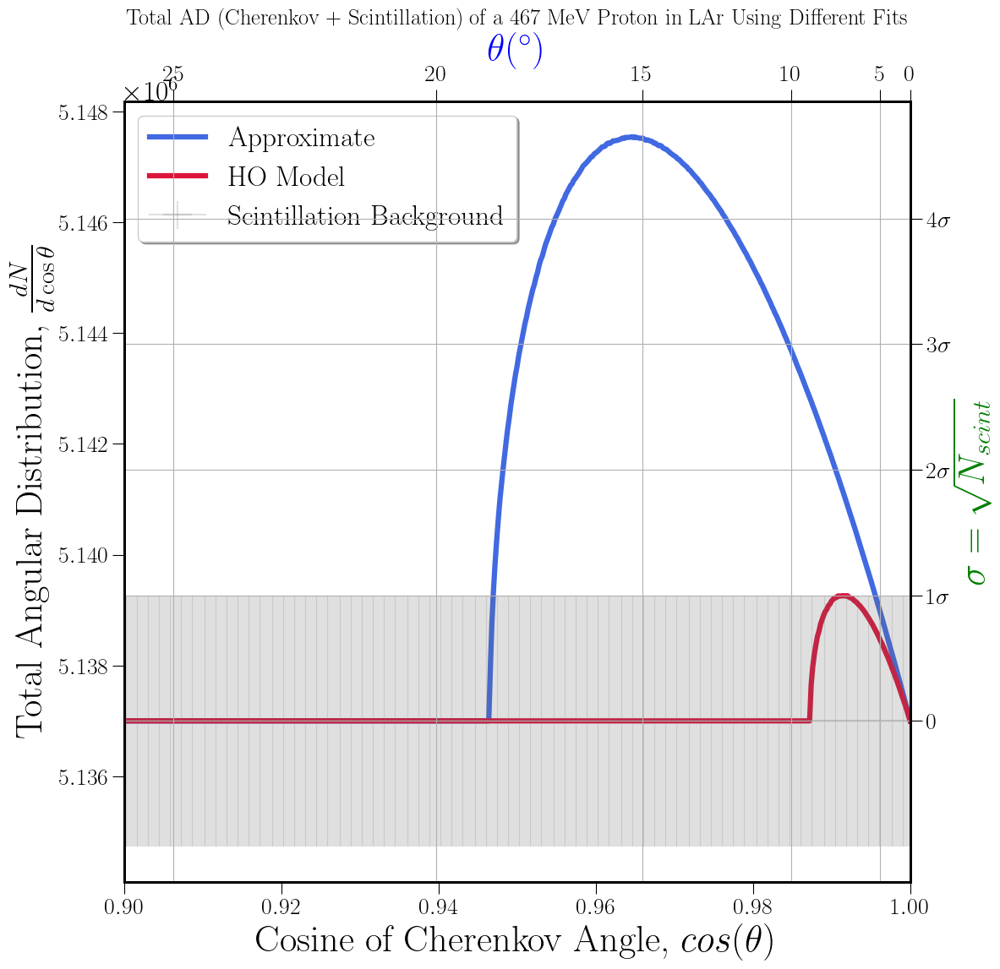

ended:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=10, tm_hour=9, tm_min=27, tm_sec=6, tm_wday=6, tm_yday=344, tm_isdst=0)


In [369]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.001,plotx1=0.9,plotx2=1) #plotx1= 0.99/(n_peakr*filtered_betalist[0])

print('ended: ', time.gmtime())


In [95]:
print(np.array([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)]))
np.linspace(np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi), 9)=

[36.86989765  0.        ]


array([36.86989765, 32.26116044, 27.65242323, 23.04368603, 18.43494882,
       13.82621162,  9.21747441,  4.60873721,  0.        ])

In [420]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation (500 MeV)

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# dx = 0.1
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000


def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * (dx/0.1) * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Resonance MOdel fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot)/2000) )) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (dx/0.1) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump)/2000)))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6 * (dx/0.1) * (alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg)/2000) )) #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (dx/0.1) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb)/2000) ))#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 800 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=32)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=32)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=32, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=32, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)

#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)
#     colors_all =) ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['seagreen','darkmagenta','royalblue','crimson','dimgray'] #467 MeV
    # colors_all = ['red','navy','skyblue','salmon','dimgray'] #445 MeV
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['red','cyan','deeppink','orange','dimgray'] #600 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    # colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
    # colors_all = ['peru','darkturquoise','darkorchid','dodgerblue','dimgrey']  #1200 MeV   
    # colors_all = ['aqua','crimson','fuchsia','mediumslateblue','dimgrey']  #1500 MeV   
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
        
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, cerenkov_allg[k][0]+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, cerenkov_allb[k][0]+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, cerenkov_allp[k][0]+scint_all[k][0], linewidth= 4.5, label='This Work (Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, cerenkov_allhot[k][0]+scint_all[k][0], linewidth= 4.5, label='This Work (HO )', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        

        # ax1.grid()
    ax2.grid()
    ax3.grid()
    ax1.set_xlim([plotx1,plotx2])
    
    # ax1.set_xlim([plotx1,plotx2])
    # x = np.linspace(0.75,1,10) #costheta
    # theta = np.arccos(x)*(180/np.pi)
    # print(x, theta)
    
    def thetaval(x): 
    	return np.arccos(x)*(180./np.pi) 
    
    ax1.callbacks.connect("xlim_changed", thetagrid) 
    # Set up x axis ticks
    # Set lower axis limits and ticks
    # ax1.set_xlim([0, 1]) ##check on/off
    
    # Align upper axis limits with lower axis
    ax3.set_xlim(ax1.get_xlim())
    
    # Find the limits in theta of the axes
    lower_ticks = ax1.get_xticks()
    theta_ticks_0 = int(np.arccos(lower_ticks[0]) * (180/np.pi))
    theta_ticks_f = int(np.arccos(lower_ticks[-1]) * (180/np.pi))
    
    # Create a linearly spaced list of ticks in theta space
    theta_ticks = np.append(np.flip(np.arange(theta_ticks_f, theta_ticks_0, 10, dtype=int)), theta_ticks_0)
    
    # Get the actual tick locations in cos(theta) space
    costheta_ticks = np.cos(theta_ticks * (np.pi/180))
    
    # Set the ticks as desired
    ax3.set_xticks(ticks=costheta_ticks, labels=theta_ticks)
    #ax3.set_xlim(theta_ticks_0, theta_ticks_f)
    
    # print(np.arccos(0.75)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
    # ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
    # ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!
    
    ax1.legend(loc='best',fontsize=22,framealpha=None,shadow=True)


# The strings 'upper left', 'upper right', 'lower left', 'lower right' place the legend at the corresponding corner of the axes/figure.

# The strings 'upper center', 'lower center', 'center left', 'center right' place the legend at the center of the corresponding edge of the axes/figure.


#     # Plot sigma ticks on the right twin axis
    
    t=800
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma

    # #1 sigma increment
    # num_ticks = 14 # How many sigmas to plot
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
    
    # num_ticks = 51 # How many sigmas to plot
    # # 5*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 5)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(5, num_ticks-1, 5)]))  # Create matching list of labels from the list of numbers of sigmas

    num_ticks = 181 # How many sigmas to plot
    # 10*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 10)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(10, num_ticks-1, 10)]))  # Create matching list of labels from the list of numbers of sigmas

    # num_ticks = 351 # How many sigmas to plot      
    # # 25*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 25)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(25, num_ticks-1, 25)]))  # Create matching list of labels from the list of numbers of sigmas

    # num_ticks = 1201 # How many sigmas to plot
    # # 100*\sigma increment
    # sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 100)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    # sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(100, num_ticks-1, 100)]))  # Create matching list of labels from the list of numbers of sigmas
    
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    plt.savefig('signal_over_background_800MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200
    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


In [ ]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())


started:  time.struct_time(tm_year=2023, tm_mon=12, tm_mday=12, tm_hour=11, tm_min=35, tm_sec=16, tm_wday=1, tm_yday=346, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\475677384.py:162: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\475677384.py:201: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


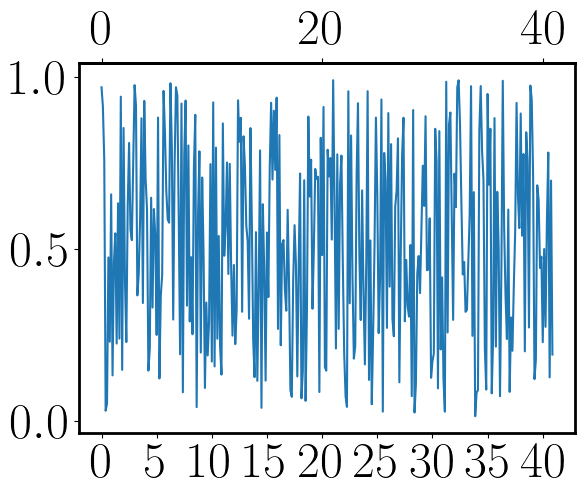

In [421]:
# Adding a x-axis label to secondary x-axis in matplotlib
import matplotlib.pyplot as plt
import numpy as np 

y = np.random.rand(41*8)

fig,ax = plt.subplots()
ax.set_xticks(np.arange(0,41*8,5*8))
xticklabels = [str(x) for x in range(0, 41, 5)]
ax.set_xticklabels(xticklabels)
secx = ax.secondary_xaxis('top', functions=(lambda x: x/8, lambda x: x/8))

ax.plot(y)
plt.show()

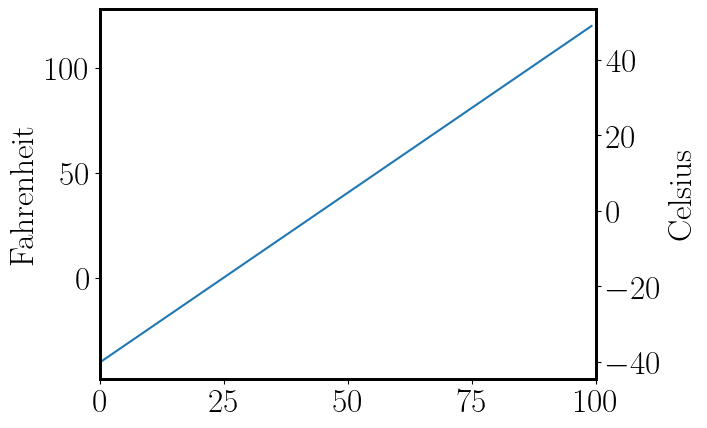

In [139]:
# Implementation of matplotlib function 
import matplotlib.pyplot as plt 
import numpy as np 


def GFG1(temp): 
	return (5. / 9.) * (temp - 32) 

def GFG2(ax1): 
	y1, y2 = ax1.get_ylim() 
	ax_twin .set_ylim(GFG1(y1), GFG1(y2)) 
	ax_twin .figure.canvas.draw() 

fig, ax1 = plt.subplots() 
ax_twin = ax1.twinx() 

ax1.callbacks.connect("ylim_changed", GFG2) 
ax1.plot(np.linspace(-40, 120, 100)) 
ax1.set_xlim(0, 100) 

ax1.set_ylabel('Fahrenheit') 
ax_twin .set_ylabel('Celsius') 

# fig.subtitle('matplotlib.axes.Axes.twinx()\function Example\n\n', fontweight ="bold") 

plt.show() 


[0.8        0.82222222 0.84444444 0.86666667 0.88888889 0.91111111
 0.93333333 0.95555556 0.97777778 1.        ] [36.86989765 34.69213059 32.38753853 29.92643487 27.26604445 24.34064673
 21.03946978 17.14621    12.10149203  0.        ]
25.841932763167126 0.0


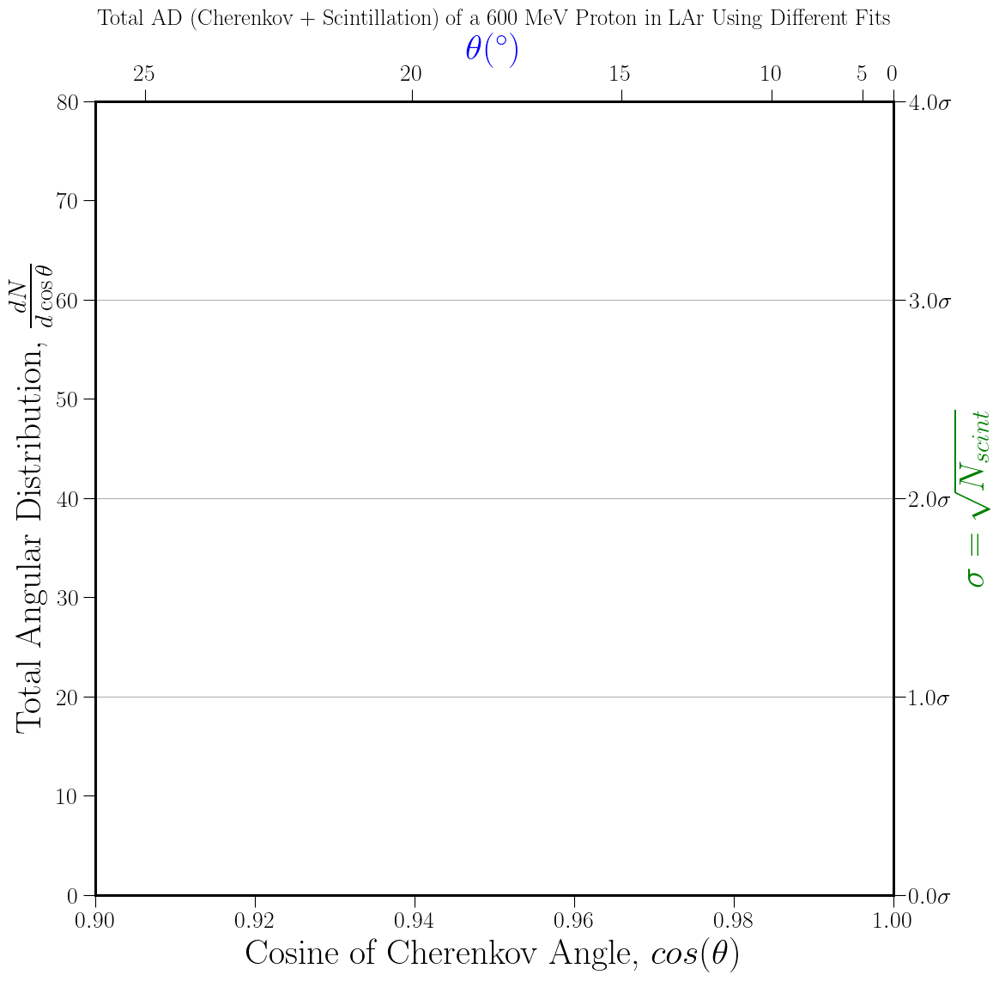

In [250]:
#DEFAULT Axes
fig = plt.figure(figsize=(12,12))
ax1 = fig.add_subplot(111)
#     ax2 = fig.add_subplot(111)
ax2 = ax1.twinx()
ax3 = ax1.twiny()

# x = np.linspace(0, 1, 2000)
# ax3 = ax1.secondary_xaxis('top', functions=(lambda x: np.arccos(x)*(180/np.pi), lambda x: np.arccos(x)*(180/np.pi)))

ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 600 MeV Proton in LAr Using Different Fits", fontsize= 19)
ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')

#     ax2.grid()
ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
ax3.tick_params(axis='both',which='major',labelsize=20,length=10)

x = np.linspace(0.8,1,10) #costheta
theta = np.arccos(x)*(180/np.pi)
print(x, theta)

def thetaval(x): 
	return np.arccos(x)*(180./np.pi) 

ax1.callbacks.connect("xlim_changed", thetagrid) 
# Set up x axis ticks
# Set lower axis limits and ticks
ax1.set_xlim([0.9, 1])

# Align upper axis limits with lower axis
ax3.set_xlim(ax1.get_xlim())

# Find the limits in theta of the axes
lower_ticks = ax1.get_xticks()
theta_ticks_0 = int(np.arccos(lower_ticks[0]) * (180/np.pi))
theta_ticks_f = int(np.arccos(lower_ticks[-1]) * (180/np.pi))

# Create a linearly spaced list of ticks in theta space
theta_ticks = np.append(np.flip(np.arange(theta_ticks_f, theta_ticks_0, 5, dtype=int)), theta_ticks_0)

# Get the actual tick locations in cos(theta) space
costheta_ticks = np.cos(theta_ticks * (np.pi/180))

# Set the ticks as desired
ax3.set_xticks(ticks=costheta_ticks, labels=theta_ticks)
#ax3.set_xlim(theta_ticks_0, theta_ticks_f)
ax2.grid()

print(np.arccos(0.9)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
# ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
# ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!

#sigma labelling
sigma = 4
num_ticks = 21
ax1.set_ylim(0,(num_ticks-1)*sigma)
sigma_tick_locations = np.arange(0, num_ticks*sigma, 5*sigma) # Create a list of the tick positions
sigma_tick_number = np.arange(0, (num_ticks-1)/4)
sigma_tick_labels = np.array([r'${}\sigma$'.format(num) for num in sigma_tick_number])  #Create matching list of labels from the list of numbers of sigmas
ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

plt.show()

In [237]:
np.flip(np.arange(theta_ticks_f, theta_ticks_0, 5))

array([25., 20., 15., 10.,  5.,  0.])

In [222]:
ax1.get_xticks()

array([0.9 , 0.92, 0.94, 0.96, 0.98, 1.  ])

In [231]:
(np.arccos(lower_ticks[0]) * (180/np.pi))

25.841932763167126

In [232]:
print(lower_ticks[0])
print(theta_ticks)
print(costheta_ticks)

0.9
[0.]
[1.]


In [225]:
np.cos(theta_ticks * (np.pi/180))

array([1.])

In [234]:
theta_ticks_0#theta_ticks_f

25.841932763167126

In [218]:
np.arange(theta_ticks_0, theta_ticks_f, 5)#, theta_ticks_f)

array([], dtype=int32)

[0.8        0.82222222 0.84444444 0.86666667 0.88888889 0.91111111
 0.93333333 0.95555556 0.97777778 1.        ] [36.86989765 34.69213059 32.38753853 29.92643487 27.26604445 24.34064673
 21.03946978 17.14621    12.10149203  0.        ]
25.841932763167126 0.0


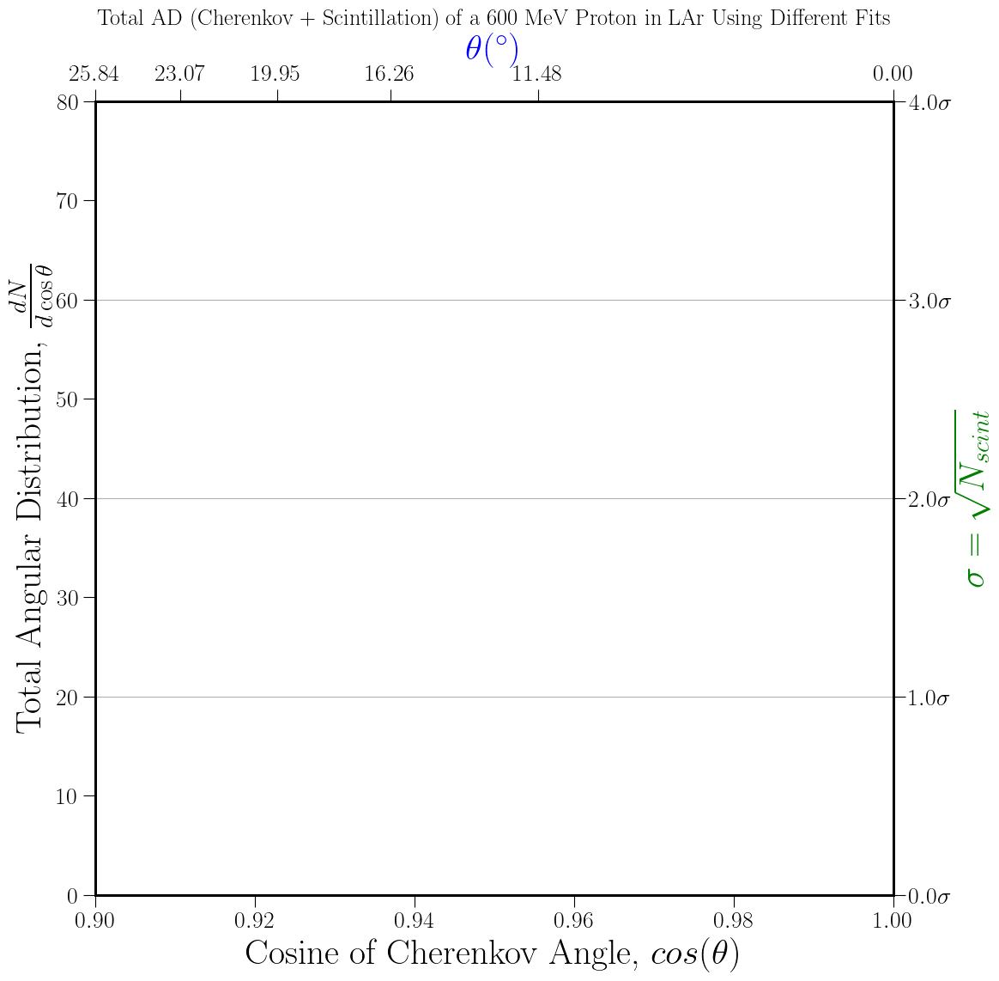

In [201]:
fig = plt.figure(figsize=(12,12))
ax1 = fig.add_subplot(111)
#     ax2 = fig.add_subplot(111)
ax2 = ax1.twinx()
ax3 = ax1.twiny()

# x = np.linspace(0, 1, 2000)
# ax3 = ax1.secondary_xaxis('top', functions=(lambda x: np.arccos(x)*(180/np.pi), lambda x: np.arccos(x)*(180/np.pi)))

ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 600 MeV Proton in LAr Using Different Fits", fontsize= 19)
ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')

#     ax2.grid()
ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
ax3.tick_params(axis='both',which='major',labelsize=20,length=10)

x = np.linspace(0.8,1,10) #costheta
theta = np.arccos(x)*(180/np.pi)
print(x, theta)

def thetaval(x): 
	return np.arccos(x)*(180./np.pi) 

# def thetagrid(ax1): 
# 	x1, x2 = ax1.get_xlim() 
# 	ax3.set_xlim([thetaval(x1), thetaval(x2)]) 
#     # ax3.figure.canvas.draw()

# print(0.9, thetaval(0.9 ), 1, thetaval(1))
	
# fig, ax3 = plt.subplots() 
# ax3_twin = ax1.twiny() 



ax1.callbacks.connect("xlim_changed", thetagrid) 
ax1.set_xlim([0.9, 1])
costheta_ticks = ax1.get_xticks()
theta_ticks = np.arccos(costheta_ticks) * (180/np.pi)
ax3.set_xticks(theta_ticks)
#ax3.set_xlim(theta_ticks[0], theta_ticks[-1])

# ax1.plot(np.linspace(-40, 120, 100)) 
# ax1.set_xlim(0, 100) 
ax2.grid()

print(np.arccos(0.9)*(180/np.pi), np.arccos(1)*(180/np.pi)) #in degree
# ax3.set_xlim([np.arccos(0.8)*(180/np.pi), np.arccos(1)*(180/np.pi)])
# ax3.set_xlim(ax1.get_xlim())  # Force the top axis ticks to align with the bottom axis -- IMPORTANT!!!

#sigma labelling
sigma = 4
num_ticks = 21
ax1.set_ylim(0,(num_ticks-1)*sigma)
sigma_tick_locations = np.arange(0, num_ticks*sigma, 5*sigma) # Create a list of the tick positions
sigma_tick_number = np.arange(0, (num_ticks-1)/4)
sigma_tick_labels = np.array([r'${}\sigma$'.format(num) for num in sigma_tick_number])  #Create matching list of labels from the list of numbers of sigmas
ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

plt.show()

[  0   5  10  15  20  25  30  35  40  45  50  55  60  65  70  75  80  85
  90  95 100]


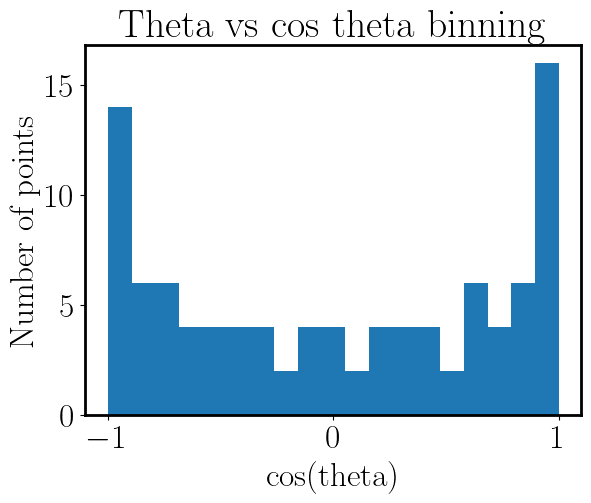

In [126]:
print(np.arange(0, 105, 5))

import numpy as np
import matplotlib.pyplot as plt

# Generate data
theta = np.linspace(0, 2*np.pi, 100)
cos_theta = np.cos(theta)

# Create bins
bins = np.linspace(-1, 1, 20)

# Plot the data
plt.hist(cos_theta, bins=bins)
plt.xlabel('cos(theta)')
plt.ylabel('Number of points')
plt.title('Theta vs cos theta binning')
plt.show()

In [134]:
print(np.linspace(100, 0, 21))
print(np.arange(0, 105, 5))

# import numpy as np
# import matplotlib.pyplot as plt

# # Generate data
# cos_theta = np.linspace(0, 1, 100)
# theta = np.arccos(theta)*(180/np.pi)

# # Create bins
# bins = np.linspace(0, 95, 20)

# # Plot the data
# plt.hist(theta, bins=bins)
# plt.xlabel('theta')
# plt.ylabel('Number of points')
# plt.title('cos theta vs Theta binning')
# plt.show()

[100.  95.  90.  85.  80.  75.  70.  65.  60.  55.  50.  45.  40.  35.
  30.  25.  20.  15.  10.   5.   0.]
[  0   5  10  15  20  25  30  35  40  45  50  55  60  65  70  75  80  85
  90  95 100]


Text(0, 0.5, 'the axis label')

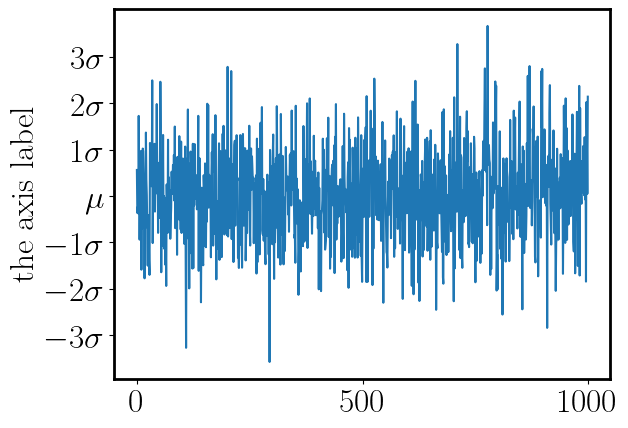

In [474]:
#Example: sigma labelling

import numpy as np
import matplotlib.pyplot as plt

x = np.arange(1000)
y = 42 * np.random.randn(1000)

signal_sigma = y.std()

num_sigma = 3
sigma_values = np.arange(-num_sigma, num_sigma+1)
yticks = signal_sigma * sigma_values
yticklabels = ['$'+str(k)+'\sigma$' if k != 0 else '$\mu$' for k in sigma_values]

plt.figure()
plt.plot(x, y)
plt.yticks(yticks, yticklabels)
plt.ylabel('the axis label')

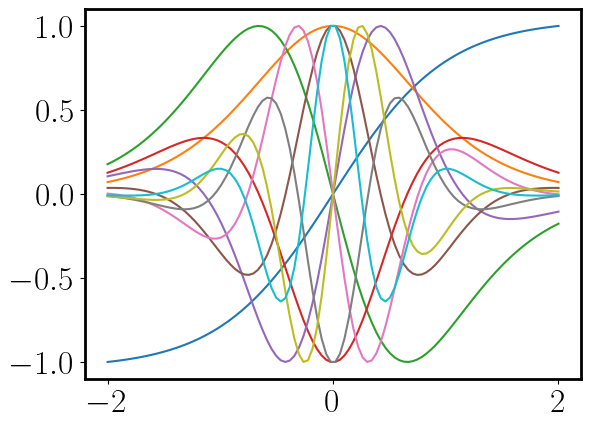

In [19]:
#Differentiation tool
import numpy as np
import numdifftools as nd
import matplotlib.pyplot as plt
x = np.linspace(-2, 2, 100)
for i in range(10):
    df = nd.Derivative(np.tanh, n=i)
    y = df(x)
    h = plt.plot(x, y/np.abs(y).max())

In [29]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation 600 MeV

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# dx = 0.1
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


# n_asymtoter = a_0j + a_j * lamd_uv**2
n_500 = 1.2278
n_uvr = 1.102
print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


n_asymtoter = a_0j + a_j * lamd_uv**2
print("n_asymtote = {}".format(n_asymtoter))

cos_ang_min = 1/(beta * n_peakr)
print("cos_ang_min= {}".format(cos_ang_min))


# n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
# n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([600]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000


def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 600 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
    # ax2.grid()
    
        
#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)
    # colors_all =) ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] 
    colors_all = ['red','cyan','deeppink','orange','dimgray'] 
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(HO)', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
        
    ax2.grid()
#     plt.yscale("log")
    ax1.set_xlim([plotx1,plotx2])
    ax3.set_xlim(90,0)
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)
#     plt.savefig('Angular_dist_protons.png',dpi=200)
#     plt.ylim(4e6,6e6)
#     plt.ylim(5.4e6,5.6e6)
    
    t=600
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    num_ticks = 26 # How many sigmas to plot
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    # plt.savefig('signal_over_background_600MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200
    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))
   

n_uvr = 1.102, n_500 = 1.2278
n_asymtote = 1.222558964716
cos_ang_min= 1.0430994931255892
n_uv = 1.102, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=27, tm_hour=21, tm_min=48, tm_sec=46, tm_wday=0, tm_yday=331, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\4214902541.py:183: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\4214902541.py:222: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 600 Mev Proton in LAr from HO Model fit: 2669.057
Total Cerenkov photons emitted by a 600 Mev Proton in LAr using Apprx (PVS) fit: 4455.703


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\4214902541.py:286: RuntimeWarning: divide by zero encountered in scalar divide
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\4214902541.py:286: RuntimeWarning: invalid value encountered in scalar multiply
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * la

Total Cerenkov photons emitted by a 600 Mev Proton in LAr from Grace fit: 28730.074
Total Cerenkov photons emitted by a 600 Mev Proton in LAr using Babicz fit: 17863.250
6600000.000000001 6600000.000000001


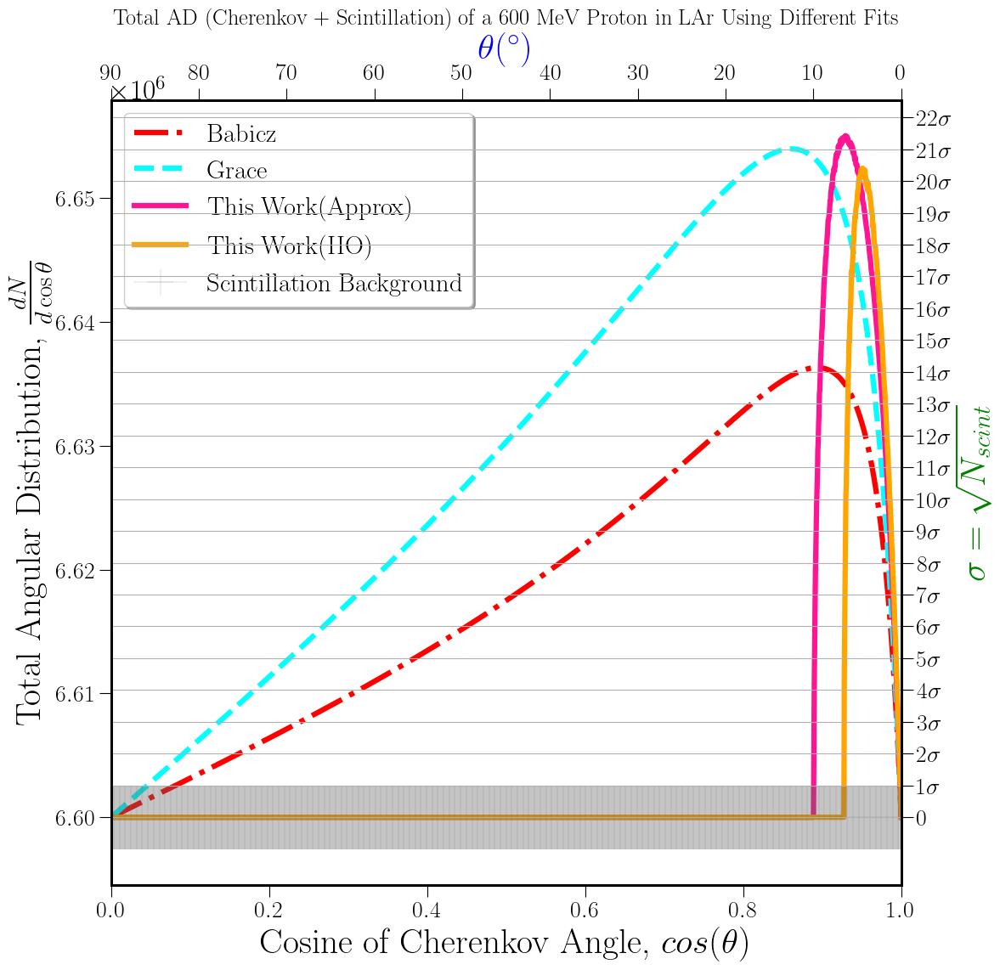

ended:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=27, tm_hour=22, tm_min=48, tm_sec=49, tm_wday=0, tm_yday=331, tm_isdst=0)


In [30]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())


In [31]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation 700 MeV

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# dx = 0.1
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


# n_asymtoter = a_0j + a_j * lamd_uv**2
n_500 = 1.2278
n_uvr = 1.102
print("n_uvr = {}, n_500 = {}".format(n_uvr, n_500))


n_asymtoter = a_0j + a_j * lamd_uv**2
print("n_asymtote = {}".format(n_asymtoter))

cos_ang_min = 1/(beta * n_peakr)
print("cos_ang_min= {}".format(cos_ang_min))

# n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
# n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
t_arr = np.array([700])
# t_arr = np.array([800])

def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Resonance MOdel fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


        
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        # scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 700 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
#     colors_all = ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
       
    
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(HO)', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
        
    ax2.grid()
#     plt.yscale("log")
    ax1.set_xlim([plotx1,plotx2])
    ax3.set_xlim(90,0) #full theta range
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)

#     plt.savefig('Angular_dist_protons.png',dpi=200)
#     plt.ylim(4e6,6e6)
#     plt.ylim(5.4e6,5.6e6)

    # sigma = 4
    # num_ticks = 21
    # ax1.set_ylim(0,(num_ticks-1)*sigma)
    # sigma_tick_locations = np.arange(0, num_ticks*sigma, 5*sigma) # Create a list of the tick positions
    # sigma_tick_number = np.arange(0, (num_ticks-1)/4)
    # sigma_tick_labels = np.array([r'${}\sigma$'.format(num) for num in sigma_tick_number])  #Create matching list of labels from the list of numbers of sigmas
    # ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    # ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

    t=700 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    
#     #1 \sigma increment
#     sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
#     sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
#     ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
#     ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    
    num_ticks = 51 # How many sigmas to plot

    # 5*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 5)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(5, num_ticks-1, 5)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    
    plt.savefig('signal_over_background_700MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_800MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200

    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uvr = 1.102, n_500 = 1.2278
n_asymtote = 1.222558964716
cos_ang_min= 1.0430994931255892
n_uv = 1.102, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=27, tm_hour=22, tm_min=48, tm_sec=49, tm_wday=0, tm_yday=331, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\521366872.py:183: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\521366872.py:222: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 700 Mev Proton in LAr from Resonance MOdel fit: 9526.764
Total Cerenkov photons emitted by a 700 Mev Proton in LAr using Apprx (PVS) fit: 12399.387


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\521366872.py:287: RuntimeWarning: divide by zero encountered in scalar divide
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\521366872.py:287: RuntimeWarning: invalid value encountered in scalar multiply
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd

Total Cerenkov photons emitted by a 700 Mev Proton in LAr from Grace fit: 44575.405
Total Cerenkov photons emitted by a 700 Mev Proton in LAr using Babicz fit: 29163.899
7700000.000000001 7700000.000000001


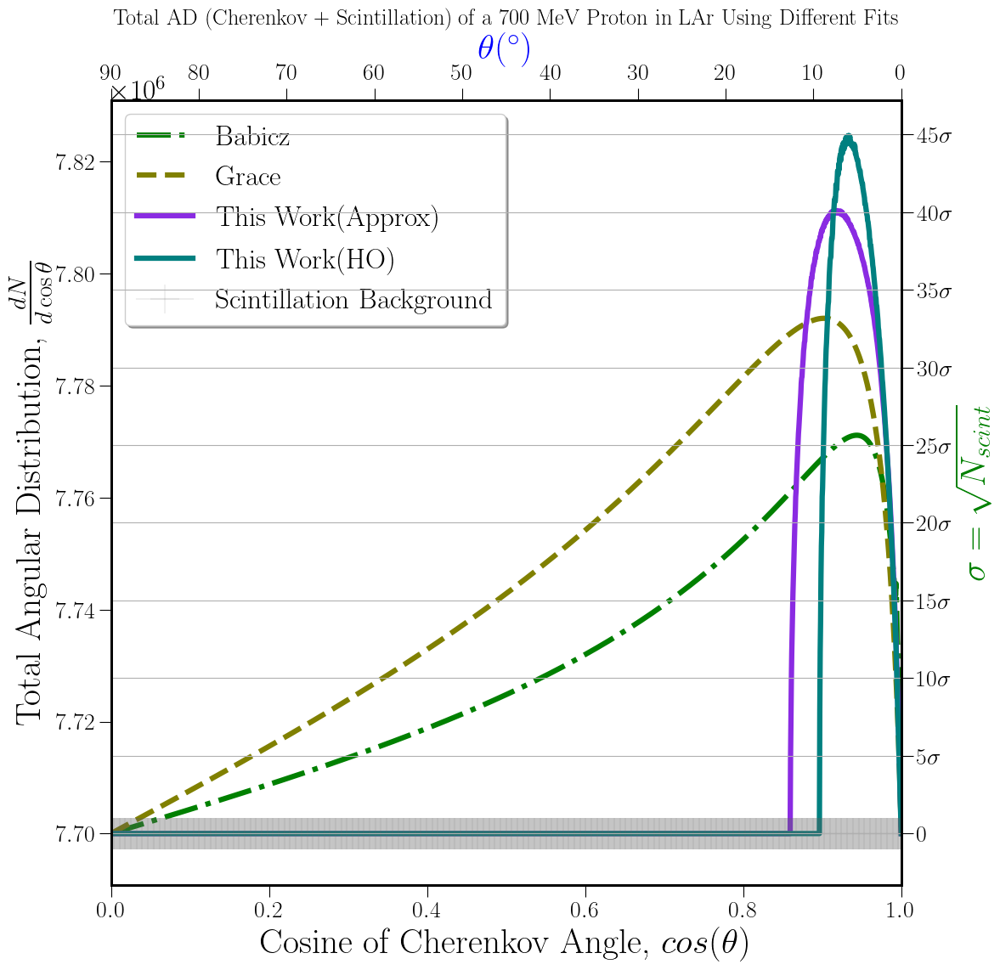

ended:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=0, tm_min=16, tm_sec=4, tm_wday=1, tm_yday=332, tm_isdst=0)


In [32]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())


In [33]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation 800 MeV 

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# dx = 0.1
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([700])
t_arr = np.array([800])

def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


        
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        # scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 800 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)

#     colors_all = ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
       
    
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(HO)', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
        
    ax2.grid()
#     plt.yscale("log")
    ax1.set_xlim([plotx1,plotx2])
    ax3.set_xlim(90,0) #full theta range
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)
#     plt.savefig('Angular_dist_protons.png',dpi=200)
#     plt.ylim(4e6,6e6)
#     plt.ylim(5.4e6,5.6e6)
    
    # sigma = 4
    # num_ticks = 21
    # ax1.set_ylim(0,(num_ticks-1)*sigma)
    # sigma_tick_locations = np.arange(0, num_ticks*sigma, 5*sigma) # Create a list of the tick positions
    # sigma_tick_number = np.arange(0, (num_ticks-1)/4)
    # sigma_tick_labels = np.array([r'${}\sigma$'.format(num) for num in sigma_tick_number])  #Create matching list of labels from the list of numbers of sigmas
    # ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    # ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

    t=800 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    num_ticks = 181 # How many sigmas to plot

    # 10*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 10)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(10, num_ticks-1, 10)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

    
    # plt.savefig('signal_over_background_50MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_700MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    plt.savefig('signal_over_background_800MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200

    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=0, tm_min=16, tm_sec=5, tm_wday=1, tm_yday=332, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\3597996557.py:163: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\3597996557.py:202: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 800 Mev Proton in LAr from HO Model fit: 22195.923
Total Cerenkov photons emitted by a 800 Mev Proton in LAr using Apprx (PVS) fit: 27339.532


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\3597996557.py:267: RuntimeWarning: divide by zero encountered in scalar divide
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\3597996557.py:267: RuntimeWarning: invalid value encountered in scalar multiply
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * la

Total Cerenkov photons emitted by a 800 Mev Proton in LAr from Grace fit: 67240.407
Total Cerenkov photons emitted by a 800 Mev Proton in LAr using Babicz fit: 47491.966
8800000.0 8800000.0


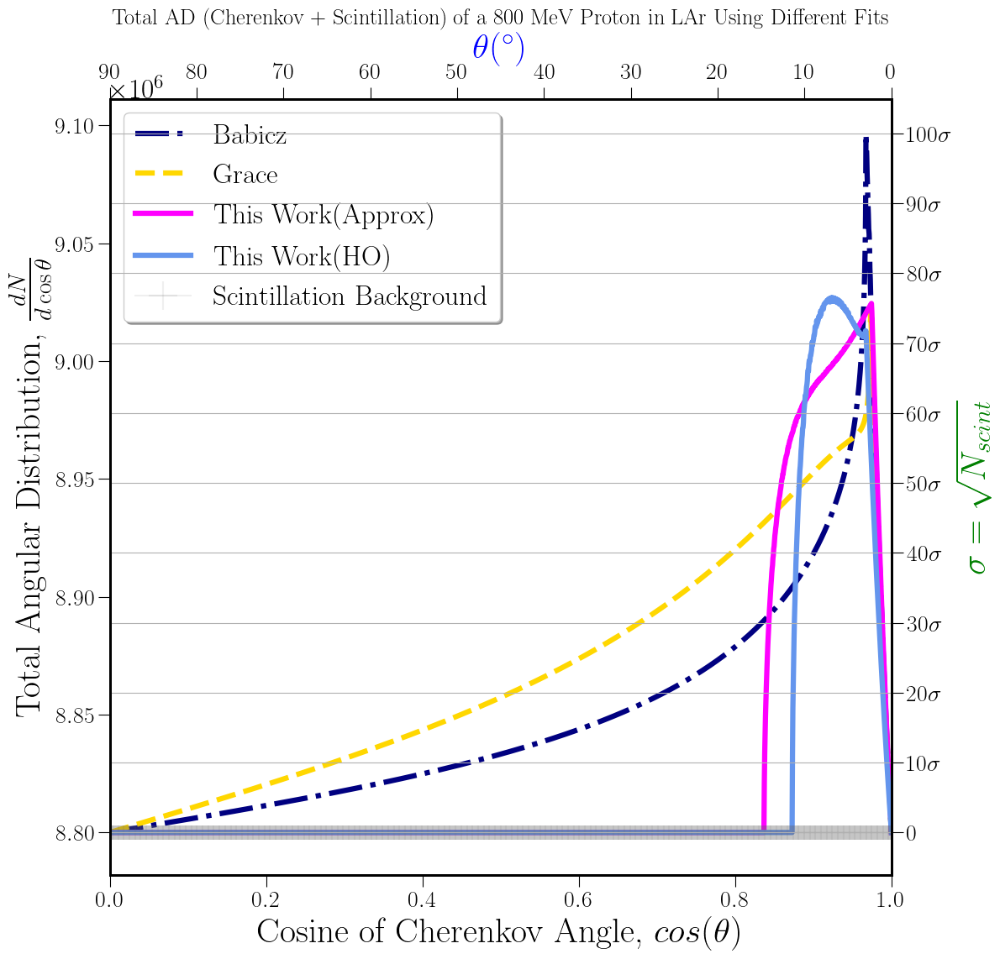

ended:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=1, tm_min=51, tm_sec=28, tm_wday=1, tm_yday=332, tm_isdst=0)


In [34]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())


In [35]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([700])
t_arr = np.array([1000])

def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


        
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        # scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 1000 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)

#     colors_all = ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
       
    
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(HO)', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
        
    ax2.grid()
    ax1.set_xlim([plotx1,plotx2])
    ax3.set_xlim(90,0) #full theta range
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)

#     plt.savefig('Angular_dist_protons.png',dpi=200)
#     plt.ylim(4e6,6e6)
#     plt.ylim(5.4e6,5.6e6)

    t=1000 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    num_ticks = 351 # How many sigmas to plot
       
    # 25*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 25)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(25, num_ticks-1, 25)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

    
    # plt.savefig('signal_over_background_50MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_700MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_1000MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200

    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=1, tm_min=51, tm_sec=28, tm_wday=1, tm_yday=332, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\450669406.py:162: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\450669406.py:201: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 1000 Mev Proton in LAr from HO Model fit: 62030.343
Total Cerenkov photons emitted by a 1000 Mev Proton in LAr using Apprx (PVS) fit: 76163.712


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\450669406.py:266: RuntimeWarning: divide by zero encountered in scalar divide
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\450669406.py:266: RuntimeWarning: invalid value encountered in scalar multiply
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd

Total Cerenkov photons emitted by a 1000 Mev Proton in LAr from Grace fit: 131511.873
Total Cerenkov photons emitted by a 1000 Mev Proton in LAr using Babicz fit: 102751.991
11000000.0 11000000.0


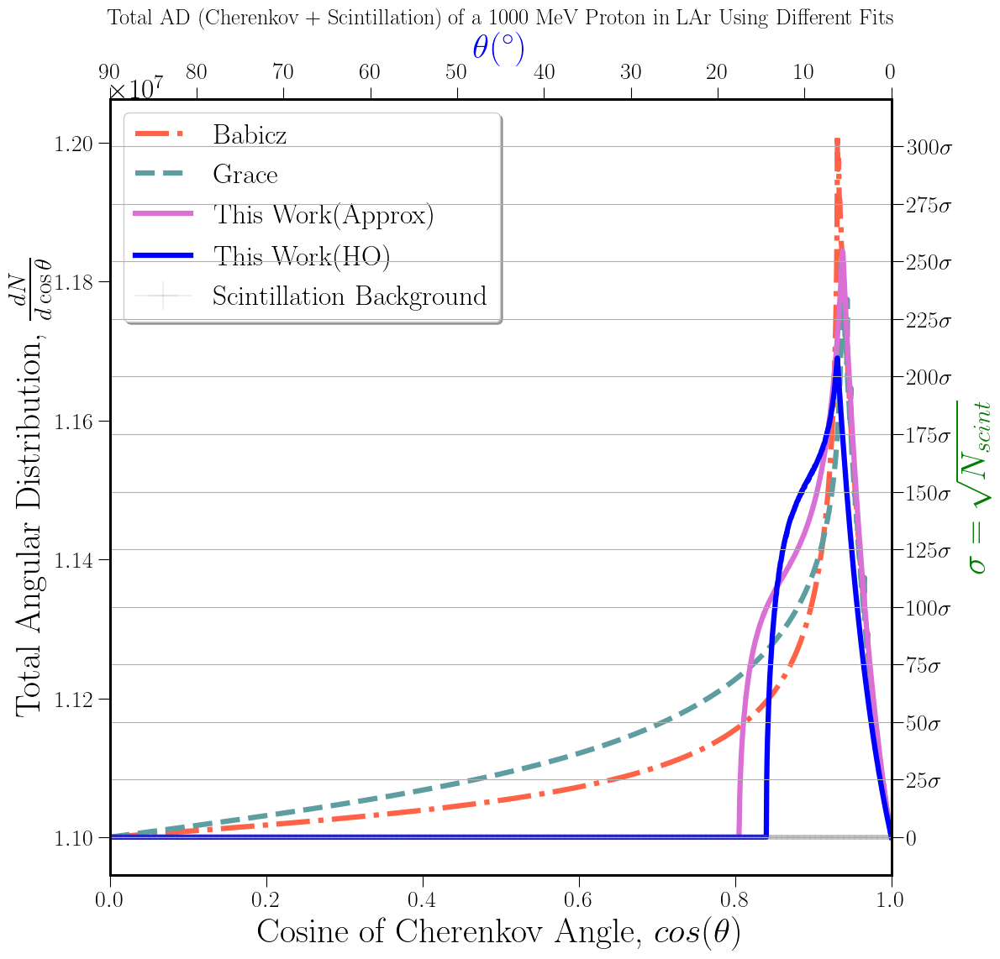

ended:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=5, tm_min=38, tm_sec=56, tm_wday=1, tm_yday=332, tm_isdst=0)


In [36]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())


In [37]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([700])
t_arr = np.array([1200])

def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*


        
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        # scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 1200 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)

#     colors_all = ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['red','cyan','deeppink','orange','dimgray'] #600 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    # colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
    colors_all = ['peru','darkturquoise','darkorchid','dodgerblue','dimgrey']  #1200 MeV   
    
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(HO)', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
        
    ax2.grid()
    ax1.set_xlim([plotx1,plotx2])
    ax3.set_xlim(90,0) #full theta range
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)

#     plt.savefig('Angular_dist_protons.png',dpi=200)
#     plt.ylim(4e6,6e6)
#     plt.ylim(5.4e6,5.6e6)

    t=1200 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    num_ticks = 801 # How many sigmas to plot
    
#     #1 \sigma increment
#     sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
#     sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
#     ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
#     ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    
    # 5*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 100)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(100, num_ticks-1, 100)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

    
    # plt.savefig('signal_over_background_50MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_700MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    plt.savefig('signal_over_background_1200MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200

    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=5, tm_min=38, tm_sec=57, tm_wday=1, tm_yday=332, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2370799175.py:162: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2370799175.py:201: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 1200 Mev Proton in LAr from HO Model fit: 116268.126
Total Cerenkov photons emitted by a 1200 Mev Proton in LAr using Apprx (PVS) fit: 143554.795


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2370799175.py:266: RuntimeWarning: divide by zero encountered in scalar divide
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\2370799175.py:266: RuntimeWarning: invalid value encountered in scalar multiply
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * la

Total Cerenkov photons emitted by a 1200 Mev Proton in LAr from Grace fit: 213969.943
Total Cerenkov photons emitted by a 1200 Mev Proton in LAr using Babicz fit: 176203.342
13200000.000000002 13200000.000000002


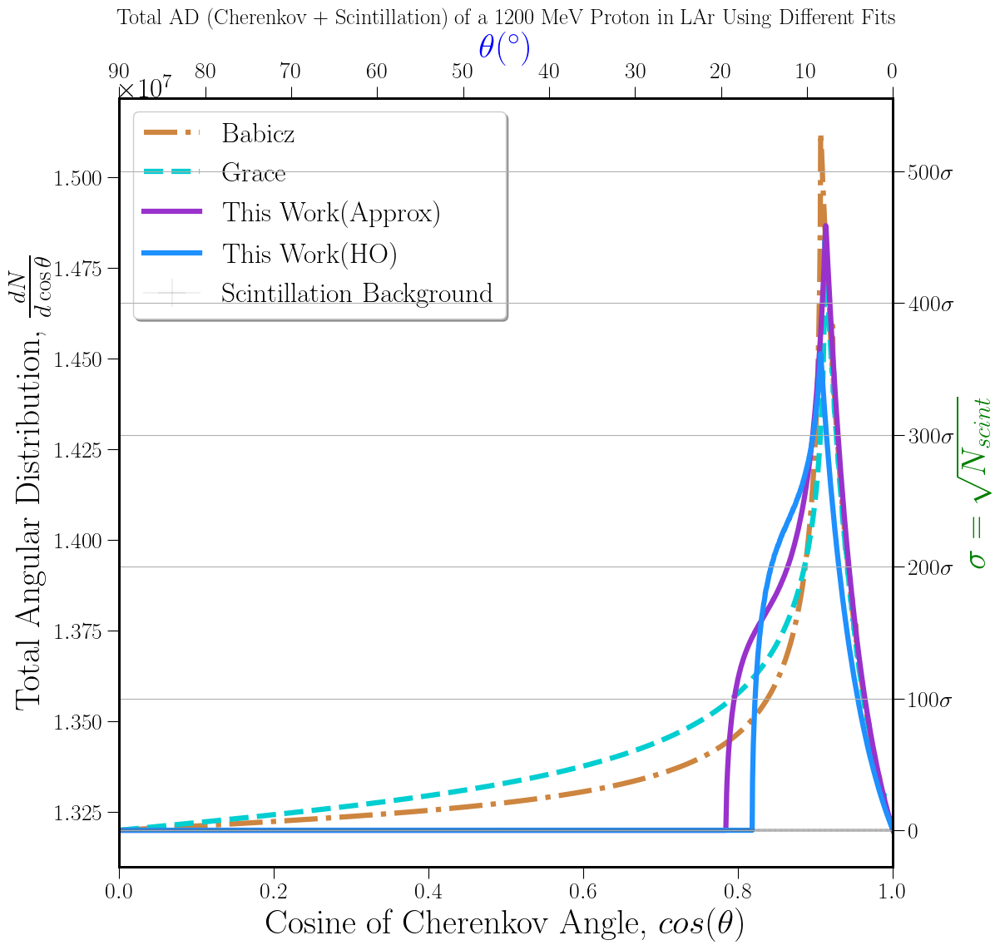

ended:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=10, tm_min=59, tm_sec=43, tm_wday=1, tm_yday=332, tm_isdst=0)


In [38]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())


In [43]:
# Angular Distribution of Cerenkov Radiation: All Fits + Scintillation 1500 MeV

alpha = 1/137 #Fine-structure (EM coupling) constant 

# lamd = np.linspace(0,700,2000)   #wavelength of light 
# lamd_peak = 115.11 #where n is max 

#Babics: 
    
#T = 90 K
a_0b = 0.334 
a_uvb = 0.100
a_irb = 0.008
lamd_uv = 106.6 #lambda_UV = 106.6 nm
lamd_ir = 908.3 #lambda_IR = 908.3 nm 

#Grace, Nikkel: 
    
#T = 90 K
a_0g = 1.26 
a_uvg = 0.23
a_irg = 0.0023

#Our (PVS) Fit: 
    
alpha = 1/137 #Fine-structure (EM coupling) constant 
a_0 = 1.18416
a_pvs = 0.000325985
gamma = 0.000693652
n_max = 1.4191220261503081

#HO/Jackson fit parameters
a_0j = 1.10232
a_j = 0.0000105811
gamma_j = 0.0025239

lamd_peakr = 124.68 #nm
n_peakr = 1.3605 #res model peak


theta = np.linspace(0, np.pi/2, 2000)
x_all = np.linspace(0, 1, 2000)
x = np.cos(theta)
# z = np.cos(theta)


lamd = np.linspace(90,700,2000)

n_asymtoter = a_0j + a_j * lamd_uv**2  #When lamd-> inf
n_uvr = a_0j #when lamd -> lamd_UV

print("n_uv = {}, n_peak = {}, n_asymtote = {}".format(n_uvr, n_peakr, n_asymtoter))

n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
# funclamd = n_jacksonr - y
# idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

#     print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamd[idx[0]], lamd[idx[1]]))

def n2_j(lamd):
    return (a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))))**2

    # d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
    # d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point
    # print("d_norm = {}, d_anom = {}".format(d_norm, d_anom))


lamdminr = []
lamdmaxr = []

# t_arr = np.array([383.96156,400,500,600,650,700,750,800]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([500]) #,900,1000]]) #initial  K.E of the proton in MeV 600,700,800,900,1000
# t_arr = np.array([700])
t_arr = np.array([1500])

def find_angular_dist(t,x,dx,plotx1,plotx2):
    
    #Scintillation 
    cerenkovangtsum = []
#     cerenkovangtsumg = []
#     cerenkovangtsumb = []
#     cerenkovangtsump = []
    
    cerenkov_all = [[] for j in t]
    
    cerenkov_allg = [[] for j in t]
    cerenkov_allb = [[] for j in t]
    cerenkov_allp = [[] for j in t]

    cerenkov_allhon = [[] for j in t]
    cerenkov_allhoa = [[] for j in t]
    cerenkov_allhot = [[] for j in t]

    scint_all = [[] for j in t]
    
#     print(np.shape(cerenkov_all))
    
    
    for j in range(len(t)): 
        
#         i+=1 #index

        cerenkovanglist = []
        cerenkovangsum = [0 for z in x_all]
        cerenkovangsumg = [0 for z in x_all]
        cerenkovangsumb = [0 for z in x_all]
        cerenkovangsump = [0 for z in x_all]
        
        cerenkovangsumhon = [0 for z in x_all]
        cerenkovangsumhoa = [0 for z in x_all]
        cerenkovangsumhot = [0 for z in x_all]
   
        mybetalist = make_betalist(t[j],x,dx) ##HO betalist
        filtered_lst_res = [y for y in mybetalist if y > 0.735294]
        # print(filtered_lst_res)
        
        # mybetalist = make_betalist(t[j],x,dx) #PVS betalist
        filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        # print(filtered_betalist)

        scintp = 40000*t[j]*0.275 #27.5% is the fast component of Scintillation & 40k scint photons/MeV lost 
        scint = np.linspace(scintp, scintp, 2000)

    
        for i in filtered_lst_res:  #[0:20]

            cos_ang_min = 1/(i * n_peakr)
            cos_ang_maxn = min(1/(i * n_500), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))
            cos_ang_maxa = min(1/(i * n_uvr), 1)  #= 1/(b * (a_0j + a_j * lamd_uv**2))

            # print("beta= {}, cos_ang_min= {}, cos_ang_maxN= {}, cos_ang_maxA= {}".format(i, cos_ang_min, cos_ang_maxn, cos_ang_maxa))

            def func_angn(x):  #Normal AD_
        
                if x >= cos_ang_min and x <= cos_ang_maxn:
            
                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()

                    
                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr
            
                    if 1/(i*x) < n_peakr:   
                        # lmin = lamd[min(idx)]
                        lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]

                        # if 1/(i*x) <= n_500:
                        #     # lmin = max(lamd[min(idx)], 106.67)
                        #     lmax = 500            

                        # lamdminr.append(lmin)
                    lamdmaxr.append(lmax)

                        # print(j, i, lamdminr, lamdmaxr)
                        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmax**2)) * ((1-x**2)/(x**3*d_norm))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchon = [func_angn(z) for z in x_all] 
            # print(x_all, func_angnc)
            # plt.plot(x_all, func_angnc)



            def func_anga(x):  #Anomalous AD

                if x >= cos_ang_min and x <= cos_ang_maxa:

                    y= 1/(i*x)
                    y = np.linspace(y,y,2000)   #wavelength of light 
                    # n_jacksonr = a_0j + (a_j * ((lamd_uv**(-2) - lamd**(-2)) / ((lamd_uv**(-2) - lamd**(-2))**2 + gamma_j**2 * lamd**(-2)))) #HO Model: Resonance
                    funclamd = n_jacksonr - y
                    idx = np.argwhere(np.diff(np.sign(funclamd))).flatten()


                    # if 1/(i*x) > n_peakr:
                    # lmin = lamd_peakr
                    # lmax = lamd_peakr

                    if 1/(i*x) < n_peakr:   
                        lmin = max(lamd[min(idx)], 106.67)
                        # lmax = min(lamd[max(idx)], 500) #lamd[idx[1]]


                    lamdminr.append(lmin)
                        # lamdmaxr.append(lmax)

        # print(j, i, lamdminr, lamdmaxr)
        # print("Numerical Method: Wavelength_min = {} nm, Wavelength_max = {} nm".format(lamdminr, lamdmaxr))

                    d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point

                    return 2*np.pi*1e6 * ((2*alpha)/(i**2*lmin**2)) * ((1-x**2)/(x**3*d_anom))   #dN/dx.dcos(theta)

                else: 
                    return 0 #To avaid getting negative contribution 

            func_angchoa = [func_anga(z) for z in x_all]
            func_angchot = [(func_angn(z) + func_anga(z)) for z in x_all]
            
            cerenkovangsumhoa = np.add(func_angchoa, cerenkovangsumhoa)
            cerenkovangsumhot = np.add(func_angchot, cerenkovangsumhot)
            
        cerenkov_allhon[j].append(cerenkovangsumhon)
        cerenkov_allhoa[j].append(cerenkovangsumhoa)
        cerenkov_allhot[j].append(cerenkovangsumhot)
        scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from HO Model fit: {:.3f}" .format(t[j], (sum(cerenkovangsumhot) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*   
                
        
        # Our Fit (PVS)
        
#         mybetalist = make_betalist(t[j],x,dx)
#         filtered_betalist = [y for y in mybetalist if y > 0.7046534357] 
        
        for b in filtered_betalist: 

            cos_ang_min = 1/(b*n_max)
#             cos_ang_max = min(((1+ (gamma**2 * lamd_uv**2))/ (a_0 * (1+ (gamma**2 * lamd_uv**2)) + (a_pvs*lamd_uv))) , 1)
            cos_ang_max = min(1/(b * (a_0 + (a_pvs * (lamd_uv**-1/(lamd_uv**-2 + gamma**2))))) , 1)


            def func_angtp(x):
                if x >= cos_ang_min and x <= cos_ang_max:
                    return (2*np.pi*1e6) * (((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) + ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))) + ((alpha/a_pvs) * ((((b*a_0**2) - (1/b)) * np.abs((gamma**2  + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)**2/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((2*a_0*a_pvs*b) * (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1))) * np.abs((gamma**2 + (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2))) + ((b*a_pvs**2*(((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)/np.abs(gamma**2 - (((-b*a_pvs*x) - ((b**2*a_pvs**2*x**2) - (4 * ((b*a_0*x) - 1) * ((b*a_0*gamma**2*x) - gamma**2)))**(1/2))/(2*((b*a_0*x) - 1)))**2)))))  #dN/dx.dcos(theta)
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtp(z) for z in x_all]       
            
            cerenkovangsump = np.add(func_angtc, cerenkovangsump) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allp[j].append(cerenkovangsump)
        # scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Apprx (PVS) fit: {:.3f}" .format(t[j], (sum(cerenkovangsump) * (dx/0.1))/2000))  #, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #GRACE AD: 
        for b in mybetalist: 

            cos_ang_ming = 0
            cos_ang_maxg = min(1/(b*np.sqrt(a_0g + a_uvg)), 1)
#             print(cos_ang_maxg)

            
            def func_angtg(x):
                if x >= cos_ang_ming and x <= cos_ang_maxg:
                    return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))                                      
                else: 
                    return 0 #To avaid getting negative contribution 

            func_angtc = [func_angtg(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumg = np.add(func_angtc, cerenkovangsumg) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allg[j].append(cerenkovangsumg)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr from Grace fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumg) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

        
        
        #BABICZ AD:        
        for b in mybetalist: 

            cos_ang_minb = 0
            cos_ang_maxb = min((np.sqrt((3 - a_0b - a_uvb)/(3 + 2*a_0b + 2*a_uvb)))/b , 1)

#             print(cos_ang_maxg)

            
            def func_angtb(x):
                if x >= cos_ang_minb and x <= cos_ang_maxb:
                    return (2*np.pi*1e6) * (alpha/(9 * a_uvb * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)
                else: 
                    return 0 #To avaid getting negative contribution 
                
#             def func_ang_babics(x):
            
#                 lamd_thetab = (np.sqrt(((a_0b - 3) + (b**2 * x**2 * (3 + 2*a_0b))) / ((b**2 * x**2 * (3 + 2*a_0b + 2*a_uvb)) - (3 - a_0b - a_uvb))) * lamd_uv)

#                 func_ang_babics = (2*np.pi*1e6) * (alpha/(9 * a_uvb * lamd_thetab**3 * lamd_uv**2)) * (b * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2)) / (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2)) - (1/b)) * (((3 + 2*a_0b + 2*a_uvb) * lamd_thetab**2) - ((2*a_0b + 3) * lamd_uv**2))**(1/2) * (((3- a_0b - a_uvb) * lamd_thetab**2) + ((a_0b - 3) * lamd_uv**2))**(3/2)

            func_angtc = [func_angtb(z) for z in x_all]   
#             print(func_angtc)

            cerenkovangsumb = np.add(func_angtc, cerenkovangsumb) 
            
#         print(np.shape(cerenkovangsum))
        
        cerenkov_allb[j].append(cerenkovangsumb)
#         scint_all[j].append(scint)
        
        print("Total Cerenkov photons emitted by a {} Mev Proton in LAr using Babicz fit: {:.3f}" .format(t[j], (np.nansum(cerenkovangsumb) * (dx/0.1))/2000) )#, sum(cerenkovangsum)/5000 (1e6 * dx/0.1)*

       
        
    #Make plot:
    
    fig = plt.figure(figsize=(12,12))
    ax1 = fig.add_subplot(111)
    #     ax2 = fig.add_subplot(111)
    ax2 = ax1.twinx()
    ax3 = ax1.twiny()
    
    ax1.set_title(r"Total AD (Cherenkov + Scintillation) of a 1500 MeV Proton in LAr Using Different Fits", fontsize= 19)
    ax1.set_xlabel(r"Cosine of Cherenkov Angle, $cos(\theta)$ ",fontsize=30)
    ax1.set_ylabel(r"Total Angular Distribution, $\frac{dN}{d\cos\theta}$",fontsize=30)
    ax2.set_ylabel(r'$\sigma= \sqrt{N_{scint}}$',fontsize=30, color='g')
    ax3.set_xlabel(r'$\theta (^{\circ})$',fontsize=30, color='b')
    
    #     ax2.grid()
    ax1.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax2.tick_params(axis='both',which='major',labelsize=20,length=10)
    ax3.tick_params(axis='both',which='major',labelsize=20,length=10)
    
#     ax.tick_params(axis='both',which='major',labelsize=16,length=10)

#     colors_all = ['tomato','cadetblue','brown','purple','red','orange','yellow','green','cyan','royalblue','navy','blueviolet','grey'] 
    # colors_all = ['lime','crimson','hotpink','green','dimgray'] #500 MeV
    # colors_all = ['red','cyan','deeppink','orange','dimgray'] #600 MeV
    # colors_all = ['green','olive','blueviolet', 'teal', 'dimgrey'] #700 MeV
    # colors_all = ['navy','gold','magenta','cornflowerblue','dimgrey']  #800 MeV
    # colors_all = ['tomato','cadetblue','orchid','b','dimgrey']  #1000 MeV 'brown','purple'
    # colors_all = ['peru','darkturquoise','darkorchid','dodgerblue','dimgrey']  #1200 MeV   
    colors_all = ['aqua','crimson','fuchsia','mediumslateblue','dimgrey']  #1500 MeV   
    
       
#     colors_all = ['cadetblue','brown','purple','red','orange', 'green','cyan','royalblue', 'navy','blueviolet']
    
    for k in range(len(cerenkov_all)):
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allb[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashdot', label='Babicz', c=colors_all[k]) #linewidth= 4,label='t = {} MeV'.format(float(t[k])) #Babicz
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allg[k][0])+scint_all[k][0], linewidth= 4.5, ls='dashed', label='Grace', c=colors_all[k+1]) #linewidth= 4, #Grace
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allp[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(Approx)', c=colors_all[k+2]) #PVS
        ax1.plot(x_all, ((dx/0.1)*cerenkov_allhot[k][0])+scint_all[k][0], linewidth= 4.5, label='This Work(HO)', c=colors_all[k+3]) #HO
#         plt.plot(x_all, np.sqrt(scint_all[k][0]), c=colors_all[k])  #label='t = {} MeV'.format(float(t[k]))
        ax1.errorbar(x_all, scint_all[k][0], xerr=0, yerr=np.sqrt(scint_all[k][0]), c=colors_all[k-1], alpha=0.1, label='Scintillation Background')   #,label='t = {} MeV'.format(float(t[k])) #Scintillation
#         plt.plot(x_all, scint_all[k][0],c=colors_all[k],ls='--')
        print(np.min(scint_all[k][0]), np.max(scint_all[k][0]))
    
#         plt.plot(x_all,np.sqrt(scint_all[k][0]))
        
        
    ax2.grid()
    ax1.set_xlim([plotx1,plotx2])
    ax3.set_xlim(90,0) #full theta range
    ax1.legend(loc='best',fontsize=24,framealpha=None,shadow=True)
#     plt.savefig('Angular_dist_protons.png',dpi=200)
#     plt.ylim(4e6,6e6)
#     plt.ylim(5.4e6,5.6e6)

    t=1500 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    # Plot sigma ticks on the right twin axis
    scint_value = 40000*t*0.275 ###NEED AUTOMATION BY REPLACING AN ARRAY: T_ARR 
    sigma = np.sqrt(scint_value)  # Value of sigma
    num_ticks = 1001 # How many sigmas to plot
    
#     #1 \sigma increment
#     sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
#     sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(1, num_ticks)]))  # Create matching list of labels from the list of numbers of sigmas
#     ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
#     ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!
    
    # 5*\sigma increment
    sigma_tick_locations = np.array([scint_value + num*sigma for num in np.arange(0, num_ticks-1, 100)]) #np.arange(scint_value, scint_value + (num_ticks)*sigma-0.1, sigma)  # Create a list of the tick positions
    sigma_tick_labels = np.append(np.array(['0']), np.array([r'${}\sigma$'.format(num) for num in np.arange(100, num_ticks-1, 100)]))  # Create matching list of labels from the list of numbers of sigmas
    ax2.set_yticks(ticks=sigma_tick_locations, labels=sigma_tick_labels)  # Place the ticks with the given labels
    ax2.set_ylim(ax1.get_ylim())  # Force the right axis ticks to align with the left axis -- IMPORTANT!!!

    
    # plt.savefig('signal_over_background_50MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    # plt.savefig('signal_over_background_700MeV_allfitsnew.jpg', bbox_inches="tight") #,dpi=200
    plt.savefig('signal_over_background_1500MeV_allfitsnew_p01.jpg', bbox_inches="tight") #,dpi=200

    plt.show()
    
#     plt.xlim(0.8,1)
# plt.plot(theta, cerenkovangsum/(2*pi))


n_uv = 1.10232, n_peak = 1.3605, n_asymtote = 1.222558964716


started:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=11, tm_min=43, tm_sec=11, tm_wday=1, tm_yday=332, tm_isdst=0)


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\462071512.py:162: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_norm = np.abs(derivative(n2_j, lmax, dx=1e-6)) #value of normal derivative at a given point
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\462071512.py:201: DeprecationWarning: scipy.misc.derivative is deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. You may consider using findiff: https://github.com/maroba/findiff or numdifftools: https://github.com/pbrod/numdifftools
  d_anom = np.abs(derivative(n2_j, lmin, dx=1e-6)) #value of anomalous derivative at a given point


Total Cerenkov photons emitted by a 1500 Mev Proton in LAr from HO Model fit: 216045.326
Total Cerenkov photons emitted by a 1500 Mev Proton in LAr using Apprx (PVS) fit: 268024.808


C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\462071512.py:263: RuntimeWarning: divide by zero encountered in scalar divide
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)) - (1/b)) * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2)**(3/2) *  (np.sqrt(a_0g * ((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2-lamd_uv**2) + a_uvg * (np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**2)/((np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd_uv)**3*lamd_uv**2))
C:\Users\hrrah\AppData\Local\Temp\ipykernel_4836\462071512.py:263: RuntimeWarning: invalid value encountered in scalar multiply
  return 2*np.pi*1e6*(alpha/a_uvg) * ((b*a_0g) + ((b*a_uvg*(np.sqrt((a_0g*b**2*x**2 - 1)/((a_0g + a_uvg)*b**2*x**2 - 1)) * lamd

Total Cerenkov photons emitted by a 1500 Mev Proton in LAr from Grace fit: 360984.194
Total Cerenkov photons emitted by a 1500 Mev Proton in LAr using Babicz fit: 309557.542
16500000.000000002 16500000.000000002


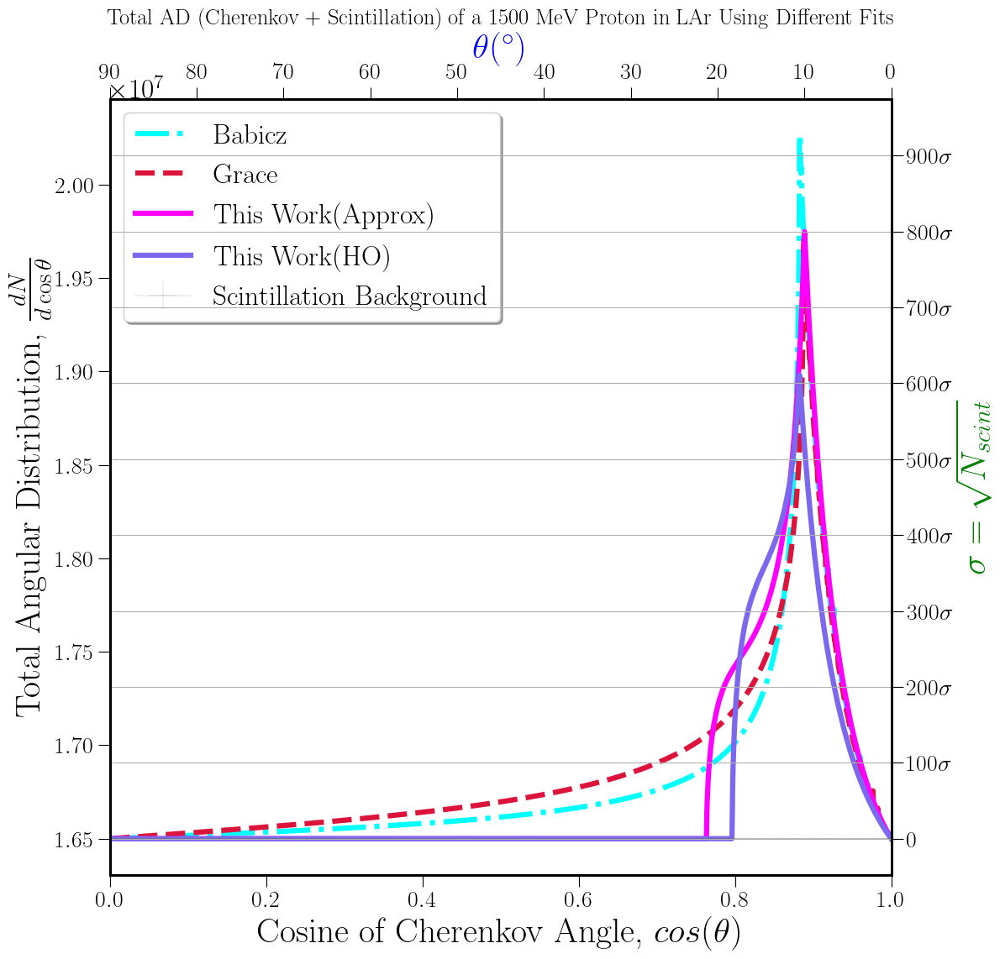

ended:  time.struct_time(tm_year=2023, tm_mon=11, tm_mday=28, tm_hour=18, tm_min=4, tm_sec=21, tm_wday=1, tm_yday=332, tm_isdst=0)


In [44]:

################### RUN THE FUNCTION: All Fit (Latest)

print('started: ', time.gmtime())

find_angular_dist(t_arr,x=0,dx=0.01,plotx1=0,plotx2=1)

print('ended: ', time.gmtime())
